##### Name: Saifuddin Telia
##### G#: G01229939

# Importing the libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Importing the dataset

In [2]:
dataframe = pd.read_excel(r'./OnlineRetail.xlsx')

In [3]:
print(dataframe)
print(dataframe.dtypes)

       InvoiceNo StockCode                          Description  Quantity  \
0         536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365     71053                  WHITE METAL LANTERN         6   
2         536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3         536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...       ...                                  ...       ...   
541904    581587     22613          PACK OF 20 SPACEBOY NAPKINS        12   
541905    581587     22899         CHILDREN'S APRON DOLLY GIRL          6   
541906    581587     23254        CHILDRENS CUTLERY DOLLY GIRL          4   
541907    581587     23255      CHILDRENS CUTLERY CIRCUS PARADE         4   
541908    581587     22138        BAKING SET 9 PIECE RETROSPOT          3   

               InvoiceDate  UnitPrice  CustomerID         Country  
0      

In [5]:
dataframe.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


# Cleaning the Data

In [6]:
dataframe_copy = dataframe.copy(deep=True)

In [8]:
# Removing UnitPrice <= 0

dataframe_copy = dataframe_copy[dataframe_copy.UnitPrice > 0]

In [9]:
# Removing Quantity <= 0

dataframe_copy = dataframe_copy[dataframe_copy.Quantity > 0]

In [10]:
dataframe_copy

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [11]:
# Removing other spam StockCodes

x = ['BANK CHARGES', 'D', 'DOT', 'S', 'POST', 'M', 'C2', 'AMAZONFEE', 'B', 'CRUK', 'm', 'PADS']
for i in x:
    dataframe_copy = dataframe_copy[dataframe_copy.StockCode != i]

In [12]:
dataframe_copy

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [13]:
# Removing giftcard StockCodes

dataframe_copy = dataframe_copy[dataframe_copy.StockCode.str.startswith('gift', na = False) == False]

In [14]:
dataframe_copy

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [39]:
# # Removing commas and extra spaces from description

# i = 0
# for text in dataframe_copy.Description:
#     if text == 'AIRLINE LOUNGE,METAL SIGN':
#         print("Before: " + text)
#     text = text.replace(',', ' ')
#     text = ' '.join(text.split())
#     dataframe_copy.Description[i] = text
#     if text == 'AIRLINE LOUNGE METAL SIGN':
#         print("After: " + dataframe_copy.Description[i])
#     i+=1
#     print(i)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240


<ipython-input-39-0814ae611fd9>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe_copy.Description[i] = text


241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490


2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222
2223
2224
2225
2226
2227
2228
2229
2230
2231
2232
2233
2234
2235
2236
2237
2238
2239
2240
2241
2242
2243
2244
2245
2246
2247


4052
4053
4054
4055
4056
4057
4058
4059
4060
4061
4062
4063
4064
4065
4066
4067
4068
4069
4070
4071
4072
4073
4074
4075
4076
4077
4078
4079
4080
4081
4082
4083
4084
4085
4086
4087
4088
4089
4090
4091
4092
4093
4094
4095
4096
4097
4098
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4157
4158
4159
4160
4161
4162
4163
4164
4165
4166
4167
4168
4169
4170
4171
4172
4173
4174
4175
4176
4177
4178
4179
4180
4181
4182
4183
4184
4185
4186
4187
4188
4189
4190
4191
4192
4193
4194
4195
4196
4197
4198
4199
4200
4201
4202
4203
4204
4205
4206
4207
4208
4209
4210
4211
4212
4213
4214
4215
4216
4217
4218
4219
4220
4221
4222
4223
4224
4225
4226
4227
4228
4229
4230
4231
4232
4233
4234
4235
4236
4237
4238
4239
4240
4241
4242
4243
4244
4245
4246
4247
4248
4249
4250
4251


6167
6168
6169
6170
6171
6172
6173
6174
6175
6176
6177
6178
6179
6180
6181
6182
6183
6184
6185
6186
6187
6188
6189
6190
6191
6192
6193
6194
6195
6196
6197
6198
6199
6200
6201
6202
6203
6204
6205
6206
6207
6208
6209
6210
6211
6212
6213
6214
6215
6216
6217
6218
6219
6220
6221
6222
6223
6224
6225
6226
6227
6228
6229
6230
6231
6232
6233
6234
6235
6236
6237
6238
6239
6240
6241
6242
6243
6244
6245
6246
6247
6248
6249
6250
6251
6252
6253
6254
6255
6256
6257
6258
6259
6260
6261
6262
6263
6264
6265
6266
6267
6268
6269
6270
6271
6272
6273
6274
6275
6276
6277
6278
6279
6280
6281
6282
6283
6284
6285
6286
6287
6288
6289
6290
6291
6292
6293
6294
6295
6296
6297
6298
6299
6300
6301
6302
6303
6304
6305
6306
6307
6308
6309
6310
6311
6312
6313
6314
6315
6316
6317
6318
6319
6320
6321
6322
6323
6324
6325
6326
6327
6328
6329
6330
6331
6332
6333
6334
6335
6336
6337
6338
6339
6340
6341
6342
6343
6344
6345
6346
6347
6348
6349
6350
6351
6352
6353
6354
6355
6356
6357
6358
6359
6360
6361
6362
6363
6364
6365
6366


7939
7940
7941
7942
7943
7944
7945
7946
7947
7948
7949
7950
7951
7952
7953
7954
7955
7956
7957
7958
7959
7960
7961
7962
7963
7964
7965
7966
7967
7968
7969
7970
7971
7972
7973
7974
7975
7976
7977
7978
7979
7980
7981
7982
7983
7984
7985
7986
7987
7988
7989
7990
7991
7992
7993
7994
7995
7996
7997
7998
7999
8000
8001
8002
8003
8004
8005
8006
8007
8008
8009
8010
8011
8012
8013
8014
8015
8016
8017
8018
8019
8020
8021
8022
8023
8024
8025
8026
8027
8028
8029
8030
8031
8032
8033
8034
8035
8036
8037
8038
8039
8040
8041
8042
8043
8044
8045
8046
8047
8048
8049
8050
8051
8052
8053
8054
8055
8056
8057
8058
8059
8060
8061
8062
8063
8064
8065
8066
8067
8068
8069
8070
8071
8072
8073
8074
8075
8076
8077
8078
8079
8080
8081
8082
8083
8084
8085
8086
8087
8088
8089
8090
8091
8092
8093
8094
8095
8096
8097
8098
8099
8100
8101
8102
8103
8104
8105
8106
8107
8108
8109
8110
8111
8112
8113
8114
8115
8116
8117
8118
8119
8120
8121
8122
8123
8124
8125
8126
8127
8128
8129
8130
8131
8132
8133
8134
8135
8136
8137
8138


10359
10360
10361
10362
10363
10364
10365
10366
10367
10368
10369
10370
10371
10372
10373
10374
10375
10376
10377
10378
10379
10380
10381
10382
10383
10384
10385
10386
10387
10388
10389
10390
10391
10392
10393
10394
10395
10396
10397
10398
10399
10400
10401
10402
10403
10404
10405
10406
10407
10408
10409
10410
10411
10412
10413
10414
10415
10416
10417
10418
10419
10420
10421
10422
10423
10424
10425
10426
10427
10428
10429
10430
10431
10432
10433
10434
10435
10436
10437
10438
10439
10440
10441
10442
10443
10444
10445
10446
10447
10448
10449
10450
10451
10452
10453
10454
10455
10456
10457
10458
10459
10460
10461
10462
10463
10464
10465
10466
10467
10468
10469
10470
10471
10472
10473
10474
10475
10476
10477
10478
10479
10480
10481
10482
10483
10484
10485
10486
10487
10488
10489
10490
10491
10492
10493
10494
10495
10496
10497
10498
10499
10500
10501
10502
10503
10504
10505
10506
10507
10508
10509
10510
10511
10512
10513
10514
10515
10516
10517
10518
10519
10520
10521
10522
Before: AIRLINE 

12073
12074
12075
12076
12077
12078
12079
12080
12081
12082
12083
12084
12085
12086
12087
12088
12089
12090
12091
12092
12093
12094
12095
12096
12097
12098
12099
12100
12101
12102
12103
12104
12105
12106
12107
12108
12109
12110
12111
12112
12113
12114
12115
12116
12117
12118
12119
12120
12121
12122
12123
12124
12125
12126
12127
12128
12129
12130
12131
12132
12133
12134
12135
12136
12137
12138
12139
12140
12141
12142
12143
12144
12145
12146
12147
12148
12149
12150
12151
12152
12153
12154
12155
12156
12157
12158
12159
12160
12161
12162
12163
12164
12165
12166
12167
12168
12169
12170
12171
12172
12173
12174
12175
12176
12177
12178
12179
12180
12181
12182
12183
12184
12185
12186
12187
12188
12189
12190
12191
12192
12193
12194
12195
12196
12197
12198
12199
12200
12201
12202
12203
12204
12205
12206
12207
12208
12209
12210
12211
12212
12213
12214
12215
12216
12217
12218
12219
12220
12221
12222
12223
12224
12225
12226
12227
12228
12229
12230
12231
12232
12233
12234
12235
12236
12237
12238
1223

13556
13557
13558
13559
13560
13561
13562
13563
13564
13565
13566
13567
13568
13569
13570
13571
13572
13573
13574
13575
13576
13577
13578
13579
13580
13581
13582
13583
13584
13585
13586
13587
13588
13589
13590
13591
13592
13593
13594
13595
13596
13597
13598
13599
13600
13601
13602
13603
13604
13605
13606
13607
13608
13609
13610
13611
13612
13613
13614
13615
13616
13617
13618
13619
13620
13621
13622
13623
13624
13625
13626
13627
13628
13629
13630
13631
13632
13633
13634
13635
13636
13637
13638
13639
13640
13641
13642
13643
13644
13645
13646
13647
13648
13649
13650
13651
13652
13653
13654
13655
13656
13657
13658
13659
13660
13661
13662
13663
13664
13665
13666
13667
13668
13669
13670
13671
13672
13673
13674
13675
13676
13677
13678
13679
13680
13681
13682
13683
13684
13685
13686
13687
13688
13689
13690
13691
13692
13693
13694
13695
13696
13697
13698
13699
13700
13701
13702
13703
13704
13705
13706
13707
13708
13709
13710
13711
13712
13713
13714
13715
13716
13717
13718
13719
13720
13721
1372

15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
15999
16000
16001
16002
16003
16004
16005
16006
16007
16008
16009
16010
16011
16012
16013
16014
16015
16016
16017
16018
16019
16020
16021
16022
16023
16024
16025
16026
16027
16028
16029
16030
16031
16032
16033
16034
16035
16036
16037
16038
16039
16040
16041
16042
16043
16044
16045
16046
16047
16048
16049
16050
16051
16052
16053
16054
16055
16056
16057
16058
16059
16060
16061
16062
16063
16064
16065
16066
16067
16068
16069
16070
16071
16072
16073
16074
16075
16076
16077
16078
16079
16080
16081
16082
16083
16084
16085
16086
16087
16088
16089
16090
16091
16092
16093
16094
16095
16096
16097
16098
16099
16100
16101
16102
16103
16104
16105
16106
16107
16108
16109
16110
16111
16112
16113
16114
16115
16116
16117
16118
16119
16120
16121
16122
16123
16124
16125
16126
16127
16128
16129
16130
16131
16132
16133
16134
16135
16136
16137
16138
16139
16140
16141
16142
16143
16144
16145
16146
16147
16148
16149
16150
16151
1615

17740
17741
17742
17743
17744
17745
17746
17747
17748
17749
17750
17751
17752
17753
17754
17755
17756
17757
17758
17759
17760
17761
17762
17763
17764
17765
17766
17767
17768
17769
17770
17771
17772
17773
17774
17775
17776
17777
17778
17779
17780
17781
17782
17783
17784
17785
17786
17787
17788
17789
17790
17791
17792
17793
17794
17795
17796
17797
17798
17799
17800
17801
17802
17803
17804
17805
17806
17807
17808
17809
17810
17811
17812
17813
17814
17815
17816
17817
17818
17819
17820
17821
17822
17823
17824
17825
17826
17827
17828
17829
17830
17831
17832
17833
17834
17835
17836
17837
17838
17839
17840
17841
17842
17843
17844
17845
17846
17847
17848
17849
17850
17851
17852
17853
17854
17855
17856
17857
17858
17859
17860
17861
17862
17863
17864
17865
17866
17867
17868
17869
17870
17871
17872
17873
17874
17875
17876
17877
17878
17879
17880
17881
17882
17883
17884
17885
17886
17887
17888
17889
17890
17891
17892
17893
17894
17895
17896
17897
17898
17899
17900
17901
17902
17903
17904
17905
1790

19352
19353
19354
19355
19356
19357
19358
19359
19360
19361
19362
19363
19364
19365
19366
19367
19368
19369
19370
19371
19372
19373
19374
19375
19376
19377
19378
19379
19380
19381
19382
19383
19384
19385
19386
19387
19388
19389
19390
19391
19392
19393
19394
19395
19396
19397
19398
19399
19400
19401
19402
19403
19404
19405
19406
19407
19408
19409
19410
19411
19412
19413
19414
19415
19416
19417
19418
19419
19420
19421
19422
19423
19424
19425
19426
19427
19428
19429
19430
19431
19432
19433
19434
19435
19436
19437
19438
19439
19440
19441
19442
19443
19444
19445
19446
19447
19448
19449
19450
19451
19452
19453
19454
19455
19456
19457
19458
19459
19460
19461
19462
19463
19464
19465
19466
19467
19468
19469
19470
19471
19472
19473
19474
19475
19476
19477
19478
19479
19480
19481
19482
19483
19484
19485
19486
19487
19488
19489
19490
19491
19492
19493
19494
19495
19496
19497
19498
19499
19500
19501
19502
19503
19504
19505
19506
19507
19508
19509
19510
19511
19512
19513
19514
19515
19516
19517
1951

21351
21352
21353
21354
21355
21356
21357
21358
21359
21360
21361
21362
21363
21364
21365
21366
21367
21368
21369
21370
21371
21372
21373
21374
21375
21376
21377
21378
21379
21380
21381
21382
21383
21384
21385
21386
21387
21388
21389
21390
21391
21392
21393
21394
21395
21396
21397
21398
21399
21400
21401
21402
21403
21404
21405
21406
21407
21408
21409
21410
21411
21412
21413
21414
21415
21416
21417
21418
21419
21420
21421
21422
21423
21424
21425
21426
21427
21428
21429
21430
21431
21432
21433
21434
21435
21436
21437
21438
21439
21440
21441
21442
21443
21444
21445
21446
21447
21448
21449
21450
21451
21452
21453
21454
21455
21456
21457
21458
21459
21460
21461
21462
21463
21464
21465
21466
21467
21468
21469
21470
21471
21472
21473
21474
21475
21476
21477
21478
21479
21480
21481
21482
21483
21484
21485
21486
21487
21488
21489
21490
21491
21492
21493
21494
21495
21496
21497
21498
21499
21500
21501
21502
21503
21504
21505
21506
21507
21508
21509
21510
21511
21512
21513
21514
21515
21516
2151

23003
23004
23005
23006
23007
23008
23009
23010
23011
23012
23013
23014
23015
23016
23017
23018
23019
23020
23021
23022
23023
23024
23025
23026
23027
23028
23029
23030
23031
23032
23033
23034
23035
23036
23037
23038
23039
23040
23041
23042
23043
23044
23045
23046
23047
23048
23049
23050
23051
23052
23053
23054
23055
23056
23057
23058
23059
23060
23061
23062
23063
23064
23065
23066
23067
23068
23069
23070
23071
23072
23073
23074
23075
23076
23077
23078
23079
23080
23081
23082
23083
23084
23085
23086
23087
23088
23089
23090
23091
23092
23093
23094
23095
23096
23097
23098
23099
23100
23101
23102
23103
23104
23105
23106
23107
23108
23109
23110
23111
23112
23113
23114
23115
23116
23117
23118
23119
23120
23121
23122
23123
23124
23125
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
2316

24568
24569
24570
24571
24572
24573
24574
24575
24576
24577
24578
24579
24580
24581
24582
24583
24584
24585
24586
24587
24588
24589
24590
24591
24592
24593
24594
24595
24596
24597
24598
24599
24600
24601
24602
24603
24604
24605
24606
24607
24608
24609
24610
24611
24612
24613
24614
24615
24616
24617
24618
24619
24620
24621
24622
24623
24624
24625
24626
24627
24628
24629
24630
24631
24632
24633
24634
24635
24636
24637
24638
24639
24640
24641
24642
24643
24644
24645
24646
24647
24648
24649
24650
24651
24652
24653
24654
24655
24656
24657
24658
24659
24660
24661
24662
24663
24664
24665
24666
24667
24668
24669
24670
24671
24672
24673
24674
24675
24676
24677
24678
24679
24680
24681
24682
24683
24684
24685
24686
24687
24688
24689
24690
24691
24692
24693
24694
24695
24696
24697
24698
24699
24700
24701
24702
24703
24704
24705
24706
24707
24708
24709
24710
24711
24712
24713
24714
24715
24716
24717
24718
24719
24720
24721
24722
24723
24724
24725
24726
24727
24728
24729
24730
24731
24732
24733
2473

26982
26983
26984
26985
26986
26987
26988
26989
26990
26991
26992
26993
26994
26995
26996
26997
26998
26999
27000
27001
27002
27003
27004
27005
27006
27007
27008
27009
27010
27011
27012
27013
27014
27015
27016
27017
27018
27019
27020
27021
27022
27023
27024
27025
27026
27027
27028
27029
27030
27031
27032
27033
27034
27035
27036
27037
27038
27039
27040
27041
27042
27043
27044
27045
27046
27047
27048
27049
27050
27051
27052
27053
27054
27055
27056
27057
27058
27059
27060
27061
27062
27063
27064
27065
27066
27067
27068
27069
27070
27071
27072
27073
27074
27075
27076
27077
27078
27079
27080
27081
27082
27083
27084
27085
27086
27087
27088
27089
27090
27091
27092
27093
27094
27095
27096
27097
27098
27099
27100
27101
27102
27103
27104
27105
27106
27107
27108
27109
27110
27111
27112
27113
27114
27115
27116
27117
27118
27119
27120
27121
27122
27123
27124
27125
27126
27127
27128
27129
27130
27131
27132
27133
27134
27135
27136
27137
27138
27139
27140
27141
27142
27143
27144
27145
27146
27147
2714

28562
28563
28564
28565
28566
28567
28568
28569
28570
28571
28572
28573
28574
28575
28576
28577
28578
28579
28580
28581
28582
28583
28584
28585
28586
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
28587
28588
28589
28590
28591
28592
28593
28594
28595
28596
28597
28598
28599
28600
28601
28602
28603
28604
28605
28606
28607
28608
28609
28610
28611
28612
28613
28614
28615
28616
28617
28618
28619
28620
28621
28622
28623
28624
28625
28626
28627
28628
28629
28630
28631
28632
28633
28634
28635
28636
28637
28638
28639
28640
28641
28642
28643
28644
28645
28646
28647
28648
28649
28650
28651
28652
28653
28654
28655
28656
28657
28658
28659
28660
28661
28662
28663
28664
28665
28666
28667
28668
28669
28670
28671
28672
28673
28674
28675
28676
28677
28678
28679
28680
28681
28682
28683
28684
28685
28686
28687
28688
28689
28690
28691
28692
28693
28694
28695
28696
28697
28698
28699
28700
28701
28702
28703
28704
28705
28706
28707
28708
28709
28710
28711
28712
28713
28714
28715
28716
287

29948
29949
29950
29951
29952
29953
29954
29955
29956
29957
29958
29959
29960
29961
29962
29963
29964
29965
29966
29967
29968
29969
29970
29971
29972
29973
29974
29975
29976
29977
29978
29979
29980
29981
29982
29983
29984
29985
29986
29987
29988
29989
29990
29991
29992
29993
29994
29995
29996
29997
29998
29999
30000
30001
30002
30003
30004
30005
30006
30007
30008
30009
30010
30011
30012
30013
30014
30015
30016
30017
30018
30019
30020
30021
30022
30023
30024
30025
30026
30027
30028
30029
30030
30031
30032
30033
30034
30035
30036
30037
30038
30039
30040
30041
30042
30043
30044
30045
30046
30047
30048
30049
30050
30051
30052
30053
30054
30055
30056
30057
30058
30059
30060
30061
30062
30063
30064
30065
30066
30067
30068
30069
30070
30071
30072
30073
30074
30075
30076
30077
30078
30079
30080
30081
30082
30083
30084
30085
30086
30087
30088
30089
30090
30091
30092
30093
30094
30095
30096
30097
30098
30099
30100
30101
30102
30103
30104
30105
30106
30107
30108
30109
30110
30111
30112
30113
3011

31938
31939
31940
31941
31942
31943
31944
31945
31946
31947
31948
31949
31950
31951
31952
31953
31954
31955
31956
31957
31958
31959
31960
31961
31962
31963
31964
31965
31966
31967
31968
31969
31970
31971
31972
31973
31974
31975
31976
31977
31978
31979
31980
31981
31982
31983
31984
31985
31986
31987
31988
31989
31990
31991
31992
31993
31994
31995
31996
31997
31998
31999
32000
32001
32002
32003
32004
32005
32006
32007
32008
32009
32010
32011
32012
32013
32014
32015
32016
32017
32018
32019
32020
32021
32022
32023
32024
32025
32026
32027
32028
32029
32030
32031
32032
32033
32034
32035
32036
32037
32038
32039
32040
32041
32042
32043
32044
32045
32046
32047
32048
32049
32050
32051
32052
32053
32054
32055
32056
32057
32058
32059
32060
32061
32062
32063
32064
32065
32066
32067
32068
32069
32070
32071
32072
32073
32074
32075
32076
32077
32078
32079
32080
32081
32082
32083
32084
32085
32086
32087
32088
32089
32090
32091
32092
32093
32094
32095
32096
32097
32098
32099
32100
32101
32102
32103
3210

33398
33399
33400
33401
33402
33403
33404
33405
33406
33407
33408
33409
33410
33411
33412
33413
33414
33415
33416
33417
33418
33419
33420
33421
33422
33423
33424
33425
33426
33427
33428
33429
33430
33431
33432
33433
33434
33435
33436
33437
33438
33439
33440
33441
33442
33443
33444
33445
33446
33447
33448
33449
33450
33451
33452
33453
33454
33455
33456
33457
33458
33459
33460
33461
33462
33463
33464
33465
33466
33467
33468
33469
33470
33471
33472
33473
33474
33475
33476
33477
33478
33479
33480
33481
33482
33483
33484
33485
33486
33487
33488
33489
33490
33491
33492
33493
33494
33495
33496
33497
33498
33499
33500
33501
33502
33503
33504
33505
33506
33507
33508
33509
33510
33511
33512
33513
33514
33515
33516
33517
33518
33519
33520
33521
33522
33523
33524
33525
33526
33527
33528
33529
33530
33531
33532
33533
33534
33535
33536
33537
33538
33539
33540
33541
33542
33543
33544
33545
33546
33547
33548
33549
33550
33551
33552
33553
33554
33555
33556
33557
33558
33559
33560
33561
33562
33563
3356

35781
35782
35783
35784
35785
35786
35787
35788
35789
35790
35791
35792
35793
35794
35795
35796
35797
35798
35799
35800
35801
35802
35803
35804
35805
35806
35807
35808
35809
35810
35811
35812
35813
35814
35815
35816
35817
35818
35819
35820
35821
35822
35823
35824
35825
35826
35827
35828
35829
35830
35831
35832
35833
35834
35835
35836
35837
35838
35839
35840
35841
35842
35843
35844
35845
35846
35847
35848
35849
35850
35851
35852
35853
35854
35855
35856
35857
35858
35859
35860
35861
35862
35863
35864
35865
35866
35867
35868
35869
35870
35871
35872
35873
35874
35875
35876
35877
35878
35879
35880
35881
35882
35883
35884
35885
35886
35887
35888
35889
35890
35891
35892
35893
35894
35895
35896
35897
35898
35899
35900
35901
35902
35903
35904
35905
35906
35907
35908
35909
35910
35911
35912
35913
35914
35915
35916
35917
35918
35919
35920
35921
35922
35923
35924
35925
35926
35927
35928
35929
35930
35931
35932
35933
35934
35935
35936
35937
35938
35939
35940
35941
35942
35943
35944
35945
35946
3594

37473
37474
37475
37476
37477
37478
37479
37480
37481
37482
37483
37484
37485
37486
37487
37488
37489
37490
37491
37492
37493
37494
37495
37496
37497
37498
37499
37500
37501
37502
37503
37504
37505
37506
37507
37508
37509
37510
37511
37512
37513
37514
37515
37516
37517
37518
37519
37520
37521
37522
37523
37524
37525
37526
37527
37528
37529
37530
37531
37532
37533
37534
37535
37536
37537
37538
37539
37540
37541
37542
37543
37544
37545
37546
37547
37548
37549
37550
37551
37552
37553
37554
37555
37556
37557
37558
37559
37560
37561
37562
37563
37564
37565
37566
37567
37568
37569
37570
37571
37572
37573
37574
37575
37576
37577
37578
37579
37580
37581
37582
37583
37584
37585
37586
37587
37588
37589
37590
37591
37592
37593
37594
37595
37596
37597
37598
37599
37600
37601
37602
37603
37604
37605
37606
37607
37608
37609
37610
37611
37612
37613
37614
37615
37616
37617
37618
37619
37620
37621
37622
37623
37624
37625
37626
37627
37628
37629
37630
37631
37632
37633
37634
37635
37636
37637
37638
3763

38934
38935
38936
38937
38938
38939
38940
38941
38942
38943
38944
38945
38946
38947
38948
38949
38950
38951
38952
38953
38954
38955
38956
38957
38958
38959
38960
38961
38962
38963
38964
38965
38966
38967
38968
38969
38970
38971
38972
38973
38974
38975
38976
38977
38978
38979
38980
38981
38982
38983
38984
38985
38986
38987
38988
38989
38990
38991
38992
38993
38994
38995
38996
38997
38998
38999
39000
39001
39002
39003
39004
39005
39006
39007
39008
39009
39010
39011
39012
39013
39014
39015
39016
39017
39018
39019
39020
39021
39022
39023
39024
39025
39026
39027
39028
39029
39030
39031
39032
39033
39034
39035
39036
39037
39038
39039
39040
39041
39042
39043
39044
39045
39046
39047
39048
39049
39050
39051
39052
39053
39054
39055
39056
39057
39058
39059
39060
39061
39062
39063
39064
39065
39066
39067
39068
39069
39070
39071
39072
39073
39074
39075
39076
39077
39078
39079
39080
39081
39082
39083
39084
39085
39086
39087
39088
39089
39090
39091
39092
39093
39094
39095
39096
39097
39098
39099
3910

40761
40762
40763
40764
40765
40766
40767
40768
40769
40770
40771
40772
40773
40774
40775
40776
40777
40778
40779
40780
40781
40782
40783
40784
40785
40786
40787
40788
40789
40790
40791
40792
40793
40794
40795
40796
40797
40798
40799
40800
40801
40802
40803
40804
40805
40806
40807
40808
40809
40810
40811
40812
40813
40814
40815
40816
40817
40818
40819
40820
40821
40822
40823
40824
40825
40826
40827
40828
40829
40830
40831
40832
40833
40834
40835
40836
40837
40838
40839
40840
40841
40842
40843
40844
40845
40846
40847
40848
40849
40850
40851
40852
40853
40854
40855
40856
40857
40858
40859
40860
40861
40862
40863
40864
40865
40866
40867
40868
40869
40870
40871
40872
40873
40874
40875
40876
40877
40878
40879
40880
40881
40882
40883
40884
40885
40886
40887
40888
40889
40890
40891
40892
40893
40894
40895
40896
40897
40898
40899
40900
40901
40902
40903
40904
40905
40906
40907
40908
40909
40910
40911
40912
40913
40914
40915
40916
40917
40918
40919
40920
40921
40922
40923
40924
40925
40926
4092

42291
42292
42293
42294
42295
42296
42297
42298
42299
42300
42301
42302
42303
42304
42305
42306
42307
42308
42309
42310
42311
42312
42313
42314
42315
42316
42317
42318
42319
42320
42321
42322
42323
42324
42325
42326
42327
42328
42329
42330
42331
42332
42333
42334
42335
42336
42337
42338
42339
42340
42341
42342
42343
42344
42345
42346
42347
42348
42349
42350
42351
42352
42353
42354
42355
42356
42357
42358
42359
42360
42361
42362
42363
42364
42365
42366
42367
42368
42369
42370
42371
42372
42373
42374
42375
42376
42377
42378
42379
42380
42381
42382
42383
42384
42385
42386
42387
42388
42389
42390
42391
42392
42393
42394
42395
42396
42397
42398
42399
42400
42401
42402
42403
42404
42405
42406
42407
42408
42409
42410
42411
42412
42413
42414
42415
42416
42417
42418
42419
42420
42421
42422
42423
42424
42425
42426
42427
42428
42429
42430
42431
42432
42433
42434
42435
42436
42437
42438
42439
42440
42441
42442
42443
42444
42445
42446
42447
42448
42449
42450
42451
42452
42453
42454
42455
42456
4245

43780
43781
43782
43783
43784
43785
43786
43787
43788
43789
43790
43791
43792
43793
43794
43795
43796
43797
43798
43799
43800
43801
43802
43803
43804
43805
43806
43807
43808
43809
43810
43811
43812
43813
43814
43815
43816
43817
43818
43819
43820
43821
43822
43823
43824
43825
43826
43827
43828
43829
43830
43831
43832
43833
43834
43835
43836
43837
43838
43839
43840
43841
43842
43843
43844
43845
43846
43847
43848
43849
43850
43851
43852
43853
43854
43855
43856
43857
43858
43859
43860
43861
43862
43863
43864
43865
43866
43867
43868
43869
43870
43871
43872
43873
43874
43875
43876
43877
43878
43879
43880
43881
43882
43883
43884
43885
43886
43887
43888
43889
43890
43891
43892
43893
43894
43895
43896
43897
43898
43899
43900
43901
43902
43903
43904
43905
43906
43907
43908
43909
43910
43911
43912
43913
43914
43915
43916
43917
43918
43919
43920
43921
43922
43923
43924
43925
43926
43927
43928
43929
43930
43931
43932
43933
43934
43935
43936
43937
43938
43939
43940
43941
43942
43943
43944
43945
4394

45146
45147
45148
45149
45150
45151
45152
45153
45154
45155
45156
45157
45158
45159
45160
45161
45162
45163
45164
45165
45166
45167
45168
45169
45170
45171
45172
45173
45174
45175
45176
45177
45178
45179
45180
45181
45182
45183
45184
45185
45186
45187
45188
45189
45190
45191
45192
45193
45194
45195
45196
45197
45198
45199
45200
45201
45202
45203
45204
45205
45206
45207
45208
45209
45210
45211
45212
45213
45214
45215
45216
45217
45218
45219
45220
45221
45222
45223
45224
45225
45226
45227
45228
45229
45230
45231
45232
45233
45234
45235
45236
45237
45238
45239
45240
45241
45242
45243
45244
45245
45246
45247
45248
45249
45250
45251
45252
45253
45254
45255
45256
45257
45258
45259
45260
45261
45262
45263
45264
45265
45266
45267
45268
45269
45270
45271
45272
45273
45274
45275
45276
45277
45278
45279
45280
45281
45282
45283
45284
45285
45286
45287
45288
45289
45290
45291
45292
45293
45294
45295
45296
45297
45298
45299
45300
45301
45302
45303
45304
45305
45306
45307
45308
45309
45310
45311
4531

46675
46676
46677
46678
46679
46680
46681
46682
46683
46684
46685
46686
46687
46688
46689
46690
46691
46692
46693
46694
46695
46696
46697
46698
46699
46700
46701
46702
46703
46704
46705
46706
46707
46708
46709
46710
46711
46712
46713
46714
46715
46716
46717
46718
46719
46720
46721
46722
46723
46724
46725
46726
46727
46728
46729
46730
46731
46732
46733
46734
46735
46736
46737
46738
46739
46740
46741
46742
46743
46744
46745
46746
46747
46748
46749
46750
46751
46752
46753
46754
46755
46756
46757
46758
46759
46760
46761
46762
46763
46764
46765
46766
46767
46768
46769
46770
46771
46772
46773
46774
46775
46776
46777
46778
46779
46780
46781
46782
46783
46784
46785
46786
46787
46788
46789
46790
46791
46792
46793
46794
46795
46796
46797
46798
46799
46800
46801
46802
46803
46804
46805
46806
46807
46808
46809
46810
46811
46812
46813
46814
46815
46816
46817
46818
46819
46820
46821
46822
46823
46824
46825
46826
46827
46828
46829
46830
46831
46832
46833
46834
46835
46836
46837
46838
46839
46840
4684

48116
48117
48118
48119
48120
48121
48122
48123
48124
48125
48126
48127
48128
48129
48130
48131
48132
48133
48134
48135
48136
48137
48138
48139
48140
48141
48142
48143
48144
48145
48146
48147
48148
48149
48150
48151
48152
48153
48154
48155
48156
48157
48158
48159
48160
48161
48162
48163
48164
48165
48166
48167
48168
48169
48170
48171
48172
48173
48174
48175
48176
48177
48178
48179
48180
48181
48182
48183
48184
48185
48186
48187
48188
48189
48190
48191
48192
48193
48194
48195
48196
48197
48198
48199
48200
48201
48202
48203
48204
48205
48206
48207
48208
48209
48210
48211
48212
48213
48214
48215
48216
48217
48218
48219
48220
48221
48222
48223
48224
48225
48226
48227
48228
48229
48230
48231
48232
48233
48234
48235
48236
48237
48238
48239
48240
48241
48242
48243
48244
48245
48246
48247
48248
48249
48250
48251
48252
48253
48254
48255
48256
48257
48258
48259
48260
48261
48262
48263
48264
48265
48266
48267
48268
48269
48270
48271
48272
48273
48274
48275
48276
48277
48278
48279
48280
48281
4828

49835
49836
49837
49838
49839
49840
49841
49842
49843
49844
49845
49846
49847
49848
49849
49850
49851
49852
49853
49854
49855
49856
49857
49858
49859
49860
49861
49862
49863
49864
49865
49866
49867
49868
49869
49870
49871
49872
49873
49874
49875
49876
49877
49878
49879
49880
49881
49882
49883
49884
49885
49886
49887
49888
49889
49890
49891
49892
49893
49894
49895
49896
49897
49898
49899
49900
49901
49902
49903
49904
49905
49906
49907
49908
49909
49910
49911
49912
49913
49914
49915
49916
49917
49918
49919
49920
49921
49922
49923
49924
49925
49926
49927
49928
49929
49930
49931
49932
49933
49934
49935
49936
49937
49938
49939
49940
49941
49942
49943
49944
49945
49946
49947
49948
49949
49950
49951
49952
49953
49954
49955
49956
49957
49958
49959
49960
49961
49962
49963
49964
49965
49966
49967
49968
49969
49970
49971
49972
49973
49974
49975
49976
49977
49978
49979
49980
49981
49982
49983
49984
49985
49986
49987
49988
49989
49990
49991
49992
49993
49994
49995
49996
49997
49998
49999
50000
5000

51754
51755
51756
51757
51758
51759
51760
51761
51762
51763
51764
51765
51766
51767
51768
51769
51770
51771
51772
51773
51774
51775
51776
51777
51778
51779
51780
51781
51782
51783
51784
51785
51786
51787
51788
51789
51790
51791
51792
51793
51794
51795
51796
51797
51798
51799
51800
51801
51802
51803
51804
51805
51806
51807
51808
51809
51810
51811
51812
51813
51814
51815
51816
51817
51818
51819
51820
51821
51822
51823
51824
51825
51826
51827
51828
51829
51830
51831
51832
51833
51834
51835
51836
51837
51838
51839
51840
51841
51842
51843
51844
51845
51846
51847
51848
51849
51850
51851
51852
51853
51854
51855
51856
51857
51858
51859
51860
51861
51862
51863
51864
51865
51866
51867
51868
51869
51870
51871
51872
51873
51874
51875
51876
51877
51878
51879
51880
51881
51882
51883
51884
51885
51886
51887
51888
51889
51890
51891
51892
51893
51894
51895
51896
51897
51898
51899
51900
51901
51902
51903
51904
51905
51906
51907
51908
51909
51910
51911
51912
51913
51914
51915
51916
51917
51918
51919
5192

53366
53367
53368
53369
53370
53371
53372
53373
53374
53375
53376
53377
53378
53379
53380
53381
53382
53383
53384
53385
53386
53387
53388
53389
53390
53391
53392
53393
53394
53395
53396
53397
53398
53399
53400
53401
53402
53403
53404
53405
53406
53407
53408
53409
53410
53411
53412
53413
53414
53415
53416
53417
53418
53419
53420
53421
53422
53423
53424
53425
53426
53427
53428
53429
53430
53431
53432
53433
53434
53435
53436
53437
53438
53439
53440
53441
53442
53443
53444
53445
53446
53447
53448
53449
53450
53451
53452
53453
53454
53455
53456
53457
53458
53459
53460
53461
53462
53463
53464
53465
53466
53467
53468
53469
53470
53471
53472
53473
53474
53475
53476
53477
53478
53479
53480
53481
53482
53483
53484
53485
53486
53487
53488
53489
53490
53491
53492
53493
53494
53495
53496
53497
53498
53499
53500
53501
53502
53503
53504
53505
53506
53507
53508
53509
53510
53511
53512
53513
53514
53515
53516
53517
53518
53519
53520
53521
53522
53523
53524
53525
53526
53527
53528
53529
53530
53531
5353

55320
55321
55322
55323
55324
55325
55326
55327
55328
55329
55330
55331
55332
55333
55334
55335
55336
55337
55338
55339
55340
55341
55342
55343
55344
55345
55346
55347
55348
55349
55350
55351
55352
55353
55354
55355
55356
55357
55358
55359
55360
55361
55362
55363
55364
55365
55366
55367
55368
55369
55370
55371
55372
55373
55374
55375
55376
55377
55378
55379
55380
55381
55382
55383
55384
55385
55386
55387
55388
55389
55390
55391
55392
55393
55394
55395
55396
55397
55398
55399
55400
55401
55402
55403
55404
55405
55406
55407
55408
55409
55410
55411
55412
55413
55414
55415
55416
55417
55418
55419
55420
55421
55422
55423
55424
55425
55426
55427
55428
55429
55430
55431
55432
55433
55434
55435
55436
55437
55438
55439
55440
55441
55442
55443
55444
55445
55446
55447
55448
55449
55450
55451
55452
55453
55454
55455
55456
55457
55458
55459
55460
55461
55462
55463
55464
55465
55466
55467
55468
55469
55470
55471
55472
55473
55474
55475
55476
55477
55478
55479
55480
55481
55482
55483
55484
55485
5548

56988
56989
56990
56991
56992
56993
56994
56995
56996
56997
56998
56999
57000
57001
57002
57003
57004
57005
57006
57007
57008
57009
57010
57011
57012
57013
57014
57015
57016
57017
57018
57019
57020
57021
57022
57023
57024
57025
57026
57027
57028
57029
57030
57031
57032
57033
57034
57035
57036
57037
57038
57039
57040
57041
57042
57043
57044
57045
57046
57047
57048
57049
57050
57051
57052
57053
57054
57055
57056
57057
57058
57059
57060
57061
57062
57063
57064
57065
57066
57067
57068
57069
57070
57071
57072
57073
57074
57075
57076
57077
57078
57079
57080
57081
57082
57083
57084
57085
57086
57087
57088
57089
57090
57091
57092
57093
57094
57095
57096
57097
57098
57099
57100
57101
57102
57103
57104
57105
57106
57107
57108
57109
57110
57111
57112
57113
57114
57115
57116
57117
57118
57119
57120
57121
57122
57123
57124
57125
57126
57127
57128
57129
57130
57131
57132
57133
57134
57135
57136
57137
57138
57139
57140
57141
57142
57143
57144
57145
57146
57147
57148
57149
57150
57151
57152
57153
5715

58631
58632
58633
58634
58635
58636
58637
58638
58639
58640
58641
58642
58643
58644
58645
58646
58647
58648
58649
58650
58651
58652
58653
58654
58655
58656
58657
58658
58659
58660
58661
58662
58663
58664
58665
58666
58667
58668
58669
58670
58671
58672
58673
58674
58675
58676
58677
58678
58679
58680
58681
58682
58683
58684
58685
58686
58687
58688
58689
58690
58691
58692
58693
58694
58695
58696
58697
58698
58699
58700
58701
58702
58703
58704
58705
58706
58707
58708
58709
58710
58711
58712
58713
58714
58715
58716
58717
58718
58719
58720
58721
58722
58723
58724
58725
58726
58727
58728
58729
58730
58731
58732
58733
58734
58735
58736
58737
58738
58739
58740
58741
58742
58743
58744
58745
58746
58747
58748
58749
58750
58751
58752
58753
58754
58755
58756
58757
58758
58759
58760
58761
58762
58763
58764
58765
58766
58767
58768
58769
58770
58771
58772
58773
58774
58775
58776
58777
58778
58779
58780
58781
58782
58783
58784
58785
58786
58787
58788
58789
58790
58791
58792
58793
58794
58795
58796
5879

60353
60354
60355
60356
60357
60358
60359
60360
60361
60362
60363
60364
60365
60366
60367
60368
60369
60370
60371
60372
60373
60374
60375
60376
60377
60378
60379
60380
60381
60382
60383
60384
60385
60386
60387
60388
60389
60390
60391
60392
60393
60394
60395
60396
60397
60398
60399
60400
60401
60402
60403
60404
60405
60406
60407
60408
60409
60410
60411
60412
60413
60414
60415
60416
60417
60418
60419
60420
60421
60422
60423
60424
60425
60426
60427
60428
60429
60430
60431
60432
60433
60434
60435
60436
60437
60438
60439
60440
60441
60442
60443
60444
60445
60446
60447
60448
60449
60450
60451
60452
60453
60454
60455
60456
60457
60458
60459
60460
60461
60462
60463
60464
60465
60466
60467
60468
60469
60470
60471
60472
60473
60474
60475
60476
60477
60478
60479
60480
60481
60482
60483
60484
60485
60486
60487
60488
60489
60490
60491
60492
60493
60494
60495
60496
60497
60498
60499
60500
60501
60502
60503
60504
60505
60506
60507
60508
60509
60510
60511
60512
60513
60514
60515
60516
60517
60518
6051

61955
61956
61957
61958
61959
61960
61961
61962
61963
61964
61965
61966
61967
61968
61969
61970
61971
61972
61973
61974
61975
61976
61977
61978
61979
61980
61981
61982
61983
61984
61985
61986
61987
61988
61989
61990
61991
61992
61993
61994
61995
61996
61997
61998
61999
62000
62001
62002
62003
62004
62005
62006
62007
62008
62009
62010
62011
62012
62013
62014
62015
62016
62017
62018
62019
62020
62021
62022
62023
62024
62025
62026
62027
62028
62029
62030
62031
62032
62033
62034
62035
62036
62037
62038
62039
62040
62041
62042
62043
62044
62045
62046
62047
62048
62049
62050
62051
62052
62053
62054
62055
62056
62057
62058
62059
62060
62061
62062
62063
62064
62065
62066
62067
62068
62069
62070
62071
62072
62073
62074
62075
62076
62077
62078
62079
62080
62081
62082
62083
62084
62085
62086
62087
62088
62089
62090
62091
62092
62093
62094
62095
62096
62097
62098
62099
62100
62101
62102
62103
62104
62105
62106
62107
62108
62109
62110
62111
62112
62113
62114
62115
62116
62117
62118
62119
62120
6212

63498
63499
63500
63501
63502
63503
63504
63505
63506
63507
63508
63509
63510
63511
63512
63513
63514
63515
63516
63517
63518
63519
63520
63521
63522
63523
63524
63525
63526
63527
63528
63529
63530
63531
63532
63533
63534
63535
63536
63537
63538
63539
63540
63541
63542
63543
63544
63545
63546
63547
63548
63549
63550
63551
63552
63553
63554
63555
63556
63557
63558
63559
63560
63561
63562
63563
63564
63565
63566
63567
63568
63569
63570
63571
63572
63573
63574
63575
63576
63577
63578
63579
63580
63581
63582
63583
63584
63585
63586
63587
63588
63589
63590
63591
63592
63593
63594
63595
63596
63597
63598
63599
63600
63601
63602
63603
63604
63605
63606
63607
63608
63609
63610
63611
63612
63613
63614
63615
63616
63617
63618
63619
63620
63621
63622
63623
63624
63625
63626
63627
63628
63629
63630
63631
63632
63633
63634
63635
63636
63637
63638
63639
63640
63641
63642
63643
63644
63645
63646
63647
63648
63649
63650
63651
63652
63653
63654
63655
63656
63657
63658
63659
63660
63661
63662
63663
6366

65097
65098
65099
65100
65101
65102
65103
65104
65105
65106
65107
65108
65109
65110
65111
65112
65113
65114
65115
65116
65117
65118
65119
65120
65121
65122
65123
65124
65125
65126
65127
65128
65129
65130
65131
65132
65133
65134
65135
65136
65137
65138
65139
65140
65141
65142
65143
65144
65145
65146
65147
65148
65149
65150
65151
65152
65153
65154
65155
65156
65157
65158
65159
65160
65161
65162
65163
65164
65165
65166
65167
65168
65169
65170
65171
65172
65173
65174
65175
65176
65177
65178
65179
65180
65181
65182
65183
65184
65185
65186
65187
65188
65189
65190
65191
65192
65193
65194
65195
65196
65197
65198
65199
65200
65201
65202
65203
65204
65205
65206
65207
65208
65209
65210
65211
65212
65213
65214
65215
65216
65217
65218
65219
65220
65221
65222
65223
65224
65225
65226
65227
65228
65229
65230
65231
65232
65233
65234
65235
65236
65237
65238
65239
65240
65241
65242
65243
65244
65245
65246
65247
65248
65249
65250
65251
65252
65253
65254
65255
65256
65257
65258
65259
65260
65261
65262
6526

66520
66521
66522
66523
66524
66525
66526
66527
66528
66529
66530
66531
66532
66533
66534
66535
66536
66537
66538
66539
66540
66541
66542
66543
66544
66545
66546
66547
66548
66549
66550
66551
66552
66553
66554
66555
66556
66557
66558
66559
66560
66561
66562
66563
66564
66565
66566
66567
66568
66569
66570
66571
66572
66573
66574
66575
66576
66577
66578
66579
66580
66581
66582
66583
66584
66585
66586
66587
66588
66589
66590
66591
66592
66593
66594
66595
66596
66597
66598
66599
66600
66601
66602
66603
66604
66605
66606
66607
66608
66609
66610
66611
66612
66613
66614
66615
66616
66617
66618
66619
66620
66621
66622
66623
66624
66625
66626
66627
66628
66629
66630
66631
66632
66633
66634
66635
66636
66637
66638
66639
66640
66641
66642
66643
66644
66645
66646
66647
66648
66649
66650
66651
66652
66653
66654
66655
66656
66657
66658
66659
66660
66661
66662
66663
66664
66665
66666
66667
66668
66669
66670
66671
66672
66673
66674
66675
66676
66677
66678
66679
66680
66681
66682
66683
66684
66685
6668

67962
67963
67964
67965
67966
67967
67968
67969
67970
67971
67972
67973
67974
67975
67976
67977
67978
67979
67980
67981
67982
67983
67984
67985
67986
67987
67988
67989
67990
67991
67992
67993
67994
67995
67996
67997
67998
67999
68000
68001
68002
68003
68004
68005
68006
68007
68008
68009
68010
68011
68012
68013
68014
68015
68016
68017
68018
68019
68020
68021
68022
68023
68024
68025
68026
68027
68028
68029
68030
68031
68032
68033
68034
68035
68036
68037
68038
68039
68040
68041
68042
68043
68044
68045
68046
68047
68048
68049
68050
68051
68052
68053
68054
68055
68056
68057
68058
68059
68060
68061
68062
68063
68064
68065
68066
68067
68068
68069
68070
68071
68072
68073
68074
68075
68076
68077
68078
68079
68080
68081
68082
68083
68084
68085
68086
68087
68088
68089
68090
68091
68092
68093
68094
68095
68096
68097
68098
68099
68100
68101
68102
68103
68104
68105
68106
68107
68108
68109
68110
68111
68112
68113
68114
68115
68116
68117
68118
68119
68120
68121
68122
68123
68124
68125
68126
68127
6812

69927
69928
69929
69930
69931
69932
69933
69934
69935
69936
69937
69938
69939
69940
69941
69942
69943
69944
69945
69946
69947
69948
69949
69950
69951
69952
69953
69954
69955
69956
69957
69958
69959
69960
69961
69962
69963
69964
69965
69966
69967
69968
69969
69970
69971
69972
69973
69974
69975
69976
69977
69978
69979
69980
69981
69982
69983
69984
69985
69986
69987
69988
69989
69990
69991
69992
69993
69994
69995
69996
69997
69998
69999
70000
70001
70002
70003
70004
70005
70006
70007
70008
70009
70010
70011
70012
70013
70014
70015
70016
70017
70018
70019
70020
70021
70022
70023
70024
70025
70026
70027
70028
70029
70030
70031
70032
70033
70034
70035
70036
70037
70038
70039
70040
70041
70042
70043
70044
70045
70046
70047
70048
70049
70050
70051
70052
70053
70054
70055
70056
70057
70058
70059
70060
70061
70062
70063
70064
70065
70066
70067
70068
70069
70070
70071
70072
70073
70074
70075
70076
70077
70078
70079
70080
70081
70082
70083
70084
70085
70086
70087
70088
70089
70090
70091
70092
7009

71331
71332
71333
71334
71335
71336
71337
71338
71339
71340
71341
71342
71343
71344
71345
71346
71347
71348
71349
71350
71351
71352
71353
71354
71355
71356
71357
71358
71359
71360
71361
71362
71363
71364
71365
71366
71367
71368
71369
71370
71371
71372
71373
71374
71375
71376
71377
71378
71379
71380
71381
71382
71383
71384
71385
71386
71387
71388
71389
71390
71391
71392
71393
71394
71395
71396
71397
71398
71399
71400
71401
71402
71403
71404
71405
71406
71407
71408
71409
71410
71411
71412
71413
71414
71415
71416
71417
71418
71419
71420
71421
71422
71423
71424
71425
71426
71427
71428
71429
71430
71431
71432
71433
71434
71435
71436
71437
71438
71439
71440
71441
71442
71443
71444
71445
71446
71447
71448
71449
71450
71451
71452
71453
71454
71455
71456
71457
71458
71459
71460
71461
71462
71463
71464
71465
71466
71467
71468
71469
71470
71471
71472
71473
71474
71475
71476
71477
71478
71479
71480
71481
71482
71483
71484
71485
71486
71487
71488
71489
71490
71491
71492
71493
71494
71495
71496
7149

72750
72751
72752
72753
72754
72755
72756
72757
72758
72759
72760
72761
72762
72763
72764
72765
72766
72767
72768
72769
72770
72771
72772
72773
72774
72775
72776
72777
72778
72779
72780
72781
72782
72783
72784
72785
72786
72787
72788
72789
72790
72791
72792
72793
72794
72795
72796
72797
72798
72799
72800
72801
72802
72803
72804
72805
72806
72807
72808
72809
72810
72811
72812
72813
72814
72815
72816
72817
72818
72819
72820
72821
72822
72823
72824
72825
72826
72827
72828
72829
72830
72831
72832
72833
72834
72835
72836
72837
72838
72839
72840
72841
72842
72843
72844
72845
72846
72847
72848
72849
72850
72851
72852
72853
72854
72855
72856
72857
72858
72859
72860
72861
72862
72863
72864
72865
72866
72867
72868
72869
72870
72871
72872
72873
72874
72875
72876
72877
72878
72879
72880
72881
72882
72883
72884
72885
72886
72887
72888
72889
72890
72891
72892
72893
72894
72895
72896
72897
72898
72899
72900
72901
72902
72903
72904
72905
72906
72907
72908
72909
72910
72911
72912
72913
72914
72915
7291

74143
74144
74145
74146
74147
74148
74149
74150
74151
74152
74153
74154
74155
74156
74157
74158
74159
74160
74161
74162
74163
74164
74165
74166
74167
74168
74169
74170
74171
74172
74173
74174
74175
74176
74177
74178
74179
74180
74181
74182
74183
74184
74185
74186
74187
74188
74189
74190
74191
74192
74193
74194
74195
74196
74197
74198
74199
74200
74201
74202
74203
74204
74205
74206
74207
74208
74209
74210
74211
74212
74213
74214
74215
74216
74217
74218
74219
74220
74221
74222
74223
74224
74225
74226
74227
74228
74229
74230
74231
74232
74233
74234
74235
74236
74237
74238
74239
74240
74241
74242
74243
74244
74245
74246
74247
74248
74249
74250
74251
74252
74253
74254
74255
74256
74257
74258
74259
74260
74261
74262
74263
74264
74265
74266
74267
74268
74269
74270
74271
74272
74273
74274
74275
74276
74277
74278
74279
74280
74281
74282
74283
74284
74285
74286
74287
74288
74289
74290
74291
74292
74293
74294
74295
74296
74297
74298
74299
74300
74301
74302
74303
74304
74305
74306
74307
74308
7430

75517
75518
75519
75520
75521
75522
75523
75524
75525
75526
75527
75528
75529
75530
75531
75532
75533
75534
75535
75536
75537
75538
75539
75540
75541
75542
75543
75544
75545
75546
75547
75548
75549
75550
75551
75552
75553
75554
75555
75556
75557
75558
75559
75560
75561
75562
75563
75564
75565
75566
75567
75568
75569
75570
75571
75572
75573
75574
75575
75576
75577
75578
75579
75580
75581
75582
75583
75584
75585
75586
75587
75588
75589
75590
75591
75592
75593
75594
75595
75596
75597
75598
75599
75600
75601
75602
75603
75604
75605
75606
75607
75608
75609
75610
75611
75612
75613
75614
75615
75616
75617
75618
75619
75620
75621
75622
75623
75624
75625
75626
75627
75628
75629
75630
75631
75632
75633
75634
75635
75636
75637
75638
75639
75640
75641
75642
75643
75644
75645
75646
75647
75648
75649
75650
75651
75652
75653
75654
75655
75656
75657
75658
75659
75660
75661
75662
75663
75664
75665
75666
75667
75668
75669
75670
75671
75672
75673
75674
75675
75676
75677
75678
75679
75680
75681
75682
7568

77093
77094
77095
77096
77097
77098
77099
77100
77101
77102
77103
77104
77105
77106
77107
77108
77109
77110
77111
77112
77113
77114
77115
77116
77117
77118
77119
77120
77121
77122
77123
77124
77125
77126
77127
77128
77129
77130
77131
77132
77133
77134
77135
77136
77137
77138
77139
77140
77141
77142
77143
77144
77145
77146
77147
77148
77149
77150
77151
77152
77153
77154
77155
77156
77157
77158
77159
77160
77161
77162
77163
77164
77165
77166
77167
77168
77169
77170
77171
77172
77173
77174
77175
77176
77177
77178
77179
77180
77181
77182
77183
77184
77185
77186
77187
77188
77189
77190
77191
77192
77193
77194
77195
77196
77197
77198
77199
77200
77201
77202
77203
77204
77205
77206
77207
77208
77209
77210
77211
77212
77213
77214
77215
77216
77217
77218
77219
77220
77221
77222
77223
77224
77225
77226
77227
77228
77229
77230
77231
77232
77233
77234
77235
77236
77237
77238
77239
77240
77241
77242
77243
77244
77245
77246
77247
77248
77249
77250
77251
77252
77253
77254
77255
77256
77257
77258
7725

78955
78956
78957
78958
78959
78960
78961
78962
78963
78964
78965
78966
78967
78968
78969
78970
78971
78972
78973
78974
78975
78976
78977
78978
78979
78980
78981
78982
78983
78984
78985
78986
78987
78988
78989
78990
78991
78992
78993
78994
78995
78996
78997
78998
78999
79000
79001
79002
79003
79004
79005
79006
79007
79008
79009
79010
79011
79012
79013
79014
79015
79016
79017
79018
79019
79020
79021
79022
79023
79024
79025
79026
79027
79028
79029
79030
79031
79032
79033
79034
79035
79036
79037
79038
79039
79040
79041
79042
79043
79044
79045
79046
79047
79048
79049
79050
79051
79052
79053
79054
79055
79056
79057
79058
79059
79060
79061
79062
79063
79064
79065
79066
79067
79068
79069
79070
79071
79072
79073
79074
79075
79076
79077
79078
79079
79080
79081
79082
79083
79084
79085
79086
79087
79088
79089
79090
79091
79092
79093
79094
79095
79096
79097
79098
79099
79100
79101
79102
79103
79104
79105
79106
79107
79108
79109
79110
79111
79112
79113
79114
79115
79116
79117
79118
79119
79120
7912

80444
80445
80446
80447
80448
80449
80450
80451
80452
80453
80454
80455
80456
80457
80458
80459
80460
80461
80462
80463
80464
80465
80466
80467
80468
80469
80470
80471
80472
80473
80474
80475
80476
80477
80478
80479
80480
80481
80482
80483
80484
80485
80486
80487
80488
80489
80490
80491
80492
80493
80494
80495
80496
80497
80498
80499
80500
80501
80502
80503
80504
80505
80506
80507
80508
80509
80510
80511
80512
80513
80514
80515
80516
80517
80518
80519
80520
80521
80522
80523
80524
80525
80526
80527
80528
80529
80530
80531
80532
80533
80534
80535
80536
80537
80538
80539
80540
80541
80542
80543
80544
80545
80546
80547
80548
80549
80550
80551
80552
80553
80554
80555
80556
80557
80558
80559
80560
80561
80562
80563
80564
80565
80566
80567
80568
80569
80570
80571
80572
80573
80574
80575
80576
80577
80578
80579
80580
80581
80582
80583
80584
80585
80586
80587
80588
80589
80590
80591
80592
80593
80594
80595
80596
80597
80598
80599
80600
80601
80602
80603
80604
80605
80606
80607
80608
80609
8061

81880
81881
81882
81883
81884
81885
81886
81887
81888
81889
81890
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
81891
81892
81893
81894
81895
81896
81897
81898
81899
81900
81901
81902
81903
81904
81905
81906
81907
81908
81909
81910
81911
81912
81913
81914
81915
81916
81917
81918
81919
81920
81921
81922
81923
81924
81925
81926
81927
81928
81929
81930
81931
81932
81933
81934
81935
81936
81937
81938
81939
81940
81941
81942
81943
81944
81945
81946
81947
81948
81949
81950
81951
81952
81953
81954
81955
81956
81957
81958
81959
81960
81961
81962
81963
81964
81965
81966
81967
81968
81969
81970
81971
81972
81973
81974
81975
81976
81977
81978
81979
81980
81981
81982
81983
81984
81985
81986
81987
81988
81989
81990
81991
81992
81993
81994
81995
81996
81997
81998
81999
82000
82001
82002
82003
82004
82005
82006
82007
82008
82009
82010
82011
82012
82013
82014
82015
82016
82017
82018
82019
82020
82021
82022
82023
82024
82025
82026
82027
82028
82029
82030
82031
82032
82033
82034
820

83741
83742
83743
83744
83745
83746
83747
83748
83749
83750
83751
83752
83753
83754
83755
83756
83757
83758
83759
83760
83761
83762
83763
83764
83765
83766
83767
83768
83769
83770
83771
83772
83773
83774
83775
83776
83777
83778
83779
83780
83781
83782
83783
83784
83785
83786
83787
83788
83789
83790
83791
83792
83793
83794
83795
83796
83797
83798
83799
83800
83801
83802
83803
83804
83805
83806
83807
83808
83809
83810
83811
83812
83813
83814
83815
83816
83817
83818
83819
83820
83821
83822
83823
83824
83825
83826
83827
83828
83829
83830
83831
83832
83833
83834
83835
83836
83837
83838
83839
83840
83841
83842
83843
83844
83845
83846
83847
83848
83849
83850
83851
83852
83853
83854
83855
83856
83857
83858
83859
83860
83861
83862
83863
83864
83865
83866
83867
83868
83869
83870
83871
83872
83873
83874
83875
83876
83877
83878
83879
83880
83881
83882
83883
83884
83885
83886
83887
83888
83889
83890
83891
83892
83893
83894
83895
83896
83897
83898
83899
83900
83901
83902
83903
83904
83905
83906
8390

85214
85215
85216
85217
85218
85219
85220
85221
85222
85223
85224
85225
85226
85227
85228
85229
85230
85231
85232
85233
85234
85235
85236
85237
85238
85239
85240
85241
85242
85243
85244
85245
85246
85247
85248
85249
85250
85251
85252
85253
85254
85255
85256
85257
85258
85259
85260
85261
85262
85263
85264
85265
85266
85267
85268
85269
85270
85271
85272
85273
85274
85275
85276
85277
85278
85279
85280
85281
85282
85283
85284
85285
85286
85287
85288
85289
85290
85291
85292
85293
85294
85295
85296
85297
85298
85299
85300
85301
85302
85303
85304
85305
85306
85307
85308
85309
85310
85311
85312
85313
85314
85315
85316
85317
85318
85319
85320
85321
85322
85323
85324
85325
85326
85327
85328
85329
85330
85331
85332
85333
85334
85335
85336
85337
85338
85339
85340
85341
85342
85343
85344
85345
85346
85347
85348
85349
85350
85351
85352
85353
85354
85355
85356
85357
85358
85359
85360
85361
85362
85363
85364
85365
85366
85367
85368
85369
85370
85371
85372
85373
85374
85375
85376
85377
85378
85379
8538

86843
86844
86845
86846
86847
86848
86849
86850
86851
86852
86853
86854
86855
86856
86857
86858
86859
86860
86861
86862
86863
86864
86865
86866
86867
86868
86869
86870
86871
86872
86873
86874
86875
86876
86877
86878
86879
86880
86881
86882
86883
86884
86885
86886
86887
86888
86889
86890
86891
86892
86893
86894
86895
86896
86897
86898
86899
86900
86901
86902
86903
86904
86905
86906
86907
86908
86909
86910
86911
86912
86913
86914
86915
86916
86917
86918
86919
86920
86921
86922
86923
86924
86925
86926
86927
86928
86929
86930
86931
86932
86933
86934
86935
86936
86937
86938
86939
86940
86941
86942
86943
86944
86945
86946
86947
86948
86949
86950
86951
86952
86953
86954
86955
86956
86957
86958
86959
86960
86961
86962
86963
86964
86965
86966
86967
86968
86969
86970
86971
86972
86973
86974
86975
86976
86977
86978
86979
86980
86981
86982
86983
86984
86985
86986
86987
86988
86989
86990
86991
86992
86993
86994
86995
86996
86997
86998
86999
87000
87001
87002
87003
87004
87005
87006
87007
87008
8700

88204
88205
88206
88207
88208
88209
88210
88211
88212
88213
88214
88215
88216
88217
88218
88219
88220
88221
88222
88223
88224
88225
88226
88227
88228
88229
88230
88231
88232
88233
88234
88235
88236
88237
88238
88239
88240
88241
88242
88243
88244
88245
88246
88247
88248
88249
88250
88251
88252
88253
88254
88255
88256
88257
88258
88259
88260
88261
88262
88263
88264
88265
88266
88267
88268
88269
88270
88271
88272
88273
88274
88275
88276
88277
88278
88279
88280
88281
88282
88283
88284
88285
88286
88287
88288
88289
88290
88291
88292
88293
88294
88295
88296
88297
88298
88299
88300
88301
88302
88303
88304
88305
88306
88307
88308
88309
88310
88311
88312
88313
88314
88315
88316
88317
88318
88319
88320
88321
88322
88323
88324
88325
88326
88327
88328
88329
88330
88331
88332
88333
88334
88335
88336
88337
88338
88339
88340
88341
88342
88343
88344
88345
88346
88347
88348
88349
88350
88351
88352
88353
88354
88355
88356
88357
88358
88359
88360
88361
88362
88363
88364
88365
88366
88367
88368
88369
8837

89716
89717
89718
89719
89720
89721
89722
89723
89724
89725
89726
89727
89728
89729
89730
89731
89732
89733
89734
89735
89736
89737
89738
89739
89740
89741
89742
89743
89744
89745
89746
89747
89748
89749
89750
89751
89752
89753
89754
89755
89756
89757
89758
89759
89760
89761
89762
89763
89764
89765
89766
89767
89768
89769
89770
89771
89772
89773
89774
89775
89776
89777
89778
89779
89780
89781
89782
89783
89784
89785
89786
89787
89788
89789
89790
89791
89792
89793
89794
89795
89796
89797
89798
89799
89800
89801
89802
89803
89804
89805
89806
89807
89808
89809
89810
89811
89812
89813
89814
89815
89816
89817
89818
89819
89820
89821
89822
89823
89824
89825
89826
89827
89828
89829
89830
89831
89832
89833
89834
89835
89836
89837
89838
89839
89840
89841
89842
89843
89844
89845
89846
89847
89848
89849
89850
89851
89852
89853
89854
89855
89856
89857
89858
89859
89860
89861
89862
89863
89864
89865
89866
89867
89868
89869
89870
89871
89872
89873
89874
89875
89876
89877
89878
89879
89880
89881
8988

91082
91083
91084
91085
91086
91087
91088
91089
91090
91091
91092
91093
91094
91095
91096
91097
91098
91099
91100
91101
91102
91103
91104
91105
91106
91107
91108
91109
91110
91111
91112
91113
91114
91115
91116
91117
91118
91119
91120
91121
91122
91123
91124
91125
91126
91127
91128
91129
91130
91131
91132
91133
91134
91135
91136
91137
91138
91139
91140
91141
91142
91143
91144
91145
91146
91147
91148
91149
91150
91151
91152
91153
91154
91155
91156
91157
91158
91159
91160
91161
91162
91163
91164
91165
91166
91167
91168
91169
91170
91171
91172
91173
91174
91175
91176
91177
91178
91179
91180
91181
91182
91183
91184
91185
91186
91187
91188
91189
91190
91191
91192
91193
91194
91195
91196
91197
91198
91199
91200
91201
91202
91203
91204
91205
91206
91207
91208
91209
91210
91211
91212
91213
91214
91215
91216
91217
91218
91219
91220
91221
91222
91223
91224
91225
91226
91227
91228
91229
91230
91231
91232
91233
91234
91235
91236
91237
91238
91239
91240
91241
91242
91243
91244
91245
91246
91247
9124

92485
92486
92487
92488
92489
92490
92491
92492
92493
92494
92495
92496
92497
92498
92499
92500
92501
92502
92503
92504
92505
92506
92507
92508
92509
92510
92511
92512
92513
92514
92515
92516
92517
92518
92519
92520
92521
92522
92523
92524
92525
92526
92527
92528
92529
92530
92531
92532
92533
92534
92535
92536
92537
92538
92539
92540
92541
92542
92543
92544
92545
92546
92547
92548
92549
92550
92551
92552
92553
92554
92555
92556
92557
92558
92559
92560
92561
92562
92563
92564
92565
92566
92567
92568
92569
92570
92571
92572
92573
92574
92575
92576
92577
92578
92579
92580
92581
92582
92583
92584
92585
92586
92587
92588
92589
92590
92591
92592
92593
92594
92595
92596
92597
92598
92599
92600
92601
92602
92603
92604
92605
92606
92607
92608
92609
92610
92611
92612
92613
92614
92615
92616
92617
92618
92619
92620
92621
92622
92623
92624
92625
92626
92627
92628
92629
92630
92631
92632
92633
92634
92635
92636
92637
92638
92639
92640
92641
92642
92643
92644
92645
92646
92647
92648
92649
92650
9265

94057
94058
94059
94060
94061
94062
94063
94064
94065
94066
94067
94068
94069
94070
94071
94072
94073
94074
94075
94076
94077
94078
94079
94080
94081
94082
94083
94084
94085
94086
94087
94088
94089
94090
94091
94092
94093
94094
94095
94096
94097
94098
94099
94100
94101
94102
94103
94104
94105
94106
94107
94108
94109
94110
94111
94112
94113
94114
94115
94116
94117
94118
94119
94120
94121
94122
94123
94124
94125
94126
94127
94128
94129
94130
94131
94132
94133
94134
94135
94136
94137
94138
94139
94140
94141
94142
94143
94144
94145
94146
94147
94148
94149
94150
94151
94152
94153
94154
94155
94156
94157
94158
94159
94160
94161
94162
94163
94164
94165
94166
94167
94168
94169
94170
94171
94172
94173
94174
94175
94176
94177
94178
94179
94180
94181
94182
94183
94184
94185
94186
94187
94188
94189
94190
94191
94192
94193
94194
94195
94196
94197
94198
94199
94200
94201
94202
94203
94204
94205
94206
94207
94208
94209
94210
94211
94212
94213
94214
94215
94216
94217
94218
94219
94220
94221
94222
9422

95451
95452
95453
95454
95455
95456
95457
95458
95459
95460
95461
95462
95463
95464
95465
95466
95467
95468
95469
95470
95471
95472
95473
95474
95475
95476
95477
95478
95479
95480
95481
95482
95483
95484
95485
95486
95487
95488
95489
95490
95491
95492
95493
95494
95495
95496
95497
95498
95499
95500
95501
95502
95503
95504
95505
95506
95507
95508
95509
95510
95511
95512
95513
95514
95515
95516
95517
95518
95519
95520
95521
95522
95523
95524
95525
95526
95527
95528
95529
95530
95531
95532
95533
95534
95535
95536
95537
95538
95539
95540
95541
95542
95543
95544
95545
95546
95547
95548
95549
95550
95551
95552
95553
95554
95555
95556
95557
95558
95559
95560
95561
95562
95563
95564
95565
95566
95567
95568
95569
95570
95571
95572
95573
95574
95575
95576
95577
95578
95579
95580
95581
95582
95583
95584
95585
95586
95587
95588
95589
95590
95591
95592
95593
95594
95595
95596
95597
95598
95599
95600
95601
95602
95603
95604
95605
95606
95607
95608
95609
95610
95611
95612
95613
95614
95615
95616
9561

96984
96985
96986
96987
96988
96989
96990
96991
96992
96993
96994
96995
96996
96997
96998
96999
97000
97001
97002
97003
97004
97005
97006
97007
97008
97009
97010
97011
97012
97013
97014
97015
97016
97017
97018
97019
97020
97021
97022
97023
97024
97025
97026
97027
97028
97029
97030
97031
97032
97033
97034
97035
97036
97037
97038
97039
97040
97041
97042
97043
97044
97045
97046
97047
97048
97049
97050
97051
97052
97053
97054
97055
97056
97057
97058
97059
97060
97061
97062
97063
97064
97065
97066
97067
97068
97069
97070
97071
97072
97073
97074
97075
97076
97077
97078
97079
97080
97081
97082
97083
97084
97085
97086
97087
97088
97089
97090
97091
97092
97093
97094
97095
97096
97097
97098
97099
97100
97101
97102
97103
97104
97105
97106
97107
97108
97109
97110
97111
97112
97113
97114
97115
97116
97117
97118
97119
97120
97121
97122
97123
97124
97125
97126
97127
97128
97129
97130
97131
97132
97133
97134
97135
97136
97137
97138
97139
97140
97141
97142
97143
97144
97145
97146
97147
97148
97149
9715

98648
98649
98650
98651
98652
98653
98654
98655
98656
98657
98658
98659
98660
98661
98662
98663
98664
98665
98666
98667
98668
98669
98670
98671
98672
98673
98674
98675
98676
98677
98678
98679
98680
98681
98682
98683
98684
98685
98686
98687
98688
98689
98690
98691
98692
98693
98694
98695
98696
98697
98698
98699
98700
98701
98702
98703
98704
98705
98706
98707
98708
98709
98710
98711
98712
98713
98714
98715
98716
98717
98718
98719
98720
98721
98722
98723
98724
98725
98726
98727
98728
98729
98730
98731
98732
98733
98734
98735
98736
98737
98738
98739
98740
98741
98742
98743
98744
98745
98746
98747
98748
98749
98750
98751
98752
98753
98754
98755
98756
98757
98758
98759
98760
98761
98762
98763
98764
98765
98766
98767
98768
98769
98770
98771
98772
98773
98774
98775
98776
98777
98778
98779
98780
98781
98782
98783
98784
98785
98786
98787
98788
98789
98790
98791
98792
98793
98794
98795
98796
98797
98798
98799
98800
98801
98802
98803
98804
98805
98806
98807
98808
98809
98810
98811
98812
98813
9881

100550
100551
100552
100553
100554
100555
100556
100557
100558
100559
100560
100561
100562
100563
100564
100565
100566
100567
100568
100569
100570
100571
100572
100573
100574
100575
100576
100577
100578
100579
100580
100581
100582
100583
100584
100585
100586
100587
100588
100589
100590
100591
100592
100593
100594
100595
100596
100597
100598
100599
100600
100601
100602
100603
100604
100605
100606
100607
100608
100609
100610
100611
100612
100613
100614
100615
100616
100617
100618
100619
100620
100621
100622
100623
100624
100625
100626
100627
100628
100629
100630
100631
100632
100633
100634
100635
100636
100637
100638
100639
100640
100641
100642
100643
100644
100645
100646
100647
100648
100649
100650
100651
100652
100653
100654
100655
100656
100657
100658
100659
100660
100661
100662
100663
100664
100665
100666
100667
100668
100669
100670
100671
100672
100673
100674
100675
100676
100677
100678
100679
100680
100681
100682
100683
100684
100685
100686
100687
100688
100689
100690
100691
100692

101858
101859
101860
101861
101862
101863
101864
101865
101866
101867
101868
101869
101870
101871
101872
101873
101874
101875
101876
101877
101878
101879
101880
101881
101882
101883
101884
101885
101886
101887
101888
101889
101890
101891
101892
101893
101894
101895
101896
101897
101898
101899
101900
101901
101902
101903
101904
101905
101906
101907
101908
101909
101910
101911
101912
101913
101914
101915
101916
101917
101918
101919
101920
101921
101922
101923
101924
101925
101926
101927
101928
101929
101930
101931
101932
101933
101934
101935
101936
101937
101938
101939
101940
101941
101942
101943
101944
101945
101946
101947
101948
101949
101950
101951
101952
101953
101954
101955
101956
101957
101958
101959
101960
101961
101962
101963
101964
101965
101966
101967
101968
101969
101970
101971
101972
101973
101974
101975
101976
101977
101978
101979
101980
101981
101982
101983
101984
101985
101986
101987
101988
101989
101990
101991
101992
101993
101994
101995
101996
101997
101998
101999
102000

103854
103855
103856
103857
103858
103859
103860
103861
103862
103863
103864
103865
103866
103867
103868
103869
103870
103871
103872
103873
103874
103875
103876
103877
103878
103879
103880
103881
103882
103883
103884
103885
103886
103887
103888
103889
103890
103891
103892
103893
103894
103895
103896
103897
103898
103899
103900
103901
103902
103903
103904
103905
103906
103907
103908
103909
103910
103911
103912
103913
103914
103915
103916
103917
103918
103919
103920
103921
103922
103923
103924
103925
103926
103927
103928
103929
103930
103931
103932
103933
103934
103935
103936
103937
103938
103939
103940
103941
103942
103943
103944
103945
103946
103947
103948
103949
103950
103951
103952
103953
103954
103955
103956
103957
103958
103959
103960
103961
103962
103963
103964
103965
103966
103967
103968
103969
103970
103971
103972
103973
103974
103975
103976
103977
103978
103979
103980
103981
103982
103983
103984
103985
103986
103987
103988
103989
103990
103991
103992
103993
103994
103995
103996

105287
105288
105289
105290
105291
105292
105293
105294
105295
105296
105297
105298
105299
105300
105301
105302
105303
105304
105305
105306
105307
105308
105309
105310
105311
105312
105313
105314
105315
105316
105317
105318
105319
105320
105321
105322
105323
105324
105325
105326
105327
105328
105329
105330
105331
105332
105333
105334
105335
105336
105337
105338
105339
105340
105341
105342
105343
105344
105345
105346
105347
105348
105349
105350
105351
105352
105353
105354
105355
105356
105357
105358
105359
105360
105361
105362
105363
105364
105365
105366
105367
105368
105369
105370
105371
105372
105373
105374
105375
105376
105377
105378
105379
105380
105381
105382
105383
105384
105385
105386
105387
105388
105389
105390
105391
105392
105393
105394
105395
105396
105397
105398
105399
105400
105401
105402
105403
105404
105405
105406
105407
105408
105409
105410
105411
105412
105413
105414
105415
105416
105417
105418
105419
105420
105421
105422
105423
105424
105425
105426
105427
105428
105429

107364
107365
107366
107367
107368
107369
107370
107371
107372
107373
107374
107375
107376
107377
107378
107379
107380
107381
107382
107383
107384
107385
107386
107387
107388
107389
107390
107391
107392
107393
107394
107395
107396
107397
107398
107399
107400
107401
107402
107403
107404
107405
107406
107407
107408
107409
107410
107411
107412
107413
107414
107415
107416
107417
107418
107419
107420
107421
107422
107423
107424
107425
107426
107427
107428
107429
107430
107431
107432
107433
107434
107435
107436
107437
107438
107439
107440
107441
107442
107443
107444
107445
107446
107447
107448
107449
107450
107451
107452
107453
107454
107455
107456
107457
107458
107459
107460
107461
107462
107463
107464
107465
107466
107467
107468
107469
107470
107471
107472
107473
107474
107475
107476
107477
107478
107479
107480
107481
107482
107483
107484
107485
107486
107487
107488
107489
107490
107491
107492
107493
107494
107495
107496
107497
107498
107499
107500
107501
107502
107503
107504
107505
107506

108593
108594
108595
108596
108597
108598
108599
108600
108601
108602
108603
108604
108605
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
108606
108607
108608
108609
108610
108611
108612
108613
108614
108615
108616
108617
108618
108619
108620
108621
108622
108623
108624
108625
108626
108627
108628
108629
108630
108631
108632
108633
108634
108635
108636
108637
108638
108639
108640
108641
108642
108643
108644
108645
108646
108647
108648
108649
108650
108651
108652
108653
108654
108655
108656
108657
108658
108659
108660
108661
108662
108663
108664
108665
108666
108667
108668
108669
108670
108671
108672
108673
108674
108675
108676
108677
108678
108679
108680
108681
108682
108683
108684
108685
108686
108687
108688
108689
108690
108691
108692
108693
108694
108695
108696
108697
108698
108699
108700
108701
108702
108703
108704
108705
108706
108707
108708
108709
108710
108711
108712
108713
108714
108715
108716
108717
108718
108719
108720
108721
108722
108723
108724
108725
10

110147
110148
110149
110150
110151
110152
110153
110154
110155
110156
110157
110158
110159
110160
110161
110162
110163
110164
110165
110166
110167
110168
110169
110170
110171
110172
110173
110174
110175
110176
110177
110178
110179
110180
110181
110182
110183
110184
110185
110186
110187
110188
110189
110190
110191
110192
110193
110194
110195
110196
110197
110198
110199
110200
110201
110202
110203
110204
110205
110206
110207
110208
110209
110210
110211
110212
110213
110214
110215
110216
110217
110218
110219
110220
110221
110222
110223
110224
110225
110226
110227
110228
110229
110230
110231
110232
110233
110234
110235
110236
110237
110238
110239
110240
110241
110242
110243
110244
110245
110246
110247
110248
110249
110250
110251
110252
110253
110254
110255
110256
110257
110258
110259
110260
110261
110262
110263
110264
110265
110266
110267
110268
110269
110270
110271
110272
110273
110274
110275
110276
110277
110278
110279
110280
110281
110282
110283
110284
110285
110286
110287
110288
110289

111350
111351
111352
111353
111354
111355
111356
111357
111358
111359
111360
111361
111362
111363
111364
111365
111366
111367
111368
111369
111370
111371
111372
111373
111374
111375
111376
111377
111378
111379
111380
111381
111382
111383
111384
111385
111386
111387
111388
111389
111390
111391
111392
111393
111394
111395
111396
111397
111398
111399
111400
111401
111402
111403
111404
111405
111406
111407
111408
111409
111410
111411
111412
111413
111414
111415
111416
111417
111418
111419
111420
111421
111422
111423
111424
111425
111426
111427
111428
111429
111430
111431
111432
111433
111434
111435
111436
111437
111438
111439
111440
111441
111442
111443
111444
111445
111446
111447
111448
111449
111450
111451
111452
111453
111454
111455
111456
111457
111458
111459
111460
111461
111462
111463
111464
111465
111466
111467
111468
111469
111470
111471
111472
111473
111474
111475
111476
111477
111478
111479
111480
111481
111482
111483
111484
111485
111486
111487
111488
111489
111490
111491
111492

112775
112776
112777
112778
112779
112780
112781
112782
112783
112784
112785
112786
112787
112788
112789
112790
112791
112792
112793
112794
112795
112796
112797
112798
112799
112800
112801
112802
112803
112804
112805
112806
112807
112808
112809
112810
112811
112812
112813
112814
112815
112816
112817
112818
112819
112820
112821
112822
112823
112824
112825
112826
112827
112828
112829
112830
112831
112832
112833
112834
112835
112836
112837
112838
112839
112840
112841
112842
112843
112844
112845
112846
112847
112848
112849
112850
112851
112852
112853
112854
112855
112856
112857
112858
112859
112860
112861
112862
112863
112864
112865
112866
112867
112868
112869
112870
112871
112872
112873
112874
112875
112876
112877
112878
112879
112880
112881
112882
112883
112884
112885
112886
112887
112888
112889
112890
112891
112892
112893
112894
112895
112896
112897
112898
112899
112900
112901
112902
112903
112904
112905
112906
112907
112908
112909
112910
112911
112912
112913
112914
112915
112916
112917

114537
114538
114539
114540
114541
114542
114543
114544
114545
114546
114547
114548
114549
114550
114551
114552
114553
114554
114555
114556
114557
114558
114559
114560
114561
114562
114563
114564
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
114565
114566
114567
114568
114569
114570
114571
114572
114573
114574
114575
114576
114577
114578
114579
114580
114581
114582
114583
114584
114585
114586
114587
114588
114589
114590
114591
114592
114593
114594
114595
114596
114597
114598
114599
114600
114601
114602
114603
114604
114605
114606
114607
114608
114609
114610
114611
114612
114613
114614
114615
114616
114617
114618
114619
114620
114621
114622
114623
114624
114625
114626
114627
114628
114629
114630
114631
114632
114633
114634
114635
114636
114637
114638
114639
114640
114641
114642
114643
114644
114645
114646
114647
114648
114649
114650
114651
114652
114653
114654
114655
114656
114657
114658
114659
114660
114661
114662
114663
114664
114665
114666
114667
114668
114669
11

115810
115811
115812
115813
115814
115815
115816
115817
115818
115819
115820
115821
115822
115823
115824
115825
115826
115827
115828
115829
115830
115831
115832
115833
115834
115835
115836
115837
115838
115839
115840
115841
115842
115843
115844
115845
115846
115847
115848
115849
115850
115851
115852
115853
115854
115855
115856
115857
115858
115859
115860
115861
115862
115863
115864
115865
115866
115867
115868
115869
115870
115871
115872
115873
115874
115875
115876
115877
115878
115879
115880
115881
115882
115883
115884
115885
115886
115887
115888
115889
115890
115891
115892
115893
115894
115895
115896
115897
115898
115899
115900
115901
115902
115903
115904
115905
115906
115907
115908
115909
115910
115911
115912
115913
115914
115915
115916
115917
115918
115919
115920
115921
115922
115923
115924
115925
115926
115927
115928
115929
115930
115931
115932
115933
115934
115935
115936
115937
115938
115939
115940
115941
115942
115943
115944
115945
115946
115947
115948
115949
115950
115951
115952

117028
117029
117030
117031
117032
117033
117034
117035
117036
117037
117038
117039
117040
117041
117042
117043
117044
117045
117046
117047
117048
117049
117050
117051
117052
117053
117054
117055
117056
117057
117058
117059
117060
117061
117062
117063
117064
117065
117066
117067
117068
117069
117070
117071
117072
117073
117074
117075
117076
117077
117078
117079
117080
117081
117082
117083
117084
117085
117086
117087
117088
117089
117090
117091
117092
117093
117094
117095
117096
117097
117098
117099
117100
117101
117102
117103
117104
117105
117106
117107
117108
117109
117110
117111
117112
117113
117114
117115
117116
117117
117118
117119
117120
117121
117122
117123
117124
117125
117126
117127
117128
117129
117130
117131
117132
117133
117134
117135
117136
117137
117138
117139
117140
117141
117142
117143
117144
117145
117146
117147
117148
117149
117150
117151
117152
117153
117154
117155
117156
117157
117158
117159
117160
117161
117162
117163
117164
117165
117166
117167
117168
117169
117170

118885
118886
118887
118888
118889
118890
118891
118892
118893
118894
118895
118896
118897
118898
118899
118900
118901
118902
118903
118904
118905
118906
118907
118908
118909
118910
118911
118912
118913
118914
118915
118916
118917
118918
118919
118920
118921
118922
118923
118924
118925
118926
118927
118928
118929
118930
118931
118932
118933
118934
118935
118936
118937
118938
118939
118940
118941
118942
118943
118944
118945
118946
118947
118948
118949
118950
118951
118952
118953
118954
118955
118956
118957
118958
118959
118960
118961
118962
118963
118964
118965
118966
118967
118968
118969
118970
118971
118972
118973
118974
118975
118976
118977
118978
118979
118980
118981
118982
118983
118984
118985
118986
118987
118988
118989
118990
118991
118992
118993
118994
118995
118996
118997
118998
118999
119000
119001
119002
119003
119004
119005
119006
119007
119008
119009
119010
119011
119012
119013
119014
119015
119016
119017
119018
119019
119020
119021
119022
119023
119024
119025
119026
119027

120229
120230
120231
120232
120233
120234
120235
120236
120237
120238
120239
120240
120241
120242
120243
120244
120245
120246
120247
120248
120249
120250
120251
120252
120253
120254
120255
120256
120257
120258
120259
120260
120261
120262
120263
120264
120265
120266
120267
120268
120269
120270
120271
120272
120273
120274
120275
120276
120277
120278
120279
120280
120281
120282
120283
120284
120285
120286
120287
120288
120289
120290
120291
120292
120293
120294
120295
120296
120297
120298
120299
120300
120301
120302
120303
120304
120305
120306
120307
120308
120309
120310
120311
120312
120313
120314
120315
120316
120317
120318
120319
120320
120321
120322
120323
120324
120325
120326
120327
120328
120329
120330
120331
120332
120333
120334
120335
120336
120337
120338
120339
120340
120341
120342
120343
120344
120345
120346
120347
120348
120349
120350
120351
120352
120353
120354
120355
120356
120357
120358
120359
120360
120361
120362
120363
120364
120365
120366
120367
120368
120369
120370
120371

121729
121730
121731
121732
121733
121734
121735
121736
121737
121738
121739
121740
121741
121742
121743
121744
121745
121746
121747
121748
121749
121750
121751
121752
121753
121754
121755
121756
121757
121758
121759
121760
121761
121762
121763
121764
121765
121766
121767
121768
121769
121770
121771
121772
121773
121774
121775
121776
121777
121778
121779
121780
121781
121782
121783
121784
121785
121786
121787
121788
121789
121790
121791
121792
121793
121794
121795
121796
121797
121798
121799
121800
121801
121802
121803
121804
121805
121806
121807
121808
121809
121810
121811
121812
121813
121814
121815
121816
121817
121818
121819
121820
121821
121822
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
121823
121824
121825
121826
121827
121828
121829
121830
121831
121832
121833
121834
121835
121836
121837
121838
121839
121840
121841
121842
121843
121844
121845
121846
121847
121848
121849
121850
121851
121852
121853
121854
121855
121856
121857
121858
121859
121860
121861
12

123246
123247
123248
123249
123250
123251
123252
123253
123254
123255
123256
123257
123258
123259
123260
123261
123262
123263
123264
123265
123266
123267
123268
123269
123270
123271
123272
123273
123274
123275
123276
123277
123278
123279
123280
123281
123282
123283
123284
123285
123286
123287
123288
123289
123290
123291
123292
123293
123294
123295
123296
123297
123298
123299
123300
123301
123302
123303
123304
123305
123306
123307
123308
123309
123310
123311
123312
123313
123314
123315
123316
123317
123318
123319
123320
123321
123322
123323
123324
123325
123326
123327
123328
123329
123330
123331
123332
123333
123334
123335
123336
123337
123338
123339
123340
123341
123342
123343
123344
123345
123346
123347
123348
123349
123350
123351
123352
123353
123354
123355
123356
123357
123358
123359
123360
123361
123362
123363
123364
123365
123366
123367
123368
123369
123370
123371
123372
123373
123374
123375
123376
123377
123378
123379
123380
123381
123382
123383
123384
123385
123386
123387
123388

124448
124449
124450
124451
124452
124453
124454
124455
124456
124457
124458
124459
124460
124461
124462
124463
124464
124465
124466
124467
124468
124469
124470
124471
124472
124473
124474
124475
124476
124477
124478
124479
124480
124481
124482
124483
124484
124485
124486
124487
124488
124489
124490
124491
124492
124493
124494
124495
124496
124497
124498
124499
124500
124501
124502
124503
124504
124505
124506
124507
124508
124509
124510
124511
124512
124513
124514
124515
124516
124517
124518
124519
124520
124521
124522
124523
124524
124525
124526
124527
124528
124529
124530
124531
124532
124533
124534
124535
124536
124537
124538
124539
124540
124541
124542
124543
124544
124545
124546
124547
124548
124549
124550
124551
124552
124553
124554
124555
124556
124557
124558
124559
124560
124561
124562
124563
124564
124565
124566
124567
124568
124569
124570
124571
124572
124573
124574
124575
124576
124577
124578
124579
124580
124581
124582
124583
124584
124585
124586
124587
124588
124589
124590

125654
125655
125656
125657
125658
125659
125660
125661
125662
125663
125664
125665
125666
125667
125668
125669
125670
125671
125672
125673
125674
125675
125676
125677
125678
125679
125680
125681
125682
125683
125684
125685
125686
125687
125688
125689
125690
125691
125692
125693
125694
125695
125696
125697
125698
125699
125700
125701
125702
125703
125704
125705
125706
125707
125708
125709
125710
125711
125712
125713
125714
125715
125716
125717
125718
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
125719
125720
125721
125722
125723
125724
125725
125726
125727
125728
125729
125730
125731
125732
125733
125734
125735
125736
125737
125738
125739
125740
125741
125742
125743
125744
125745
125746
125747
125748
125749
125750
125751
125752
125753
125754
125755
125756
125757
125758
125759
125760
125761
125762
125763
125764
125765
125766
125767
125768
125769
125770
125771
125772
125773
125774
125775
125776
125777
125778
125779
125780
125781
125782
125783
125784
125785
125786
12

127053
127054
127055
127056
127057
127058
127059
127060
127061
127062
127063
127064
127065
127066
127067
127068
127069
127070
127071
127072
127073
127074
127075
127076
127077
127078
127079
127080
127081
127082
127083
127084
127085
127086
127087
127088
127089
127090
127091
127092
127093
127094
127095
127096
127097
127098
127099
127100
127101
127102
127103
127104
127105
127106
127107
127108
127109
127110
127111
127112
127113
127114
127115
127116
127117
127118
127119
127120
127121
127122
127123
127124
127125
127126
127127
127128
127129
127130
127131
127132
127133
127134
127135
127136
127137
127138
127139
127140
127141
127142
127143
127144
127145
127146
127147
127148
127149
127150
127151
127152
127153
127154
127155
127156
127157
127158
127159
127160
127161
127162
127163
127164
127165
127166
127167
127168
127169
127170
127171
127172
127173
127174
127175
127176
127177
127178
127179
127180
127181
127182
127183
127184
127185
127186
127187
127188
127189
127190
127191
127192
127193
127194
127195

128407
128408
128409
128410
128411
128412
128413
128414
128415
128416
128417
128418
128419
128420
128421
128422
128423
128424
128425
128426
128427
128428
128429
128430
128431
128432
128433
128434
128435
128436
128437
128438
128439
128440
128441
128442
128443
128444
128445
128446
128447
128448
128449
128450
128451
128452
128453
128454
128455
128456
128457
128458
128459
128460
128461
128462
128463
128464
128465
128466
128467
128468
128469
128470
128471
128472
128473
128474
128475
128476
128477
128478
128479
128480
128481
128482
128483
128484
128485
128486
128487
128488
128489
128490
128491
128492
128493
128494
128495
128496
128497
128498
128499
128500
128501
128502
128503
128504
128505
128506
128507
128508
128509
128510
128511
128512
128513
128514
128515
128516
128517
128518
128519
128520
128521
128522
128523
128524
128525
128526
128527
128528
128529
128530
128531
128532
128533
128534
128535
128536
128537
128538
128539
128540
128541
128542
128543
128544
128545
128546
128547
128548
128549

129744
129745
129746
129747
129748
129749
129750
129751
129752
129753
129754
129755
129756
129757
129758
129759
129760
129761
129762
129763
129764
129765
129766
129767
129768
129769
129770
129771
129772
129773
129774
129775
129776
129777
129778
129779
129780
129781
129782
129783
129784
129785
129786
129787
129788
129789
129790
129791
129792
129793
129794
129795
129796
129797
129798
129799
129800
129801
129802
129803
129804
129805
129806
129807
129808
129809
129810
129811
129812
129813
129814
129815
129816
129817
129818
129819
129820
129821
129822
129823
129824
129825
129826
129827
129828
129829
129830
129831
129832
129833
129834
129835
129836
129837
129838
129839
129840
129841
129842
129843
129844
129845
129846
129847
129848
129849
129850
129851
129852
129853
129854
129855
129856
129857
129858
129859
129860
129861
129862
129863
129864
129865
129866
129867
129868
129869
129870
129871
129872
129873
129874
129875
129876
129877
129878
129879
129880
129881
129882
129883
129884
129885
129886

130948
130949
130950
130951
130952
130953
130954
130955
130956
130957
130958
130959
130960
130961
130962
130963
130964
130965
130966
130967
130968
130969
130970
130971
130972
130973
130974
130975
130976
130977
130978
130979
130980
130981
130982
130983
130984
130985
130986
130987
130988
130989
130990
130991
130992
130993
130994
130995
130996
130997
130998
130999
131000
131001
131002
131003
131004
131005
131006
131007
131008
131009
131010
131011
131012
131013
131014
131015
131016
131017
131018
131019
131020
131021
131022
131023
131024
131025
131026
131027
131028
131029
131030
131031
131032
131033
131034
131035
131036
131037
131038
131039
131040
131041
131042
131043
131044
131045
131046
131047
131048
131049
131050
131051
131052
131053
131054
131055
131056
131057
131058
131059
131060
131061
131062
131063
131064
131065
131066
131067
131068
131069
131070
131071
131072
131073
131074
131075
131076
131077
131078
131079
131080
131081
131082
131083
131084
131085
131086
131087
131088
131089
131090

132645
132646
132647
132648
132649
132650
132651
132652
132653
132654
132655
132656
132657
132658
132659
132660
132661
132662
132663
132664
132665
132666
132667
132668
132669
132670
132671
132672
132673
132674
132675
132676
132677
132678
132679
132680
132681
132682
132683
132684
132685
132686
132687
132688
132689
132690
132691
132692
132693
132694
132695
132696
132697
132698
132699
132700
132701
132702
132703
132704
132705
132706
132707
132708
132709
132710
132711
132712
132713
132714
132715
132716
132717
132718
132719
132720
132721
132722
132723
132724
132725
132726
132727
132728
132729
132730
132731
132732
132733
132734
132735
132736
132737
132738
132739
132740
132741
132742
132743
132744
132745
132746
132747
132748
132749
132750
132751
132752
132753
132754
132755
132756
132757
132758
132759
132760
132761
132762
132763
132764
132765
132766
132767
132768
132769
132770
132771
132772
132773
132774
132775
132776
132777
132778
132779
132780
132781
132782
132783
132784
132785
132786
132787

133827
133828
133829
133830
133831
133832
133833
133834
133835
133836
133837
133838
133839
133840
133841
133842
133843
133844
133845
133846
133847
133848
133849
133850
133851
133852
133853
133854
133855
133856
133857
133858
133859
133860
133861
133862
133863
133864
133865
133866
133867
133868
133869
133870
133871
133872
133873
133874
133875
133876
133877
133878
133879
133880
133881
133882
133883
133884
133885
133886
133887
133888
133889
133890
133891
133892
133893
133894
133895
133896
133897
133898
133899
133900
133901
133902
133903
133904
133905
133906
133907
133908
133909
133910
133911
133912
133913
133914
133915
133916
133917
133918
133919
133920
133921
133922
133923
133924
133925
133926
133927
133928
133929
133930
133931
133932
133933
133934
133935
133936
133937
133938
133939
133940
133941
133942
133943
133944
133945
133946
133947
133948
133949
133950
133951
133952
133953
133954
133955
133956
133957
133958
133959
133960
133961
133962
133963
133964
133965
133966
133967
133968
133969

135288
135289
135290
135291
135292
135293
135294
135295
135296
135297
135298
135299
135300
135301
135302
135303
135304
135305
135306
135307
135308
135309
135310
135311
135312
135313
135314
135315
135316
135317
135318
135319
135320
135321
135322
135323
135324
135325
135326
135327
135328
135329
135330
135331
135332
135333
135334
135335
135336
135337
135338
135339
135340
135341
135342
135343
135344
135345
135346
135347
135348
135349
135350
135351
135352
135353
135354
135355
135356
135357
135358
135359
135360
135361
135362
135363
135364
135365
135366
135367
135368
135369
135370
135371
135372
135373
135374
135375
135376
135377
135378
135379
135380
135381
135382
135383
135384
135385
135386
135387
135388
135389
135390
135391
135392
135393
135394
135395
135396
135397
135398
135399
135400
135401
135402
135403
135404
135405
135406
135407
135408
135409
135410
135411
135412
135413
135414
135415
135416
135417
135418
135419
135420
135421
135422
135423
135424
135425
135426
135427
135428
135429
135430

136691
136692
136693
136694
136695
136696
136697
136698
136699
136700
136701
136702
136703
136704
136705
136706
136707
136708
136709
136710
136711
136712
136713
136714
136715
136716
136717
136718
136719
136720
136721
136722
136723
136724
136725
136726
136727
136728
136729
136730
136731
136732
136733
136734
136735
136736
136737
136738
136739
136740
136741
136742
136743
136744
136745
136746
136747
136748
136749
136750
136751
136752
136753
136754
136755
136756
136757
136758
136759
136760
136761
136762
136763
136764
136765
136766
136767
136768
136769
136770
136771
136772
136773
136774
136775
136776
136777
136778
136779
136780
136781
136782
136783
136784
136785
136786
136787
136788
136789
136790
136791
136792
136793
136794
136795
136796
136797
136798
136799
136800
136801
136802
136803
136804
136805
136806
136807
136808
136809
136810
136811
136812
136813
136814
136815
136816
136817
136818
136819
136820
136821
136822
136823
136824
136825
136826
136827
136828
136829
136830
136831
136832
136833

138127
138128
138129
138130
138131
138132
138133
138134
138135
138136
138137
138138
138139
138140
138141
138142
138143
138144
138145
138146
138147
138148
138149
138150
138151
138152
138153
138154
138155
138156
138157
138158
138159
138160
138161
138162
138163
138164
138165
138166
138167
138168
138169
138170
138171
138172
138173
138174
138175
138176
138177
138178
138179
138180
138181
138182
138183
138184
138185
138186
138187
138188
138189
138190
138191
138192
138193
138194
138195
138196
138197
138198
138199
138200
138201
138202
138203
138204
138205
138206
138207
138208
138209
138210
138211
138212
138213
138214
138215
138216
138217
138218
138219
138220
138221
138222
138223
138224
138225
138226
138227
138228
138229
138230
138231
138232
138233
138234
138235
138236
138237
138238
138239
138240
138241
138242
138243
138244
138245
138246
138247
138248
138249
138250
138251
138252
138253
138254
138255
138256
138257
138258
138259
138260
138261
138262
138263
138264
138265
138266
138267
138268
138269

139529
139530
139531
139532
139533
139534
139535
139536
139537
139538
139539
139540
139541
139542
139543
139544
139545
139546
139547
139548
139549
139550
139551
139552
139553
139554
139555
139556
139557
139558
139559
139560
139561
139562
139563
139564
139565
139566
139567
139568
139569
139570
139571
139572
139573
139574
139575
139576
139577
139578
139579
139580
139581
139582
139583
139584
139585
139586
139587
139588
139589
139590
139591
139592
139593
139594
139595
139596
139597
139598
139599
139600
139601
139602
139603
139604
139605
139606
139607
139608
139609
139610
139611
139612
139613
139614
139615
139616
139617
139618
139619
139620
139621
139622
139623
139624
139625
139626
139627
139628
139629
139630
139631
139632
139633
139634
139635
139636
139637
139638
139639
139640
139641
139642
139643
139644
139645
139646
139647
139648
139649
139650
139651
139652
139653
139654
139655
139656
139657
139658
139659
139660
139661
139662
139663
139664
139665
139666
139667
139668
139669
139670
139671

140733
140734
140735
140736
140737
140738
140739
140740
140741
140742
140743
140744
140745
140746
140747
140748
140749
140750
140751
140752
140753
140754
140755
140756
140757
140758
140759
140760
140761
140762
140763
140764
140765
140766
140767
140768
140769
140770
140771
140772
140773
140774
140775
140776
140777
140778
140779
140780
140781
140782
140783
140784
140785
140786
140787
140788
140789
140790
140791
140792
140793
140794
140795
140796
140797
140798
140799
140800
140801
140802
140803
140804
140805
140806
140807
140808
140809
140810
140811
140812
140813
140814
140815
140816
140817
140818
140819
140820
140821
140822
140823
140824
140825
140826
140827
140828
140829
140830
140831
140832
140833
140834
140835
140836
140837
140838
140839
140840
140841
140842
140843
140844
140845
140846
140847
140848
140849
140850
140851
140852
140853
140854
140855
140856
140857
140858
140859
140860
140861
140862
140863
140864
140865
140866
140867
140868
140869
140870
140871
140872
140873
140874
140875

142005
142006
142007
142008
142009
142010
142011
142012
142013
142014
142015
142016
142017
142018
142019
142020
142021
142022
142023
142024
142025
142026
142027
142028
142029
142030
142031
142032
142033
142034
142035
142036
142037
142038
142039
142040
142041
142042
142043
142044
142045
142046
142047
142048
142049
142050
142051
142052
142053
142054
142055
142056
142057
142058
142059
142060
142061
142062
142063
142064
142065
142066
142067
142068
142069
142070
142071
142072
142073
142074
142075
142076
142077
142078
142079
142080
142081
142082
142083
142084
142085
142086
142087
142088
142089
142090
142091
142092
142093
142094
142095
142096
142097
142098
142099
142100
142101
142102
142103
142104
142105
142106
142107
142108
142109
142110
142111
142112
142113
142114
142115
142116
142117
142118
142119
142120
142121
142122
142123
142124
142125
142126
142127
142128
142129
142130
142131
142132
142133
142134
142135
142136
142137
142138
142139
142140
142141
142142
142143
142144
142145
142146
142147

143223
143224
143225
143226
143227
143228
143229
143230
143231
143232
143233
143234
143235
143236
143237
143238
143239
143240
143241
143242
143243
143244
143245
143246
143247
143248
143249
143250
143251
143252
143253
143254
143255
143256
143257
143258
143259
143260
143261
143262
143263
143264
143265
143266
143267
143268
143269
143270
143271
143272
143273
143274
143275
143276
143277
143278
143279
143280
143281
143282
143283
143284
143285
143286
143287
143288
143289
143290
143291
143292
143293
143294
143295
143296
143297
143298
143299
143300
143301
143302
143303
143304
143305
143306
143307
143308
143309
143310
143311
143312
143313
143314
143315
143316
143317
143318
143319
143320
143321
143322
143323
143324
143325
143326
143327
143328
143329
143330
143331
143332
143333
143334
143335
143336
143337
143338
143339
143340
143341
143342
143343
143344
143345
143346
143347
143348
143349
143350
143351
143352
143353
143354
143355
143356
143357
143358
143359
143360
143361
143362
143363
143364
143365

144534
144535
144536
144537
144538
144539
144540
144541
144542
144543
144544
144545
144546
144547
144548
144549
144550
144551
144552
144553
144554
144555
144556
144557
144558
144559
144560
144561
144562
144563
144564
144565
144566
144567
144568
144569
144570
144571
144572
144573
144574
144575
144576
144577
144578
144579
144580
144581
144582
144583
144584
144585
144586
144587
144588
144589
144590
144591
144592
144593
144594
144595
144596
144597
144598
144599
144600
144601
144602
144603
144604
144605
144606
144607
144608
144609
144610
144611
144612
144613
144614
144615
144616
144617
144618
144619
144620
144621
144622
144623
144624
144625
144626
144627
144628
144629
144630
144631
144632
144633
144634
144635
144636
144637
144638
144639
144640
144641
144642
144643
144644
144645
144646
144647
144648
144649
144650
144651
144652
144653
144654
144655
144656
144657
144658
144659
144660
144661
144662
144663
144664
144665
144666
144667
144668
144669
144670
144671
144672
144673
144674
144675
144676

145787
145788
145789
145790
145791
145792
145793
145794
145795
145796
145797
145798
145799
145800
145801
145802
145803
145804
145805
145806
145807
145808
145809
145810
145811
145812
145813
145814
145815
145816
145817
145818
145819
145820
145821
145822
145823
145824
145825
145826
145827
145828
145829
145830
145831
145832
145833
145834
145835
145836
145837
145838
145839
145840
145841
145842
145843
145844
145845
145846
145847
145848
145849
145850
145851
145852
145853
145854
145855
145856
145857
145858
145859
145860
145861
145862
145863
145864
145865
145866
145867
145868
145869
145870
145871
145872
145873
145874
145875
145876
145877
145878
145879
145880
145881
145882
145883
145884
145885
145886
145887
145888
145889
145890
145891
145892
145893
145894
145895
145896
145897
145898
145899
145900
145901
145902
145903
145904
145905
145906
145907
145908
145909
145910
145911
145912
145913
145914
145915
145916
145917
145918
145919
145920
145921
145922
145923
145924
145925
145926
145927
145928
145929

146984
146985
146986
146987
146988
146989
146990
146991
146992
146993
146994
146995
146996
146997
146998
146999
147000
147001
147002
147003
147004
147005
147006
147007
147008
147009
147010
147011
147012
147013
147014
147015
147016
147017
147018
147019
147020
147021
147022
147023
147024
147025
147026
147027
147028
147029
147030
147031
147032
147033
147034
147035
147036
147037
147038
147039
147040
147041
147042
147043
147044
147045
147046
147047
147048
147049
147050
147051
147052
147053
147054
147055
147056
147057
147058
147059
147060
147061
147062
147063
147064
147065
147066
147067
147068
147069
147070
147071
147072
147073
147074
147075
147076
147077
147078
147079
147080
147081
147082
147083
147084
147085
147086
147087
147088
147089
147090
147091
147092
147093
147094
147095
147096
147097
147098
147099
147100
147101
147102
147103
147104
147105
147106
147107
147108
147109
147110
147111
147112
147113
147114
147115
147116
147117
147118
147119
147120
147121
147122
147123
147124
147125
147126

148559
148560
148561
148562
148563
148564
148565
148566
148567
148568
148569
148570
148571
148572
148573
148574
148575
148576
148577
148578
148579
148580
148581
148582
148583
148584
148585
148586
148587
148588
148589
148590
148591
148592
148593
148594
148595
148596
148597
148598
148599
148600
148601
148602
148603
148604
148605
148606
148607
148608
148609
148610
148611
148612
148613
148614
148615
148616
148617
148618
148619
148620
148621
148622
148623
148624
148625
148626
148627
148628
148629
148630
148631
148632
148633
148634
148635
148636
148637
148638
148639
148640
148641
148642
148643
148644
148645
148646
148647
148648
148649
148650
148651
148652
148653
148654
148655
148656
148657
148658
148659
148660
148661
148662
148663
148664
148665
148666
148667
148668
148669
148670
148671
148672
148673
148674
148675
148676
148677
148678
148679
148680
148681
148682
148683
148684
148685
148686
148687
148688
148689
148690
148691
148692
148693
148694
148695
148696
148697
148698
148699
148700
148701

150146
150147
150148
150149
150150
150151
150152
150153
150154
150155
150156
150157
150158
150159
150160
150161
150162
150163
150164
150165
150166
150167
150168
150169
150170
150171
150172
150173
150174
150175
150176
150177
150178
150179
150180
150181
150182
150183
150184
150185
150186
150187
150188
150189
150190
150191
150192
150193
150194
150195
150196
150197
150198
150199
150200
150201
150202
150203
150204
150205
150206
150207
150208
150209
150210
150211
150212
150213
150214
150215
150216
150217
150218
150219
150220
150221
150222
150223
150224
150225
150226
150227
150228
150229
150230
150231
150232
150233
150234
150235
150236
150237
150238
150239
150240
150241
150242
150243
150244
150245
150246
150247
150248
150249
150250
150251
150252
150253
150254
150255
150256
150257
150258
150259
150260
150261
150262
150263
150264
150265
150266
150267
150268
150269
150270
150271
150272
150273
150274
150275
150276
150277
150278
150279
150280
150281
150282
150283
150284
150285
150286
150287
150288

151725
151726
151727
151728
151729
151730
151731
151732
151733
151734
151735
151736
151737
151738
151739
151740
151741
151742
151743
151744
151745
151746
151747
151748
151749
151750
151751
151752
151753
151754
151755
151756
151757
151758
151759
151760
151761
151762
151763
151764
151765
151766
151767
151768
151769
151770
151771
151772
151773
151774
151775
151776
151777
151778
151779
151780
151781
151782
151783
151784
151785
151786
151787
151788
151789
151790
151791
151792
151793
151794
151795
151796
151797
151798
151799
151800
151801
151802
151803
151804
151805
151806
151807
151808
151809
151810
151811
151812
151813
151814
151815
151816
151817
151818
151819
151820
151821
151822
151823
151824
151825
151826
151827
151828
151829
151830
151831
151832
151833
151834
151835
151836
151837
151838
151839
151840
151841
151842
151843
151844
151845
151846
151847
151848
151849
151850
151851
151852
151853
151854
151855
151856
151857
151858
151859
151860
151861
151862
151863
151864
151865
151866
151867

153036
153037
153038
153039
153040
153041
153042
153043
153044
153045
153046
153047
153048
153049
153050
153051
153052
153053
153054
153055
153056
153057
153058
153059
153060
153061
153062
153063
153064
153065
153066
153067
153068
153069
153070
153071
153072
153073
153074
153075
153076
153077
153078
153079
153080
153081
153082
153083
153084
153085
153086
153087
153088
153089
153090
153091
153092
153093
153094
153095
153096
153097
153098
153099
153100
153101
153102
153103
153104
153105
153106
153107
153108
153109
153110
153111
153112
153113
153114
153115
153116
153117
153118
153119
153120
153121
153122
153123
153124
153125
153126
153127
153128
153129
153130
153131
153132
153133
153134
153135
153136
153137
153138
153139
153140
153141
153142
153143
153144
153145
153146
153147
153148
153149
153150
153151
153152
153153
153154
153155
153156
153157
153158
153159
153160
153161
153162
153163
153164
153165
153166
153167
153168
153169
153170
153171
153172
153173
153174
153175
153176
153177
153178

154260
154261
154262
154263
154264
154265
154266
154267
154268
154269
154270
154271
154272
154273
154274
154275
154276
154277
154278
154279
154280
154281
154282
154283
154284
154285
154286
154287
154288
154289
154290
154291
154292
154293
154294
154295
154296
154297
154298
154299
154300
154301
154302
154303
154304
154305
154306
154307
154308
154309
154310
154311
154312
154313
154314
154315
154316
154317
154318
154319
154320
154321
154322
154323
154324
154325
154326
154327
154328
154329
154330
154331
154332
154333
154334
154335
154336
154337
154338
154339
154340
154341
154342
154343
154344
154345
154346
154347
154348
154349
154350
154351
154352
154353
154354
154355
154356
154357
154358
154359
154360
154361
154362
154363
154364
154365
154366
154367
154368
154369
154370
154371
154372
154373
154374
154375
154376
154377
154378
154379
154380
154381
154382
154383
154384
154385
154386
154387
154388
154389
154390
154391
154392
154393
154394
154395
154396
154397
154398
154399
154400
154401
154402

155729
155730
155731
155732
155733
155734
155735
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
155736
155737
155738
155739
155740
155741
155742
155743
155744
155745
155746
155747
155748
155749
155750
155751
155752
155753
155754
155755
155756
155757
155758
155759
155760
155761
155762
155763
155764
155765
155766
155767
155768
155769
155770
155771
155772
155773
155774
155775
155776
155777
155778
155779
155780
155781
155782
155783
155784
155785
155786
155787
155788
155789
155790
155791
155792
155793
155794
155795
155796
155797
155798
155799
155800
155801
155802
155803
155804
155805
155806
155807
155808
155809
155810
155811
155812
155813
155814
155815
155816
155817
155818
155819
155820
155821
155822
155823
155824
155825
155826
155827
155828
155829
155830
155831
155832
155833
155834
155835
155836
155837
155838
155839
155840
155841
155842
155843
155844
155845
155846
155847
155848
155849
155850
155851
155852
155853
155854
155855
155856
155857
155858
155859
155860
155861
15

156888
156889
156890
156891
156892
156893
156894
156895
156896
156897
156898
156899
156900
156901
156902
156903
156904
156905
156906
156907
156908
156909
156910
156911
156912
156913
156914
156915
156916
156917
156918
156919
156920
156921
156922
156923
156924
156925
156926
156927
156928
156929
156930
156931
156932
156933
156934
156935
156936
156937
156938
156939
156940
156941
156942
156943
156944
156945
156946
156947
156948
156949
156950
156951
156952
156953
156954
156955
156956
156957
156958
156959
156960
156961
156962
156963
156964
156965
156966
156967
156968
156969
156970
156971
156972
156973
156974
156975
156976
156977
156978
156979
156980
156981
156982
156983
156984
156985
156986
156987
156988
156989
156990
156991
156992
156993
156994
156995
156996
156997
156998
156999
157000
157001
157002
157003
157004
157005
157006
157007
157008
157009
157010
157011
157012
157013
157014
157015
157016
157017
157018
157019
157020
157021
157022
157023
157024
157025
157026
157027
157028
157029
157030

158386
158387
158388
158389
158390
158391
158392
158393
158394
158395
158396
158397
158398
158399
158400
158401
158402
158403
158404
158405
158406
158407
158408
158409
158410
158411
158412
158413
158414
158415
158416
158417
158418
158419
158420
158421
158422
158423
158424
158425
158426
158427
158428
158429
158430
158431
158432
158433
158434
158435
158436
158437
158438
158439
158440
158441
158442
158443
158444
158445
158446
158447
158448
158449
158450
158451
158452
158453
158454
158455
158456
158457
158458
158459
158460
158461
158462
158463
158464
158465
158466
158467
158468
158469
158470
158471
158472
158473
158474
158475
158476
158477
158478
158479
158480
158481
158482
158483
158484
158485
158486
158487
158488
158489
158490
158491
158492
158493
158494
158495
158496
158497
158498
158499
158500
158501
158502
158503
158504
158505
158506
158507
158508
158509
158510
158511
158512
158513
158514
158515
158516
158517
158518
158519
158520
158521
158522
158523
158524
158525
158526
158527
158528

159616
159617
159618
159619
159620
159621
159622
159623
159624
159625
159626
159627
159628
159629
159630
159631
159632
159633
159634
159635
159636
159637
159638
159639
159640
159641
159642
159643
159644
159645
159646
159647
159648
159649
159650
159651
159652
159653
159654
159655
159656
159657
159658
159659
159660
159661
159662
159663
159664
159665
159666
159667
159668
159669
159670
159671
159672
159673
159674
159675
159676
159677
159678
159679
159680
159681
159682
159683
159684
159685
159686
159687
159688
159689
159690
159691
159692
159693
159694
159695
159696
159697
159698
159699
159700
159701
159702
159703
159704
159705
159706
159707
159708
159709
159710
159711
159712
159713
159714
159715
159716
159717
159718
159719
159720
159721
159722
159723
159724
159725
159726
159727
159728
159729
159730
159731
159732
159733
159734
159735
159736
159737
159738
159739
159740
159741
159742
159743
159744
159745
159746
159747
159748
159749
159750
159751
159752
159753
159754
159755
159756
159757
159758

161551
161552
161553
161554
161555
161556
161557
161558
161559
161560
161561
161562
161563
161564
161565
161566
161567
161568
161569
161570
161571
161572
161573
161574
161575
161576
161577
161578
161579
161580
161581
161582
161583
161584
161585
161586
161587
161588
161589
161590
161591
161592
161593
161594
161595
161596
161597
161598
161599
161600
161601
161602
161603
161604
161605
161606
161607
161608
161609
161610
161611
161612
161613
161614
161615
161616
161617
161618
161619
161620
161621
161622
161623
161624
161625
161626
161627
161628
161629
161630
161631
161632
161633
161634
161635
161636
161637
161638
161639
161640
161641
161642
161643
161644
161645
161646
161647
161648
161649
161650
161651
161652
161653
161654
161655
161656
161657
161658
161659
161660
161661
161662
161663
161664
161665
161666
161667
161668
161669
161670
161671
161672
161673
161674
161675
161676
161677
161678
161679
161680
161681
161682
161683
161684
161685
161686
161687
161688
161689
161690
161691
161692
161693

163083
163084
163085
163086
163087
163088
163089
163090
163091
163092
163093
163094
163095
163096
163097
163098
163099
163100
163101
163102
163103
163104
163105
163106
163107
163108
163109
163110
163111
163112
163113
163114
163115
163116
163117
163118
163119
163120
163121
163122
163123
163124
163125
163126
163127
163128
163129
163130
163131
163132
163133
163134
163135
163136
163137
163138
163139
163140
163141
163142
163143
163144
163145
163146
163147
163148
163149
163150
163151
163152
163153
163154
163155
163156
163157
163158
163159
163160
163161
163162
163163
163164
163165
163166
163167
163168
163169
163170
163171
163172
163173
163174
163175
163176
163177
163178
163179
163180
163181
163182
163183
163184
163185
163186
163187
163188
163189
163190
163191
163192
163193
163194
163195
163196
163197
163198
163199
163200
163201
163202
163203
163204
163205
163206
163207
163208
163209
163210
163211
163212
163213
163214
163215
163216
163217
163218
163219
163220
163221
163222
163223
163224
163225

164499
164500
164501
164502
164503
164504
164505
164506
164507
164508
164509
164510
164511
164512
164513
164514
164515
164516
164517
164518
164519
164520
164521
164522
164523
164524
164525
164526
164527
164528
164529
164530
164531
164532
164533
164534
164535
164536
164537
164538
164539
164540
164541
164542
164543
164544
164545
164546
164547
164548
164549
164550
164551
164552
164553
164554
164555
164556
164557
164558
164559
164560
164561
164562
164563
164564
164565
164566
164567
164568
164569
164570
164571
164572
164573
164574
164575
164576
164577
164578
164579
164580
164581
164582
164583
164584
164585
164586
164587
164588
164589
164590
164591
164592
164593
164594
164595
164596
164597
164598
164599
164600
164601
164602
164603
164604
164605
164606
164607
164608
164609
164610
164611
164612
164613
164614
164615
164616
164617
164618
164619
164620
164621
164622
164623
164624
164625
164626
164627
164628
164629
164630
164631
164632
164633
164634
164635
164636
164637
164638
164639
164640
164641

166169
166170
166171
166172
166173
166174
166175
166176
166177
166178
166179
166180
166181
166182
166183
166184
166185
166186
166187
166188
166189
166190
166191
166192
166193
166194
166195
166196
166197
166198
166199
166200
166201
166202
166203
166204
166205
166206
166207
166208
166209
166210
166211
166212
166213
166214
166215
166216
166217
166218
166219
166220
166221
166222
166223
166224
166225
166226
166227
166228
166229
166230
166231
166232
166233
166234
166235
166236
166237
166238
166239
166240
166241
166242
166243
166244
166245
166246
166247
166248
166249
166250
166251
166252
166253
166254
166255
166256
166257
166258
166259
166260
166261
166262
166263
166264
166265
166266
166267
166268
166269
166270
166271
166272
166273
166274
166275
166276
166277
166278
166279
166280
166281
166282
166283
166284
166285
166286
166287
166288
166289
166290
166291
166292
166293
166294
166295
166296
166297
166298
166299
166300
166301
166302
166303
166304
166305
166306
166307
166308
166309
166310
166311

167885
167886
167887
167888
167889
167890
167891
167892
167893
167894
167895
167896
167897
167898
167899
167900
167901
167902
167903
167904
167905
167906
167907
167908
167909
167910
167911
167912
167913
167914
167915
167916
167917
167918
167919
167920
167921
167922
167923
167924
167925
167926
167927
167928
167929
167930
167931
167932
167933
167934
167935
167936
167937
167938
167939
167940
167941
167942
167943
167944
167945
167946
167947
167948
167949
167950
167951
167952
167953
167954
167955
167956
167957
167958
167959
167960
167961
167962
167963
167964
167965
167966
167967
167968
167969
167970
167971
167972
167973
167974
167975
167976
167977
167978
167979
167980
167981
167982
167983
167984
167985
167986
167987
167988
167989
167990
167991
167992
167993
167994
167995
167996
167997
167998
167999
168000
168001
168002
168003
168004
168005
168006
168007
168008
168009
168010
168011
168012
168013
168014
168015
168016
168017
168018
168019
168020
168021
168022
168023
168024
168025
168026
168027

169285
169286
169287
169288
169289
169290
169291
169292
169293
169294
169295
169296
169297
169298
169299
169300
169301
169302
169303
169304
169305
169306
169307
169308
169309
169310
169311
169312
169313
169314
169315
169316
169317
169318
169319
169320
169321
169322
169323
169324
169325
169326
169327
169328
169329
169330
169331
169332
169333
169334
169335
169336
169337
169338
169339
169340
169341
169342
169343
169344
169345
169346
169347
169348
169349
169350
169351
169352
169353
169354
169355
169356
169357
169358
169359
169360
169361
169362
169363
169364
169365
169366
169367
169368
169369
169370
169371
169372
169373
169374
169375
169376
169377
169378
169379
169380
169381
169382
169383
169384
169385
169386
169387
169388
169389
169390
169391
169392
169393
169394
169395
169396
169397
169398
169399
169400
169401
169402
169403
169404
169405
169406
169407
169408
169409
169410
169411
169412
169413
169414
169415
169416
169417
169418
169419
169420
169421
169422
169423
169424
169425
169426
169427

170487
170488
170489
170490
170491
170492
170493
170494
170495
170496
170497
170498
170499
170500
170501
170502
170503
170504
170505
170506
170507
170508
170509
170510
170511
170512
170513
170514
170515
170516
170517
170518
170519
170520
170521
170522
170523
170524
170525
170526
170527
170528
170529
170530
170531
170532
170533
170534
170535
170536
170537
170538
170539
170540
170541
170542
170543
170544
170545
170546
170547
170548
170549
170550
170551
170552
170553
170554
170555
170556
170557
170558
170559
170560
170561
170562
170563
170564
170565
170566
170567
170568
170569
170570
170571
170572
170573
170574
170575
170576
170577
170578
170579
170580
170581
170582
170583
170584
170585
170586
170587
170588
170589
170590
170591
170592
170593
170594
170595
170596
170597
170598
170599
170600
170601
170602
170603
170604
170605
170606
170607
170608
170609
170610
170611
170612
170613
170614
170615
170616
170617
170618
170619
170620
170621
170622
170623
170624
170625
170626
170627
170628
170629

171724
171725
171726
171727
171728
171729
171730
171731
171732
171733
171734
171735
171736
171737
171738
171739
171740
171741
171742
171743
171744
171745
171746
171747
171748
171749
171750
171751
171752
171753
171754
171755
171756
171757
171758
171759
171760
171761
171762
171763
171764
171765
171766
171767
171768
171769
171770
171771
171772
171773
171774
171775
171776
171777
171778
171779
171780
171781
171782
171783
171784
171785
171786
171787
171788
171789
171790
171791
171792
171793
171794
171795
171796
171797
171798
171799
171800
171801
171802
171803
171804
171805
171806
171807
171808
171809
171810
171811
171812
171813
171814
171815
171816
171817
171818
171819
171820
171821
171822
171823
171824
171825
171826
171827
171828
171829
171830
171831
171832
171833
171834
171835
171836
171837
171838
171839
171840
171841
171842
171843
171844
171845
171846
171847
171848
171849
171850
171851
171852
171853
171854
171855
171856
171857
171858
171859
171860
171861
171862
171863
171864
171865
171866

172919
172920
172921
172922
172923
172924
172925
172926
172927
172928
172929
172930
172931
172932
172933
172934
172935
172936
172937
172938
172939
172940
172941
172942
172943
172944
172945
172946
172947
172948
172949
172950
172951
172952
172953
172954
172955
172956
172957
172958
172959
172960
172961
172962
172963
172964
172965
172966
172967
172968
172969
172970
172971
172972
172973
172974
172975
172976
172977
172978
172979
172980
172981
172982
172983
172984
172985
172986
172987
172988
172989
172990
172991
172992
172993
172994
172995
172996
172997
172998
172999
173000
173001
173002
173003
173004
173005
173006
173007
173008
173009
173010
173011
173012
173013
173014
173015
173016
173017
173018
173019
173020
173021
173022
173023
173024
173025
173026
173027
173028
173029
173030
173031
173032
173033
173034
173035
173036
173037
173038
173039
173040
173041
173042
173043
173044
173045
173046
173047
173048
173049
173050
173051
173052
173053
173054
173055
173056
173057
173058
173059
173060
173061

174266
174267
174268
174269
174270
174271
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
174272
174273
174274
174275
174276
174277
174278
174279
174280
174281
174282
174283
174284
174285
174286
174287
174288
174289
174290
174291
174292
174293
174294
174295
174296
174297
174298
174299
174300
174301
174302
174303
174304
174305
174306
174307
174308
174309
174310
174311
174312
174313
174314
174315
174316
174317
174318
174319
174320
174321
174322
174323
174324
174325
174326
174327
174328
174329
174330
174331
174332
174333
174334
174335
174336
174337
174338
174339
174340
174341
174342
174343
174344
174345
174346
174347
174348
174349
174350
174351
174352
174353
174354
174355
174356
174357
174358
174359
174360
174361
174362
174363
174364
174365
174366
174367
174368
174369
174370
174371
174372
174373
174374
174375
174376
174377
174378
174379
174380
174381
174382
174383
174384
174385
174386
174387
174388
174389
174390
174391
174392
174393
174394
174395
174396
174397
174398
17

176006
176007
176008
176009
176010
176011
176012
176013
176014
176015
176016
176017
176018
176019
176020
176021
176022
176023
176024
176025
176026
176027
176028
176029
176030
176031
176032
176033
176034
176035
176036
176037
176038
176039
176040
176041
176042
176043
176044
176045
176046
176047
176048
176049
176050
176051
176052
176053
176054
176055
176056
176057
176058
176059
176060
176061
176062
176063
176064
176065
176066
176067
176068
176069
176070
176071
176072
176073
176074
176075
176076
176077
176078
176079
176080
176081
176082
176083
176084
176085
176086
176087
176088
176089
176090
176091
176092
176093
176094
176095
176096
176097
176098
176099
176100
176101
176102
176103
176104
176105
176106
176107
176108
176109
176110
176111
176112
176113
176114
176115
176116
176117
176118
176119
176120
176121
176122
176123
176124
176125
176126
176127
176128
176129
176130
176131
176132
176133
176134
176135
176136
176137
176138
176139
176140
176141
176142
176143
176144
176145
176146
176147
176148

177266
177267
177268
177269
177270
177271
177272
177273
177274
177275
177276
177277
177278
177279
177280
177281
177282
177283
177284
177285
177286
177287
177288
177289
177290
177291
177292
177293
177294
177295
177296
177297
177298
177299
177300
177301
177302
177303
177304
177305
177306
177307
177308
177309
177310
177311
177312
177313
177314
177315
177316
177317
177318
177319
177320
177321
177322
177323
177324
177325
177326
177327
177328
177329
177330
177331
177332
177333
177334
177335
177336
177337
177338
177339
177340
177341
177342
177343
177344
177345
177346
177347
177348
177349
177350
177351
177352
177353
177354
177355
177356
177357
177358
177359
177360
177361
177362
177363
177364
177365
177366
177367
177368
177369
177370
177371
177372
177373
177374
177375
177376
177377
177378
177379
177380
177381
177382
177383
177384
177385
177386
177387
177388
177389
177390
177391
177392
177393
177394
177395
177396
177397
177398
177399
177400
177401
177402
177403
177404
177405
177406
177407
177408

178557
178558
178559
178560
178561
178562
178563
178564
178565
178566
178567
178568
178569
178570
178571
178572
178573
178574
178575
178576
178577
178578
178579
178580
178581
178582
178583
178584
178585
178586
178587
178588
178589
178590
178591
178592
178593
178594
178595
178596
178597
178598
178599
178600
178601
178602
178603
178604
178605
178606
178607
178608
178609
178610
178611
178612
178613
178614
178615
178616
178617
178618
178619
178620
178621
178622
178623
178624
178625
178626
178627
178628
178629
178630
178631
178632
178633
178634
178635
178636
178637
178638
178639
178640
178641
178642
178643
178644
178645
178646
178647
178648
178649
178650
178651
178652
178653
178654
178655
178656
178657
178658
178659
178660
178661
178662
178663
178664
178665
178666
178667
178668
178669
178670
178671
178672
178673
178674
178675
178676
178677
178678
178679
178680
178681
178682
178683
178684
178685
178686
178687
178688
178689
178690
178691
178692
178693
178694
178695
178696
178697
178698
178699

179862
179863
179864
179865
179866
179867
179868
179869
179870
179871
179872
179873
179874
179875
179876
179877
179878
179879
179880
179881
179882
179883
179884
179885
179886
179887
179888
179889
179890
179891
179892
179893
179894
179895
179896
179897
179898
179899
179900
179901
179902
179903
179904
179905
179906
179907
179908
179909
179910
179911
179912
179913
179914
179915
179916
179917
179918
179919
179920
179921
179922
179923
179924
179925
179926
179927
179928
179929
179930
179931
179932
179933
179934
179935
179936
179937
179938
179939
179940
179941
179942
179943
179944
179945
179946
179947
179948
179949
179950
179951
179952
179953
179954
179955
179956
179957
179958
179959
179960
179961
179962
179963
179964
179965
179966
179967
179968
179969
179970
179971
179972
179973
179974
179975
179976
179977
179978
179979
179980
179981
179982
179983
179984
179985
179986
179987
179988
179989
179990
179991
179992
179993
179994
179995
179996
179997
179998
179999
180000
180001
180002
180003
180004

181259
181260
181261
181262
181263
181264
181265
181266
181267
181268
181269
181270
181271
181272
181273
181274
181275
181276
181277
181278
181279
181280
181281
181282
181283
181284
181285
181286
181287
181288
181289
181290
181291
181292
181293
181294
181295
181296
181297
181298
181299
181300
181301
181302
181303
181304
181305
181306
181307
181308
181309
181310
181311
181312
181313
181314
181315
181316
181317
181318
181319
181320
181321
181322
181323
181324
181325
181326
181327
181328
181329
181330
181331
181332
181333
181334
181335
181336
181337
181338
181339
181340
181341
181342
181343
181344
181345
181346
181347
181348
181349
181350
181351
181352
181353
181354
181355
181356
181357
181358
181359
181360
181361
181362
181363
181364
181365
181366
181367
181368
181369
181370
181371
181372
181373
181374
181375
181376
181377
181378
181379
181380
181381
181382
181383
181384
181385
181386
181387
181388
181389
181390
181391
181392
181393
181394
181395
181396
181397
181398
181399
181400
181401

182442
182443
182444
182445
182446
182447
182448
182449
182450
182451
182452
182453
182454
182455
182456
182457
182458
182459
182460
182461
182462
182463
182464
182465
182466
182467
182468
182469
182470
182471
182472
182473
182474
182475
182476
182477
182478
182479
182480
182481
182482
182483
182484
182485
182486
182487
182488
182489
182490
182491
182492
182493
182494
182495
182496
182497
182498
182499
182500
182501
182502
182503
182504
182505
182506
182507
182508
182509
182510
182511
182512
182513
182514
182515
182516
182517
182518
182519
182520
182521
182522
182523
182524
182525
182526
182527
182528
182529
182530
182531
182532
182533
182534
182535
182536
182537
182538
182539
182540
182541
182542
182543
182544
182545
182546
182547
182548
182549
182550
182551
182552
182553
182554
182555
182556
182557
182558
182559
182560
182561
182562
182563
182564
182565
182566
182567
182568
182569
182570
182571
182572
182573
182574
182575
182576
182577
182578
182579
182580
182581
182582
182583
182584

183839
183840
183841
183842
183843
183844
183845
183846
183847
183848
183849
183850
183851
183852
183853
183854
183855
183856
183857
183858
183859
183860
183861
183862
183863
183864
183865
183866
183867
183868
183869
183870
183871
183872
183873
183874
183875
183876
183877
183878
183879
183880
183881
183882
183883
183884
183885
183886
183887
183888
183889
183890
183891
183892
183893
183894
183895
183896
183897
183898
183899
183900
183901
183902
183903
183904
183905
183906
183907
183908
183909
183910
183911
183912
183913
183914
183915
183916
183917
183918
183919
183920
183921
183922
183923
183924
183925
183926
183927
183928
183929
183930
183931
183932
183933
183934
183935
183936
183937
183938
183939
183940
183941
183942
183943
183944
183945
183946
183947
183948
183949
183950
183951
183952
183953
183954
183955
183956
183957
183958
183959
183960
183961
183962
183963
183964
183965
183966
183967
183968
183969
183970
183971
183972
183973
183974
183975
183976
183977
183978
183979
183980
183981

185170
185171
185172
185173
185174
185175
185176
185177
185178
185179
185180
185181
185182
185183
185184
185185
185186
185187
185188
185189
185190
185191
185192
185193
185194
185195
185196
185197
185198
185199
185200
185201
185202
185203
185204
185205
185206
185207
185208
185209
185210
185211
185212
185213
185214
185215
185216
185217
185218
185219
185220
185221
185222
185223
185224
185225
185226
185227
185228
185229
185230
185231
185232
185233
185234
185235
185236
185237
185238
185239
185240
185241
185242
185243
185244
185245
185246
185247
185248
185249
185250
185251
185252
185253
185254
185255
185256
185257
185258
185259
185260
185261
185262
185263
185264
185265
185266
185267
185268
185269
185270
185271
185272
185273
185274
185275
185276
185277
185278
185279
185280
185281
185282
185283
185284
185285
185286
185287
185288
185289
185290
185291
185292
185293
185294
185295
185296
185297
185298
185299
185300
185301
185302
185303
185304
185305
185306
185307
185308
185309
185310
185311
185312

186527
186528
186529
186530
186531
186532
186533
186534
186535
186536
186537
186538
186539
186540
186541
186542
186543
186544
186545
186546
186547
186548
186549
186550
186551
186552
186553
186554
186555
186556
186557
186558
186559
186560
186561
186562
186563
186564
186565
186566
186567
186568
186569
186570
186571
186572
186573
186574
186575
186576
186577
186578
186579
186580
186581
186582
186583
186584
186585
186586
186587
186588
186589
186590
186591
186592
186593
186594
186595
186596
186597
186598
186599
186600
186601
186602
186603
186604
186605
186606
186607
186608
186609
186610
186611
186612
186613
186614
186615
186616
186617
186618
186619
186620
186621
186622
186623
186624
186625
186626
186627
186628
186629
186630
186631
186632
186633
186634
186635
186636
186637
186638
186639
186640
186641
186642
186643
186644
186645
186646
186647
186648
186649
186650
186651
186652
186653
186654
186655
186656
186657
186658
186659
186660
186661
186662
186663
186664
186665
186666
186667
186668
186669

188220
188221
188222
188223
188224
188225
188226
188227
188228
188229
188230
188231
188232
188233
188234
188235
188236
188237
188238
188239
188240
188241
188242
188243
188244
188245
188246
188247
188248
188249
188250
188251
188252
188253
188254
188255
188256
188257
188258
188259
188260
188261
188262
188263
188264
188265
188266
188267
188268
188269
188270
188271
188272
188273
188274
188275
188276
188277
188278
188279
188280
188281
188282
188283
188284
188285
188286
188287
188288
188289
188290
188291
188292
188293
188294
188295
188296
188297
188298
188299
188300
188301
188302
188303
188304
188305
188306
188307
188308
188309
188310
188311
188312
188313
188314
188315
188316
188317
188318
188319
188320
188321
188322
188323
188324
188325
188326
188327
188328
188329
188330
188331
188332
188333
188334
188335
188336
188337
188338
188339
188340
188341
188342
188343
188344
188345
188346
188347
188348
188349
188350
188351
188352
188353
188354
188355
188356
188357
188358
188359
188360
188361
188362

189743
189744
189745
189746
189747
189748
189749
189750
189751
189752
189753
189754
189755
189756
189757
189758
189759
189760
189761
189762
189763
189764
189765
189766
189767
189768
189769
189770
189771
189772
189773
189774
189775
189776
189777
189778
189779
189780
189781
189782
189783
189784
189785
189786
189787
189788
189789
189790
189791
189792
189793
189794
189795
189796
189797
189798
189799
189800
189801
189802
189803
189804
189805
189806
189807
189808
189809
189810
189811
189812
189813
189814
189815
189816
189817
189818
189819
189820
189821
189822
189823
189824
189825
189826
189827
189828
189829
189830
189831
189832
189833
189834
189835
189836
189837
189838
189839
189840
189841
189842
189843
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
189844
189845
189846
189847
189848
189849
189850
189851
189852
189853
189854
189855
189856
189857
189858
189859
189860
189861
189862
189863
189864
189865
189866
189867
189868
189869
189870
189871
189872
189873
189874
189875
18

191387
191388
191389
191390
191391
191392
191393
191394
191395
191396
191397
191398
191399
191400
191401
191402
191403
191404
191405
191406
191407
191408
191409
191410
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
191411
191412
191413
191414
191415
191416
191417
191418
191419
191420
191421
191422
191423
191424
191425
191426
191427
191428
191429
191430
191431
191432
191433
191434
191435
191436
191437
191438
191439
191440
191441
191442
191443
191444
191445
191446
191447
191448
191449
191450
191451
191452
191453
191454
191455
191456
191457
191458
191459
191460
191461
191462
191463
191464
191465
191466
191467
191468
191469
191470
191471
191472
191473
191474
191475
191476
191477
191478
191479
191480
191481
191482
191483
191484
191485
191486
191487
191488
191489
191490
191491
191492
191493
191494
191495
191496
191497
191498
191499
191500
191501
191502
191503
191504
191505
191506
191507
191508
191509
191510
191511
191512
191513
191514
191515
191516
191517
191518
191519
19

192803
192804
192805
192806
192807
192808
192809
192810
192811
192812
192813
192814
192815
192816
192817
192818
192819
192820
192821
192822
192823
192824
192825
192826
192827
192828
192829
192830
192831
192832
192833
192834
192835
192836
192837
192838
192839
192840
192841
192842
192843
192844
192845
192846
192847
192848
192849
192850
192851
192852
192853
192854
192855
192856
192857
192858
192859
192860
192861
192862
192863
192864
192865
192866
192867
192868
192869
192870
192871
192872
192873
192874
192875
192876
192877
192878
192879
192880
192881
192882
192883
192884
192885
192886
192887
192888
192889
192890
192891
192892
192893
192894
192895
192896
192897
192898
192899
192900
192901
192902
192903
192904
192905
192906
192907
192908
192909
192910
192911
192912
192913
192914
192915
192916
192917
192918
192919
192920
192921
192922
192923
192924
192925
192926
192927
192928
192929
192930
192931
192932
192933
192934
192935
192936
192937
192938
192939
192940
192941
192942
192943
192944
192945

193998
193999
194000
194001
194002
194003
194004
194005
194006
194007
194008
194009
194010
194011
194012
194013
194014
194015
194016
194017
194018
194019
194020
194021
194022
194023
194024
194025
194026
194027
194028
194029
194030
194031
194032
194033
194034
194035
194036
194037
194038
194039
194040
194041
194042
194043
194044
194045
194046
194047
194048
194049
194050
194051
194052
194053
194054
194055
194056
194057
194058
194059
194060
194061
194062
194063
194064
194065
194066
194067
194068
194069
194070
194071
194072
194073
194074
194075
194076
194077
194078
194079
194080
194081
194082
194083
194084
194085
194086
194087
194088
194089
194090
194091
194092
194093
194094
194095
194096
194097
194098
194099
194100
194101
194102
194103
194104
194105
194106
194107
194108
194109
194110
194111
194112
194113
194114
194115
194116
194117
194118
194119
194120
194121
194122
194123
194124
194125
194126
194127
194128
194129
194130
194131
194132
194133
194134
194135
194136
194137
194138
194139
194140

195338
195339
195340
195341
195342
195343
195344
195345
195346
195347
195348
195349
195350
195351
195352
195353
195354
195355
195356
195357
195358
195359
195360
195361
195362
195363
195364
195365
195366
195367
195368
195369
195370
195371
195372
195373
195374
195375
195376
195377
195378
195379
195380
195381
195382
195383
195384
195385
195386
195387
195388
195389
195390
195391
195392
195393
195394
195395
195396
195397
195398
195399
195400
195401
195402
195403
195404
195405
195406
195407
195408
195409
195410
195411
195412
195413
195414
195415
195416
195417
195418
195419
195420
195421
195422
195423
195424
195425
195426
195427
195428
195429
195430
195431
195432
195433
195434
195435
195436
195437
195438
195439
195440
195441
195442
195443
195444
195445
195446
195447
195448
195449
195450
195451
195452
195453
195454
195455
195456
195457
195458
195459
195460
195461
195462
195463
195464
195465
195466
195467
195468
195469
195470
195471
195472
195473
195474
195475
195476
195477
195478
195479
195480

196809
196810
196811
196812
196813
196814
196815
196816
196817
196818
196819
196820
196821
196822
196823
196824
196825
196826
196827
196828
196829
196830
196831
196832
196833
196834
196835
196836
196837
196838
196839
196840
196841
196842
196843
196844
196845
196846
196847
196848
196849
196850
196851
196852
196853
196854
196855
196856
196857
196858
196859
196860
196861
196862
196863
196864
196865
196866
196867
196868
196869
196870
196871
196872
196873
196874
196875
196876
196877
196878
196879
196880
196881
196882
196883
196884
196885
196886
196887
196888
196889
196890
196891
196892
196893
196894
196895
196896
196897
196898
196899
196900
196901
196902
196903
196904
196905
196906
196907
196908
196909
196910
196911
196912
196913
196914
196915
196916
196917
196918
196919
196920
196921
196922
196923
196924
196925
196926
196927
196928
196929
196930
196931
196932
196933
196934
196935
196936
196937
196938
196939
196940
196941
196942
196943
196944
196945
196946
196947
196948
196949
196950
196951

198031
198032
198033
198034
198035
198036
198037
198038
198039
198040
198041
198042
198043
198044
198045
198046
198047
198048
198049
198050
198051
198052
198053
198054
198055
198056
198057
198058
198059
198060
198061
198062
198063
198064
198065
198066
198067
198068
198069
198070
198071
198072
198073
198074
198075
198076
198077
198078
198079
198080
198081
198082
198083
198084
198085
198086
198087
198088
198089
198090
198091
198092
198093
198094
198095
198096
198097
198098
198099
198100
198101
198102
198103
198104
198105
198106
198107
198108
198109
198110
198111
198112
198113
198114
198115
198116
198117
198118
198119
198120
198121
198122
198123
198124
198125
198126
198127
198128
198129
198130
198131
198132
198133
198134
198135
198136
198137
198138
198139
198140
198141
198142
198143
198144
198145
198146
198147
198148
198149
198150
198151
198152
198153
198154
198155
198156
198157
198158
198159
198160
198161
198162
198163
198164
198165
198166
198167
198168
198169
198170
198171
198172
198173

199717
199718
199719
199720
199721
199722
199723
199724
199725
199726
199727
199728
199729
199730
199731
199732
199733
199734
199735
199736
199737
199738
199739
199740
199741
199742
199743
199744
199745
199746
199747
199748
199749
199750
199751
199752
199753
199754
199755
199756
199757
199758
199759
199760
199761
199762
199763
199764
199765
199766
199767
199768
199769
199770
199771
199772
199773
199774
199775
199776
199777
199778
199779
199780
199781
199782
199783
199784
199785
199786
199787
199788
199789
199790
199791
199792
199793
199794
199795
199796
199797
199798
199799
199800
199801
199802
199803
199804
199805
199806
199807
199808
199809
199810
199811
199812
199813
199814
199815
199816
199817
199818
199819
199820
199821
199822
199823
199824
199825
199826
199827
199828
199829
199830
199831
199832
199833
199834
199835
199836
199837
199838
199839
199840
199841
199842
199843
199844
199845
199846
199847
199848
199849
199850
199851
199852
199853
199854
199855
199856
199857
199858
199859

201074
201075
201076
201077
201078
201079
201080
201081
201082
201083
201084
201085
201086
201087
201088
201089
201090
201091
201092
201093
201094
201095
201096
201097
201098
201099
201100
201101
201102
201103
201104
201105
201106
201107
201108
201109
201110
201111
201112
201113
201114
201115
201116
201117
201118
201119
201120
201121
201122
201123
201124
201125
201126
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
201127
201128
201129
201130
201131
201132
201133
201134
201135
201136
201137
201138
201139
201140
201141
201142
201143
201144
201145
201146
201147
201148
201149
201150
201151
201152
201153
201154
201155
201156
201157
201158
201159
201160
201161
201162
201163
201164
201165
201166
201167
201168
201169
201170
201171
201172
201173
201174
201175
201176
201177
201178
201179
201180
201181
201182
201183
201184
201185
201186
201187
201188
201189
201190
201191
201192
201193
201194
201195
201196
201197
201198
201199
201200
201201
201202
201203
201204
201205
201206
20

202231
202232
202233
202234
202235
202236
202237
202238
202239
202240
202241
202242
202243
202244
202245
202246
202247
202248
202249
202250
202251
202252
202253
202254
202255
202256
202257
202258
202259
202260
202261
202262
202263
202264
202265
202266
202267
202268
202269
202270
202271
202272
202273
202274
202275
202276
202277
202278
202279
202280
202281
202282
202283
202284
202285
202286
202287
202288
202289
202290
202291
202292
202293
202294
202295
202296
202297
202298
202299
202300
202301
202302
202303
202304
202305
202306
202307
202308
202309
202310
202311
202312
202313
202314
202315
202316
202317
202318
202319
202320
202321
202322
202323
202324
202325
202326
202327
202328
202329
202330
202331
202332
202333
202334
202335
202336
202337
202338
202339
202340
202341
202342
202343
202344
202345
202346
202347
202348
202349
202350
202351
202352
202353
202354
202355
202356
202357
202358
202359
202360
202361
202362
202363
202364
202365
202366
202367
202368
202369
202370
202371
202372
202373

203501
203502
203503
203504
203505
203506
203507
203508
203509
203510
203511
203512
203513
203514
203515
203516
203517
203518
203519
203520
203521
203522
203523
203524
203525
203526
203527
203528
203529
203530
203531
203532
203533
203534
203535
203536
203537
203538
203539
203540
203541
203542
203543
203544
203545
203546
203547
203548
203549
203550
203551
203552
203553
203554
203555
203556
203557
203558
203559
203560
203561
203562
203563
203564
203565
203566
203567
203568
203569
203570
203571
203572
203573
203574
203575
203576
203577
203578
203579
203580
203581
203582
203583
203584
203585
203586
203587
203588
203589
203590
203591
203592
203593
203594
203595
203596
203597
203598
203599
203600
203601
203602
203603
203604
203605
203606
203607
203608
203609
203610
203611
203612
203613
203614
203615
203616
203617
203618
203619
203620
203621
203622
203623
203624
203625
203626
203627
203628
203629
203630
203631
203632
203633
203634
203635
203636
203637
203638
203639
203640
203641
203642
203643

204689
204690
204691
204692
204693
204694
204695
204696
204697
204698
204699
204700
204701
204702
204703
204704
204705
204706
204707
204708
204709
204710
204711
204712
204713
204714
204715
204716
204717
204718
204719
204720
204721
204722
204723
204724
204725
204726
204727
204728
204729
204730
204731
204732
204733
204734
204735
204736
204737
204738
204739
204740
204741
204742
204743
204744
204745
204746
204747
204748
204749
204750
204751
204752
204753
204754
204755
204756
204757
204758
204759
204760
204761
204762
204763
204764
204765
204766
204767
204768
204769
204770
204771
204772
204773
204774
204775
204776
204777
204778
204779
204780
204781
204782
204783
204784
204785
204786
204787
204788
204789
204790
204791
204792
204793
204794
204795
204796
204797
204798
204799
204800
204801
204802
204803
204804
204805
204806
204807
204808
204809
204810
204811
204812
204813
204814
204815
204816
204817
204818
204819
204820
204821
204822
204823
204824
204825
204826
204827
204828
204829
204830
204831

205943
205944
205945
205946
205947
205948
205949
205950
205951
205952
205953
205954
205955
205956
205957
205958
205959
205960
205961
205962
205963
205964
205965
205966
205967
205968
205969
205970
205971
205972
205973
205974
205975
205976
205977
205978
205979
205980
205981
205982
205983
205984
205985
205986
205987
205988
205989
205990
205991
205992
205993
205994
205995
205996
205997
205998
205999
206000
206001
206002
206003
206004
206005
206006
206007
206008
206009
206010
206011
206012
206013
206014
206015
206016
206017
206018
206019
206020
206021
206022
206023
206024
206025
206026
206027
206028
206029
206030
206031
206032
206033
206034
206035
206036
206037
206038
206039
206040
206041
206042
206043
206044
206045
206046
206047
206048
206049
206050
206051
206052
206053
206054
206055
206056
206057
206058
206059
206060
206061
206062
206063
206064
206065
206066
206067
206068
206069
206070
206071
206072
206073
206074
206075
206076
206077
206078
206079
206080
206081
206082
206083
206084
206085

207335
207336
207337
207338
207339
207340
207341
207342
207343
207344
207345
207346
207347
207348
207349
207350
207351
207352
207353
207354
207355
207356
207357
207358
207359
207360
207361
207362
207363
207364
207365
207366
207367
207368
207369
207370
207371
207372
207373
207374
207375
207376
207377
207378
207379
207380
207381
207382
207383
207384
207385
207386
207387
207388
207389
207390
207391
207392
207393
207394
207395
207396
207397
207398
207399
207400
207401
207402
207403
207404
207405
207406
207407
207408
207409
207410
207411
207412
207413
207414
207415
207416
207417
207418
207419
207420
207421
207422
207423
207424
207425
207426
207427
207428
207429
207430
207431
207432
207433
207434
207435
207436
207437
207438
207439
207440
207441
207442
207443
207444
207445
207446
207447
207448
207449
207450
207451
207452
207453
207454
207455
207456
207457
207458
207459
207460
207461
207462
207463
207464
207465
207466
207467
207468
207469
207470
207471
207472
207473
207474
207475
207476
207477

208736
208737
208738
208739
208740
208741
208742
208743
208744
208745
208746
208747
208748
208749
208750
208751
208752
208753
208754
208755
208756
208757
208758
208759
208760
208761
208762
208763
208764
208765
208766
208767
208768
208769
208770
208771
208772
208773
208774
208775
208776
208777
208778
208779
208780
208781
208782
208783
208784
208785
208786
208787
208788
208789
208790
208791
208792
208793
208794
208795
208796
208797
208798
208799
208800
208801
208802
208803
208804
208805
208806
208807
208808
208809
208810
208811
208812
208813
208814
208815
208816
208817
208818
208819
208820
208821
208822
208823
208824
208825
208826
208827
208828
208829
208830
208831
208832
208833
208834
208835
208836
208837
208838
208839
208840
208841
208842
208843
208844
208845
208846
208847
208848
208849
208850
208851
208852
208853
208854
208855
208856
208857
208858
208859
208860
208861
208862
208863
208864
208865
208866
208867
208868
208869
208870
208871
208872
208873
208874
208875
208876
208877
208878

210138
210139
210140
210141
210142
210143
210144
210145
210146
210147
210148
210149
210150
210151
210152
210153
210154
210155
210156
210157
210158
210159
210160
210161
210162
210163
210164
210165
210166
210167
210168
210169
210170
210171
210172
210173
210174
210175
210176
210177
210178
210179
210180
210181
210182
210183
210184
210185
210186
210187
210188
210189
210190
210191
210192
210193
210194
210195
210196
210197
210198
210199
210200
210201
210202
210203
210204
210205
210206
210207
210208
210209
210210
210211
210212
210213
210214
210215
210216
210217
210218
210219
210220
210221
210222
210223
210224
210225
210226
210227
210228
210229
210230
210231
210232
210233
210234
210235
210236
210237
210238
210239
210240
210241
210242
210243
210244
210245
210246
210247
210248
210249
210250
210251
210252
210253
210254
210255
210256
210257
210258
210259
210260
210261
210262
210263
210264
210265
210266
210267
210268
210269
210270
210271
210272
210273
210274
210275
210276
210277
210278
210279
210280

211310
211311
211312
211313
211314
211315
211316
211317
211318
211319
211320
211321
211322
211323
211324
211325
211326
211327
211328
211329
211330
211331
211332
211333
211334
211335
211336
211337
211338
211339
211340
211341
211342
211343
211344
211345
211346
211347
211348
211349
211350
211351
211352
211353
211354
211355
211356
211357
211358
211359
211360
211361
211362
211363
211364
211365
211366
211367
211368
211369
211370
211371
211372
211373
211374
211375
211376
211377
211378
211379
211380
211381
211382
211383
211384
211385
211386
211387
211388
211389
211390
211391
211392
211393
211394
211395
211396
211397
211398
211399
211400
211401
211402
211403
211404
211405
211406
211407
211408
211409
211410
211411
211412
211413
211414
211415
211416
211417
211418
211419
211420
211421
211422
211423
211424
211425
211426
211427
211428
211429
211430
211431
211432
211433
211434
211435
211436
211437
211438
211439
211440
211441
211442
211443
211444
211445
211446
211447
211448
211449
211450
211451
211452

212684
212685
212686
212687
212688
212689
212690
212691
212692
212693
212694
212695
212696
212697
212698
212699
212700
212701
212702
212703
212704
212705
212706
212707
212708
212709
212710
212711
212712
212713
212714
212715
212716
212717
212718
212719
212720
212721
212722
212723
212724
212725
212726
212727
212728
212729
212730
212731
212732
212733
212734
212735
212736
212737
212738
212739
212740
212741
212742
212743
212744
212745
212746
212747
212748
212749
212750
212751
212752
212753
212754
212755
212756
212757
212758
212759
212760
212761
212762
212763
212764
212765
212766
212767
212768
212769
212770
212771
212772
212773
212774
212775
212776
212777
212778
212779
212780
212781
212782
212783
212784
212785
212786
212787
212788
212789
212790
212791
212792
212793
212794
212795
212796
212797
212798
212799
212800
212801
212802
212803
212804
212805
212806
212807
212808
212809
212810
212811
212812
212813
212814
212815
212816
212817
212818
212819
212820
212821
212822
212823
212824
212825
212826

214263
214264
214265
214266
214267
214268
214269
214270
214271
214272
214273
214274
214275
214276
214277
214278
214279
214280
214281
214282
214283
214284
214285
214286
214287
214288
214289
214290
214291
214292
214293
214294
214295
214296
214297
214298
214299
214300
214301
214302
214303
214304
214305
214306
214307
214308
214309
214310
214311
214312
214313
214314
214315
214316
214317
214318
214319
214320
214321
214322
214323
214324
214325
214326
214327
214328
214329
214330
214331
214332
214333
214334
214335
214336
214337
214338
214339
214340
214341
214342
214343
214344
214345
214346
214347
214348
214349
214350
214351
214352
214353
214354
214355
214356
214357
214358
214359
214360
214361
214362
214363
214364
214365
214366
214367
214368
214369
214370
214371
214372
214373
214374
214375
214376
214377
214378
214379
214380
214381
214382
214383
214384
214385
214386
214387
214388
214389
214390
214391
214392
214393
214394
214395
214396
214397
214398
214399
214400
214401
214402
214403
214404
214405

215628
215629
215630
215631
215632
215633
215634
215635
215636
215637
215638
215639
215640
215641
215642
215643
215644
215645
215646
215647
215648
215649
215650
215651
215652
215653
215654
215655
215656
215657
215658
215659
215660
215661
215662
215663
215664
215665
215666
215667
215668
215669
215670
215671
215672
215673
215674
215675
215676
215677
215678
215679
215680
215681
215682
215683
215684
215685
215686
215687
215688
215689
215690
215691
215692
215693
215694
215695
215696
215697
215698
215699
215700
215701
215702
215703
215704
215705
215706
215707
215708
215709
215710
215711
215712
215713
215714
215715
215716
215717
215718
215719
215720
215721
215722
215723
215724
215725
215726
215727
215728
215729
215730
215731
215732
215733
215734
215735
215736
215737
215738
215739
215740
215741
215742
215743
215744
215745
215746
215747
215748
215749
215750
215751
215752
215753
215754
215755
215756
215757
215758
215759
215760
215761
215762
215763
215764
215765
215766
215767
215768
215769
215770

216976
216977
216978
216979
216980
216981
216982
216983
216984
216985
216986
216987
216988
216989
216990
216991
216992
216993
216994
216995
216996
216997
216998
216999
217000
217001
217002
217003
217004
217005
217006
217007
217008
217009
217010
217011
217012
217013
217014
217015
217016
217017
217018
217019
217020
217021
217022
217023
217024
217025
217026
217027
217028
217029
217030
217031
217032
217033
217034
217035
217036
217037
217038
217039
217040
217041
217042
217043
217044
217045
217046
217047
217048
217049
217050
217051
217052
217053
217054
217055
217056
217057
217058
217059
217060
217061
217062
217063
217064
217065
217066
217067
217068
217069
217070
217071
217072
217073
217074
217075
217076
217077
217078
217079
217080
217081
217082
217083
217084
217085
217086
217087
217088
217089
217090
217091
217092
217093
217094
217095
217096
217097
217098
217099
217100
217101
217102
217103
217104
217105
217106
217107
217108
217109
217110
217111
217112
217113
217114
217115
217116
217117
217118

218797
218798
218799
218800
218801
218802
218803
218804
218805
218806
218807
218808
218809
218810
218811
218812
218813
218814
218815
218816
218817
218818
218819
218820
218821
218822
218823
218824
218825
218826
218827
218828
218829
218830
218831
218832
218833
218834
218835
218836
218837
218838
218839
218840
218841
218842
218843
218844
218845
218846
218847
218848
218849
218850
218851
218852
218853
218854
218855
218856
218857
218858
218859
218860
218861
218862
218863
218864
218865
218866
218867
218868
218869
218870
218871
218872
218873
218874
218875
218876
218877
218878
218879
218880
218881
218882
218883
218884
218885
218886
218887
218888
218889
218890
218891
218892
218893
218894
218895
218896
218897
218898
218899
218900
218901
218902
218903
218904
218905
218906
218907
218908
218909
218910
218911
218912
218913
218914
218915
218916
218917
218918
218919
218920
218921
218922
218923
218924
218925
218926
218927
218928
218929
218930
218931
218932
218933
218934
218935
218936
218937
218938
218939

220096
220097
220098
220099
220100
220101
220102
220103
220104
220105
220106
220107
220108
220109
220110
220111
220112
220113
220114
220115
220116
220117
220118
220119
220120
220121
220122
220123
220124
220125
220126
220127
220128
220129
220130
220131
220132
220133
220134
220135
220136
220137
220138
220139
220140
220141
220142
220143
220144
220145
220146
220147
220148
220149
220150
220151
220152
220153
220154
220155
220156
220157
220158
220159
220160
220161
220162
220163
220164
220165
220166
220167
220168
220169
220170
220171
220172
220173
220174
220175
220176
220177
220178
220179
220180
220181
220182
220183
220184
220185
220186
220187
220188
220189
220190
220191
220192
220193
220194
220195
220196
220197
220198
220199
220200
220201
220202
220203
220204
220205
220206
220207
220208
220209
220210
220211
220212
220213
220214
220215
220216
220217
220218
220219
220220
220221
220222
220223
220224
220225
220226
220227
220228
220229
220230
220231
220232
220233
220234
220235
220236
220237
220238

221360
221361
221362
221363
221364
221365
221366
221367
221368
221369
221370
221371
221372
221373
221374
221375
221376
221377
221378
221379
221380
221381
221382
221383
221384
221385
221386
221387
221388
221389
221390
221391
221392
221393
221394
221395
221396
221397
221398
221399
221400
221401
221402
221403
221404
221405
221406
221407
221408
221409
221410
221411
221412
221413
221414
221415
221416
221417
221418
221419
221420
221421
221422
221423
221424
221425
221426
221427
221428
221429
221430
221431
221432
221433
221434
221435
221436
221437
221438
221439
221440
221441
221442
221443
221444
221445
221446
221447
221448
221449
221450
221451
221452
221453
221454
221455
221456
221457
221458
221459
221460
221461
221462
221463
221464
221465
221466
221467
221468
221469
221470
221471
221472
221473
221474
221475
221476
221477
221478
221479
221480
221481
221482
221483
221484
221485
221486
221487
221488
221489
221490
221491
221492
221493
221494
221495
221496
221497
221498
221499
221500
221501
221502

222607
222608
222609
222610
222611
222612
222613
222614
222615
222616
222617
222618
222619
222620
222621
222622
222623
222624
222625
222626
222627
222628
222629
222630
222631
222632
222633
222634
222635
222636
222637
222638
222639
222640
222641
222642
222643
222644
222645
222646
222647
222648
222649
222650
222651
222652
222653
222654
222655
222656
222657
222658
222659
222660
222661
222662
222663
222664
222665
222666
222667
222668
222669
222670
222671
222672
222673
222674
222675
222676
222677
222678
222679
222680
222681
222682
222683
222684
222685
222686
222687
222688
222689
222690
222691
222692
222693
222694
222695
222696
222697
222698
222699
222700
222701
222702
222703
222704
222705
222706
222707
222708
222709
222710
222711
222712
222713
222714
222715
222716
222717
222718
222719
222720
222721
222722
222723
222724
222725
222726
222727
222728
222729
222730
222731
222732
222733
222734
222735
222736
222737
222738
222739
222740
222741
222742
222743
222744
222745
222746
222747
222748
222749

223832
223833
223834
223835
223836
223837
223838
223839
223840
223841
223842
223843
223844
223845
223846
223847
223848
223849
223850
223851
223852
223853
223854
223855
223856
223857
223858
223859
223860
223861
223862
223863
223864
223865
223866
223867
223868
223869
223870
223871
223872
223873
223874
223875
223876
223877
223878
223879
223880
223881
223882
223883
223884
223885
223886
223887
223888
223889
223890
223891
223892
223893
223894
223895
223896
223897
223898
223899
223900
223901
223902
223903
223904
223905
223906
223907
223908
223909
223910
223911
223912
223913
223914
223915
223916
223917
223918
223919
223920
223921
223922
223923
223924
223925
223926
223927
223928
223929
223930
223931
223932
223933
223934
223935
223936
223937
223938
223939
223940
223941
223942
223943
223944
223945
223946
223947
223948
223949
223950
223951
223952
223953
223954
223955
223956
223957
223958
223959
223960
223961
223962
223963
223964
223965
223966
223967
223968
223969
223970
223971
223972
223973
223974

225048
225049
225050
225051
225052
225053
225054
225055
225056
225057
225058
225059
225060
225061
225062
225063
225064
225065
225066
225067
225068
225069
225070
225071
225072
225073
225074
225075
225076
225077
225078
225079
225080
225081
225082
225083
225084
225085
225086
225087
225088
225089
225090
225091
225092
225093
225094
225095
225096
225097
225098
225099
225100
225101
225102
225103
225104
225105
225106
225107
225108
225109
225110
225111
225112
225113
225114
225115
225116
225117
225118
225119
225120
225121
225122
225123
225124
225125
225126
225127
225128
225129
225130
225131
225132
225133
225134
225135
225136
225137
225138
225139
225140
225141
225142
225143
225144
225145
225146
225147
225148
225149
225150
225151
225152
225153
225154
225155
225156
225157
225158
225159
225160
225161
225162
225163
225164
225165
225166
225167
225168
225169
225170
225171
225172
225173
225174
225175
225176
225177
225178
225179
225180
225181
225182
225183
225184
225185
225186
225187
225188
225189
225190

226501
226502
226503
226504
226505
226506
226507
226508
226509
226510
226511
226512
226513
226514
226515
226516
226517
226518
226519
226520
226521
226522
226523
226524
226525
226526
226527
226528
226529
226530
226531
226532
226533
226534
226535
226536
226537
226538
226539
226540
226541
226542
226543
226544
226545
226546
226547
226548
226549
226550
226551
226552
226553
226554
226555
226556
226557
226558
226559
226560
226561
226562
226563
226564
226565
226566
226567
226568
226569
226570
226571
226572
226573
226574
226575
226576
226577
226578
226579
226580
226581
226582
226583
226584
226585
226586
226587
226588
226589
226590
226591
226592
226593
226594
226595
226596
226597
226598
226599
226600
226601
226602
226603
226604
226605
226606
226607
226608
226609
226610
226611
226612
226613
226614
226615
226616
226617
226618
226619
226620
226621
226622
226623
226624
226625
226626
226627
226628
226629
226630
226631
226632
226633
226634
226635
226636
226637
226638
226639
226640
226641
226642
226643

227706
227707
227708
227709
227710
227711
227712
227713
227714
227715
227716
227717
227718
227719
227720
227721
227722
227723
227724
227725
227726
227727
227728
227729
227730
227731
227732
227733
227734
227735
227736
227737
227738
227739
227740
227741
227742
227743
227744
227745
227746
227747
227748
227749
227750
227751
227752
227753
227754
227755
227756
227757
227758
227759
227760
227761
227762
227763
227764
227765
227766
227767
227768
227769
227770
227771
227772
227773
227774
227775
227776
227777
227778
227779
227780
227781
227782
227783
227784
227785
227786
227787
227788
227789
227790
227791
227792
227793
227794
227795
227796
227797
227798
227799
227800
227801
227802
227803
227804
227805
227806
227807
227808
227809
227810
227811
227812
227813
227814
227815
227816
227817
227818
227819
227820
227821
227822
227823
227824
227825
227826
227827
227828
227829
227830
227831
227832
227833
227834
227835
227836
227837
227838
227839
227840
227841
227842
227843
227844
227845
227846
227847
227848

228907
228908
228909
228910
228911
228912
228913
228914
228915
228916
228917
228918
228919
228920
228921
228922
228923
228924
228925
228926
228927
228928
228929
228930
228931
228932
228933
228934
228935
228936
228937
228938
228939
228940
228941
228942
228943
228944
228945
228946
228947
228948
228949
228950
228951
228952
228953
228954
228955
228956
228957
228958
228959
228960
228961
228962
228963
228964
228965
228966
228967
228968
228969
228970
228971
228972
228973
228974
228975
228976
228977
228978
228979
228980
228981
228982
228983
228984
228985
228986
228987
228988
228989
228990
228991
228992
228993
228994
228995
228996
228997
228998
228999
229000
229001
229002
229003
229004
229005
229006
229007
229008
229009
229010
229011
229012
229013
229014
229015
229016
229017
229018
229019
229020
229021
229022
229023
229024
229025
229026
229027
229028
229029
229030
229031
229032
229033
229034
229035
229036
229037
229038
229039
229040
229041
229042
229043
229044
229045
229046
229047
229048
229049

230353
230354
230355
230356
230357
230358
230359
230360
230361
230362
230363
230364
230365
230366
230367
230368
230369
230370
230371
230372
230373
230374
230375
230376
230377
230378
230379
230380
230381
230382
230383
230384
230385
230386
230387
230388
230389
230390
230391
230392
230393
230394
230395
230396
230397
230398
230399
230400
230401
230402
230403
230404
230405
230406
230407
230408
230409
230410
230411
230412
230413
230414
230415
230416
230417
230418
230419
230420
230421
230422
230423
230424
230425
230426
230427
230428
230429
230430
230431
230432
230433
230434
230435
230436
230437
230438
230439
230440
230441
230442
230443
230444
230445
230446
230447
230448
230449
230450
230451
230452
230453
230454
230455
230456
230457
230458
230459
230460
230461
230462
230463
230464
230465
230466
230467
230468
230469
230470
230471
230472
230473
230474
230475
230476
230477
230478
230479
230480
230481
230482
230483
230484
230485
230486
230487
230488
230489
230490
230491
230492
230493
230494
230495

231567
231568
231569
231570
231571
231572
231573
231574
231575
231576
231577
231578
231579
231580
231581
231582
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
231583
231584
231585
231586
231587
231588
231589
231590
231591
231592
231593
231594
231595
231596
231597
231598
231599
231600
231601
231602
231603
231604
231605
231606
231607
231608
231609
231610
231611
231612
231613
231614
231615
231616
231617
231618
231619
231620
231621
231622
231623
231624
231625
231626
231627
231628
231629
231630
231631
231632
231633
231634
231635
231636
231637
231638
231639
231640
231641
231642
231643
231644
231645
231646
231647
231648
231649
231650
231651
231652
231653
231654
231655
231656
231657
231658
231659
231660
231661
231662
231663
231664
231665
231666
231667
231668
231669
231670
231671
231672
231673
231674
231675
231676
231677
231678
231679
231680
231681
231682
231683
231684
231685
231686
231687
231688
231689
231690
231691
231692
231693
231694
231695
231696
231697
231698
231699
23

232895
232896
232897
232898
232899
232900
232901
232902
232903
232904
232905
232906
232907
232908
232909
232910
232911
232912
232913
232914
232915
232916
232917
232918
232919
232920
232921
232922
232923
232924
232925
232926
232927
232928
232929
232930
232931
232932
232933
232934
232935
232936
232937
232938
232939
232940
232941
232942
232943
232944
232945
232946
232947
232948
232949
232950
232951
232952
232953
232954
232955
232956
232957
232958
232959
232960
232961
232962
232963
232964
232965
232966
232967
232968
232969
232970
232971
232972
232973
232974
232975
232976
232977
232978
232979
232980
232981
232982
232983
232984
232985
232986
232987
232988
232989
232990
232991
232992
232993
232994
232995
232996
232997
232998
232999
233000
233001
233002
233003
233004
233005
233006
233007
233008
233009
233010
233011
233012
233013
233014
233015
233016
233017
233018
233019
233020
233021
233022
233023
233024
233025
233026
233027
233028
233029
233030
233031
233032
233033
233034
233035
233036
233037

234365
234366
234367
234368
234369
234370
234371
234372
234373
234374
234375
234376
234377
234378
234379
234380
234381
234382
234383
234384
234385
234386
234387
234388
234389
234390
234391
234392
234393
234394
234395
234396
234397
234398
234399
234400
234401
234402
234403
234404
234405
234406
234407
234408
234409
234410
234411
234412
234413
234414
234415
234416
234417
234418
234419
234420
234421
234422
234423
234424
234425
234426
234427
234428
234429
234430
234431
234432
234433
234434
234435
234436
234437
234438
234439
234440
234441
234442
234443
234444
234445
234446
234447
234448
234449
234450
234451
234452
234453
234454
234455
234456
234457
234458
234459
234460
234461
234462
234463
234464
234465
234466
234467
234468
234469
234470
234471
234472
234473
234474
234475
234476
234477
234478
234479
234480
234481
234482
234483
234484
234485
234486
234487
234488
234489
234490
234491
234492
234493
234494
234495
234496
234497
234498
234499
234500
234501
234502
234503
234504
234505
234506
234507

235894
235895
235896
235897
235898
235899
235900
235901
235902
235903
235904
235905
235906
235907
235908
235909
235910
235911
235912
235913
235914
235915
235916
235917
235918
235919
235920
235921
235922
235923
235924
235925
235926
235927
235928
235929
235930
235931
235932
235933
235934
235935
235936
235937
235938
235939
235940
235941
235942
235943
235944
235945
235946
235947
235948
235949
235950
235951
235952
235953
235954
235955
235956
235957
235958
235959
235960
235961
235962
235963
235964
235965
235966
235967
235968
235969
235970
235971
235972
235973
235974
235975
235976
235977
235978
235979
235980
235981
235982
235983
235984
235985
235986
235987
235988
235989
235990
235991
235992
235993
235994
235995
235996
235997
235998
235999
236000
236001
236002
236003
236004
236005
236006
236007
236008
236009
236010
236011
236012
236013
236014
236015
236016
236017
236018
236019
236020
236021
236022
236023
236024
236025
236026
236027
236028
236029
236030
236031
236032
236033
236034
236035
236036

237202
237203
237204
237205
237206
237207
237208
237209
237210
237211
237212
237213
237214
237215
237216
237217
237218
237219
237220
237221
237222
237223
237224
237225
237226
237227
237228
237229
237230
237231
237232
237233
237234
237235
237236
237237
237238
237239
237240
237241
237242
237243
237244
237245
237246
237247
237248
237249
237250
237251
237252
237253
237254
237255
237256
237257
237258
237259
237260
237261
237262
237263
237264
237265
237266
237267
237268
237269
237270
237271
237272
237273
237274
237275
237276
237277
237278
237279
237280
237281
237282
237283
237284
237285
237286
237287
237288
237289
237290
237291
237292
237293
237294
237295
237296
237297
237298
237299
237300
237301
237302
237303
237304
237305
237306
237307
237308
237309
237310
237311
237312
237313
237314
237315
237316
237317
237318
237319
237320
237321
237322
237323
237324
237325
237326
237327
237328
237329
237330
237331
237332
237333
237334
237335
237336
237337
237338
237339
237340
237341
237342
237343
237344

238580
238581
238582
238583
238584
238585
238586
238587
238588
238589
238590
238591
238592
238593
238594
238595
238596
238597
238598
238599
238600
238601
238602
238603
238604
238605
238606
238607
238608
238609
238610
238611
238612
238613
238614
238615
238616
238617
238618
238619
238620
238621
238622
238623
238624
238625
238626
238627
238628
238629
238630
238631
238632
238633
238634
238635
238636
238637
238638
238639
238640
238641
238642
238643
238644
238645
238646
238647
238648
238649
238650
238651
238652
238653
238654
238655
238656
238657
238658
238659
238660
238661
238662
238663
238664
238665
238666
238667
238668
238669
238670
238671
238672
238673
238674
238675
238676
238677
238678
238679
238680
238681
238682
238683
238684
238685
238686
238687
238688
238689
238690
238691
238692
238693
238694
238695
238696
238697
238698
238699
238700
238701
238702
238703
238704
238705
238706
238707
238708
238709
238710
238711
238712
238713
238714
238715
238716
238717
238718
238719
238720
238721
238722

239835
239836
239837
239838
239839
239840
239841
239842
239843
239844
239845
239846
239847
239848
239849
239850
239851
239852
239853
239854
239855
239856
239857
239858
239859
239860
239861
239862
239863
239864
239865
239866
239867
239868
239869
239870
239871
239872
239873
239874
239875
239876
239877
239878
239879
239880
239881
239882
239883
239884
239885
239886
239887
239888
239889
239890
239891
239892
239893
239894
239895
239896
239897
239898
239899
239900
239901
239902
239903
239904
239905
239906
239907
239908
239909
239910
239911
239912
239913
239914
239915
239916
239917
239918
239919
239920
239921
239922
239923
239924
239925
239926
239927
239928
239929
239930
239931
239932
239933
239934
239935
239936
239937
239938
239939
239940
239941
239942
239943
239944
239945
239946
239947
239948
239949
239950
239951
239952
239953
239954
239955
239956
239957
239958
239959
239960
239961
239962
239963
239964
239965
239966
239967
239968
239969
239970
239971
239972
239973
239974
239975
239976
239977

241082
241083
241084
241085
241086
241087
241088
241089
241090
241091
241092
241093
241094
241095
241096
241097
241098
241099
241100
241101
241102
241103
241104
241105
241106
241107
241108
241109
241110
241111
241112
241113
241114
241115
241116
241117
241118
241119
241120
241121
241122
241123
241124
241125
241126
241127
241128
241129
241130
241131
241132
241133
241134
241135
241136
241137
241138
241139
241140
241141
241142
241143
241144
241145
241146
241147
241148
241149
241150
241151
241152
241153
241154
241155
241156
241157
241158
241159
241160
241161
241162
241163
241164
241165
241166
241167
241168
241169
241170
241171
241172
241173
241174
241175
241176
241177
241178
241179
241180
241181
241182
241183
241184
241185
241186
241187
241188
241189
241190
241191
241192
241193
241194
241195
241196
241197
241198
241199
241200
241201
241202
241203
241204
241205
241206
241207
241208
241209
241210
241211
241212
241213
241214
241215
241216
241217
241218
241219
241220
241221
241222
241223
241224

242284
242285
242286
242287
242288
242289
242290
242291
242292
242293
242294
242295
242296
242297
242298
242299
242300
242301
242302
242303
242304
242305
242306
242307
242308
242309
242310
242311
242312
242313
242314
242315
242316
242317
242318
242319
242320
242321
242322
242323
242324
242325
242326
242327
242328
242329
242330
242331
242332
242333
242334
242335
242336
242337
242338
242339
242340
242341
242342
242343
242344
242345
242346
242347
242348
242349
242350
242351
242352
242353
242354
242355
242356
242357
242358
242359
242360
242361
242362
242363
242364
242365
242366
242367
242368
242369
242370
242371
242372
242373
242374
242375
242376
242377
242378
242379
242380
242381
242382
242383
242384
242385
242386
242387
242388
242389
242390
242391
242392
242393
242394
242395
242396
242397
242398
242399
242400
242401
242402
242403
242404
242405
242406
242407
242408
242409
242410
242411
242412
242413
242414
242415
242416
242417
242418
242419
242420
242421
242422
242423
242424
242425
242426

243526
243527
243528
243529
243530
243531
243532
243533
243534
243535
243536
243537
243538
243539
243540
243541
243542
243543
243544
243545
243546
243547
243548
243549
243550
243551
243552
243553
243554
243555
243556
243557
243558
243559
243560
243561
243562
243563
243564
243565
243566
243567
243568
243569
243570
243571
243572
243573
243574
243575
243576
243577
243578
243579
243580
243581
243582
243583
243584
243585
243586
243587
243588
243589
243590
243591
243592
243593
243594
243595
243596
243597
243598
243599
243600
243601
243602
243603
243604
243605
243606
243607
243608
243609
243610
243611
243612
243613
243614
243615
243616
243617
243618
243619
243620
243621
243622
243623
243624
243625
243626
243627
243628
243629
243630
243631
243632
243633
243634
243635
243636
243637
243638
243639
243640
243641
243642
243643
243644
243645
243646
243647
243648
243649
243650
243651
243652
243653
243654
243655
243656
243657
243658
243659
243660
243661
243662
243663
243664
243665
243666
243667
243668

245408
245409
245410
245411
245412
245413
245414
245415
245416
245417
245418
245419
245420
245421
245422
245423
245424
245425
245426
245427
245428
245429
245430
245431
245432
245433
245434
245435
245436
245437
245438
245439
245440
245441
245442
245443
245444
245445
245446
245447
245448
245449
245450
245451
245452
245453
245454
245455
245456
245457
245458
245459
245460
245461
245462
245463
245464
245465
245466
245467
245468
245469
245470
245471
245472
245473
245474
245475
245476
245477
245478
245479
245480
245481
245482
245483
245484
245485
245486
245487
245488
245489
245490
245491
245492
245493
245494
245495
245496
245497
245498
245499
245500
245501
245502
245503
245504
245505
245506
245507
245508
245509
245510
245511
245512
245513
245514
245515
245516
245517
245518
245519
245520
245521
245522
245523
245524
245525
245526
245527
245528
245529
245530
245531
245532
245533
245534
245535
245536
245537
245538
245539
245540
245541
245542
245543
245544
245545
245546
245547
245548
245549
245550

246747
246748
246749
246750
246751
246752
246753
246754
246755
246756
246757
246758
246759
246760
246761
246762
246763
246764
246765
246766
246767
246768
246769
246770
246771
246772
246773
246774
246775
246776
246777
246778
246779
246780
246781
246782
246783
246784
246785
246786
246787
246788
246789
246790
246791
246792
246793
246794
246795
246796
246797
246798
246799
246800
246801
246802
246803
246804
246805
246806
246807
246808
246809
246810
246811
246812
246813
246814
246815
246816
246817
246818
246819
246820
246821
246822
246823
246824
246825
246826
246827
246828
246829
246830
246831
246832
246833
246834
246835
246836
246837
246838
246839
246840
246841
246842
246843
246844
246845
246846
246847
246848
246849
246850
246851
246852
246853
246854
246855
246856
246857
246858
246859
246860
246861
246862
246863
246864
246865
246866
246867
246868
246869
246870
246871
246872
246873
246874
246875
246876
246877
246878
246879
246880
246881
246882
246883
246884
246885
246886
246887
246888
246889

248355
248356
248357
248358
248359
248360
248361
248362
248363
248364
248365
248366
248367
248368
248369
248370
248371
248372
248373
248374
248375
248376
248377
248378
248379
248380
248381
248382
248383
248384
248385
248386
248387
248388
248389
248390
248391
248392
248393
248394
248395
248396
248397
248398
248399
248400
248401
248402
248403
248404
248405
248406
248407
248408
248409
248410
248411
248412
248413
248414
248415
248416
248417
248418
248419
248420
248421
248422
248423
248424
248425
248426
248427
248428
248429
248430
248431
248432
248433
248434
248435
248436
248437
248438
248439
248440
248441
248442
248443
248444
248445
248446
248447
248448
248449
248450
248451
248452
248453
248454
248455
248456
248457
248458
248459
248460
248461
248462
248463
248464
248465
248466
248467
248468
248469
248470
248471
248472
248473
248474
248475
248476
248477
248478
248479
248480
248481
248482
248483
248484
248485
248486
248487
248488
248489
248490
248491
248492
248493
248494
248495
248496
248497

249787
249788
249789
249790
249791
249792
249793
249794
249795
249796
249797
249798
249799
249800
249801
249802
249803
249804
249805
249806
249807
249808
249809
249810
249811
249812
249813
249814
249815
249816
249817
249818
249819
249820
249821
249822
249823
249824
249825
249826
249827
249828
249829
249830
249831
249832
249833
249834
249835
249836
249837
249838
249839
249840
249841
249842
249843
249844
249845
249846
249847
249848
249849
249850
249851
249852
249853
249854
249855
249856
249857
249858
249859
249860
249861
249862
249863
249864
249865
249866
249867
249868
249869
249870
249871
249872
249873
249874
249875
249876
249877
249878
249879
249880
249881
249882
249883
249884
249885
249886
249887
249888
249889
249890
249891
249892
249893
249894
249895
249896
249897
249898
249899
249900
249901
249902
249903
249904
249905
249906
249907
249908
249909
249910
249911
249912
249913
249914
249915
249916
249917
249918
249919
249920
249921
249922
249923
249924
249925
249926
249927
249928
249929

251105
251106
251107
251108
251109
251110
251111
251112
251113
251114
251115
251116
251117
251118
251119
251120
251121
251122
251123
251124
251125
251126
251127
251128
251129
251130
251131
251132
251133
251134
251135
251136
251137
251138
251139
251140
251141
251142
251143
251144
251145
251146
251147
251148
251149
251150
251151
251152
251153
251154
251155
251156
251157
251158
251159
251160
251161
251162
251163
251164
251165
251166
251167
251168
251169
251170
251171
251172
251173
251174
251175
251176
251177
251178
251179
251180
251181
251182
251183
251184
251185
251186
251187
251188
251189
251190
251191
251192
251193
251194
251195
251196
251197
251198
251199
251200
251201
251202
251203
251204
251205
251206
251207
251208
251209
251210
251211
251212
251213
251214
251215
251216
251217
251218
251219
251220
251221
251222
251223
251224
251225
251226
251227
251228
251229
251230
251231
251232
251233
251234
251235
251236
251237
251238
251239
251240
251241
251242
251243
251244
251245
251246
251247

252285
252286
252287
252288
252289
252290
252291
252292
252293
252294
252295
252296
252297
252298
252299
252300
252301
252302
252303
252304
252305
252306
252307
252308
252309
252310
252311
252312
252313
252314
252315
252316
252317
252318
252319
252320
252321
252322
252323
252324
252325
252326
252327
252328
252329
252330
252331
252332
252333
252334
252335
252336
252337
252338
252339
252340
252341
252342
252343
252344
252345
252346
252347
252348
252349
252350
252351
252352
252353
252354
252355
252356
252357
252358
252359
252360
252361
252362
252363
252364
252365
252366
252367
252368
252369
252370
252371
252372
252373
252374
252375
252376
252377
252378
252379
252380
252381
252382
252383
252384
252385
252386
252387
252388
252389
252390
252391
252392
252393
252394
252395
252396
252397
252398
252399
252400
252401
252402
252403
252404
252405
252406
252407
252408
252409
252410
252411
252412
252413
252414
252415
252416
252417
252418
252419
252420
252421
252422
252423
252424
252425
252426
252427

253833
253834
253835
253836
253837
253838
253839
253840
253841
253842
253843
253844
253845
253846
253847
253848
253849
253850
253851
253852
253853
253854
253855
253856
253857
253858
253859
253860
253861
253862
253863
253864
253865
253866
253867
253868
253869
253870
253871
253872
253873
253874
253875
253876
253877
253878
253879
253880
253881
253882
253883
253884
253885
253886
253887
253888
253889
253890
253891
253892
253893
253894
253895
253896
253897
253898
253899
253900
253901
253902
253903
253904
253905
253906
253907
253908
253909
253910
253911
253912
253913
253914
253915
253916
253917
253918
253919
253920
253921
253922
253923
253924
253925
253926
253927
253928
253929
253930
253931
253932
253933
253934
253935
253936
253937
253938
253939
253940
253941
253942
253943
253944
253945
253946
253947
253948
253949
253950
253951
253952
253953
253954
253955
253956
253957
253958
253959
253960
253961
253962
253963
253964
253965
253966
253967
253968
253969
253970
253971
253972
253973
253974
253975

255259
255260
255261
255262
255263
255264
255265
255266
255267
255268
255269
255270
255271
255272
255273
255274
255275
255276
255277
255278
255279
255280
255281
255282
255283
255284
255285
255286
255287
255288
255289
255290
255291
255292
255293
255294
255295
255296
255297
255298
255299
255300
255301
255302
255303
255304
255305
255306
255307
255308
255309
255310
255311
255312
255313
255314
255315
255316
255317
255318
255319
255320
255321
255322
255323
255324
255325
255326
255327
255328
255329
255330
255331
255332
255333
255334
255335
255336
255337
255338
255339
255340
255341
255342
255343
255344
255345
255346
255347
255348
255349
255350
255351
255352
255353
255354
255355
255356
255357
255358
255359
255360
255361
255362
255363
255364
255365
255366
255367
255368
255369
255370
255371
255372
255373
255374
255375
255376
255377
255378
255379
255380
255381
255382
255383
255384
255385
255386
255387
255388
255389
255390
255391
255392
255393
255394
255395
255396
255397
255398
255399
255400
255401

256496
256497
256498
256499
256500
256501
256502
256503
256504
256505
256506
256507
256508
256509
256510
256511
256512
256513
256514
256515
256516
256517
256518
256519
256520
256521
256522
256523
256524
256525
256526
256527
256528
256529
256530
256531
256532
256533
256534
256535
256536
256537
256538
256539
256540
256541
256542
256543
256544
256545
256546
256547
256548
256549
256550
256551
256552
256553
256554
256555
256556
256557
256558
256559
256560
256561
256562
256563
256564
256565
256566
256567
256568
256569
256570
256571
256572
256573
256574
256575
256576
256577
256578
256579
256580
256581
256582
256583
256584
256585
256586
256587
256588
256589
256590
256591
256592
256593
256594
256595
256596
256597
256598
256599
256600
256601
256602
256603
256604
256605
256606
256607
256608
256609
256610
256611
256612
256613
256614
256615
256616
256617
256618
256619
256620
256621
256622
256623
256624
256625
256626
256627
256628
256629
256630
256631
256632
256633
256634
256635
256636
256637
256638

258277
258278
258279
258280
258281
258282
258283
258284
258285
258286
258287
258288
258289
258290
258291
258292
258293
258294
258295
258296
258297
258298
258299
258300
258301
258302
258303
258304
258305
258306
258307
258308
258309
258310
258311
258312
258313
258314
258315
258316
258317
258318
258319
258320
258321
258322
258323
258324
258325
258326
258327
258328
258329
258330
258331
258332
258333
258334
258335
258336
258337
258338
258339
258340
258341
258342
258343
258344
258345
258346
258347
258348
258349
258350
258351
258352
258353
258354
258355
258356
258357
258358
258359
258360
258361
258362
258363
258364
258365
258366
258367
258368
258369
258370
258371
258372
258373
258374
258375
258376
258377
258378
258379
258380
258381
258382
258383
258384
258385
258386
258387
258388
258389
258390
258391
258392
258393
258394
258395
258396
258397
258398
258399
258400
258401
258402
258403
258404
258405
258406
258407
258408
258409
258410
258411
258412
258413
258414
258415
258416
258417
258418
258419

259728
259729
259730
259731
259732
259733
259734
259735
259736
259737
259738
259739
259740
259741
259742
259743
259744
259745
259746
259747
259748
259749
259750
259751
259752
259753
259754
259755
259756
259757
259758
259759
259760
259761
259762
259763
259764
259765
259766
259767
259768
259769
259770
259771
259772
259773
259774
259775
259776
259777
259778
259779
259780
259781
259782
259783
259784
259785
259786
259787
259788
259789
259790
259791
259792
259793
259794
259795
259796
259797
259798
259799
259800
259801
259802
259803
259804
259805
259806
259807
259808
259809
259810
259811
259812
259813
259814
259815
259816
259817
259818
259819
259820
259821
259822
259823
259824
259825
259826
259827
259828
259829
259830
259831
259832
259833
259834
259835
259836
259837
259838
259839
259840
259841
259842
259843
259844
259845
259846
259847
259848
259849
259850
259851
259852
259853
259854
259855
259856
259857
259858
259859
259860
259861
259862
259863
259864
259865
259866
259867
259868
259869
259870

After: AIRLINE LOUNGE METAL SIGN
261273
261274
261275
261276
261277
261278
261279
261280
261281
261282
261283
261284
261285
261286
261287
261288
261289
261290
261291
261292
261293
261294
261295
261296
261297
261298
261299
261300
261301
261302
261303
261304
261305
261306
261307
261308
261309
261310
261311
261312
261313
261314
261315
261316
261317
261318
261319
261320
261321
261322
261323
261324
261325
261326
261327
261328
261329
261330
261331
261332
261333
261334
261335
261336
261337
261338
261339
261340
261341
261342
261343
261344
261345
261346
261347
261348
261349
261350
261351
261352
261353
261354
261355
261356
261357
261358
261359
261360
261361
261362
261363
261364
261365
261366
261367
261368
261369
261370
261371
261372
261373
261374
261375
261376
261377
261378
261379
261380
261381
261382
261383
261384
261385
261386
261387
261388
261389
261390
261391
261392
261393
261394
261395
261396
261397
261398
261399
261400
261401
261402
261403
261404
261405
261406
261407
261408
261409
261410
2

263004
263005
263006
263007
263008
263009
263010
263011
263012
263013
263014
263015
263016
263017
263018
263019
263020
263021
263022
263023
263024
263025
263026
263027
263028
263029
263030
263031
263032
263033
263034
263035
263036
263037
263038
263039
263040
263041
263042
263043
263044
263045
263046
263047
263048
263049
263050
263051
263052
263053
263054
263055
263056
263057
263058
263059
263060
263061
263062
263063
263064
263065
263066
263067
263068
263069
263070
263071
263072
263073
263074
263075
263076
263077
263078
263079
263080
263081
263082
263083
263084
263085
263086
263087
263088
263089
263090
263091
263092
263093
263094
263095
263096
263097
263098
263099
263100
263101
263102
263103
263104
263105
263106
263107
263108
263109
263110
263111
263112
263113
263114
263115
263116
263117
263118
263119
263120
263121
263122
263123
263124
263125
263126
263127
263128
263129
263130
263131
263132
263133
263134
263135
263136
263137
263138
263139
263140
263141
263142
263143
263144
263145
263146

264503
264504
264505
264506
264507
264508
264509
264510
264511
264512
264513
264514
264515
264516
264517
264518
264519
264520
264521
264522
264523
264524
264525
264526
264527
264528
264529
264530
264531
264532
264533
264534
264535
264536
264537
264538
264539
264540
264541
264542
264543
264544
264545
264546
264547
264548
264549
264550
264551
264552
264553
264554
264555
264556
264557
264558
264559
264560
264561
264562
264563
264564
264565
264566
264567
264568
264569
264570
264571
264572
264573
264574
264575
264576
264577
264578
264579
264580
264581
264582
264583
264584
264585
264586
264587
264588
264589
264590
264591
264592
264593
264594
264595
264596
264597
264598
264599
264600
264601
264602
264603
264604
264605
264606
264607
264608
264609
264610
264611
264612
264613
264614
264615
264616
264617
264618
264619
264620
264621
264622
264623
264624
264625
264626
264627
264628
264629
264630
264631
264632
264633
264634
264635
264636
264637
264638
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE

265787
265788
265789
265790
265791
265792
265793
265794
265795
265796
265797
265798
265799
265800
265801
265802
265803
265804
265805
265806
265807
265808
265809
265810
265811
265812
265813
265814
265815
265816
265817
265818
265819
265820
265821
265822
265823
265824
265825
265826
265827
265828
265829
265830
265831
265832
265833
265834
265835
265836
265837
265838
265839
265840
265841
265842
265843
265844
265845
265846
265847
265848
265849
265850
265851
265852
265853
265854
265855
265856
265857
265858
265859
265860
265861
265862
265863
265864
265865
265866
265867
265868
265869
265870
265871
265872
265873
265874
265875
265876
265877
265878
265879
265880
265881
265882
265883
265884
265885
265886
265887
265888
265889
265890
265891
265892
265893
265894
265895
265896
265897
265898
265899
265900
265901
265902
265903
265904
265905
265906
265907
265908
265909
265910
265911
265912
265913
265914
265915
265916
265917
265918
265919
265920
265921
265922
265923
265924
265925
265926
265927
265928
265929

267255
267256
267257
267258
267259
267260
267261
267262
267263
267264
267265
267266
267267
267268
267269
267270
267271
267272
267273
267274
267275
267276
267277
267278
267279
267280
267281
267282
267283
267284
267285
267286
267287
267288
267289
267290
267291
267292
267293
267294
267295
267296
267297
267298
267299
267300
267301
267302
267303
267304
267305
267306
267307
267308
267309
267310
267311
267312
267313
267314
267315
267316
267317
267318
267319
267320
267321
267322
267323
267324
267325
267326
267327
267328
267329
267330
267331
267332
267333
267334
267335
267336
267337
267338
267339
267340
267341
267342
267343
267344
267345
267346
267347
267348
267349
267350
267351
267352
267353
267354
267355
267356
267357
267358
267359
267360
267361
267362
267363
267364
267365
267366
267367
267368
267369
267370
267371
267372
267373
267374
267375
267376
267377
267378
267379
267380
267381
267382
267383
267384
267385
267386
267387
267388
267389
267390
267391
267392
267393
267394
267395
267396
267397

268430
268431
268432
268433
268434
268435
268436
268437
268438
268439
268440
268441
268442
268443
268444
268445
268446
268447
268448
268449
268450
268451
268452
268453
268454
268455
268456
268457
268458
268459
268460
268461
268462
268463
268464
268465
268466
268467
268468
268469
268470
268471
268472
268473
268474
268475
268476
268477
268478
268479
268480
268481
268482
268483
268484
268485
268486
268487
268488
268489
268490
268491
268492
268493
268494
268495
268496
268497
268498
268499
268500
268501
268502
268503
268504
268505
268506
268507
268508
268509
268510
268511
268512
268513
268514
268515
268516
268517
268518
268519
268520
268521
268522
268523
268524
268525
268526
268527
268528
268529
268530
268531
268532
268533
268534
268535
268536
268537
268538
268539
268540
268541
268542
268543
268544
268545
268546
268547
268548
268549
268550
268551
268552
268553
268554
268555
268556
268557
268558
268559
268560
268561
268562
268563
268564
268565
268566
268567
268568
268569
268570
268571
268572

269956
269957
269958
269959
269960
269961
269962
269963
269964
269965
269966
269967
269968
269969
269970
269971
269972
269973
269974
269975
269976
269977
269978
269979
269980
269981
269982
269983
269984
269985
269986
269987
269988
269989
269990
269991
269992
269993
269994
269995
269996
269997
269998
269999
270000
270001
270002
270003
270004
270005
270006
270007
270008
270009
270010
270011
270012
270013
270014
270015
270016
270017
270018
270019
270020
270021
270022
270023
270024
270025
270026
270027
270028
270029
270030
270031
270032
270033
270034
270035
270036
270037
270038
270039
270040
270041
270042
270043
270044
270045
270046
270047
270048
270049
270050
270051
270052
270053
270054
270055
270056
270057
270058
270059
270060
270061
270062
270063
270064
270065
270066
270067
270068
270069
270070
270071
270072
270073
270074
270075
270076
270077
270078
270079
270080
270081
270082
270083
270084
270085
270086
270087
270088
270089
270090
270091
270092
270093
270094
270095
270096
270097
270098

271152
271153
271154
271155
271156
271157
271158
271159
271160
271161
271162
271163
271164
271165
271166
271167
271168
271169
271170
271171
271172
271173
271174
271175
271176
271177
271178
271179
271180
271181
271182
271183
271184
271185
271186
271187
271188
271189
271190
271191
271192
271193
271194
271195
271196
271197
271198
271199
271200
271201
271202
271203
271204
271205
271206
271207
271208
271209
271210
271211
271212
271213
271214
271215
271216
271217
271218
271219
271220
271221
271222
271223
271224
271225
271226
271227
271228
271229
271230
271231
271232
271233
271234
271235
271236
271237
271238
271239
271240
271241
271242
271243
271244
271245
271246
271247
271248
271249
271250
271251
271252
271253
271254
271255
271256
271257
271258
271259
271260
271261
271262
271263
271264
271265
271266
271267
271268
271269
271270
271271
271272
271273
271274
271275
271276
271277
271278
271279
271280
271281
271282
271283
271284
271285
271286
271287
271288
271289
271290
271291
271292
271293
271294

272913
272914
272915
272916
272917
272918
272919
272920
272921
272922
272923
272924
272925
272926
272927
272928
272929
272930
272931
272932
272933
272934
272935
272936
272937
272938
272939
272940
272941
272942
272943
272944
272945
272946
272947
272948
272949
272950
272951
272952
272953
272954
272955
272956
272957
272958
272959
272960
272961
272962
272963
272964
272965
272966
272967
272968
272969
272970
272971
272972
272973
272974
272975
272976
272977
272978
272979
272980
272981
272982
272983
272984
272985
272986
272987
272988
272989
272990
272991
272992
272993
272994
272995
272996
272997
272998
272999
273000
273001
273002
273003
273004
273005
273006
273007
273008
273009
273010
273011
273012
273013
273014
273015
273016
273017
273018
273019
273020
273021
273022
273023
273024
273025
273026
273027
273028
273029
273030
273031
273032
273033
273034
273035
273036
273037
273038
273039
273040
273041
273042
273043
273044
273045
273046
273047
273048
273049
273050
273051
273052
273053
273054
273055

274337
274338
274339
274340
274341
274342
274343
274344
274345
274346
274347
274348
274349
274350
274351
274352
274353
274354
274355
274356
274357
274358
274359
274360
274361
274362
274363
274364
274365
274366
274367
274368
274369
274370
274371
274372
274373
274374
274375
274376
274377
274378
274379
274380
274381
274382
274383
274384
274385
274386
274387
274388
274389
274390
274391
274392
274393
274394
274395
274396
274397
274398
274399
274400
274401
274402
274403
274404
274405
274406
274407
274408
274409
274410
274411
274412
274413
274414
274415
274416
274417
274418
274419
274420
274421
274422
274423
274424
274425
274426
274427
274428
274429
274430
274431
274432
274433
274434
274435
274436
274437
274438
274439
274440
274441
274442
274443
274444
274445
274446
274447
274448
274449
274450
274451
274452
274453
274454
274455
274456
274457
274458
274459
274460
274461
274462
274463
274464
274465
274466
274467
274468
274469
274470
274471
274472
274473
274474
274475
274476
274477
274478
274479

275680
275681
275682
275683
275684
275685
275686
275687
275688
275689
275690
275691
275692
275693
275694
275695
275696
275697
275698
275699
275700
275701
275702
275703
275704
275705
275706
275707
275708
275709
275710
275711
275712
275713
275714
275715
275716
275717
275718
275719
275720
275721
275722
275723
275724
275725
275726
275727
275728
275729
275730
275731
275732
275733
275734
275735
275736
275737
275738
275739
275740
275741
275742
275743
275744
275745
275746
275747
275748
275749
275750
275751
275752
275753
275754
275755
275756
275757
275758
275759
275760
275761
275762
275763
275764
275765
275766
275767
275768
275769
275770
275771
275772
275773
275774
275775
275776
275777
275778
275779
275780
275781
275782
275783
275784
275785
275786
275787
275788
275789
275790
275791
275792
275793
275794
275795
275796
275797
275798
275799
275800
275801
275802
275803
275804
275805
275806
275807
275808
275809
275810
275811
275812
275813
275814
275815
275816
275817
275818
275819
275820
275821
275822

277173
277174
277175
277176
277177
277178
277179
277180
277181
277182
277183
277184
277185
277186
277187
277188
277189
277190
277191
277192
277193
277194
277195
277196
277197
277198
277199
277200
277201
277202
277203
277204
277205
277206
277207
277208
277209
277210
277211
277212
277213
277214
277215
277216
277217
277218
277219
277220
277221
277222
277223
277224
277225
277226
277227
277228
277229
277230
277231
277232
277233
277234
277235
277236
277237
277238
277239
277240
277241
277242
277243
277244
277245
277246
277247
277248
277249
277250
277251
277252
277253
277254
277255
277256
277257
277258
277259
277260
277261
277262
277263
277264
277265
277266
277267
277268
277269
277270
277271
277272
277273
277274
277275
277276
277277
277278
277279
277280
277281
277282
277283
277284
277285
277286
277287
277288
277289
277290
277291
277292
277293
277294
277295
277296
277297
277298
277299
277300
277301
277302
277303
277304
277305
277306
277307
277308
277309
277310
277311
277312
277313
277314
277315

278385
278386
278387
278388
278389
278390
278391
278392
278393
278394
278395
278396
278397
278398
278399
278400
278401
278402
278403
278404
278405
278406
278407
278408
278409
278410
278411
278412
278413
278414
278415
278416
278417
278418
278419
278420
278421
278422
278423
278424
278425
278426
278427
278428
278429
278430
278431
278432
278433
278434
278435
278436
278437
278438
278439
278440
278441
278442
278443
278444
278445
278446
278447
278448
278449
278450
278451
278452
278453
278454
278455
278456
278457
278458
278459
278460
278461
278462
278463
278464
278465
278466
278467
278468
278469
278470
278471
278472
278473
278474
278475
278476
278477
278478
278479
278480
278481
278482
278483
278484
278485
278486
278487
278488
278489
278490
278491
278492
278493
278494
278495
278496
278497
278498
278499
278500
278501
278502
278503
278504
278505
278506
278507
278508
278509
278510
278511
278512
278513
278514
278515
278516
278517
278518
278519
278520
278521
278522
278523
278524
278525
278526
278527

279639
279640
279641
279642
279643
279644
279645
279646
279647
279648
279649
279650
279651
279652
279653
279654
279655
279656
279657
279658
279659
279660
279661
279662
279663
279664
279665
279666
279667
279668
279669
279670
279671
279672
279673
279674
279675
279676
279677
279678
279679
279680
279681
279682
279683
279684
279685
279686
279687
279688
279689
279690
279691
279692
279693
279694
279695
279696
279697
279698
279699
279700
279701
279702
279703
279704
279705
279706
279707
279708
279709
279710
279711
279712
279713
279714
279715
279716
279717
279718
279719
279720
279721
279722
279723
279724
279725
279726
279727
279728
279729
279730
279731
279732
279733
279734
279735
279736
279737
279738
279739
279740
279741
279742
279743
279744
279745
279746
279747
279748
279749
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
279750
279751
279752
279753
279754
279755
279756
279757
279758
279759
279760
279761
279762
279763
279764
279765
279766
279767
279768
279769
279770
279771
27

281009
281010
281011
281012
281013
281014
281015
281016
281017
281018
281019
281020
281021
281022
281023
281024
281025
281026
281027
281028
281029
281030
281031
281032
281033
281034
281035
281036
281037
281038
281039
281040
281041
281042
281043
281044
281045
281046
281047
281048
281049
281050
281051
281052
281053
281054
281055
281056
281057
281058
281059
281060
281061
281062
281063
281064
281065
281066
281067
281068
281069
281070
281071
281072
281073
281074
281075
281076
281077
281078
281079
281080
281081
281082
281083
281084
281085
281086
281087
281088
281089
281090
281091
281092
281093
281094
281095
281096
281097
281098
281099
281100
281101
281102
281103
281104
281105
281106
281107
281108
281109
281110
281111
281112
281113
281114
281115
281116
281117
281118
281119
281120
281121
281122
281123
281124
281125
281126
281127
281128
281129
281130
281131
281132
281133
281134
281135
281136
281137
281138
281139
281140
281141
281142
281143
281144
281145
281146
281147
281148
281149
281150
281151

282492
282493
282494
282495
282496
282497
282498
282499
282500
282501
282502
282503
282504
282505
282506
282507
282508
282509
282510
282511
282512
282513
282514
282515
282516
282517
282518
282519
282520
282521
282522
282523
282524
282525
282526
282527
282528
282529
282530
282531
282532
282533
282534
282535
282536
282537
282538
282539
282540
282541
282542
282543
282544
282545
282546
282547
282548
282549
282550
282551
282552
282553
282554
282555
282556
282557
282558
282559
282560
282561
282562
282563
282564
282565
282566
282567
282568
282569
282570
282571
282572
282573
282574
282575
282576
282577
282578
282579
282580
282581
282582
282583
282584
282585
282586
282587
282588
282589
282590
282591
282592
282593
282594
282595
282596
282597
282598
282599
282600
282601
282602
282603
282604
282605
282606
282607
282608
282609
282610
282611
282612
282613
282614
282615
282616
282617
282618
282619
282620
282621
282622
282623
282624
282625
282626
282627
282628
282629
282630
282631
282632
282633
282634

283808
283809
283810
283811
283812
283813
283814
283815
283816
283817
283818
283819
283820
283821
283822
283823
283824
283825
283826
283827
283828
283829
283830
283831
283832
283833
283834
283835
283836
283837
283838
283839
283840
283841
283842
283843
283844
283845
283846
283847
283848
283849
283850
283851
283852
283853
283854
283855
283856
283857
283858
283859
283860
283861
283862
283863
283864
283865
283866
283867
283868
283869
283870
283871
283872
283873
283874
283875
283876
283877
283878
283879
283880
283881
283882
283883
283884
283885
283886
283887
283888
283889
283890
283891
283892
283893
283894
283895
283896
283897
283898
283899
283900
283901
283902
283903
283904
283905
283906
283907
283908
283909
283910
283911
283912
283913
283914
283915
283916
283917
283918
283919
283920
283921
283922
283923
283924
283925
283926
283927
283928
283929
283930
283931
283932
283933
283934
283935
283936
283937
283938
283939
283940
283941
283942
283943
283944
283945
283946
283947
283948
283949
283950

285268
285269
285270
285271
285272
285273
285274
285275
285276
285277
285278
285279
285280
285281
285282
285283
285284
285285
285286
285287
285288
285289
285290
285291
285292
285293
285294
285295
285296
285297
285298
285299
285300
285301
285302
285303
285304
285305
285306
285307
285308
285309
285310
285311
285312
285313
285314
285315
285316
285317
285318
285319
285320
285321
285322
285323
285324
285325
285326
285327
285328
285329
285330
285331
285332
285333
285334
285335
285336
285337
285338
285339
285340
285341
285342
285343
285344
285345
285346
285347
285348
285349
285350
285351
285352
285353
285354
285355
285356
285357
285358
285359
285360
285361
285362
285363
285364
285365
285366
285367
285368
285369
285370
285371
285372
285373
285374
285375
285376
285377
285378
285379
285380
285381
285382
285383
285384
285385
285386
285387
285388
285389
285390
285391
285392
285393
285394
285395
285396
285397
285398
285399
285400
285401
285402
285403
285404
285405
285406
285407
285408
285409
285410

286746
286747
286748
286749
286750
286751
286752
286753
286754
286755
286756
286757
286758
286759
286760
286761
286762
286763
286764
286765
286766
286767
286768
286769
286770
286771
286772
286773
286774
286775
286776
286777
286778
286779
286780
286781
286782
286783
286784
286785
286786
286787
286788
286789
286790
286791
286792
286793
286794
286795
286796
286797
286798
286799
286800
286801
286802
286803
286804
286805
286806
286807
286808
286809
286810
286811
286812
286813
286814
286815
286816
286817
286818
286819
286820
286821
286822
286823
286824
286825
286826
286827
286828
286829
286830
286831
286832
286833
286834
286835
286836
286837
286838
286839
286840
286841
286842
286843
286844
286845
286846
286847
286848
286849
286850
286851
286852
286853
286854
286855
286856
286857
286858
286859
286860
286861
286862
286863
286864
286865
286866
286867
286868
286869
286870
286871
286872
286873
286874
286875
286876
286877
286878
286879
286880
286881
286882
286883
286884
286885
286886
286887
286888

287951
287952
287953
287954
287955
287956
287957
287958
287959
287960
287961
287962
287963
287964
287965
287966
287967
287968
287969
287970
287971
287972
287973
287974
287975
287976
287977
287978
287979
287980
287981
287982
287983
287984
287985
287986
287987
287988
287989
287990
287991
287992
287993
287994
287995
287996
287997
287998
287999
288000
288001
288002
288003
288004
288005
288006
288007
288008
288009
288010
288011
288012
288013
288014
288015
288016
288017
288018
288019
288020
288021
288022
288023
288024
288025
288026
288027
288028
288029
288030
288031
288032
288033
288034
288035
288036
288037
288038
288039
288040
288041
288042
288043
288044
288045
288046
288047
288048
288049
288050
288051
288052
288053
288054
288055
288056
288057
288058
288059
288060
288061
288062
288063
288064
288065
288066
288067
288068
288069
288070
288071
288072
288073
288074
288075
288076
288077
288078
288079
288080
288081
288082
288083
288084
288085
288086
288087
288088
288089
288090
288091
288092
288093

289135
289136
289137
289138
289139
289140
289141
289142
289143
289144
289145
289146
289147
289148
289149
289150
289151
289152
289153
289154
289155
289156
289157
289158
289159
289160
289161
289162
289163
289164
289165
289166
289167
289168
289169
289170
289171
289172
289173
289174
289175
289176
289177
289178
289179
289180
289181
289182
289183
289184
289185
289186
289187
289188
289189
289190
289191
289192
289193
289194
289195
289196
289197
289198
289199
289200
289201
289202
289203
289204
289205
289206
289207
289208
289209
289210
289211
289212
289213
289214
289215
289216
289217
289218
289219
289220
289221
289222
289223
289224
289225
289226
289227
289228
289229
289230
289231
289232
289233
289234
289235
289236
289237
289238
289239
289240
289241
289242
289243
289244
289245
289246
289247
289248
289249
289250
289251
289252
289253
289254
289255
289256
289257
289258
289259
289260
289261
289262
289263
289264
289265
289266
289267
289268
289269
289270
289271
289272
289273
289274
289275
289276
289277

290354
290355
290356
290357
290358
290359
290360
290361
290362
290363
290364
290365
290366
290367
290368
290369
290370
290371
290372
290373
290374
290375
290376
290377
290378
290379
290380
290381
290382
290383
290384
290385
290386
290387
290388
290389
290390
290391
290392
290393
290394
290395
290396
290397
290398
290399
290400
290401
290402
290403
290404
290405
290406
290407
290408
290409
290410
290411
290412
290413
290414
290415
290416
290417
290418
290419
290420
290421
290422
290423
290424
290425
290426
290427
290428
290429
290430
290431
290432
290433
290434
290435
290436
290437
290438
290439
290440
290441
290442
290443
290444
290445
290446
290447
290448
290449
290450
290451
290452
290453
290454
290455
290456
290457
290458
290459
290460
290461
290462
290463
290464
290465
290466
290467
290468
290469
290470
290471
290472
290473
290474
290475
290476
290477
290478
290479
290480
290481
290482
290483
290484
290485
290486
290487
290488
290489
290490
290491
290492
290493
290494
290495
290496

291674
291675
291676
291677
291678
291679
291680
291681
291682
291683
291684
291685
291686
291687
291688
291689
291690
291691
291692
291693
291694
291695
291696
291697
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
291698
291699
291700
291701
291702
291703
291704
291705
291706
291707
291708
291709
291710
291711
291712
291713
291714
291715
291716
291717
291718
291719
291720
291721
291722
291723
291724
291725
291726
291727
291728
291729
291730
291731
291732
291733
291734
291735
291736
291737
291738
291739
291740
291741
291742
291743
291744
291745
291746
291747
291748
291749
291750
291751
291752
291753
291754
291755
291756
291757
291758
291759
291760
291761
291762
291763
291764
291765
291766
291767
291768
291769
291770
291771
291772
291773
291774
291775
291776
291777
291778
291779
291780
291781
291782
291783
291784
291785
291786
291787
291788
291789
291790
291791
291792
291793
291794
291795
291796
291797
291798
291799
291800
291801
291802
291803
291804
291805
291806
29

293156
293157
293158
293159
293160
293161
293162
293163
293164
293165
293166
293167
293168
293169
293170
293171
293172
293173
293174
293175
293176
293177
293178
293179
293180
293181
293182
293183
293184
293185
293186
293187
293188
293189
293190
293191
293192
293193
293194
293195
293196
293197
293198
293199
293200
293201
293202
293203
293204
293205
293206
293207
293208
293209
293210
293211
293212
293213
293214
293215
293216
293217
293218
293219
293220
293221
293222
293223
293224
293225
293226
293227
293228
293229
293230
293231
293232
293233
293234
293235
293236
293237
293238
293239
293240
293241
293242
293243
293244
293245
293246
293247
293248
293249
293250
293251
293252
293253
293254
293255
293256
293257
293258
293259
293260
293261
293262
293263
293264
293265
293266
293267
293268
293269
293270
293271
293272
293273
293274
293275
293276
293277
293278
293279
293280
293281
293282
293283
293284
293285
293286
293287
293288
293289
293290
293291
293292
293293
293294
293295
293296
293297
293298

294924
294925
294926
294927
294928
294929
294930
294931
294932
294933
294934
294935
294936
294937
294938
294939
294940
294941
294942
294943
294944
294945
294946
294947
294948
294949
294950
294951
294952
294953
294954
294955
294956
294957
294958
294959
294960
294961
294962
294963
294964
294965
294966
294967
294968
294969
294970
294971
294972
294973
294974
294975
294976
294977
294978
294979
294980
294981
294982
294983
294984
294985
294986
294987
294988
294989
294990
294991
294992
294993
294994
294995
294996
294997
294998
294999
295000
295001
295002
295003
295004
295005
295006
295007
295008
295009
295010
295011
295012
295013
295014
295015
295016
295017
295018
295019
295020
295021
295022
295023
295024
295025
295026
295027
295028
295029
295030
295031
295032
295033
295034
295035
295036
295037
295038
295039
295040
295041
295042
295043
295044
295045
295046
295047
295048
295049
295050
295051
295052
295053
295054
295055
295056
295057
295058
295059
295060
295061
295062
295063
295064
295065
295066

296339
296340
296341
296342
296343
296344
296345
296346
296347
296348
296349
296350
296351
296352
296353
296354
296355
296356
296357
296358
296359
296360
296361
296362
296363
296364
296365
296366
296367
296368
296369
296370
296371
296372
296373
296374
296375
296376
296377
296378
296379
296380
296381
296382
296383
296384
296385
296386
296387
296388
296389
296390
296391
296392
296393
296394
296395
296396
296397
296398
296399
296400
296401
296402
296403
296404
296405
296406
296407
296408
296409
296410
296411
296412
296413
296414
296415
296416
296417
296418
296419
296420
296421
296422
296423
296424
296425
296426
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
296427
296428
296429
296430
296431
296432
296433
296434
296435
296436
296437
296438
296439
296440
296441
296442
296443
296444
296445
296446
296447
296448
296449
296450
296451
296452
296453
296454
296455
296456
296457
296458
296459
296460
296461
296462
296463
296464
296465
296466
296467
296468
296469
296470
296471
29

297525
297526
297527
297528
297529
297530
297531
297532
297533
297534
297535
297536
297537
297538
297539
297540
297541
297542
297543
297544
297545
297546
297547
297548
297549
297550
297551
297552
297553
297554
297555
297556
297557
297558
297559
297560
297561
297562
297563
297564
297565
297566
297567
297568
297569
297570
297571
297572
297573
297574
297575
297576
297577
297578
297579
297580
297581
297582
297583
297584
297585
297586
297587
297588
297589
297590
297591
297592
297593
297594
297595
297596
297597
297598
297599
297600
297601
297602
297603
297604
297605
297606
297607
297608
297609
297610
297611
297612
297613
297614
297615
297616
297617
297618
297619
297620
297621
297622
297623
297624
297625
297626
297627
297628
297629
297630
297631
297632
297633
297634
297635
297636
297637
297638
297639
297640
297641
297642
297643
297644
297645
297646
297647
297648
297649
297650
297651
297652
297653
297654
297655
297656
297657
297658
297659
297660
297661
297662
297663
297664
297665
297666
297667

298959
298960
298961
298962
298963
298964
298965
298966
298967
298968
298969
298970
298971
298972
298973
298974
298975
298976
298977
298978
298979
298980
298981
298982
298983
298984
298985
298986
298987
298988
298989
298990
298991
298992
298993
298994
298995
298996
298997
298998
298999
299000
299001
299002
299003
299004
299005
299006
299007
299008
299009
299010
299011
299012
299013
299014
299015
299016
299017
299018
299019
299020
299021
299022
299023
299024
299025
299026
299027
299028
299029
299030
299031
299032
299033
299034
299035
299036
299037
299038
299039
299040
299041
299042
299043
299044
299045
299046
299047
299048
299049
299050
299051
299052
299053
299054
299055
299056
299057
299058
299059
299060
299061
299062
299063
299064
299065
299066
299067
299068
299069
299070
299071
299072
299073
299074
299075
299076
299077
299078
299079
299080
299081
299082
299083
299084
299085
299086
299087
299088
299089
299090
299091
299092
299093
299094
299095
299096
299097
299098
299099
299100
299101

300632
300633
300634
300635
300636
300637
300638
300639
300640
300641
300642
300643
300644
300645
300646
300647
300648
300649
300650
300651
300652
300653
300654
300655
300656
300657
300658
300659
300660
300661
300662
300663
300664
300665
300666
300667
300668
300669
300670
300671
300672
300673
300674
300675
300676
300677
300678
300679
300680
300681
300682
300683
300684
300685
300686
300687
300688
300689
300690
300691
300692
300693
300694
300695
300696
300697
300698
300699
300700
300701
300702
300703
300704
300705
300706
300707
300708
300709
300710
300711
300712
300713
300714
300715
300716
300717
300718
300719
300720
300721
300722
300723
300724
300725
300726
300727
300728
300729
300730
300731
300732
300733
300734
300735
300736
300737
300738
300739
300740
300741
300742
300743
300744
300745
300746
300747
300748
300749
300750
300751
300752
300753
300754
300755
300756
300757
300758
300759
300760
300761
300762
300763
300764
300765
300766
300767
300768
300769
300770
300771
300772
300773
300774

301990
301991
301992
301993
301994
301995
301996
301997
301998
301999
302000
302001
302002
302003
302004
302005
302006
302007
302008
302009
302010
302011
302012
302013
302014
302015
302016
302017
302018
302019
302020
302021
302022
302023
302024
302025
302026
302027
302028
302029
302030
302031
302032
302033
302034
302035
302036
302037
302038
302039
302040
302041
302042
302043
302044
302045
302046
302047
302048
302049
302050
302051
302052
302053
302054
302055
302056
302057
302058
302059
302060
302061
302062
302063
302064
302065
302066
302067
302068
302069
302070
302071
302072
302073
302074
302075
302076
302077
302078
302079
302080
302081
302082
302083
302084
302085
302086
302087
302088
302089
302090
302091
302092
302093
302094
302095
302096
302097
302098
302099
302100
302101
302102
302103
302104
302105
302106
302107
302108
302109
302110
302111
302112
302113
302114
302115
302116
302117
302118
302119
302120
302121
302122
302123
302124
302125
302126
302127
302128
302129
302130
302131
302132

303464
303465
303466
303467
303468
303469
303470
303471
303472
303473
303474
303475
303476
303477
303478
303479
303480
303481
303482
303483
303484
303485
303486
303487
303488
303489
303490
303491
303492
303493
303494
303495
303496
303497
303498
303499
303500
303501
303502
303503
303504
303505
303506
303507
303508
303509
303510
303511
303512
303513
303514
303515
303516
303517
303518
303519
303520
303521
303522
303523
303524
303525
303526
303527
303528
303529
303530
303531
303532
303533
303534
303535
303536
303537
303538
303539
303540
303541
303542
303543
303544
303545
303546
303547
303548
303549
303550
303551
303552
303553
303554
303555
303556
303557
303558
303559
303560
303561
303562
303563
303564
303565
303566
303567
303568
303569
303570
303571
303572
303573
303574
303575
303576
303577
303578
303579
303580
303581
303582
303583
303584
303585
303586
303587
303588
303589
303590
303591
303592
303593
303594
303595
303596
303597
303598
303599
303600
303601
303602
303603
303604
303605
303606

304662
304663
304664
304665
304666
304667
304668
304669
304670
304671
304672
304673
304674
304675
304676
304677
304678
304679
304680
304681
304682
304683
304684
304685
304686
304687
304688
304689
304690
304691
304692
304693
304694
304695
304696
304697
304698
304699
304700
304701
304702
304703
304704
304705
304706
304707
304708
304709
304710
304711
304712
304713
304714
304715
304716
304717
304718
304719
304720
304721
304722
304723
304724
304725
304726
304727
304728
304729
304730
304731
304732
304733
304734
304735
304736
304737
304738
304739
304740
304741
304742
304743
304744
304745
304746
304747
304748
304749
304750
304751
304752
304753
304754
304755
304756
304757
304758
304759
304760
304761
304762
304763
304764
304765
304766
304767
304768
304769
304770
304771
304772
304773
304774
304775
304776
304777
304778
304779
304780
304781
304782
304783
304784
304785
304786
304787
304788
304789
304790
304791
304792
304793
304794
304795
304796
304797
304798
304799
304800
304801
304802
304803
304804

306336
306337
306338
306339
306340
306341
306342
306343
306344
306345
306346
306347
306348
306349
306350
306351
306352
306353
306354
306355
306356
306357
306358
306359
306360
306361
306362
306363
306364
306365
306366
306367
306368
306369
306370
306371
306372
306373
306374
306375
306376
306377
306378
306379
306380
306381
306382
306383
306384
306385
306386
306387
306388
306389
306390
306391
306392
306393
306394
306395
306396
306397
306398
306399
306400
306401
306402
306403
306404
306405
306406
306407
306408
306409
306410
306411
306412
306413
306414
306415
306416
306417
306418
306419
306420
306421
306422
306423
306424
306425
306426
306427
306428
306429
306430
306431
306432
306433
306434
306435
306436
306437
306438
306439
306440
306441
306442
306443
306444
306445
306446
306447
306448
306449
306450
306451
306452
306453
306454
306455
306456
306457
306458
306459
306460
306461
306462
306463
306464
306465
306466
306467
306468
306469
306470
306471
306472
306473
306474
306475
306476
306477
306478

308040
308041
308042
308043
308044
308045
308046
308047
308048
308049
308050
308051
308052
308053
308054
308055
308056
308057
308058
308059
308060
308061
308062
308063
308064
308065
308066
308067
308068
308069
308070
308071
308072
308073
308074
308075
308076
308077
308078
308079
308080
308081
308082
308083
308084
308085
308086
308087
308088
308089
308090
308091
308092
308093
308094
308095
308096
308097
308098
308099
308100
308101
308102
308103
308104
308105
308106
308107
308108
308109
308110
308111
308112
308113
308114
308115
308116
308117
308118
308119
308120
308121
308122
308123
308124
308125
308126
308127
308128
308129
308130
308131
308132
308133
308134
308135
308136
308137
308138
308139
308140
308141
308142
308143
308144
308145
308146
308147
308148
308149
308150
308151
308152
308153
308154
308155
308156
308157
308158
308159
308160
308161
308162
308163
308164
308165
308166
308167
308168
308169
308170
308171
308172
308173
308174
308175
308176
308177
308178
308179
308180
308181
308182

309380
309381
309382
309383
309384
309385
309386
309387
309388
309389
309390
309391
309392
309393
309394
309395
309396
309397
309398
309399
309400
309401
309402
309403
309404
309405
309406
309407
309408
309409
309410
309411
309412
309413
309414
309415
309416
309417
309418
309419
309420
309421
309422
309423
309424
309425
309426
309427
309428
309429
309430
309431
309432
309433
309434
309435
309436
309437
309438
309439
309440
309441
309442
309443
309444
309445
309446
309447
309448
309449
309450
309451
309452
309453
309454
309455
309456
309457
309458
309459
309460
309461
309462
309463
309464
309465
309466
309467
309468
309469
309470
309471
309472
309473
309474
309475
309476
309477
309478
309479
309480
309481
309482
309483
309484
309485
309486
309487
309488
309489
309490
309491
309492
309493
309494
309495
309496
309497
309498
309499
309500
309501
309502
309503
309504
309505
309506
309507
309508
309509
309510
309511
309512
309513
309514
309515
309516
309517
309518
309519
309520
309521
309522

310692
310693
310694
310695
310696
310697
310698
310699
310700
310701
310702
310703
310704
310705
310706
310707
310708
310709
310710
310711
310712
310713
310714
310715
310716
310717
310718
310719
310720
310721
310722
310723
310724
310725
310726
310727
310728
310729
310730
310731
310732
310733
310734
310735
310736
310737
310738
310739
310740
310741
310742
310743
310744
310745
310746
310747
310748
310749
310750
310751
310752
310753
310754
310755
310756
310757
310758
310759
310760
310761
310762
310763
310764
310765
310766
310767
310768
310769
310770
310771
310772
310773
310774
310775
310776
310777
310778
310779
310780
310781
310782
310783
310784
310785
310786
310787
310788
310789
310790
310791
310792
310793
310794
310795
310796
310797
310798
310799
310800
310801
310802
310803
310804
310805
310806
310807
310808
310809
310810
310811
310812
310813
310814
310815
310816
310817
310818
310819
310820
310821
310822
310823
310824
310825
310826
310827
310828
310829
310830
310831
310832
310833
310834

311933
311934
311935
311936
311937
311938
311939
311940
311941
311942
311943
311944
311945
311946
311947
311948
311949
311950
311951
311952
311953
311954
311955
311956
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
311957
311958
311959
311960
311961
311962
311963
311964
311965
311966
311967
311968
311969
311970
311971
311972
311973
311974
311975
311976
311977
311978
311979
311980
311981
311982
311983
311984
311985
311986
311987
311988
311989
311990
311991
311992
311993
311994
311995
311996
311997
311998
311999
312000
312001
312002
312003
312004
312005
312006
312007
312008
312009
312010
312011
312012
312013
312014
312015
312016
312017
312018
312019
312020
312021
312022
312023
312024
312025
312026
312027
312028
312029
312030
312031
312032
312033
312034
312035
312036
312037
312038
312039
312040
312041
312042
312043
312044
312045
312046
312047
312048
312049
312050
312051
312052
312053
312054
312055
312056
312057
312058
312059
312060
312061
312062
312063
312064
312065
31

313263
313264
313265
313266
313267
313268
313269
313270
313271
313272
313273
313274
313275
313276
313277
313278
313279
313280
313281
313282
313283
313284
313285
313286
313287
313288
313289
313290
313291
313292
313293
313294
313295
313296
313297
313298
313299
313300
313301
313302
313303
313304
313305
313306
313307
313308
313309
313310
313311
313312
313313
313314
313315
313316
313317
313318
313319
313320
313321
313322
313323
313324
313325
313326
313327
313328
313329
313330
313331
313332
313333
313334
313335
313336
313337
313338
313339
313340
313341
313342
313343
313344
313345
313346
313347
313348
313349
313350
313351
313352
313353
313354
313355
313356
313357
313358
313359
313360
313361
313362
313363
313364
313365
313366
313367
313368
313369
313370
313371
313372
313373
313374
313375
313376
313377
313378
313379
313380
313381
313382
313383
313384
313385
313386
313387
313388
313389
313390
313391
313392
313393
313394
313395
313396
313397
313398
313399
313400
313401
313402
313403
313404
313405

314748
314749
314750
314751
314752
314753
314754
314755
314756
314757
314758
314759
314760
314761
314762
314763
314764
314765
314766
314767
314768
314769
314770
314771
314772
314773
314774
314775
314776
314777
314778
314779
314780
314781
314782
314783
314784
314785
314786
314787
314788
314789
314790
314791
314792
314793
314794
314795
314796
314797
314798
314799
314800
314801
314802
314803
314804
314805
314806
314807
314808
314809
314810
314811
314812
314813
314814
314815
314816
314817
314818
314819
314820
314821
314822
314823
314824
314825
314826
314827
314828
314829
314830
314831
314832
314833
314834
314835
314836
314837
314838
314839
314840
314841
314842
314843
314844
314845
314846
314847
314848
314849
314850
314851
314852
314853
314854
314855
314856
314857
314858
314859
314860
314861
314862
314863
314864
314865
314866
314867
314868
314869
314870
314871
314872
314873
314874
314875
314876
314877
314878
314879
314880
314881
314882
314883
314884
314885
314886
314887
314888
314889
314890

316220
316221
316222
316223
316224
316225
316226
316227
316228
316229
316230
316231
316232
316233
316234
316235
316236
316237
316238
316239
316240
316241
316242
316243
316244
316245
316246
316247
316248
316249
316250
316251
316252
316253
316254
316255
316256
316257
316258
316259
316260
316261
316262
316263
316264
316265
316266
316267
316268
316269
316270
316271
316272
316273
316274
316275
316276
316277
316278
316279
316280
316281
316282
316283
316284
316285
316286
316287
316288
316289
316290
316291
316292
316293
316294
316295
316296
316297
316298
316299
316300
316301
316302
316303
316304
316305
316306
316307
316308
316309
316310
316311
316312
316313
316314
316315
316316
316317
316318
316319
316320
316321
316322
316323
316324
316325
316326
316327
316328
316329
316330
316331
316332
316333
316334
316335
316336
316337
316338
316339
316340
316341
316342
316343
316344
316345
316346
316347
316348
316349
316350
316351
316352
316353
316354
316355
316356
316357
316358
316359
316360
316361
316362

317444
317445
317446
317447
317448
317449
317450
317451
317452
317453
317454
317455
317456
317457
317458
317459
317460
317461
317462
317463
317464
317465
317466
317467
317468
317469
317470
317471
317472
317473
317474
317475
317476
317477
317478
317479
317480
317481
317482
317483
317484
317485
317486
317487
317488
317489
317490
317491
317492
317493
317494
317495
317496
317497
317498
317499
317500
317501
317502
317503
317504
317505
317506
317507
317508
317509
317510
317511
317512
317513
317514
317515
317516
317517
317518
317519
317520
317521
317522
317523
317524
317525
317526
317527
317528
317529
317530
317531
317532
317533
317534
317535
317536
317537
317538
317539
317540
317541
317542
317543
317544
317545
317546
317547
317548
317549
317550
317551
317552
317553
317554
317555
317556
317557
317558
317559
317560
317561
317562
317563
317564
317565
317566
317567
317568
317569
317570
317571
317572
317573
317574
317575
317576
317577
317578
317579
317580
317581
317582
317583
317584
317585
317586

318983
318984
318985
318986
318987
318988
318989
318990
318991
318992
318993
318994
318995
318996
318997
318998
318999
319000
319001
319002
319003
319004
319005
319006
319007
319008
319009
319010
319011
319012
319013
319014
319015
319016
319017
319018
319019
319020
319021
319022
319023
319024
319025
319026
319027
319028
319029
319030
319031
319032
319033
319034
319035
319036
319037
319038
319039
319040
319041
319042
319043
319044
319045
319046
319047
319048
319049
319050
319051
319052
319053
319054
319055
319056
319057
319058
319059
319060
319061
319062
319063
319064
319065
319066
319067
319068
319069
319070
319071
319072
319073
319074
319075
319076
319077
319078
319079
319080
319081
319082
319083
319084
319085
319086
319087
319088
319089
319090
319091
319092
319093
319094
319095
319096
319097
319098
319099
319100
319101
319102
319103
319104
319105
319106
319107
319108
319109
319110
319111
319112
319113
319114
319115
319116
319117
319118
319119
319120
319121
319122
319123
319124
319125

320188
320189
320190
320191
320192
320193
320194
320195
320196
320197
320198
320199
320200
320201
320202
320203
320204
320205
320206
320207
320208
320209
320210
320211
320212
320213
320214
320215
320216
320217
320218
320219
320220
320221
320222
320223
320224
320225
320226
320227
320228
320229
320230
320231
320232
320233
320234
320235
320236
320237
320238
320239
320240
320241
320242
320243
320244
320245
320246
320247
320248
320249
320250
320251
320252
320253
320254
320255
320256
320257
320258
320259
320260
320261
320262
320263
320264
320265
320266
320267
320268
320269
320270
320271
320272
320273
320274
320275
320276
320277
320278
320279
320280
320281
320282
320283
320284
320285
320286
320287
320288
320289
320290
320291
320292
320293
320294
320295
320296
320297
320298
320299
320300
320301
320302
320303
320304
320305
320306
320307
320308
320309
320310
320311
320312
320313
320314
320315
320316
320317
320318
320319
320320
320321
320322
320323
320324
320325
320326
320327
320328
320329
320330

322131
322132
322133
322134
322135
322136
322137
322138
322139
322140
322141
322142
322143
322144
322145
322146
322147
322148
322149
322150
322151
322152
322153
322154
322155
322156
322157
322158
322159
322160
322161
322162
322163
322164
322165
322166
322167
322168
322169
322170
322171
322172
322173
322174
322175
322176
322177
322178
322179
322180
322181
322182
322183
322184
322185
322186
322187
322188
322189
322190
322191
322192
322193
322194
322195
322196
322197
322198
322199
322200
322201
322202
322203
322204
322205
322206
322207
322208
322209
322210
322211
322212
322213
322214
322215
322216
322217
322218
322219
322220
322221
322222
322223
322224
322225
322226
322227
322228
322229
322230
322231
322232
322233
322234
322235
322236
322237
322238
322239
322240
322241
322242
322243
322244
322245
322246
322247
322248
322249
322250
322251
322252
322253
322254
322255
322256
322257
322258
322259
322260
322261
322262
322263
322264
322265
322266
322267
322268
322269
322270
322271
322272
322273

323370
323371
323372
323373
323374
323375
323376
323377
323378
323379
323380
323381
323382
323383
323384
323385
323386
323387
323388
323389
323390
323391
323392
323393
323394
323395
323396
323397
323398
323399
323400
323401
323402
323403
323404
323405
323406
323407
323408
323409
323410
323411
323412
323413
323414
323415
323416
323417
323418
323419
323420
323421
323422
323423
323424
323425
323426
323427
323428
323429
323430
323431
323432
323433
323434
323435
323436
323437
323438
323439
323440
323441
323442
323443
323444
323445
323446
323447
323448
323449
323450
323451
323452
323453
323454
323455
323456
323457
323458
323459
323460
323461
323462
323463
323464
323465
323466
323467
323468
323469
323470
323471
323472
323473
323474
323475
323476
323477
323478
323479
323480
323481
323482
323483
323484
323485
323486
323487
323488
323489
323490
323491
323492
323493
323494
323495
323496
323497
323498
323499
323500
323501
323502
323503
323504
323505
323506
323507
323508
323509
323510
323511
323512

324845
324846
324847
324848
324849
324850
324851
324852
324853
324854
324855
324856
324857
324858
324859
324860
324861
324862
324863
324864
324865
324866
324867
324868
324869
324870
324871
324872
324873
324874
324875
324876
324877
324878
324879
324880
324881
324882
324883
324884
324885
324886
324887
324888
324889
324890
324891
324892
324893
324894
324895
324896
324897
324898
324899
324900
324901
324902
324903
324904
324905
324906
324907
324908
324909
324910
324911
324912
324913
324914
324915
324916
324917
324918
324919
324920
324921
324922
324923
324924
324925
324926
324927
324928
324929
324930
324931
324932
324933
324934
324935
324936
324937
324938
324939
324940
324941
324942
324943
324944
324945
324946
324947
324948
324949
324950
324951
324952
324953
324954
324955
324956
324957
324958
324959
324960
324961
324962
324963
324964
324965
324966
324967
324968
324969
324970
324971
324972
324973
324974
324975
324976
324977
324978
324979
324980
324981
324982
324983
324984
324985
324986
324987

326374
326375
326376
326377
326378
326379
326380
326381
326382
326383
326384
326385
326386
326387
326388
326389
326390
326391
326392
326393
326394
326395
326396
326397
326398
326399
326400
326401
326402
326403
326404
326405
326406
326407
326408
326409
326410
326411
326412
326413
326414
326415
326416
326417
326418
326419
326420
326421
326422
326423
326424
326425
326426
326427
326428
326429
326430
326431
326432
326433
326434
326435
326436
326437
326438
326439
326440
326441
326442
326443
326444
326445
326446
326447
326448
326449
326450
326451
326452
326453
326454
326455
326456
326457
326458
326459
326460
326461
326462
326463
326464
326465
326466
326467
326468
326469
326470
326471
326472
326473
326474
326475
326476
326477
326478
326479
326480
326481
326482
326483
326484
326485
326486
326487
326488
326489
326490
326491
326492
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
326493
326494
326495
326496
326497
326498
326499
326500
326501
326502
326503
326504
326505
326506
32

327644
327645
327646
327647
327648
327649
327650
327651
327652
327653
327654
327655
327656
327657
327658
327659
327660
327661
327662
327663
327664
327665
327666
327667
327668
327669
327670
327671
327672
327673
327674
327675
327676
327677
327678
327679
327680
327681
327682
327683
327684
327685
327686
327687
327688
327689
327690
327691
327692
327693
327694
327695
327696
327697
327698
327699
327700
327701
327702
327703
327704
327705
327706
327707
327708
327709
327710
327711
327712
327713
327714
327715
327716
327717
327718
327719
327720
327721
327722
327723
327724
327725
327726
327727
327728
327729
327730
327731
327732
327733
327734
327735
327736
327737
327738
327739
327740
327741
327742
327743
327744
327745
327746
327747
327748
327749
327750
327751
327752
327753
327754
327755
327756
327757
327758
327759
327760
327761
327762
327763
327764
327765
327766
327767
327768
327769
327770
327771
327772
327773
327774
327775
327776
327777
327778
327779
327780
327781
327782
327783
327784
327785
327786

329373
329374
329375
329376
329377
329378
329379
329380
329381
329382
329383
329384
329385
329386
329387
329388
329389
329390
329391
329392
329393
329394
329395
329396
329397
329398
329399
329400
329401
329402
329403
329404
329405
329406
329407
329408
329409
329410
329411
329412
329413
329414
329415
329416
329417
329418
329419
329420
329421
329422
329423
329424
329425
329426
329427
329428
329429
329430
329431
329432
329433
329434
329435
329436
329437
329438
329439
329440
329441
329442
329443
329444
329445
329446
329447
329448
329449
329450
329451
329452
329453
329454
329455
329456
329457
329458
329459
329460
329461
329462
329463
329464
329465
329466
329467
329468
329469
329470
329471
329472
329473
329474
329475
329476
329477
329478
329479
329480
329481
329482
329483
329484
329485
329486
329487
329488
329489
329490
329491
329492
329493
329494
329495
329496
329497
329498
329499
329500
329501
329502
329503
329504
329505
329506
329507
329508
329509
329510
329511
329512
329513
329514
329515

330816
330817
330818
330819
330820
330821
330822
330823
330824
330825
330826
330827
330828
330829
330830
330831
330832
330833
330834
330835
330836
330837
330838
330839
330840
330841
330842
330843
330844
330845
330846
330847
330848
330849
330850
330851
330852
330853
330854
330855
330856
330857
330858
330859
330860
330861
330862
330863
330864
330865
330866
330867
330868
330869
330870
330871
330872
330873
330874
330875
330876
330877
330878
330879
330880
330881
330882
330883
330884
330885
330886
330887
330888
330889
330890
330891
330892
330893
330894
330895
330896
330897
330898
330899
330900
330901
330902
330903
330904
330905
330906
330907
330908
330909
330910
330911
330912
330913
330914
330915
330916
330917
330918
330919
330920
330921
330922
330923
330924
330925
330926
330927
330928
330929
330930
330931
330932
330933
330934
330935
330936
330937
330938
330939
330940
330941
330942
330943
330944
330945
330946
330947
330948
330949
330950
330951
330952
330953
330954
330955
330956
330957
330958

332407
332408
332409
332410
332411
332412
332413
332414
332415
332416
332417
332418
332419
332420
332421
332422
332423
332424
332425
332426
332427
332428
332429
332430
332431
332432
332433
332434
332435
332436
332437
332438
332439
332440
332441
332442
332443
332444
332445
332446
332447
332448
332449
332450
332451
332452
332453
332454
332455
332456
332457
332458
332459
332460
332461
332462
332463
332464
332465
332466
332467
332468
332469
332470
332471
332472
332473
332474
332475
332476
332477
332478
332479
332480
332481
332482
332483
332484
332485
332486
332487
332488
332489
332490
332491
332492
332493
332494
332495
332496
332497
332498
332499
332500
332501
332502
332503
332504
332505
332506
332507
332508
332509
332510
332511
332512
332513
332514
332515
332516
332517
332518
332519
332520
332521
332522
332523
332524
332525
332526
332527
332528
332529
332530
332531
332532
332533
332534
332535
332536
332537
332538
332539
332540
332541
332542
332543
332544
332545
332546
332547
332548
332549

333589
333590
333591
333592
333593
333594
333595
333596
333597
333598
333599
333600
333601
333602
333603
333604
333605
333606
333607
333608
333609
333610
333611
333612
333613
333614
333615
333616
333617
333618
333619
333620
333621
333622
333623
333624
333625
333626
333627
333628
333629
333630
333631
333632
333633
333634
333635
333636
333637
333638
333639
333640
333641
333642
333643
333644
333645
333646
333647
333648
333649
333650
333651
333652
333653
333654
333655
333656
333657
333658
333659
333660
333661
333662
333663
333664
333665
333666
333667
333668
333669
333670
333671
333672
333673
333674
333675
333676
333677
333678
333679
333680
333681
333682
333683
333684
333685
333686
333687
333688
333689
333690
333691
333692
333693
333694
333695
333696
333697
333698
333699
333700
333701
333702
333703
333704
333705
333706
333707
333708
333709
333710
333711
333712
333713
333714
333715
333716
333717
333718
333719
333720
333721
333722
333723
333724
333725
333726
333727
333728
333729
333730
333731

334872
334873
334874
334875
334876
334877
334878
334879
334880
334881
334882
334883
334884
334885
334886
334887
334888
334889
334890
334891
334892
334893
334894
334895
334896
334897
334898
334899
334900
334901
334902
334903
334904
334905
334906
334907
334908
334909
334910
334911
334912
334913
334914
334915
334916
334917
334918
334919
334920
334921
334922
334923
334924
334925
334926
334927
334928
334929
334930
334931
334932
334933
334934
334935
334936
334937
334938
334939
334940
334941
334942
334943
334944
334945
334946
334947
334948
334949
334950
334951
334952
334953
334954
334955
334956
334957
334958
334959
334960
334961
334962
334963
334964
334965
334966
334967
334968
334969
334970
334971
334972
334973
334974
334975
334976
334977
334978
334979
334980
334981
334982
334983
334984
334985
334986
334987
334988
334989
334990
334991
334992
334993
334994
334995
334996
334997
334998
334999
335000
335001
335002
335003
335004
335005
335006
335007
335008
335009
335010
335011
335012
335013
335014

336437
336438
336439
336440
336441
336442
336443
336444
336445
336446
336447
336448
336449
336450
336451
336452
336453
336454
336455
336456
336457
336458
336459
336460
336461
336462
336463
336464
336465
336466
336467
336468
336469
336470
336471
336472
336473
336474
336475
336476
336477
336478
336479
336480
336481
336482
336483
336484
336485
336486
336487
336488
336489
336490
336491
336492
336493
336494
336495
336496
336497
336498
336499
336500
336501
336502
336503
336504
336505
336506
336507
336508
336509
336510
336511
336512
336513
336514
336515
336516
336517
336518
336519
336520
336521
336522
336523
336524
336525
336526
336527
336528
336529
336530
336531
336532
336533
336534
336535
336536
336537
336538
336539
336540
336541
336542
336543
336544
336545
336546
336547
336548
336549
336550
336551
336552
336553
336554
336555
336556
336557
336558
336559
336560
336561
336562
336563
336564
336565
336566
336567
336568
336569
336570
336571
336572
336573
336574
336575
336576
336577
336578
336579

337629
337630
337631
337632
337633
337634
337635
337636
337637
337638
337639
337640
337641
337642
337643
337644
337645
337646
337647
337648
337649
337650
337651
337652
337653
337654
337655
337656
337657
337658
337659
337660
337661
337662
337663
337664
337665
337666
337667
337668
337669
337670
337671
337672
337673
337674
337675
337676
337677
337678
337679
337680
337681
337682
337683
337684
337685
337686
337687
337688
337689
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
337690
337691
337692
337693
337694
337695
337696
337697
337698
337699
337700
337701
337702
337703
337704
337705
337706
337707
337708
337709
337710
337711
337712
337713
337714
337715
337716
337717
337718
337719
337720
337721
337722
337723
337724
337725
337726
337727
337728
337729
337730
337731
337732
337733
337734
337735
337736
337737
337738
337739
337740
337741
337742
337743
337744
337745
337746
337747
337748
337749
337750
337751
337752
337753
337754
337755
337756
337757
337758
337759
337760
337761
33

339084
339085
339086
339087
339088
339089
339090
339091
339092
339093
339094
339095
339096
339097
339098
339099
339100
339101
339102
339103
339104
339105
339106
339107
339108
339109
339110
339111
339112
339113
339114
339115
339116
339117
339118
339119
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
339120
339121
339122
339123
339124
339125
339126
339127
339128
339129
339130
339131
339132
339133
339134
339135
339136
339137
339138
339139
339140
339141
339142
339143
339144
339145
339146
339147
339148
339149
339150
339151
339152
339153
339154
339155
339156
339157
339158
339159
339160
339161
339162
339163
339164
339165
339166
339167
339168
339169
339170
339171
339172
339173
339174
339175
339176
339177
339178
339179
339180
339181
339182
339183
339184
339185
339186
339187
339188
339189
339190
339191
339192
339193
339194
339195
339196
339197
339198
339199
339200
339201
339202
339203
339204
339205
339206
339207
339208
339209
339210
339211
339212
339213
339214
339215
339216
33

340579
340580
340581
340582
340583
340584
340585
340586
340587
340588
340589
340590
340591
340592
340593
340594
340595
340596
340597
340598
340599
340600
340601
340602
340603
340604
340605
340606
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
340607
340608
340609
340610
340611
340612
340613
340614
340615
340616
340617
340618
340619
340620
340621
340622
340623
340624
340625
340626
340627
340628
340629
340630
340631
340632
340633
340634
340635
340636
340637
340638
340639
340640
340641
340642
340643
340644
340645
340646
340647
340648
340649
340650
340651
340652
340653
340654
340655
340656
340657
340658
340659
340660
340661
340662
340663
340664
340665
340666
340667
340668
340669
340670
340671
340672
340673
340674
340675
340676
340677
340678
340679
340680
340681
340682
340683
340684
340685
340686
340687
340688
340689
340690
340691
340692
340693
340694
340695
340696
340697
340698
340699
340700
340701
340702
340703
340704
340705
340706
340707
340708
340709
340710
340711
34

341794
341795
341796
341797
341798
341799
341800
341801
341802
341803
341804
341805
341806
341807
341808
341809
341810
341811
341812
341813
341814
341815
341816
341817
341818
341819
341820
341821
341822
341823
341824
341825
341826
341827
341828
341829
341830
341831
341832
341833
341834
341835
341836
341837
341838
341839
341840
341841
341842
341843
341844
341845
341846
341847
341848
341849
341850
341851
341852
341853
341854
341855
341856
341857
341858
341859
341860
341861
341862
341863
341864
341865
341866
341867
341868
341869
341870
341871
341872
341873
341874
341875
341876
341877
341878
341879
341880
341881
341882
341883
341884
341885
341886
341887
341888
341889
341890
341891
341892
341893
341894
341895
341896
341897
341898
341899
341900
341901
341902
341903
341904
341905
341906
341907
341908
341909
341910
341911
341912
341913
341914
341915
341916
341917
341918
341919
341920
341921
341922
341923
341924
341925
341926
341927
341928
341929
341930
341931
341932
341933
341934
341935
341936

343002
343003
343004
343005
343006
343007
343008
343009
343010
343011
343012
343013
343014
343015
343016
343017
343018
343019
343020
343021
343022
343023
343024
343025
343026
343027
343028
343029
343030
343031
343032
343033
343034
343035
343036
343037
343038
343039
343040
343041
343042
343043
343044
343045
343046
343047
343048
343049
343050
343051
343052
343053
343054
343055
343056
343057
343058
343059
343060
343061
343062
343063
343064
343065
343066
343067
343068
343069
343070
343071
343072
343073
343074
343075
343076
343077
343078
343079
343080
343081
343082
343083
343084
343085
343086
343087
343088
343089
343090
343091
343092
343093
343094
343095
343096
343097
343098
343099
343100
343101
343102
343103
343104
343105
343106
343107
343108
343109
343110
343111
343112
343113
343114
343115
343116
343117
343118
343119
343120
343121
343122
343123
343124
343125
343126
343127
343128
343129
343130
343131
343132
343133
343134
343135
343136
343137
343138
343139
343140
343141
343142
343143
343144

344264
344265
344266
344267
344268
344269
344270
344271
344272
344273
344274
344275
344276
344277
344278
344279
344280
344281
344282
344283
344284
344285
344286
344287
344288
344289
344290
344291
344292
344293
344294
344295
344296
344297
344298
344299
344300
344301
344302
344303
344304
344305
344306
344307
344308
344309
344310
344311
344312
344313
344314
344315
344316
344317
344318
344319
344320
344321
344322
344323
344324
344325
344326
344327
344328
344329
344330
344331
344332
344333
344334
344335
344336
344337
344338
344339
344340
344341
344342
344343
344344
344345
344346
344347
344348
344349
344350
344351
344352
344353
344354
344355
344356
344357
344358
344359
344360
344361
344362
344363
344364
344365
344366
344367
344368
344369
344370
344371
344372
344373
344374
344375
344376
344377
344378
344379
344380
344381
344382
344383
344384
344385
344386
344387
344388
344389
344390
344391
344392
344393
344394
344395
344396
344397
344398
344399
344400
344401
344402
344403
344404
344405
344406

345783
345784
345785
345786
345787
345788
345789
345790
345791
345792
345793
345794
345795
345796
345797
345798
345799
345800
345801
345802
345803
345804
345805
345806
345807
345808
345809
345810
345811
345812
345813
345814
345815
345816
345817
345818
345819
345820
345821
345822
345823
345824
345825
345826
345827
345828
345829
345830
345831
345832
345833
345834
345835
345836
345837
345838
345839
345840
345841
345842
345843
345844
345845
345846
345847
345848
345849
345850
345851
345852
345853
345854
345855
345856
345857
345858
345859
345860
345861
345862
345863
345864
345865
345866
345867
345868
345869
345870
345871
345872
345873
345874
345875
345876
345877
345878
345879
345880
345881
345882
345883
345884
345885
345886
345887
345888
345889
345890
345891
345892
345893
345894
345895
345896
345897
345898
345899
345900
345901
345902
345903
345904
345905
345906
345907
345908
345909
345910
345911
345912
345913
345914
345915
345916
345917
345918
345919
345920
345921
345922
345923
345924
345925

347135
347136
347137
347138
347139
347140
347141
347142
347143
347144
347145
347146
347147
347148
347149
347150
347151
347152
347153
347154
347155
347156
347157
347158
347159
347160
347161
347162
347163
347164
347165
347166
347167
347168
347169
347170
347171
347172
347173
347174
347175
347176
347177
347178
347179
347180
347181
347182
347183
347184
347185
347186
347187
347188
347189
347190
347191
347192
347193
347194
347195
347196
347197
347198
347199
347200
347201
347202
347203
347204
347205
347206
347207
347208
347209
347210
347211
347212
347213
347214
347215
347216
347217
347218
347219
347220
347221
347222
347223
347224
347225
347226
347227
347228
347229
347230
347231
347232
347233
347234
347235
347236
347237
347238
347239
347240
347241
347242
347243
347244
347245
347246
347247
347248
347249
347250
347251
347252
347253
347254
347255
347256
347257
347258
347259
347260
347261
347262
347263
347264
347265
347266
347267
347268
347269
347270
347271
347272
347273
347274
347275
347276
347277

348470
348471
348472
348473
348474
348475
348476
348477
348478
348479
348480
348481
348482
348483
348484
348485
348486
348487
348488
348489
348490
348491
348492
348493
348494
348495
348496
348497
348498
348499
348500
348501
348502
348503
348504
348505
348506
348507
348508
348509
348510
348511
348512
348513
348514
348515
348516
348517
348518
348519
348520
348521
348522
348523
348524
348525
348526
348527
348528
348529
348530
348531
348532
348533
348534
348535
348536
348537
348538
348539
348540
348541
348542
348543
348544
348545
348546
348547
348548
348549
348550
348551
348552
348553
348554
348555
348556
348557
348558
348559
348560
348561
348562
348563
348564
348565
348566
348567
348568
348569
348570
348571
348572
348573
348574
348575
348576
348577
348578
348579
348580
348581
348582
348583
348584
348585
348586
348587
348588
348589
348590
348591
348592
348593
348594
348595
348596
348597
348598
348599
348600
348601
348602
348603
348604
348605
348606
348607
348608
348609
348610
348611
348612

349693
349694
349695
349696
349697
349698
349699
349700
349701
349702
349703
349704
349705
349706
349707
349708
349709
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
349710
349711
349712
349713
349714
349715
349716
349717
349718
349719
349720
349721
349722
349723
349724
349725
349726
349727
349728
349729
349730
349731
349732
349733
349734
349735
349736
349737
349738
349739
349740
349741
349742
349743
349744
349745
349746
349747
349748
349749
349750
349751
349752
349753
349754
349755
349756
349757
349758
349759
349760
349761
349762
349763
349764
349765
349766
349767
349768
349769
349770
349771
349772
349773
349774
349775
349776
349777
349778
349779
349780
349781
349782
349783
349784
349785
349786
349787
349788
349789
349790
349791
349792
349793
349794
349795
349796
349797
349798
349799
349800
349801
349802
349803
349804
349805
349806
349807
349808
349809
349810
349811
349812
349813
349814
349815
349816
349817
349818
349819
349820
349821
349822
349823
349824
349825
34

351771
351772
351773
351774
351775
351776
351777
351778
351779
351780
351781
351782
351783
351784
351785
351786
351787
351788
351789
351790
351791
351792
351793
351794
351795
351796
351797
351798
351799
351800
351801
351802
351803
351804
351805
351806
351807
351808
351809
351810
351811
351812
351813
351814
351815
351816
351817
351818
351819
351820
351821
351822
351823
351824
351825
351826
351827
351828
351829
351830
351831
351832
351833
351834
351835
351836
351837
351838
351839
351840
351841
351842
351843
351844
351845
351846
351847
351848
351849
351850
351851
351852
351853
351854
351855
351856
351857
351858
351859
351860
351861
351862
351863
351864
351865
351866
351867
351868
351869
351870
351871
351872
351873
351874
351875
351876
351877
351878
351879
351880
351881
351882
351883
351884
351885
351886
351887
351888
351889
351890
351891
351892
351893
351894
351895
351896
351897
351898
351899
351900
351901
351902
351903
351904
351905
351906
351907
351908
351909
351910
351911
351912
351913

352946
352947
352948
352949
352950
352951
352952
352953
352954
352955
352956
352957
352958
352959
352960
352961
352962
352963
352964
352965
352966
352967
352968
352969
352970
352971
352972
352973
352974
352975
352976
352977
352978
352979
352980
352981
352982
352983
352984
352985
352986
352987
352988
352989
352990
352991
352992
352993
352994
352995
352996
352997
352998
352999
353000
353001
353002
353003
353004
353005
353006
353007
353008
353009
353010
353011
353012
353013
353014
353015
353016
353017
353018
353019
353020
353021
353022
353023
353024
353025
353026
353027
353028
353029
353030
353031
353032
353033
353034
353035
353036
353037
353038
353039
353040
353041
353042
353043
353044
353045
353046
353047
353048
353049
353050
353051
353052
353053
353054
353055
353056
353057
353058
353059
353060
353061
353062
353063
353064
353065
353066
353067
353068
353069
353070
353071
353072
353073
353074
353075
353076
353077
353078
353079
353080
353081
353082
353083
353084
353085
353086
353087
353088

354215
354216
354217
354218
354219
354220
354221
354222
354223
354224
354225
354226
354227
354228
354229
354230
354231
354232
354233
354234
354235
354236
354237
354238
354239
354240
354241
354242
354243
354244
354245
354246
354247
354248
354249
354250
354251
354252
354253
354254
354255
354256
354257
354258
354259
354260
354261
354262
354263
354264
354265
354266
354267
354268
354269
354270
354271
354272
354273
354274
354275
354276
354277
354278
354279
354280
354281
354282
354283
354284
354285
354286
354287
354288
354289
354290
354291
354292
354293
354294
354295
354296
354297
354298
354299
354300
354301
354302
354303
354304
354305
354306
354307
354308
354309
354310
354311
354312
354313
354314
354315
354316
354317
354318
354319
354320
354321
354322
354323
354324
354325
354326
354327
354328
354329
354330
354331
354332
354333
354334
354335
354336
354337
354338
354339
354340
354341
354342
354343
354344
354345
354346
354347
354348
354349
354350
354351
354352
354353
354354
354355
354356
354357

355386
355387
355388
355389
355390
355391
355392
355393
355394
355395
355396
355397
355398
355399
355400
355401
355402
355403
355404
355405
355406
355407
355408
355409
355410
355411
355412
355413
355414
355415
355416
355417
355418
355419
355420
355421
355422
355423
355424
355425
355426
355427
355428
355429
355430
355431
355432
355433
355434
355435
355436
355437
355438
355439
355440
355441
355442
355443
355444
355445
355446
355447
355448
355449
355450
355451
355452
355453
355454
355455
355456
355457
355458
355459
355460
355461
355462
355463
355464
355465
355466
355467
355468
355469
355470
355471
355472
355473
355474
355475
355476
355477
355478
355479
355480
355481
355482
355483
355484
355485
355486
355487
355488
355489
355490
355491
355492
355493
355494
355495
355496
355497
355498
355499
355500
355501
355502
355503
355504
355505
355506
355507
355508
355509
355510
355511
355512
355513
355514
355515
355516
355517
355518
355519
355520
355521
355522
355523
355524
355525
355526
355527
355528

357318
357319
357320
357321
357322
357323
357324
357325
357326
357327
357328
357329
357330
357331
357332
357333
357334
357335
357336
357337
357338
357339
357340
357341
357342
357343
357344
357345
357346
357347
357348
357349
357350
357351
357352
357353
357354
357355
357356
357357
357358
357359
357360
357361
357362
357363
357364
357365
357366
357367
357368
357369
357370
357371
357372
357373
357374
357375
357376
357377
357378
357379
357380
357381
357382
357383
357384
357385
357386
357387
357388
357389
357390
357391
357392
357393
357394
357395
357396
357397
357398
357399
357400
357401
357402
357403
357404
357405
357406
357407
357408
357409
357410
357411
357412
357413
357414
357415
357416
357417
357418
357419
357420
357421
357422
357423
357424
357425
357426
357427
357428
357429
357430
357431
357432
357433
357434
357435
357436
357437
357438
357439
357440
357441
357442
357443
357444
357445
357446
357447
357448
357449
357450
357451
357452
357453
357454
357455
357456
357457
357458
357459
357460

359188
359189
359190
359191
359192
359193
359194
359195
359196
359197
359198
359199
359200
359201
359202
359203
359204
359205
359206
359207
359208
359209
359210
359211
359212
359213
359214
359215
359216
359217
359218
359219
359220
359221
359222
359223
359224
359225
359226
359227
359228
359229
359230
359231
359232
359233
359234
359235
359236
359237
359238
359239
359240
359241
359242
359243
359244
359245
359246
359247
359248
359249
359250
359251
359252
359253
359254
359255
359256
359257
359258
359259
359260
359261
359262
359263
359264
359265
359266
359267
359268
359269
359270
359271
359272
359273
359274
359275
359276
359277
359278
359279
359280
359281
359282
359283
359284
359285
359286
359287
359288
359289
359290
359291
359292
359293
359294
359295
359296
359297
359298
359299
359300
359301
359302
359303
359304
359305
359306
359307
359308
359309
359310
359311
359312
359313
359314
359315
359316
359317
359318
359319
359320
359321
359322
359323
359324
359325
359326
359327
359328
359329
359330

360540
360541
360542
360543
360544
360545
360546
360547
360548
360549
360550
360551
360552
360553
360554
360555
360556
360557
360558
360559
360560
360561
360562
360563
360564
360565
360566
360567
360568
360569
360570
360571
360572
360573
360574
360575
360576
360577
360578
360579
360580
360581
360582
360583
360584
360585
360586
360587
360588
360589
360590
360591
360592
360593
360594
360595
360596
360597
360598
360599
360600
360601
360602
360603
360604
360605
360606
360607
360608
360609
360610
360611
360612
360613
360614
360615
360616
360617
360618
360619
360620
360621
360622
360623
360624
360625
360626
360627
360628
360629
360630
360631
360632
360633
360634
360635
360636
360637
360638
360639
360640
360641
360642
360643
360644
360645
360646
360647
360648
360649
360650
360651
360652
360653
360654
360655
360656
360657
360658
360659
360660
360661
360662
360663
360664
360665
360666
360667
360668
360669
360670
360671
360672
360673
360674
360675
360676
360677
360678
360679
360680
360681
360682

361735
361736
361737
361738
361739
361740
361741
361742
361743
361744
361745
361746
361747
361748
361749
361750
361751
361752
361753
361754
361755
361756
361757
361758
361759
361760
361761
361762
361763
361764
361765
361766
361767
361768
361769
361770
361771
361772
361773
361774
361775
361776
361777
361778
361779
361780
361781
361782
361783
361784
361785
361786
361787
361788
361789
361790
361791
361792
361793
361794
361795
361796
361797
361798
361799
361800
361801
361802
361803
361804
361805
361806
361807
361808
361809
361810
361811
361812
361813
361814
361815
361816
361817
361818
361819
361820
361821
361822
361823
361824
361825
361826
361827
361828
361829
361830
361831
361832
361833
361834
361835
361836
361837
361838
361839
361840
361841
361842
361843
361844
361845
361846
361847
361848
361849
361850
361851
361852
361853
361854
361855
361856
361857
361858
361859
361860
361861
361862
361863
361864
361865
361866
361867
361868
361869
361870
361871
361872
361873
361874
361875
361876
361877

363068
363069
363070
363071
363072
363073
363074
363075
363076
363077
363078
363079
363080
363081
363082
363083
363084
363085
363086
363087
363088
363089
363090
363091
363092
363093
363094
363095
363096
363097
363098
363099
363100
363101
363102
363103
363104
363105
363106
363107
363108
363109
363110
363111
363112
363113
363114
363115
363116
363117
363118
363119
363120
363121
363122
363123
363124
363125
363126
363127
363128
363129
363130
363131
363132
363133
363134
363135
363136
363137
363138
363139
363140
363141
363142
363143
363144
363145
363146
363147
363148
363149
363150
363151
363152
363153
363154
363155
363156
363157
363158
363159
363160
363161
363162
363163
363164
363165
363166
363167
363168
363169
363170
363171
363172
363173
363174
363175
363176
363177
363178
363179
363180
363181
363182
363183
363184
363185
363186
363187
363188
363189
363190
363191
363192
363193
363194
363195
363196
363197
363198
363199
363200
363201
363202
363203
363204
363205
363206
363207
363208
363209
363210

364835
364836
364837
364838
364839
364840
364841
364842
364843
364844
364845
364846
364847
364848
364849
364850
364851
364852
364853
364854
364855
364856
364857
364858
364859
364860
364861
364862
364863
364864
364865
364866
364867
364868
364869
364870
364871
364872
364873
364874
364875
364876
364877
364878
364879
364880
364881
364882
364883
364884
364885
364886
364887
364888
364889
364890
364891
364892
364893
364894
364895
364896
364897
364898
364899
364900
364901
364902
364903
364904
364905
364906
364907
364908
364909
364910
364911
364912
364913
364914
364915
364916
364917
364918
364919
364920
364921
364922
364923
364924
364925
364926
364927
364928
364929
364930
364931
364932
364933
364934
364935
364936
364937
364938
364939
364940
364941
364942
364943
364944
364945
364946
364947
364948
364949
364950
364951
364952
364953
364954
364955
364956
364957
364958
364959
364960
364961
364962
364963
364964
364965
364966
364967
364968
364969
364970
364971
364972
364973
364974
364975
364976
364977

366480
366481
366482
366483
366484
366485
366486
366487
366488
366489
366490
366491
366492
366493
366494
366495
366496
366497
366498
366499
366500
366501
366502
366503
366504
366505
366506
366507
366508
366509
366510
366511
366512
366513
366514
366515
366516
366517
366518
366519
366520
366521
366522
366523
366524
366525
366526
366527
366528
366529
366530
366531
366532
366533
366534
366535
366536
366537
366538
366539
366540
366541
366542
366543
366544
366545
366546
366547
366548
366549
366550
366551
366552
366553
366554
366555
366556
366557
366558
366559
366560
366561
366562
366563
366564
366565
366566
366567
366568
366569
366570
366571
366572
366573
366574
366575
366576
366577
366578
366579
366580
366581
366582
366583
366584
366585
366586
366587
366588
366589
366590
366591
366592
366593
366594
366595
366596
366597
366598
366599
366600
366601
366602
366603
366604
366605
366606
366607
366608
366609
366610
366611
366612
366613
366614
366615
366616
366617
366618
366619
366620
366621
366622

367940
367941
367942
367943
367944
367945
367946
367947
367948
367949
367950
367951
367952
367953
367954
367955
367956
367957
367958
367959
367960
367961
367962
367963
367964
367965
367966
367967
367968
367969
367970
367971
367972
367973
367974
367975
367976
367977
367978
367979
367980
367981
367982
367983
367984
367985
367986
367987
367988
367989
367990
367991
367992
367993
367994
367995
367996
367997
367998
367999
368000
368001
368002
368003
368004
368005
368006
368007
368008
368009
368010
368011
368012
368013
368014
368015
368016
368017
368018
368019
368020
368021
368022
368023
368024
368025
368026
368027
368028
368029
368030
368031
368032
368033
368034
368035
368036
368037
368038
368039
368040
368041
368042
368043
368044
368045
368046
368047
368048
368049
368050
368051
368052
368053
368054
368055
368056
368057
368058
368059
368060
368061
368062
368063
368064
368065
368066
368067
368068
368069
368070
368071
368072
368073
368074
368075
368076
368077
368078
368079
368080
368081
368082

369178
369179
369180
369181
369182
369183
369184
369185
369186
369187
369188
369189
369190
369191
369192
369193
369194
369195
369196
369197
369198
369199
369200
369201
369202
369203
369204
369205
369206
369207
369208
369209
369210
369211
369212
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
369213
369214
369215
369216
369217
369218
369219
369220
369221
369222
369223
369224
369225
369226
369227
369228
369229
369230
369231
369232
369233
369234
369235
369236
369237
369238
369239
369240
369241
369242
369243
369244
369245
369246
369247
369248
369249
369250
369251
369252
369253
369254
369255
369256
369257
369258
369259
369260
369261
369262
369263
369264
369265
369266
369267
369268
369269
369270
369271
369272
369273
369274
369275
369276
369277
369278
369279
369280
369281
369282
369283
369284
369285
369286
369287
369288
369289
369290
369291
369292
369293
369294
369295
369296
369297
369298
369299
369300
369301
369302
369303
369304
369305
369306
369307
369308
369309
369310
36

370826
370827
370828
370829
370830
370831
370832
370833
370834
370835
370836
370837
370838
370839
370840
370841
370842
370843
370844
370845
370846
370847
370848
370849
370850
370851
370852
370853
370854
370855
370856
370857
370858
370859
370860
370861
370862
370863
370864
370865
370866
370867
370868
370869
370870
370871
370872
370873
370874
370875
370876
370877
370878
370879
370880
370881
370882
370883
370884
370885
370886
370887
370888
370889
370890
370891
370892
370893
370894
370895
370896
370897
370898
370899
370900
370901
370902
370903
370904
370905
370906
370907
370908
370909
370910
370911
370912
370913
370914
370915
370916
370917
370918
370919
370920
370921
370922
370923
370924
370925
370926
370927
370928
370929
370930
370931
370932
370933
370934
370935
370936
370937
370938
370939
370940
370941
370942
370943
370944
370945
370946
370947
370948
370949
370950
370951
370952
370953
370954
370955
370956
370957
370958
370959
370960
370961
370962
370963
370964
370965
370966
370967
370968

372334
372335
372336
372337
372338
372339
372340
372341
372342
372343
372344
372345
372346
372347
372348
372349
372350
372351
372352
372353
372354
372355
372356
372357
372358
372359
372360
372361
372362
372363
372364
372365
372366
372367
372368
372369
372370
372371
372372
372373
372374
372375
372376
372377
372378
372379
372380
372381
372382
372383
372384
372385
372386
372387
372388
372389
372390
372391
372392
372393
372394
372395
372396
372397
372398
372399
372400
372401
372402
372403
372404
372405
372406
372407
372408
372409
372410
372411
372412
372413
372414
372415
372416
372417
372418
372419
372420
372421
372422
372423
372424
372425
372426
372427
372428
372429
372430
372431
372432
372433
372434
372435
372436
372437
372438
372439
372440
372441
372442
372443
372444
372445
372446
372447
372448
372449
372450
372451
372452
372453
372454
372455
372456
372457
372458
372459
372460
372461
372462
372463
372464
372465
372466
372467
372468
372469
372470
372471
372472
372473
372474
372475
372476

373679
373680
373681
373682
373683
373684
373685
373686
373687
373688
373689
373690
373691
373692
373693
373694
373695
373696
373697
373698
373699
373700
373701
373702
373703
373704
373705
373706
373707
373708
373709
373710
373711
373712
373713
373714
373715
373716
373717
373718
373719
373720
373721
373722
373723
373724
373725
373726
373727
373728
373729
373730
373731
373732
373733
373734
373735
373736
373737
373738
373739
373740
373741
373742
373743
373744
373745
373746
373747
373748
373749
373750
373751
373752
373753
373754
373755
373756
373757
373758
373759
373760
373761
373762
373763
373764
373765
373766
373767
373768
373769
373770
373771
373772
373773
373774
373775
373776
373777
373778
373779
373780
373781
373782
373783
373784
373785
373786
373787
373788
373789
373790
373791
373792
373793
373794
373795
373796
373797
373798
373799
373800
373801
373802
373803
373804
373805
373806
373807
373808
373809
373810
373811
373812
373813
373814
373815
373816
373817
373818
373819
373820
373821

374917
374918
374919
374920
374921
374922
374923
374924
374925
374926
374927
374928
374929
374930
374931
374932
374933
374934
374935
374936
374937
374938
374939
374940
374941
374942
374943
374944
374945
374946
374947
374948
374949
374950
374951
374952
374953
374954
374955
374956
374957
374958
374959
374960
374961
374962
374963
374964
374965
374966
374967
374968
374969
374970
374971
374972
374973
374974
374975
374976
374977
374978
374979
374980
374981
374982
374983
374984
374985
374986
374987
374988
374989
374990
374991
374992
374993
374994
374995
374996
374997
374998
374999
375000
375001
375002
375003
375004
375005
375006
375007
375008
375009
375010
375011
375012
375013
375014
375015
375016
375017
375018
375019
375020
375021
375022
375023
375024
375025
375026
375027
375028
375029
375030
375031
375032
375033
375034
375035
375036
375037
375038
375039
375040
375041
375042
375043
375044
375045
375046
375047
375048
375049
375050
375051
375052
375053
375054
375055
375056
375057
375058
375059

376142
376143
376144
376145
376146
376147
376148
376149
376150
376151
376152
376153
376154
376155
376156
376157
376158
376159
376160
376161
376162
376163
376164
376165
376166
376167
376168
376169
376170
376171
376172
376173
376174
376175
376176
376177
376178
376179
376180
376181
376182
376183
376184
376185
376186
376187
376188
376189
376190
376191
376192
376193
376194
376195
376196
376197
376198
376199
376200
376201
376202
376203
376204
376205
376206
376207
376208
376209
376210
376211
376212
376213
376214
376215
376216
376217
376218
376219
376220
376221
376222
376223
376224
376225
376226
376227
376228
376229
376230
376231
376232
376233
376234
376235
376236
376237
376238
376239
376240
376241
376242
376243
376244
376245
376246
376247
376248
376249
376250
376251
376252
376253
376254
376255
376256
376257
376258
376259
376260
376261
376262
376263
376264
376265
376266
376267
376268
376269
376270
376271
376272
376273
376274
376275
376276
376277
376278
376279
376280
376281
376282
376283
376284

377452
377453
377454
377455
377456
377457
377458
377459
377460
377461
377462
377463
377464
377465
377466
377467
377468
377469
377470
377471
377472
377473
377474
377475
377476
377477
377478
377479
377480
377481
377482
377483
377484
377485
377486
377487
377488
377489
377490
377491
377492
377493
377494
377495
377496
377497
377498
377499
377500
377501
377502
377503
377504
377505
377506
377507
377508
377509
377510
377511
377512
377513
377514
377515
377516
377517
377518
377519
377520
377521
377522
377523
377524
377525
377526
377527
377528
377529
377530
377531
377532
377533
377534
377535
377536
377537
377538
377539
377540
377541
377542
377543
377544
377545
377546
377547
377548
377549
377550
377551
377552
377553
377554
377555
377556
377557
377558
377559
377560
377561
377562
377563
377564
377565
377566
377567
377568
377569
377570
377571
377572
377573
377574
377575
377576
377577
377578
377579
377580
377581
377582
377583
377584
377585
377586
377587
377588
377589
377590
377591
377592
377593
377594

378633
378634
378635
378636
378637
378638
378639
378640
378641
378642
378643
378644
378645
378646
378647
378648
378649
378650
378651
378652
378653
378654
378655
378656
378657
378658
378659
378660
378661
378662
378663
378664
378665
378666
378667
378668
378669
378670
378671
378672
378673
378674
378675
378676
378677
378678
378679
378680
378681
378682
378683
378684
378685
378686
378687
378688
378689
378690
378691
378692
378693
378694
378695
378696
378697
378698
378699
378700
378701
378702
378703
378704
378705
378706
378707
378708
378709
378710
378711
378712
378713
378714
378715
378716
378717
378718
378719
378720
378721
378722
378723
378724
378725
378726
378727
378728
378729
378730
378731
378732
378733
378734
378735
378736
378737
378738
378739
378740
378741
378742
378743
378744
378745
378746
378747
378748
378749
378750
378751
378752
378753
378754
378755
378756
378757
378758
378759
378760
378761
378762
378763
378764
378765
378766
378767
378768
378769
378770
378771
378772
378773
378774
378775

380113
380114
380115
380116
380117
380118
380119
380120
380121
380122
380123
380124
380125
380126
380127
380128
380129
380130
380131
380132
380133
380134
380135
380136
380137
380138
380139
380140
380141
380142
380143
380144
380145
380146
380147
380148
380149
380150
380151
380152
380153
380154
380155
380156
380157
380158
380159
380160
380161
380162
380163
380164
380165
380166
380167
380168
380169
380170
380171
380172
380173
380174
380175
380176
380177
380178
380179
380180
380181
380182
380183
380184
380185
380186
380187
380188
380189
380190
380191
380192
380193
380194
380195
380196
380197
380198
380199
380200
380201
380202
380203
380204
380205
380206
380207
380208
380209
380210
380211
380212
380213
380214
380215
380216
380217
380218
380219
380220
380221
380222
380223
380224
380225
380226
380227
380228
380229
380230
380231
380232
380233
380234
380235
380236
380237
380238
380239
380240
380241
380242
380243
380244
380245
380246
380247
380248
380249
380250
380251
380252
380253
380254
380255

381585
381586
381587
381588
381589
381590
381591
381592
381593
381594
381595
381596
381597
381598
381599
381600
381601
381602
381603
381604
381605
381606
381607
381608
381609
381610
381611
381612
381613
381614
381615
381616
381617
381618
381619
381620
381621
381622
381623
381624
381625
381626
381627
381628
381629
381630
381631
381632
381633
381634
381635
381636
381637
381638
381639
381640
381641
381642
381643
381644
381645
381646
381647
381648
381649
381650
381651
381652
381653
381654
381655
381656
381657
381658
381659
381660
381661
381662
381663
381664
381665
381666
381667
381668
381669
381670
381671
381672
381673
381674
381675
381676
381677
381678
381679
381680
381681
381682
381683
381684
381685
381686
381687
381688
381689
381690
381691
381692
381693
381694
381695
381696
381697
381698
381699
381700
381701
381702
381703
381704
381705
381706
381707
381708
381709
381710
381711
381712
381713
381714
381715
381716
381717
381718
381719
381720
381721
381722
381723
381724
381725
381726
381727

382772
382773
382774
382775
382776
382777
382778
382779
382780
382781
382782
382783
382784
382785
382786
382787
382788
382789
382790
382791
382792
382793
382794
382795
382796
382797
382798
382799
382800
382801
382802
382803
382804
382805
382806
382807
382808
382809
382810
382811
382812
382813
382814
382815
382816
382817
382818
382819
382820
382821
382822
382823
382824
382825
382826
382827
382828
382829
382830
382831
382832
382833
382834
382835
382836
382837
382838
382839
382840
382841
382842
382843
382844
382845
382846
382847
382848
382849
382850
382851
382852
382853
382854
382855
382856
382857
382858
382859
382860
382861
382862
382863
382864
382865
382866
382867
382868
382869
382870
382871
382872
382873
382874
382875
382876
382877
382878
382879
382880
382881
382882
382883
382884
382885
382886
382887
382888
382889
382890
382891
382892
382893
382894
382895
382896
382897
382898
382899
382900
382901
382902
382903
382904
382905
382906
382907
382908
382909
382910
382911
382912
382913
382914

384027
384028
384029
384030
384031
384032
384033
384034
384035
384036
384037
384038
384039
384040
384041
384042
384043
384044
384045
384046
384047
384048
384049
384050
384051
384052
384053
384054
384055
384056
384057
384058
384059
384060
384061
384062
384063
384064
384065
384066
384067
384068
384069
384070
384071
384072
384073
384074
384075
384076
384077
384078
384079
384080
384081
384082
384083
384084
384085
384086
384087
384088
384089
384090
384091
384092
384093
384094
384095
384096
384097
384098
384099
384100
384101
384102
384103
384104
384105
384106
384107
384108
384109
384110
384111
384112
384113
384114
384115
384116
384117
384118
384119
384120
384121
384122
384123
384124
384125
384126
384127
384128
384129
384130
384131
384132
384133
384134
384135
384136
384137
384138
384139
384140
384141
384142
384143
384144
384145
384146
384147
384148
384149
384150
384151
384152
384153
384154
384155
384156
384157
384158
384159
384160
384161
384162
384163
384164
384165
384166
384167
384168
384169

385382
385383
385384
385385
385386
385387
385388
385389
385390
385391
385392
385393
385394
385395
385396
385397
385398
385399
385400
385401
385402
385403
385404
385405
385406
385407
385408
385409
385410
385411
385412
385413
385414
385415
385416
385417
385418
385419
385420
385421
385422
385423
385424
385425
385426
385427
385428
385429
385430
385431
385432
385433
385434
385435
385436
385437
385438
385439
385440
385441
385442
385443
385444
385445
385446
385447
385448
385449
385450
385451
385452
385453
385454
385455
385456
385457
385458
385459
385460
385461
385462
385463
385464
385465
385466
385467
385468
385469
385470
385471
385472
385473
385474
385475
385476
385477
385478
385479
385480
385481
385482
385483
385484
385485
385486
385487
385488
385489
385490
385491
385492
385493
385494
385495
385496
385497
385498
385499
385500
385501
385502
385503
385504
385505
385506
385507
385508
385509
385510
385511
385512
385513
385514
385515
385516
385517
385518
385519
385520
385521
385522
385523
385524

387140
387141
387142
387143
387144
387145
387146
387147
387148
387149
387150
387151
387152
387153
387154
387155
387156
387157
387158
387159
387160
387161
387162
387163
387164
387165
387166
387167
387168
387169
387170
387171
387172
387173
387174
387175
387176
387177
387178
387179
387180
387181
387182
387183
387184
387185
387186
387187
387188
387189
387190
387191
387192
387193
387194
387195
387196
387197
387198
387199
387200
387201
387202
387203
387204
387205
387206
387207
387208
387209
387210
387211
387212
387213
387214
387215
387216
387217
387218
387219
387220
387221
387222
387223
387224
387225
387226
387227
387228
387229
387230
387231
387232
387233
387234
387235
387236
387237
387238
387239
387240
387241
387242
387243
387244
387245
387246
387247
387248
387249
387250
387251
387252
387253
387254
387255
387256
387257
387258
387259
387260
387261
387262
387263
387264
387265
387266
387267
387268
387269
387270
387271
387272
387273
387274
387275
387276
387277
387278
387279
387280
387281
387282

388480
388481
388482
388483
388484
388485
388486
388487
388488
388489
388490
388491
388492
388493
388494
388495
388496
388497
388498
388499
388500
388501
388502
388503
388504
388505
388506
388507
388508
388509
388510
388511
388512
388513
388514
388515
388516
388517
388518
388519
388520
388521
388522
388523
388524
388525
388526
388527
388528
388529
388530
388531
388532
388533
388534
388535
388536
388537
388538
388539
388540
388541
388542
388543
388544
388545
388546
388547
388548
388549
388550
388551
388552
388553
388554
388555
388556
388557
388558
388559
388560
388561
388562
388563
388564
388565
388566
388567
388568
388569
388570
388571
388572
388573
388574
388575
388576
388577
388578
388579
388580
388581
388582
388583
388584
388585
388586
388587
388588
388589
388590
388591
388592
388593
388594
388595
388596
388597
388598
388599
388600
388601
388602
388603
388604
388605
388606
388607
388608
388609
388610
388611
388612
388613
388614
388615
388616
388617
388618
388619
388620
388621
388622

389886
389887
389888
389889
389890
389891
389892
389893
389894
389895
389896
389897
389898
389899
389900
389901
389902
389903
389904
389905
389906
389907
389908
389909
389910
389911
389912
389913
389914
389915
389916
389917
389918
389919
389920
389921
389922
389923
389924
389925
389926
389927
389928
389929
389930
389931
389932
389933
389934
389935
389936
389937
389938
389939
389940
389941
389942
389943
389944
389945
389946
389947
389948
389949
389950
389951
389952
389953
389954
389955
389956
389957
389958
389959
389960
389961
389962
389963
389964
389965
389966
389967
389968
389969
389970
389971
389972
389973
389974
389975
389976
389977
389978
389979
389980
389981
389982
389983
389984
389985
389986
389987
389988
389989
389990
389991
389992
389993
389994
389995
389996
389997
389998
389999
390000
390001
390002
390003
390004
390005
390006
390007
390008
390009
390010
390011
390012
390013
390014
390015
390016
390017
390018
390019
390020
390021
390022
390023
390024
390025
390026
390027
390028

391091
391092
391093
391094
391095
391096
391097
391098
391099
391100
391101
391102
391103
391104
391105
391106
391107
391108
391109
391110
391111
391112
391113
391114
391115
391116
391117
391118
391119
391120
391121
391122
391123
391124
391125
391126
391127
391128
391129
391130
391131
391132
391133
391134
391135
391136
391137
391138
391139
391140
391141
391142
391143
391144
391145
391146
391147
391148
391149
391150
391151
391152
391153
391154
391155
391156
391157
391158
391159
391160
391161
391162
391163
391164
391165
391166
391167
391168
391169
391170
391171
391172
391173
391174
391175
391176
391177
391178
391179
391180
391181
391182
391183
391184
391185
391186
391187
391188
391189
391190
391191
391192
391193
391194
391195
391196
391197
391198
391199
391200
391201
391202
391203
391204
391205
391206
391207
391208
391209
391210
391211
391212
391213
391214
391215
391216
391217
391218
391219
391220
391221
391222
391223
391224
391225
391226
391227
391228
391229
391230
391231
391232
391233

392447
392448
392449
392450
392451
392452
392453
392454
392455
392456
392457
392458
392459
392460
392461
392462
392463
392464
392465
392466
392467
392468
392469
392470
392471
392472
392473
392474
392475
392476
392477
392478
392479
392480
392481
392482
392483
392484
392485
392486
392487
392488
392489
392490
392491
392492
392493
392494
392495
392496
392497
392498
392499
392500
392501
392502
392503
392504
392505
392506
392507
392508
392509
392510
392511
392512
392513
392514
392515
392516
392517
392518
392519
392520
392521
392522
392523
392524
392525
392526
392527
392528
392529
392530
392531
392532
392533
392534
392535
392536
392537
392538
392539
392540
392541
392542
392543
392544
392545
392546
392547
392548
392549
392550
392551
392552
392553
392554
392555
392556
392557
392558
392559
392560
392561
392562
392563
392564
392565
392566
392567
392568
392569
392570
392571
392572
392573
392574
392575
392576
392577
392578
392579
392580
392581
392582
392583
392584
392585
392586
392587
392588
392589

393767
393768
393769
393770
393771
393772
393773
393774
393775
393776
393777
393778
393779
393780
393781
393782
393783
393784
393785
393786
393787
393788
393789
393790
393791
393792
393793
393794
393795
393796
393797
393798
393799
393800
393801
393802
393803
393804
393805
393806
393807
393808
393809
393810
393811
393812
393813
393814
393815
393816
393817
393818
393819
393820
393821
393822
393823
393824
393825
393826
393827
393828
393829
393830
393831
393832
393833
393834
393835
393836
393837
393838
393839
393840
393841
393842
393843
393844
393845
393846
393847
393848
393849
393850
393851
393852
393853
393854
393855
393856
393857
393858
393859
393860
393861
393862
393863
393864
393865
393866
393867
393868
393869
393870
393871
393872
393873
393874
393875
393876
393877
393878
393879
393880
393881
393882
393883
393884
393885
393886
393887
393888
393889
393890
393891
393892
393893
393894
393895
393896
393897
393898
393899
393900
393901
393902
393903
393904
393905
393906
393907
393908
393909

394945
394946
394947
394948
394949
394950
394951
394952
394953
394954
394955
394956
394957
394958
394959
394960
394961
394962
394963
394964
394965
394966
394967
394968
394969
394970
394971
394972
394973
394974
394975
394976
394977
394978
394979
394980
394981
394982
394983
394984
394985
394986
394987
394988
394989
394990
394991
394992
394993
394994
394995
394996
394997
394998
394999
395000
395001
395002
395003
395004
395005
395006
395007
395008
395009
395010
395011
395012
395013
395014
395015
395016
395017
395018
395019
395020
395021
395022
395023
395024
395025
395026
395027
395028
395029
395030
395031
395032
395033
395034
395035
395036
395037
395038
395039
395040
395041
395042
395043
395044
395045
395046
395047
395048
395049
395050
395051
395052
395053
395054
395055
395056
395057
395058
395059
395060
395061
395062
395063
395064
395065
395066
395067
395068
395069
395070
395071
395072
395073
395074
395075
395076
395077
395078
395079
395080
395081
395082
395083
395084
395085
395086
395087

396192
396193
396194
396195
396196
396197
396198
396199
396200
396201
396202
396203
396204
396205
396206
396207
396208
396209
396210
396211
396212
396213
396214
396215
396216
396217
396218
396219
396220
396221
396222
396223
396224
396225
396226
396227
396228
396229
396230
396231
396232
396233
396234
396235
396236
396237
396238
396239
396240
396241
396242
396243
396244
396245
396246
396247
396248
396249
396250
396251
396252
396253
396254
396255
396256
396257
396258
396259
396260
396261
396262
396263
396264
396265
396266
396267
396268
396269
396270
396271
396272
396273
396274
396275
396276
396277
396278
396279
396280
396281
396282
396283
396284
396285
396286
396287
396288
396289
396290
396291
396292
396293
396294
396295
396296
396297
396298
396299
396300
396301
396302
396303
396304
396305
396306
396307
396308
396309
396310
396311
396312
396313
396314
396315
396316
396317
396318
396319
396320
396321
396322
396323
396324
396325
396326
396327
396328
396329
396330
396331
396332
396333
396334

397517
397518
397519
397520
397521
397522
397523
397524
397525
397526
397527
397528
397529
397530
397531
397532
397533
397534
397535
397536
397537
397538
397539
397540
397541
397542
397543
397544
397545
397546
397547
397548
397549
397550
397551
397552
397553
397554
397555
397556
397557
397558
397559
397560
397561
397562
397563
397564
397565
397566
397567
397568
397569
397570
397571
397572
397573
397574
397575
397576
397577
397578
397579
397580
397581
397582
397583
397584
397585
397586
397587
397588
397589
397590
397591
397592
397593
397594
397595
397596
397597
397598
397599
397600
397601
397602
397603
397604
397605
397606
397607
397608
397609
397610
397611
397612
397613
397614
397615
397616
397617
397618
397619
397620
397621
397622
397623
397624
397625
397626
397627
397628
397629
397630
397631
397632
397633
397634
397635
397636
397637
397638
397639
397640
397641
397642
397643
397644
397645
397646
397647
397648
397649
397650
397651
397652
397653
397654
397655
397656
397657
397658
397659

398695
398696
398697
398698
398699
398700
398701
398702
398703
398704
398705
398706
398707
398708
398709
398710
398711
398712
398713
398714
398715
398716
398717
398718
398719
398720
398721
398722
398723
398724
398725
398726
398727
398728
398729
398730
398731
398732
398733
398734
398735
398736
398737
398738
398739
398740
398741
398742
398743
398744
398745
398746
398747
398748
398749
398750
398751
398752
398753
398754
398755
398756
398757
398758
398759
398760
398761
398762
398763
398764
398765
398766
398767
398768
398769
398770
398771
398772
398773
398774
398775
398776
398777
398778
398779
398780
398781
398782
398783
398784
398785
398786
398787
398788
398789
398790
398791
398792
398793
398794
398795
398796
398797
398798
398799
398800
398801
398802
398803
398804
398805
398806
398807
398808
398809
398810
398811
398812
398813
398814
398815
398816
398817
398818
398819
398820
398821
398822
398823
398824
398825
398826
398827
398828
398829
398830
398831
398832
398833
398834
398835
398836
398837

400200
400201
400202
400203
400204
400205
400206
400207
400208
400209
400210
400211
400212
400213
400214
400215
400216
400217
400218
400219
400220
400221
400222
400223
400224
400225
400226
400227
400228
400229
400230
400231
400232
400233
400234
400235
400236
400237
400238
400239
400240
400241
400242
400243
400244
400245
400246
400247
400248
400249
400250
400251
400252
400253
400254
400255
400256
400257
400258
400259
400260
400261
400262
400263
400264
400265
400266
400267
400268
400269
400270
400271
400272
400273
400274
400275
400276
400277
400278
400279
400280
400281
400282
400283
400284
400285
400286
400287
400288
400289
400290
400291
400292
400293
400294
400295
400296
400297
400298
400299
400300
400301
400302
400303
400304
400305
400306
400307
400308
400309
400310
400311
400312
400313
400314
400315
400316
400317
400318
400319
400320
400321
400322
400323
400324
400325
400326
400327
400328
400329
400330
400331
400332
400333
400334
400335
400336
400337
400338
400339
400340
400341
400342

401919
401920
401921
401922
401923
401924
401925
401926
401927
401928
401929
401930
401931
401932
401933
401934
401935
401936
401937
401938
401939
401940
401941
401942
401943
401944
401945
401946
401947
401948
401949
401950
401951
401952
401953
401954
401955
401956
401957
401958
401959
401960
401961
401962
401963
401964
401965
401966
401967
401968
401969
401970
401971
401972
401973
401974
401975
401976
401977
401978
401979
401980
401981
401982
401983
401984
401985
401986
401987
401988
401989
401990
401991
401992
401993
401994
401995
401996
401997
401998
401999
402000
402001
402002
402003
402004
402005
402006
402007
402008
402009
402010
402011
402012
402013
402014
402015
402016
402017
402018
402019
402020
402021
402022
402023
402024
402025
402026
402027
402028
402029
402030
402031
402032
402033
402034
402035
402036
402037
402038
402039
402040
402041
402042
402043
402044
402045
402046
402047
402048
402049
402050
402051
402052
402053
402054
402055
402056
402057
402058
402059
402060
402061

403487
403488
403489
403490
403491
403492
403493
403494
403495
403496
403497
403498
403499
403500
403501
403502
403503
403504
403505
403506
403507
403508
403509
403510
403511
403512
403513
403514
403515
403516
403517
403518
403519
403520
403521
403522
403523
403524
403525
403526
403527
403528
403529
403530
403531
403532
403533
403534
403535
403536
403537
403538
403539
403540
403541
403542
403543
403544
403545
403546
403547
403548
403549
403550
403551
403552
403553
403554
403555
403556
403557
403558
403559
403560
403561
403562
403563
403564
403565
403566
403567
403568
403569
403570
403571
403572
403573
403574
403575
403576
403577
403578
403579
403580
403581
403582
403583
403584
403585
403586
403587
403588
403589
403590
403591
403592
403593
403594
403595
403596
403597
403598
403599
403600
403601
403602
403603
403604
403605
403606
403607
403608
403609
403610
403611
403612
403613
403614
403615
403616
403617
403618
403619
403620
403621
403622
403623
403624
403625
403626
403627
403628
403629

404824
404825
404826
404827
404828
404829
404830
404831
404832
404833
404834
404835
404836
404837
404838
404839
404840
404841
404842
404843
404844
404845
404846
404847
404848
404849
404850
404851
404852
404853
404854
404855
404856
404857
404858
404859
404860
404861
404862
404863
404864
404865
404866
404867
404868
404869
404870
404871
404872
404873
404874
404875
404876
404877
404878
404879
404880
404881
404882
404883
404884
404885
404886
404887
404888
404889
404890
404891
404892
404893
404894
404895
404896
404897
404898
404899
404900
404901
404902
404903
404904
404905
404906
404907
404908
404909
404910
404911
404912
404913
404914
404915
404916
404917
404918
404919
404920
404921
404922
404923
404924
404925
404926
404927
404928
404929
404930
404931
404932
404933
404934
404935
404936
404937
404938
404939
404940
404941
404942
404943
404944
404945
404946
404947
404948
404949
404950
404951
404952
404953
404954
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
404955
404956
40

405978
405979
405980
405981
405982
405983
405984
405985
405986
405987
405988
405989
405990
405991
405992
405993
405994
405995
405996
405997
405998
405999
406000
406001
406002
406003
406004
406005
406006
406007
406008
406009
406010
406011
406012
406013
406014
406015
406016
406017
406018
406019
406020
406021
406022
406023
406024
406025
406026
406027
406028
406029
406030
406031
406032
406033
406034
406035
406036
406037
406038
406039
406040
406041
406042
406043
406044
406045
406046
406047
406048
406049
406050
406051
406052
406053
406054
406055
406056
406057
406058
406059
406060
406061
406062
406063
406064
406065
406066
406067
406068
406069
406070
406071
406072
406073
406074
406075
406076
406077
406078
406079
406080
406081
406082
406083
406084
406085
406086
406087
406088
406089
406090
406091
406092
406093
406094
406095
406096
406097
406098
406099
406100
406101
406102
406103
406104
406105
406106
406107
406108
406109
406110
406111
406112
406113
406114
406115
406116
406117
406118
406119
406120

407326
407327
407328
407329
407330
407331
407332
407333
407334
407335
407336
407337
407338
407339
407340
407341
407342
407343
407344
407345
407346
407347
407348
407349
407350
407351
407352
407353
407354
407355
407356
407357
407358
407359
407360
407361
407362
407363
407364
407365
407366
407367
407368
407369
407370
407371
407372
407373
407374
407375
407376
407377
407378
407379
407380
407381
407382
407383
407384
407385
407386
407387
407388
407389
407390
407391
407392
407393
407394
407395
407396
407397
407398
407399
407400
407401
407402
407403
407404
407405
407406
407407
407408
407409
407410
407411
407412
407413
407414
407415
407416
407417
407418
407419
407420
407421
407422
407423
407424
407425
407426
407427
407428
407429
407430
407431
407432
407433
407434
407435
407436
407437
407438
407439
407440
407441
407442
407443
407444
407445
407446
407447
407448
407449
407450
407451
407452
407453
407454
407455
407456
407457
407458
407459
407460
407461
407462
407463
407464
407465
407466
407467
407468

409265
409266
409267
409268
409269
409270
409271
409272
409273
409274
409275
409276
409277
409278
409279
409280
409281
409282
409283
409284
409285
409286
409287
409288
409289
409290
409291
409292
409293
409294
409295
409296
409297
409298
409299
409300
409301
409302
409303
409304
409305
409306
409307
409308
409309
409310
409311
409312
409313
409314
409315
409316
409317
409318
409319
409320
409321
409322
409323
409324
409325
409326
409327
409328
409329
409330
409331
409332
409333
409334
409335
409336
409337
409338
409339
409340
409341
409342
409343
409344
409345
409346
409347
409348
409349
409350
409351
409352
409353
409354
409355
409356
409357
409358
409359
409360
409361
409362
409363
409364
409365
409366
409367
409368
409369
409370
409371
409372
409373
409374
409375
409376
409377
409378
409379
409380
409381
409382
409383
409384
409385
409386
409387
409388
409389
409390
409391
409392
409393
409394
409395
409396
409397
409398
409399
409400
409401
409402
409403
409404
409405
409406
409407

410569
410570
410571
410572
410573
410574
410575
410576
410577
410578
410579
410580
410581
410582
410583
410584
410585
410586
410587
410588
410589
410590
410591
410592
410593
410594
410595
410596
410597
410598
410599
410600
410601
410602
410603
410604
410605
410606
410607
410608
410609
410610
410611
410612
410613
410614
410615
410616
410617
410618
410619
410620
410621
410622
410623
410624
410625
410626
410627
410628
410629
410630
410631
410632
410633
410634
410635
410636
410637
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
410638
410639
410640
410641
410642
410643
410644
410645
410646
410647
410648
410649
410650
410651
410652
410653
410654
410655
410656
410657
410658
410659
410660
410661
410662
410663
410664
410665
410666
410667
410668
410669
410670
410671
410672
410673
410674
410675
410676
410677
410678
410679
410680
410681
410682
410683
410684
410685
410686
410687
410688
410689
410690
410691
410692
410693
410694
410695
410696
410697
410698
410699
410700
410701
41

411731
411732
411733
411734
411735
411736
411737
411738
411739
411740
411741
411742
411743
411744
411745
411746
411747
411748
411749
411750
411751
411752
411753
411754
411755
411756
411757
411758
411759
411760
411761
411762
411763
411764
411765
411766
411767
411768
411769
411770
411771
411772
411773
411774
411775
411776
411777
411778
411779
411780
411781
411782
411783
411784
411785
411786
411787
411788
411789
411790
411791
411792
411793
411794
411795
411796
411797
411798
411799
411800
411801
411802
411803
411804
411805
411806
411807
411808
411809
411810
411811
411812
411813
411814
411815
411816
411817
411818
411819
411820
411821
411822
411823
411824
411825
411826
411827
411828
411829
411830
411831
411832
411833
411834
411835
411836
411837
411838
411839
411840
411841
411842
411843
411844
411845
411846
411847
411848
411849
411850
411851
411852
411853
411854
411855
411856
411857
411858
411859
411860
411861
411862
411863
411864
411865
411866
411867
411868
411869
411870
411871
411872
411873

413359
413360
413361
413362
413363
413364
413365
413366
413367
413368
413369
413370
413371
413372
413373
413374
413375
413376
413377
413378
413379
413380
413381
413382
413383
413384
413385
413386
413387
413388
413389
413390
413391
413392
413393
413394
413395
413396
413397
413398
413399
413400
413401
413402
413403
413404
413405
413406
413407
413408
413409
413410
413411
413412
413413
413414
413415
413416
413417
413418
413419
413420
413421
413422
413423
413424
413425
413426
413427
413428
413429
413430
413431
413432
413433
413434
413435
413436
413437
413438
413439
413440
413441
413442
413443
413444
413445
413446
413447
413448
413449
413450
413451
413452
413453
413454
413455
413456
413457
413458
413459
413460
413461
413462
413463
413464
413465
413466
413467
413468
413469
413470
413471
413472
413473
413474
413475
413476
413477
413478
413479
413480
413481
413482
413483
413484
413485
413486
413487
413488
413489
413490
413491
413492
413493
413494
413495
413496
413497
413498
413499
413500
413501

414582
414583
414584
414585
414586
414587
414588
414589
414590
414591
414592
414593
414594
414595
414596
414597
414598
414599
414600
414601
414602
414603
414604
414605
414606
414607
414608
414609
414610
414611
414612
414613
414614
414615
414616
414617
414618
414619
414620
414621
414622
414623
414624
414625
414626
414627
414628
414629
414630
414631
414632
414633
414634
414635
414636
414637
414638
414639
414640
414641
414642
414643
414644
414645
414646
414647
414648
414649
414650
414651
414652
414653
414654
414655
414656
414657
414658
414659
414660
414661
414662
414663
414664
414665
414666
414667
414668
414669
414670
414671
414672
414673
414674
414675
414676
414677
414678
414679
414680
414681
414682
414683
414684
414685
414686
414687
414688
414689
414690
414691
414692
414693
414694
414695
414696
414697
414698
414699
414700
414701
414702
414703
414704
414705
414706
414707
414708
414709
414710
414711
414712
414713
414714
414715
414716
414717
414718
414719
414720
414721
414722
414723
414724

416746
416747
416748
416749
416750
416751
416752
416753
416754
416755
416756
416757
416758
416759
416760
416761
416762
416763
416764
416765
416766
416767
416768
416769
416770
416771
416772
416773
416774
416775
416776
416777
416778
416779
416780
416781
416782
416783
416784
416785
416786
416787
416788
416789
416790
416791
416792
416793
416794
416795
416796
416797
416798
416799
416800
416801
416802
416803
416804
416805
416806
416807
416808
416809
416810
416811
416812
416813
416814
416815
416816
416817
416818
416819
416820
416821
416822
416823
416824
416825
416826
416827
416828
416829
416830
416831
416832
416833
416834
416835
416836
416837
416838
416839
416840
416841
416842
416843
416844
416845
416846
416847
416848
416849
416850
416851
416852
416853
416854
416855
416856
416857
416858
416859
416860
416861
416862
416863
416864
416865
416866
416867
416868
416869
416870
416871
416872
416873
416874
416875
416876
416877
416878
416879
416880
416881
416882
416883
416884
416885
416886
416887
416888

418055
418056
418057
418058
418059
418060
418061
418062
418063
418064
418065
418066
418067
418068
418069
418070
418071
418072
418073
418074
418075
418076
418077
418078
418079
418080
418081
418082
418083
418084
418085
418086
418087
418088
418089
418090
418091
418092
418093
418094
418095
418096
418097
418098
418099
418100
418101
418102
418103
418104
418105
418106
418107
418108
418109
418110
418111
418112
418113
418114
418115
418116
418117
418118
418119
418120
418121
418122
418123
418124
418125
418126
418127
418128
418129
418130
418131
418132
418133
418134
418135
418136
418137
418138
418139
418140
418141
418142
418143
418144
418145
418146
418147
418148
418149
418150
418151
418152
418153
418154
418155
418156
418157
418158
418159
418160
418161
418162
418163
418164
418165
418166
418167
418168
418169
418170
418171
418172
418173
418174
418175
418176
418177
418178
418179
418180
418181
418182
418183
418184
418185
418186
418187
418188
418189
418190
418191
418192
418193
418194
418195
418196
418197

419248
419249
419250
419251
419252
419253
419254
419255
419256
419257
419258
419259
419260
419261
419262
419263
419264
419265
419266
419267
419268
419269
419270
419271
419272
419273
419274
419275
419276
419277
419278
419279
419280
419281
419282
419283
419284
419285
419286
419287
419288
419289
419290
419291
419292
419293
419294
419295
419296
419297
419298
419299
419300
419301
419302
419303
419304
419305
419306
419307
419308
419309
419310
419311
419312
419313
419314
419315
419316
419317
419318
419319
419320
419321
419322
419323
419324
419325
419326
419327
419328
419329
419330
419331
419332
419333
419334
419335
419336
419337
419338
419339
419340
419341
419342
419343
419344
419345
419346
419347
419348
419349
419350
419351
419352
419353
419354
419355
419356
419357
419358
419359
419360
419361
419362
419363
419364
419365
419366
419367
419368
419369
419370
419371
419372
419373
419374
419375
419376
419377
419378
419379
419380
419381
419382
419383
419384
419385
419386
419387
419388
419389
419390

420529
420530
420531
420532
420533
420534
420535
420536
420537
420538
420539
420540
420541
420542
420543
420544
420545
420546
420547
420548
420549
420550
420551
420552
420553
420554
420555
420556
420557
420558
420559
420560
420561
420562
420563
420564
420565
420566
420567
420568
420569
420570
420571
420572
420573
420574
420575
420576
420577
420578
420579
420580
420581
420582
420583
420584
420585
420586
420587
420588
420589
420590
420591
420592
420593
420594
420595
420596
420597
420598
420599
420600
420601
420602
420603
420604
420605
420606
420607
420608
420609
420610
420611
420612
420613
420614
420615
420616
420617
420618
420619
420620
420621
420622
420623
420624
420625
420626
420627
420628
420629
420630
420631
420632
420633
420634
420635
420636
420637
420638
420639
420640
420641
420642
420643
420644
420645
420646
420647
420648
420649
420650
420651
420652
420653
420654
420655
420656
420657
420658
420659
420660
420661
420662
420663
420664
420665
420666
420667
420668
420669
420670
420671

421928
421929
421930
421931
421932
421933
421934
421935
421936
421937
421938
421939
421940
421941
421942
421943
421944
421945
421946
421947
421948
421949
421950
421951
421952
421953
421954
421955
421956
421957
421958
421959
421960
421961
421962
421963
421964
421965
421966
421967
421968
421969
421970
421971
421972
421973
421974
421975
421976
421977
421978
421979
421980
421981
421982
421983
421984
421985
421986
421987
421988
421989
421990
421991
421992
421993
421994
421995
421996
421997
421998
421999
422000
422001
422002
422003
422004
422005
422006
422007
422008
422009
422010
422011
422012
422013
422014
422015
422016
422017
422018
422019
422020
422021
422022
422023
422024
422025
422026
422027
422028
422029
422030
422031
422032
422033
422034
422035
422036
422037
422038
422039
422040
422041
422042
422043
422044
422045
422046
422047
422048
422049
422050
422051
422052
422053
422054
422055
422056
422057
422058
422059
422060
422061
422062
422063
422064
422065
422066
422067
422068
422069
422070

423771
423772
423773
423774
423775
423776
423777
423778
423779
423780
423781
423782
423783
423784
423785
423786
423787
423788
423789
423790
423791
423792
423793
423794
423795
423796
423797
423798
423799
423800
423801
423802
423803
423804
423805
423806
423807
423808
423809
423810
423811
423812
423813
423814
423815
423816
423817
423818
423819
423820
423821
423822
423823
423824
423825
423826
423827
423828
423829
423830
423831
423832
423833
423834
423835
423836
423837
423838
423839
423840
423841
423842
423843
423844
423845
423846
423847
423848
423849
423850
423851
423852
423853
423854
423855
423856
423857
423858
423859
423860
423861
423862
423863
423864
423865
423866
423867
423868
423869
423870
423871
423872
423873
423874
423875
423876
423877
423878
423879
423880
423881
423882
423883
423884
423885
423886
423887
423888
423889
423890
423891
423892
423893
423894
423895
423896
423897
423898
423899
423900
423901
423902
423903
423904
423905
423906
423907
423908
423909
423910
423911
423912
423913

425173
425174
425175
425176
425177
425178
425179
425180
425181
425182
425183
425184
425185
425186
425187
425188
425189
425190
425191
425192
425193
425194
425195
425196
425197
425198
425199
425200
425201
425202
425203
425204
425205
425206
425207
425208
425209
425210
425211
425212
425213
425214
425215
425216
425217
425218
425219
425220
425221
425222
425223
425224
425225
425226
425227
425228
425229
425230
425231
425232
425233
425234
425235
425236
425237
425238
425239
425240
425241
425242
425243
425244
425245
425246
425247
425248
425249
425250
425251
425252
425253
425254
425255
425256
425257
425258
425259
425260
425261
425262
425263
425264
425265
425266
425267
425268
425269
425270
425271
425272
425273
425274
425275
425276
425277
425278
425279
425280
425281
425282
425283
425284
425285
425286
425287
425288
425289
425290
425291
425292
425293
425294
425295
425296
425297
425298
425299
425300
425301
425302
425303
425304
425305
425306
425307
425308
425309
425310
425311
425312
425313
425314
425315

427432
427433
427434
427435
427436
427437
427438
427439
427440
427441
427442
427443
427444
427445
427446
427447
427448
427449
427450
427451
427452
427453
427454
427455
427456
427457
427458
427459
427460
427461
427462
427463
427464
427465
427466
427467
427468
427469
427470
427471
427472
427473
427474
427475
427476
427477
427478
427479
427480
427481
427482
427483
427484
427485
427486
427487
427488
427489
427490
427491
427492
427493
427494
427495
427496
427497
427498
427499
427500
427501
427502
427503
427504
427505
427506
427507
427508
427509
427510
427511
427512
427513
427514
427515
427516
427517
427518
427519
427520
427521
427522
427523
427524
427525
427526
427527
427528
427529
427530
427531
427532
427533
427534
427535
427536
427537
427538
427539
427540
427541
427542
427543
427544
427545
427546
427547
427548
427549
427550
427551
427552
427553
427554
427555
427556
427557
427558
427559
427560
427561
427562
427563
427564
427565
427566
427567
427568
427569
427570
427571
427572
427573
427574

428620
428621
428622
428623
428624
428625
428626
428627
428628
428629
428630
428631
428632
428633
428634
428635
428636
428637
428638
428639
428640
428641
428642
428643
428644
428645
428646
428647
428648
428649
428650
428651
428652
428653
428654
428655
428656
428657
428658
428659
428660
428661
428662
428663
428664
428665
428666
428667
428668
428669
428670
428671
428672
428673
428674
428675
428676
428677
428678
428679
428680
428681
428682
428683
428684
428685
428686
428687
428688
428689
428690
428691
428692
428693
428694
428695
428696
428697
428698
428699
428700
428701
428702
428703
428704
428705
428706
428707
428708
428709
428710
428711
428712
428713
428714
428715
428716
428717
428718
428719
428720
428721
428722
428723
428724
428725
428726
428727
428728
428729
428730
428731
428732
428733
428734
428735
428736
428737
428738
428739
428740
428741
428742
428743
428744
428745
428746
428747
428748
428749
428750
428751
428752
428753
428754
428755
428756
428757
428758
428759
428760
428761
428762

429998
429999
430000
430001
430002
430003
430004
430005
430006
430007
430008
430009
430010
430011
430012
430013
430014
430015
430016
430017
430018
430019
430020
430021
430022
430023
430024
430025
430026
430027
430028
430029
430030
430031
430032
430033
430034
430035
430036
430037
430038
430039
430040
430041
430042
430043
430044
430045
430046
430047
430048
430049
430050
430051
430052
430053
430054
430055
430056
430057
430058
430059
430060
430061
430062
430063
430064
430065
430066
430067
430068
430069
430070
430071
430072
430073
430074
430075
430076
430077
430078
430079
430080
430081
430082
430083
430084
430085
430086
430087
430088
430089
430090
430091
430092
430093
430094
430095
430096
430097
430098
430099
430100
430101
430102
430103
430104
430105
430106
430107
430108
430109
430110
430111
430112
430113
430114
430115
430116
430117
430118
430119
430120
430121
430122
430123
430124
430125
430126
430127
430128
430129
430130
430131
430132
430133
430134
430135
430136
430137
430138
430139
430140

431351
431352
431353
431354
431355
431356
431357
431358
431359
431360
431361
431362
431363
431364
431365
431366
431367
431368
431369
431370
431371
431372
431373
431374
431375
431376
431377
431378
431379
431380
431381
431382
431383
431384
431385
431386
431387
431388
431389
431390
431391
431392
431393
431394
431395
431396
431397
431398
431399
431400
431401
431402
431403
431404
431405
431406
431407
431408
431409
431410
431411
431412
431413
431414
431415
431416
431417
431418
431419
431420
431421
431422
431423
431424
431425
431426
431427
431428
431429
431430
431431
431432
431433
431434
431435
431436
431437
431438
431439
431440
431441
431442
431443
431444
431445
431446
431447
431448
431449
431450
431451
431452
431453
431454
431455
431456
431457
431458
431459
431460
431461
431462
431463
431464
431465
431466
431467
431468
431469
431470
431471
431472
431473
431474
431475
431476
431477
431478
431479
431480
431481
431482
431483
431484
431485
431486
431487
431488
431489
431490
431491
431492
431493

432676
432677
432678
432679
432680
432681
432682
432683
432684
432685
432686
432687
432688
432689
432690
432691
432692
432693
432694
432695
432696
432697
432698
432699
432700
432701
432702
432703
432704
432705
432706
432707
432708
432709
432710
432711
432712
432713
432714
432715
432716
432717
432718
432719
432720
432721
432722
432723
432724
432725
432726
432727
432728
432729
432730
432731
432732
432733
432734
432735
432736
432737
432738
432739
432740
432741
432742
432743
432744
432745
432746
432747
432748
432749
432750
432751
432752
432753
432754
432755
432756
432757
432758
432759
432760
432761
432762
432763
432764
432765
432766
432767
432768
432769
432770
432771
432772
432773
432774
432775
432776
432777
432778
432779
432780
432781
432782
432783
432784
432785
432786
432787
432788
432789
432790
432791
432792
432793
432794
432795
432796
432797
432798
432799
432800
432801
432802
432803
432804
432805
432806
432807
432808
432809
432810
432811
432812
432813
432814
432815
432816
432817
432818

433893
433894
433895
433896
433897
433898
433899
433900
433901
433902
433903
433904
433905
433906
433907
433908
433909
433910
433911
433912
433913
433914
433915
433916
433917
433918
433919
433920
433921
433922
433923
433924
433925
433926
433927
433928
433929
433930
433931
433932
433933
433934
433935
433936
433937
433938
433939
433940
433941
433942
433943
433944
433945
433946
433947
433948
433949
433950
433951
433952
433953
433954
433955
433956
433957
433958
433959
433960
433961
433962
433963
433964
433965
433966
433967
433968
433969
433970
433971
433972
433973
433974
433975
433976
433977
433978
433979
433980
433981
433982
433983
433984
433985
433986
433987
433988
433989
433990
433991
433992
433993
433994
433995
433996
433997
433998
433999
434000
434001
434002
434003
434004
434005
434006
434007
434008
434009
434010
434011
434012
434013
434014
434015
434016
434017
434018
434019
434020
434021
434022
434023
434024
434025
434026
434027
434028
434029
434030
434031
434032
434033
434034
434035

435894
435895
435896
435897
435898
435899
435900
435901
435902
435903
435904
435905
435906
435907
435908
435909
435910
435911
435912
435913
435914
435915
435916
435917
435918
435919
435920
435921
435922
435923
435924
435925
435926
435927
435928
435929
435930
435931
435932
435933
435934
435935
435936
435937
435938
435939
435940
435941
435942
435943
435944
435945
435946
435947
435948
435949
435950
435951
435952
435953
435954
435955
435956
435957
435958
435959
435960
435961
435962
435963
435964
435965
435966
435967
435968
435969
435970
435971
435972
435973
435974
435975
435976
435977
435978
435979
435980
435981
435982
435983
435984
435985
435986
435987
435988
435989
435990
435991
435992
435993
435994
435995
435996
435997
435998
435999
436000
436001
436002
436003
436004
436005
436006
436007
436008
436009
436010
436011
436012
436013
436014
436015
436016
436017
436018
436019
436020
436021
436022
436023
436024
436025
436026
436027
436028
436029
436030
436031
436032
436033
436034
436035
436036

437078
437079
437080
437081
437082
437083
437084
437085
437086
437087
437088
437089
437090
437091
437092
437093
437094
437095
437096
437097
437098
437099
437100
437101
437102
437103
437104
437105
437106
437107
437108
437109
437110
437111
437112
437113
437114
437115
437116
437117
437118
437119
437120
437121
437122
437123
437124
437125
437126
437127
437128
437129
437130
437131
437132
437133
437134
437135
437136
437137
437138
437139
437140
437141
437142
437143
437144
437145
437146
437147
437148
437149
437150
437151
437152
437153
437154
437155
437156
437157
437158
437159
437160
437161
437162
437163
437164
437165
437166
437167
437168
437169
437170
437171
437172
437173
437174
437175
437176
437177
437178
437179
437180
437181
437182
437183
437184
437185
437186
437187
437188
437189
437190
437191
437192
437193
437194
437195
437196
437197
437198
437199
437200
437201
437202
437203
437204
437205
437206
437207
437208
437209
437210
437211
437212
437213
437214
437215
437216
437217
437218
437219
437220

438423
438424
438425
438426
438427
438428
438429
438430
438431
438432
438433
438434
438435
438436
438437
438438
438439
438440
438441
438442
438443
438444
438445
438446
438447
438448
438449
438450
438451
438452
438453
438454
438455
438456
438457
438458
438459
438460
438461
438462
438463
438464
438465
438466
438467
438468
438469
438470
438471
438472
438473
438474
438475
438476
438477
438478
438479
438480
438481
438482
438483
438484
438485
438486
438487
438488
438489
438490
438491
438492
438493
438494
438495
438496
438497
438498
438499
438500
438501
438502
438503
438504
438505
438506
438507
438508
438509
438510
438511
438512
438513
438514
438515
438516
438517
438518
438519
438520
438521
438522
438523
438524
438525
438526
438527
438528
438529
438530
438531
438532
438533
438534
438535
438536
438537
438538
438539
438540
438541
438542
438543
438544
438545
438546
438547
438548
438549
438550
438551
438552
438553
438554
438555
438556
438557
438558
438559
438560
438561
438562
438563
438564
438565

439931
439932
439933
439934
439935
439936
439937
439938
439939
439940
439941
439942
439943
439944
439945
439946
439947
439948
439949
439950
439951
439952
439953
439954
439955
439956
439957
439958
439959
439960
439961
439962
439963
439964
439965
439966
439967
439968
439969
439970
439971
439972
439973
439974
439975
439976
439977
439978
439979
439980
439981
439982
439983
439984
439985
439986
439987
439988
439989
439990
439991
439992
439993
439994
439995
439996
439997
439998
439999
440000
440001
440002
440003
440004
440005
440006
440007
440008
440009
440010
440011
440012
440013
440014
440015
440016
440017
440018
440019
440020
440021
440022
440023
440024
440025
440026
440027
440028
440029
440030
440031
440032
440033
440034
440035
440036
440037
440038
440039
440040
440041
440042
440043
440044
440045
440046
440047
440048
440049
440050
440051
440052
440053
440054
440055
440056
440057
440058
440059
440060
440061
440062
440063
440064
440065
440066
440067
440068
440069
440070
440071
440072
440073

441357
441358
441359
441360
441361
441362
441363
441364
441365
441366
441367
441368
441369
441370
441371
441372
441373
441374
441375
441376
441377
441378
441379
441380
441381
441382
441383
441384
441385
441386
441387
441388
441389
441390
441391
441392
441393
441394
441395
441396
441397
441398
441399
441400
441401
441402
441403
441404
441405
441406
441407
441408
441409
441410
441411
441412
441413
441414
441415
441416
441417
441418
441419
441420
441421
441422
441423
441424
441425
441426
441427
441428
441429
441430
441431
441432
441433
441434
441435
441436
441437
441438
441439
441440
441441
441442
441443
441444
441445
441446
441447
441448
441449
441450
441451
441452
441453
441454
441455
441456
441457
441458
441459
441460
441461
441462
441463
441464
441465
441466
441467
441468
441469
441470
441471
441472
441473
441474
441475
441476
441477
441478
441479
441480
441481
441482
441483
441484
441485
441486
441487
441488
441489
441490
441491
441492
441493
441494
441495
441496
441497
441498
441499

442912
442913
442914
442915
442916
442917
442918
442919
442920
442921
442922
442923
442924
442925
442926
442927
442928
442929
442930
442931
442932
442933
442934
442935
442936
442937
442938
442939
442940
442941
442942
442943
442944
442945
442946
442947
442948
442949
442950
442951
442952
442953
442954
442955
442956
442957
442958
442959
442960
442961
442962
442963
442964
442965
442966
442967
442968
442969
442970
442971
442972
442973
442974
442975
442976
442977
442978
442979
442980
442981
442982
442983
442984
442985
442986
442987
442988
442989
442990
442991
442992
442993
442994
442995
442996
442997
442998
442999
443000
443001
443002
443003
443004
443005
443006
443007
443008
443009
443010
443011
443012
443013
443014
443015
443016
443017
443018
443019
443020
443021
443022
443023
443024
443025
443026
443027
443028
443029
443030
443031
443032
443033
443034
443035
443036
443037
443038
443039
443040
443041
443042
443043
443044
443045
443046
443047
443048
443049
443050
443051
443052
443053
443054

444989
444990
444991
444992
444993
444994
444995
444996
444997
444998
444999
445000
445001
445002
445003
445004
445005
445006
445007
445008
445009
445010
445011
445012
445013
445014
445015
445016
445017
445018
445019
445020
445021
445022
445023
445024
445025
445026
445027
445028
445029
445030
445031
445032
445033
445034
445035
445036
445037
445038
445039
445040
445041
445042
445043
445044
445045
445046
445047
445048
445049
445050
445051
445052
445053
445054
445055
445056
445057
445058
445059
445060
445061
445062
445063
445064
445065
445066
445067
445068
445069
445070
445071
445072
445073
445074
445075
445076
445077
445078
445079
445080
445081
445082
445083
445084
445085
445086
445087
445088
445089
445090
445091
445092
445093
445094
445095
445096
445097
445098
445099
445100
445101
445102
445103
445104
445105
445106
445107
445108
445109
445110
445111
445112
445113
445114
445115
445116
445117
445118
445119
445120
445121
445122
445123
445124
445125
445126
445127
445128
445129
445130
445131

446377
446378
446379
446380
446381
446382
446383
446384
446385
446386
446387
446388
446389
446390
446391
446392
446393
446394
446395
446396
446397
446398
446399
446400
446401
446402
446403
446404
446405
446406
446407
446408
446409
446410
446411
446412
446413
446414
446415
446416
446417
446418
446419
446420
446421
446422
446423
446424
446425
446426
446427
446428
446429
446430
446431
446432
446433
446434
446435
446436
446437
446438
446439
446440
446441
446442
446443
446444
446445
446446
446447
446448
446449
446450
446451
446452
446453
446454
446455
446456
446457
446458
446459
446460
446461
446462
446463
446464
446465
446466
446467
446468
446469
446470
446471
446472
446473
446474
446475
446476
446477
446478
446479
446480
446481
446482
446483
446484
446485
446486
446487
446488
446489
446490
446491
446492
446493
446494
446495
446496
446497
446498
446499
446500
446501
446502
446503
446504
446505
446506
446507
446508
446509
446510
446511
446512
446513
446514
446515
446516
446517
446518
446519

447601
447602
447603
447604
447605
447606
447607
447608
447609
447610
447611
447612
447613
447614
447615
447616
447617
447618
447619
447620
447621
447622
447623
447624
447625
447626
447627
447628
447629
447630
447631
447632
447633
447634
447635
447636
447637
447638
447639
447640
447641
447642
447643
447644
447645
447646
447647
447648
447649
447650
447651
447652
447653
447654
447655
447656
447657
447658
447659
447660
447661
447662
447663
447664
447665
447666
447667
447668
447669
447670
447671
447672
447673
447674
447675
447676
447677
447678
447679
447680
447681
447682
447683
447684
447685
447686
447687
447688
447689
447690
447691
447692
447693
447694
447695
447696
447697
447698
447699
447700
447701
447702
447703
447704
447705
447706
447707
447708
447709
447710
447711
447712
447713
447714
447715
447716
447717
447718
447719
447720
447721
447722
447723
447724
447725
447726
447727
447728
447729
447730
447731
447732
447733
447734
447735
447736
447737
447738
447739
447740
447741
447742
447743

449035
449036
449037
449038
449039
449040
449041
449042
449043
449044
449045
449046
449047
449048
449049
449050
449051
449052
449053
449054
449055
449056
449057
449058
449059
449060
449061
449062
449063
449064
449065
449066
449067
449068
449069
449070
449071
449072
449073
449074
449075
449076
449077
449078
449079
449080
449081
449082
449083
449084
449085
449086
449087
449088
449089
449090
449091
449092
449093
449094
449095
449096
449097
449098
449099
449100
449101
449102
449103
449104
449105
449106
449107
449108
449109
449110
449111
449112
449113
449114
449115
449116
449117
449118
449119
449120
449121
449122
449123
449124
449125
449126
449127
449128
449129
449130
449131
449132
449133
449134
449135
449136
449137
449138
449139
449140
449141
449142
449143
449144
449145
449146
449147
449148
449149
449150
449151
449152
449153
449154
449155
449156
449157
449158
449159
449160
449161
449162
449163
449164
449165
449166
449167
449168
449169
449170
449171
449172
449173
449174
449175
449176
449177

450631
450632
450633
450634
450635
450636
450637
450638
450639
450640
450641
450642
450643
450644
450645
450646
450647
450648
450649
450650
450651
450652
450653
450654
450655
450656
450657
450658
450659
450660
450661
450662
450663
450664
450665
450666
450667
450668
450669
450670
450671
450672
450673
450674
450675
450676
450677
450678
450679
450680
450681
450682
450683
450684
450685
450686
450687
450688
450689
450690
450691
450692
450693
450694
450695
450696
450697
450698
450699
450700
450701
450702
450703
450704
450705
450706
450707
450708
450709
450710
450711
450712
450713
450714
450715
450716
450717
450718
450719
450720
450721
450722
450723
450724
450725
450726
450727
450728
450729
450730
450731
450732
450733
450734
450735
450736
450737
450738
450739
450740
450741
450742
450743
450744
450745
450746
450747
450748
450749
450750
450751
450752
450753
450754
450755
450756
450757
450758
450759
450760
450761
450762
450763
450764
450765
450766
450767
450768
450769
450770
450771
450772
450773

451792
451793
451794
451795
451796
451797
451798
451799
451800
451801
451802
451803
451804
451805
451806
451807
451808
451809
451810
451811
451812
451813
451814
451815
451816
451817
451818
451819
451820
451821
451822
451823
451824
451825
451826
451827
451828
451829
451830
451831
451832
451833
451834
451835
451836
451837
451838
451839
451840
451841
451842
451843
451844
451845
451846
451847
451848
451849
451850
451851
451852
451853
451854
451855
451856
451857
451858
451859
451860
451861
451862
451863
451864
451865
451866
451867
451868
451869
451870
451871
451872
451873
451874
451875
451876
451877
451878
451879
451880
451881
451882
451883
451884
451885
451886
451887
451888
451889
451890
451891
451892
451893
451894
451895
451896
451897
451898
451899
451900
451901
451902
451903
451904
451905
451906
451907
451908
451909
451910
451911
451912
451913
451914
451915
451916
451917
451918
451919
451920
451921
451922
451923
451924
451925
451926
451927
451928
451929
451930
451931
451932
451933
451934

453976
453977
453978
453979
453980
453981
453982
453983
453984
453985
453986
453987
453988
453989
453990
453991
453992
453993
453994
453995
453996
453997
453998
453999
454000
454001
454002
454003
454004
454005
454006
454007
454008
454009
454010
454011
454012
454013
454014
454015
454016
454017
454018
454019
454020
454021
454022
454023
454024
454025
454026
454027
454028
454029
454030
454031
454032
454033
454034
454035
454036
454037
454038
454039
454040
454041
454042
454043
454044
454045
454046
454047
454048
454049
454050
454051
454052
454053
454054
454055
454056
454057
454058
454059
454060
454061
454062
454063
454064
454065
454066
454067
454068
454069
454070
454071
454072
454073
454074
454075
454076
454077
454078
454079
454080
454081
454082
454083
454084
454085
454086
454087
454088
454089
454090
454091
454092
454093
454094
454095
454096
454097
454098
454099
454100
454101
454102
454103
454104
454105
454106
454107
454108
454109
454110
454111
454112
454113
454114
454115
454116
454117
454118

455286
455287
455288
455289
455290
455291
455292
455293
455294
455295
455296
455297
455298
455299
455300
455301
455302
455303
455304
455305
455306
455307
455308
455309
455310
455311
455312
455313
455314
455315
455316
455317
455318
455319
455320
455321
455322
455323
455324
455325
455326
455327
455328
455329
455330
455331
455332
455333
455334
455335
455336
455337
455338
455339
455340
455341
455342
455343
455344
455345
455346
455347
455348
455349
455350
455351
455352
455353
455354
455355
455356
455357
455358
455359
455360
455361
455362
455363
455364
455365
455366
455367
455368
455369
455370
455371
455372
455373
455374
455375
455376
455377
455378
455379
455380
455381
455382
455383
455384
455385
455386
455387
455388
455389
455390
455391
455392
455393
455394
455395
455396
455397
455398
455399
455400
455401
455402
455403
455404
455405
455406
455407
455408
455409
455410
455411
455412
455413
455414
455415
455416
455417
455418
455419
455420
455421
455422
455423
455424
455425
455426
455427
455428

456765
456766
456767
456768
456769
456770
456771
456772
456773
456774
456775
456776
456777
456778
456779
456780
456781
456782
456783
456784
456785
456786
456787
456788
456789
456790
456791
456792
456793
456794
456795
456796
456797
456798
456799
456800
456801
456802
456803
456804
456805
456806
456807
456808
456809
456810
456811
456812
456813
456814
456815
456816
456817
456818
456819
456820
456821
456822
456823
456824
456825
456826
456827
456828
456829
456830
456831
456832
456833
456834
456835
456836
456837
456838
456839
456840
456841
456842
456843
456844
456845
456846
456847
456848
456849
456850
456851
456852
456853
456854
456855
456856
456857
456858
456859
456860
456861
456862
456863
456864
456865
456866
456867
456868
456869
456870
456871
456872
456873
456874
456875
456876
456877
456878
456879
456880
456881
456882
456883
456884
456885
456886
456887
456888
456889
456890
456891
456892
456893
456894
456895
456896
456897
456898
456899
456900
456901
456902
456903
456904
456905
456906
456907

458032
458033
458034
458035
458036
458037
458038
458039
458040
458041
458042
458043
458044
458045
458046
458047
458048
458049
458050
458051
458052
458053
458054
458055
458056
458057
458058
458059
458060
458061
458062
458063
458064
458065
458066
458067
458068
458069
458070
458071
458072
458073
458074
458075
458076
458077
458078
458079
458080
458081
458082
458083
458084
458085
458086
458087
458088
458089
458090
458091
458092
458093
458094
458095
458096
458097
458098
458099
458100
458101
458102
458103
458104
458105
458106
458107
458108
458109
458110
458111
458112
458113
458114
458115
458116
458117
458118
458119
458120
458121
458122
458123
458124
458125
458126
458127
458128
458129
458130
458131
458132
458133
458134
458135
458136
458137
458138
458139
458140
458141
458142
458143
458144
458145
458146
458147
458148
458149
458150
458151
458152
458153
458154
458155
458156
458157
458158
458159
458160
458161
458162
458163
458164
458165
458166
458167
458168
458169
458170
458171
458172
458173
458174

459390
459391
459392
459393
459394
459395
459396
459397
459398
459399
459400
459401
459402
459403
459404
459405
459406
459407
459408
459409
459410
459411
459412
459413
459414
459415
459416
459417
459418
459419
459420
459421
459422
459423
459424
459425
459426
459427
459428
459429
459430
459431
459432
459433
459434
459435
459436
459437
459438
459439
459440
459441
459442
459443
459444
459445
459446
459447
459448
459449
459450
459451
459452
459453
459454
459455
459456
459457
459458
459459
459460
459461
459462
459463
459464
459465
459466
459467
459468
459469
459470
459471
459472
459473
459474
459475
459476
459477
459478
459479
459480
459481
459482
459483
459484
459485
459486
459487
459488
459489
459490
459491
459492
459493
459494
459495
459496
459497
459498
459499
459500
459501
459502
459503
459504
459505
459506
459507
459508
459509
459510
459511
459512
459513
459514
459515
459516
459517
459518
459519
459520
459521
459522
459523
459524
459525
459526
459527
459528
459529
459530
459531
459532

461102
461103
461104
461105
461106
461107
461108
461109
461110
461111
461112
461113
461114
461115
461116
461117
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
461118
461119
461120
461121
461122
461123
461124
461125
461126
461127
461128
461129
461130
461131
461132
461133
461134
461135
461136
461137
461138
461139
461140
461141
461142
461143
461144
461145
461146
461147
461148
461149
461150
461151
461152
461153
461154
461155
461156
461157
461158
461159
461160
461161
461162
461163
461164
461165
461166
461167
461168
461169
461170
461171
461172
461173
461174
461175
461176
461177
461178
461179
461180
461181
461182
461183
461184
461185
461186
461187
461188
461189
461190
461191
461192
461193
461194
461195
461196
461197
461198
461199
461200
461201
461202
461203
461204
461205
461206
461207
461208
461209
461210
461211
461212
461213
461214
461215
461216
461217
461218
461219
461220
461221
461222
461223
461224
461225
461226
461227
461228
461229
461230
461231
461232
461233
461234
46

462532
462533
462534
462535
462536
462537
462538
462539
462540
462541
462542
462543
462544
462545
462546
462547
462548
462549
462550
462551
462552
462553
462554
462555
462556
462557
462558
462559
462560
462561
462562
462563
462564
462565
462566
462567
462568
462569
462570
462571
462572
462573
462574
462575
462576
462577
462578
462579
462580
462581
462582
462583
462584
462585
462586
462587
462588
462589
462590
462591
462592
462593
462594
462595
462596
462597
462598
462599
462600
462601
462602
462603
462604
462605
462606
462607
462608
462609
462610
462611
462612
462613
462614
462615
462616
462617
462618
462619
462620
462621
462622
462623
462624
462625
462626
462627
462628
462629
462630
462631
462632
462633
462634
462635
462636
462637
462638
462639
462640
462641
462642
462643
462644
462645
462646
462647
462648
462649
462650
462651
462652
462653
462654
462655
462656
462657
462658
462659
462660
462661
462662
462663
462664
462665
462666
462667
462668
462669
462670
462671
462672
462673
462674

463905
463906
463907
463908
463909
463910
463911
463912
463913
463914
463915
463916
463917
463918
463919
463920
463921
463922
463923
463924
463925
463926
463927
463928
463929
463930
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
463931
463932
463933
463934
463935
463936
463937
463938
463939
463940
463941
463942
463943
463944
463945
463946
463947
463948
463949
463950
463951
463952
463953
463954
463955
463956
463957
463958
463959
463960
463961
463962
463963
463964
463965
463966
463967
463968
463969
463970
463971
463972
463973
463974
463975
463976
463977
463978
463979
463980
463981
463982
463983
463984
463985
463986
463987
463988
463989
463990
463991
463992
463993
463994
463995
463996
463997
463998
463999
464000
464001
464002
464003
464004
464005
464006
464007
464008
464009
464010
464011
464012
464013
464014
464015
464016
464017
464018
464019
464020
464021
464022
464023
464024
464025
464026
464027
464028
464029
464030
464031
464032
464033
464034
464035
464036
464037
46

465285
465286
465287
465288
465289
465290
465291
465292
465293
465294
465295
465296
465297
465298
465299
465300
465301
465302
465303
465304
465305
465306
465307
465308
465309
465310
465311
465312
465313
465314
465315
465316
465317
465318
465319
465320
465321
465322
465323
465324
465325
465326
465327
465328
465329
465330
465331
465332
465333
465334
465335
465336
465337
465338
465339
465340
465341
465342
465343
465344
465345
465346
465347
465348
465349
465350
465351
465352
465353
465354
465355
465356
465357
465358
465359
465360
465361
465362
465363
465364
465365
465366
465367
465368
465369
465370
465371
465372
465373
465374
465375
465376
465377
465378
465379
465380
465381
465382
465383
465384
465385
465386
465387
465388
465389
465390
465391
465392
465393
465394
465395
465396
465397
465398
465399
465400
465401
465402
465403
465404
465405
465406
465407
465408
465409
465410
465411
465412
465413
465414
465415
465416
465417
465418
465419
465420
465421
465422
465423
465424
465425
465426
465427

467438
467439
467440
467441
467442
467443
467444
467445
467446
467447
467448
467449
467450
467451
467452
467453
467454
467455
467456
467457
467458
467459
467460
467461
467462
467463
467464
467465
467466
467467
467468
467469
467470
467471
467472
467473
467474
467475
467476
467477
467478
467479
467480
467481
467482
467483
467484
467485
467486
467487
467488
467489
467490
467491
467492
467493
467494
467495
467496
467497
467498
467499
467500
467501
467502
467503
467504
467505
467506
467507
467508
467509
467510
467511
467512
467513
467514
467515
467516
467517
467518
467519
467520
467521
467522
467523
467524
467525
467526
467527
467528
467529
467530
467531
467532
467533
467534
467535
467536
467537
467538
467539
467540
467541
467542
467543
467544
467545
467546
467547
467548
467549
467550
467551
467552
467553
467554
467555
467556
467557
467558
467559
467560
467561
467562
467563
467564
467565
467566
467567
467568
467569
467570
467571
467572
467573
467574
467575
467576
467577
467578
467579
467580

468770
468771
468772
468773
468774
468775
468776
468777
468778
468779
468780
468781
468782
468783
468784
468785
468786
468787
468788
468789
468790
468791
468792
468793
468794
468795
468796
468797
468798
468799
468800
468801
468802
468803
468804
468805
468806
468807
468808
468809
468810
468811
468812
468813
468814
468815
468816
468817
468818
468819
468820
468821
468822
468823
468824
468825
468826
468827
468828
468829
468830
468831
468832
468833
468834
468835
468836
468837
468838
468839
468840
468841
468842
468843
468844
468845
468846
468847
468848
468849
468850
468851
468852
468853
468854
468855
468856
468857
468858
468859
468860
468861
468862
468863
468864
468865
468866
468867
468868
468869
468870
468871
468872
468873
468874
468875
468876
468877
468878
468879
468880
468881
468882
468883
468884
468885
468886
468887
468888
468889
468890
468891
468892
468893
468894
468895
468896
468897
468898
468899
468900
468901
468902
468903
468904
468905
468906
468907
468908
468909
468910
468911
468912

471148
471149
471150
471151
471152
471153
471154
471155
471156
471157
471158
471159
471160
471161
471162
471163
471164
471165
471166
471167
471168
471169
471170
471171
471172
471173
471174
471175
471176
471177
471178
471179
471180
471181
471182
471183
471184
471185
471186
471187
471188
471189
471190
471191
471192
471193
471194
471195
471196
471197
471198
471199
471200
471201
471202
471203
471204
471205
471206
471207
471208
471209
471210
471211
471212
471213
471214
471215
471216
471217
471218
471219
471220
471221
471222
471223
471224
471225
471226
471227
471228
471229
471230
471231
471232
471233
471234
471235
471236
471237
471238
471239
471240
471241
471242
471243
471244
471245
471246
471247
471248
471249
471250
471251
471252
471253
471254
471255
471256
471257
471258
471259
471260
471261
471262
471263
471264
471265
471266
471267
471268
471269
471270
471271
471272
471273
471274
471275
471276
471277
471278
471279
471280
471281
471282
471283
471284
471285
471286
471287
471288
471289
471290

472841
472842
472843
472844
472845
472846
472847
472848
472849
472850
472851
472852
472853
472854
472855
472856
472857
472858
472859
472860
472861
472862
472863
472864
472865
472866
472867
472868
472869
472870
472871
472872
472873
472874
472875
472876
472877
472878
472879
472880
472881
472882
472883
472884
472885
472886
472887
472888
472889
472890
472891
472892
472893
472894
472895
472896
472897
472898
472899
472900
472901
472902
472903
472904
472905
472906
472907
472908
472909
472910
472911
472912
472913
472914
472915
472916
472917
472918
472919
472920
472921
472922
472923
472924
472925
472926
472927
472928
472929
472930
472931
472932
472933
472934
472935
472936
472937
472938
472939
472940
472941
472942
472943
472944
472945
472946
472947
472948
472949
472950
472951
472952
472953
472954
472955
472956
472957
472958
472959
472960
472961
472962
472963
472964
472965
472966
472967
472968
472969
472970
472971
472972
472973
472974
472975
472976
472977
472978
472979
472980
472981
472982
472983

474605
474606
474607
474608
474609
474610
474611
474612
474613
474614
474615
474616
474617
474618
474619
474620
474621
474622
474623
474624
474625
474626
474627
474628
474629
474630
474631
474632
474633
474634
474635
474636
474637
474638
474639
474640
474641
474642
474643
474644
474645
474646
474647
474648
474649
474650
474651
474652
474653
474654
474655
474656
474657
474658
474659
474660
474661
474662
474663
474664
474665
474666
474667
474668
474669
474670
474671
474672
474673
474674
474675
474676
474677
474678
474679
474680
474681
474682
474683
474684
474685
474686
474687
474688
474689
474690
474691
474692
474693
474694
474695
474696
474697
474698
474699
474700
474701
474702
474703
474704
474705
474706
474707
474708
474709
474710
474711
474712
474713
474714
474715
474716
474717
474718
474719
474720
474721
474722
474723
474724
474725
474726
474727
474728
474729
474730
474731
474732
474733
474734
474735
474736
474737
474738
474739
474740
474741
474742
474743
474744
474745
474746
474747

475902
475903
475904
475905
475906
475907
475908
475909
475910
475911
475912
475913
475914
475915
475916
475917
475918
475919
475920
475921
475922
475923
475924
475925
475926
475927
475928
475929
475930
475931
475932
475933
475934
475935
475936
475937
475938
475939
475940
475941
475942
475943
475944
475945
475946
475947
475948
475949
475950
475951
475952
475953
475954
475955
475956
475957
475958
475959
475960
475961
475962
475963
475964
475965
475966
475967
475968
475969
475970
475971
475972
475973
475974
475975
475976
475977
475978
475979
475980
475981
475982
475983
475984
475985
475986
475987
475988
475989
475990
475991
475992
475993
475994
475995
475996
475997
475998
475999
476000
476001
476002
476003
476004
476005
476006
476007
476008
476009
476010
476011
476012
476013
476014
476015
476016
476017
476018
476019
476020
476021
476022
476023
476024
476025
476026
476027
476028
476029
476030
476031
476032
476033
476034
476035
476036
476037
476038
476039
476040
476041
476042
476043
476044

477663
477664
477665
477666
477667
477668
477669
477670
477671
477672
477673
477674
477675
477676
477677
477678
477679
477680
477681
477682
477683
477684
477685
477686
477687
477688
477689
477690
477691
477692
477693
477694
477695
477696
477697
477698
477699
477700
477701
477702
477703
477704
477705
477706
477707
477708
477709
477710
477711
477712
477713
477714
477715
477716
477717
477718
477719
477720
477721
477722
477723
477724
477725
477726
477727
477728
477729
477730
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
477731
477732
477733
477734
477735
477736
477737
477738
477739
477740
477741
477742
477743
477744
477745
477746
477747
477748
477749
477750
477751
477752
477753
477754
477755
477756
477757
477758
477759
477760
477761
477762
477763
477764
477765
477766
477767
477768
477769
477770
477771
477772
477773
477774
477775
477776
477777
477778
477779
477780
477781
477782
477783
477784
477785
477786
477787
477788
477789
477790
477791
477792
477793
477794
477795
47

478931
478932
478933
478934
478935
478936
478937
478938
478939
478940
478941
478942
478943
478944
478945
478946
478947
478948
478949
478950
478951
478952
478953
478954
478955
478956
478957
478958
478959
478960
478961
478962
478963
478964
478965
478966
478967
478968
478969
478970
478971
478972
478973
478974
478975
478976
478977
478978
478979
478980
478981
478982
478983
478984
478985
478986
478987
478988
478989
478990
478991
478992
478993
478994
478995
478996
478997
478998
478999
479000
479001
479002
479003
479004
479005
479006
479007
479008
479009
479010
479011
479012
479013
479014
479015
479016
479017
479018
479019
479020
479021
479022
479023
479024
479025
479026
479027
479028
479029
479030
479031
479032
479033
479034
479035
479036
479037
479038
479039
479040
479041
479042
479043
479044
479045
479046
479047
479048
479049
479050
479051
479052
479053
479054
479055
479056
479057
479058
479059
479060
479061
479062
479063
479064
479065
479066
479067
479068
479069
479070
479071
479072
479073

480181
480182
480183
480184
480185
480186
480187
480188
480189
480190
480191
480192
480193
480194
480195
480196
480197
480198
480199
480200
480201
480202
480203
480204
480205
480206
480207
480208
480209
480210
480211
480212
480213
480214
480215
480216
480217
480218
480219
480220
480221
480222
480223
480224
480225
480226
480227
480228
480229
480230
480231
480232
480233
480234
480235
480236
480237
480238
480239
480240
480241
480242
480243
480244
480245
480246
480247
480248
480249
480250
480251
480252
480253
480254
480255
480256
480257
480258
480259
480260
480261
480262
480263
480264
480265
480266
480267
480268
480269
480270
480271
480272
480273
480274
480275
480276
480277
480278
480279
480280
480281
480282
480283
480284
480285
480286
480287
480288
480289
480290
480291
480292
480293
480294
480295
480296
480297
480298
480299
480300
480301
480302
480303
480304
480305
480306
480307
480308
480309
480310
480311
480312
480313
480314
480315
480316
480317
480318
480319
480320
480321
480322
480323

481879
481880
481881
481882
481883
481884
481885
481886
481887
481888
481889
481890
481891
481892
481893
481894
481895
481896
481897
481898
481899
481900
481901
481902
481903
481904
481905
481906
481907
481908
481909
481910
481911
481912
481913
481914
481915
481916
481917
481918
481919
481920
481921
481922
481923
481924
481925
481926
481927
481928
481929
481930
481931
481932
481933
481934
481935
481936
481937
481938
481939
481940
481941
481942
481943
481944
481945
481946
481947
481948
481949
481950
481951
481952
481953
481954
481955
481956
481957
481958
481959
481960
481961
481962
481963
481964
481965
481966
481967
481968
481969
481970
481971
481972
481973
481974
481975
481976
481977
481978
481979
481980
481981
481982
481983
481984
481985
481986
481987
481988
481989
481990
481991
481992
481993
481994
481995
481996
481997
481998
481999
482000
482001
482002
482003
482004
482005
482006
482007
482008
482009
482010
482011
482012
482013
482014
482015
482016
482017
482018
482019
482020
482021

483444
483445
483446
483447
483448
483449
483450
483451
483452
483453
483454
483455
483456
483457
483458
483459
483460
483461
483462
483463
483464
483465
483466
483467
483468
483469
483470
483471
483472
483473
483474
483475
483476
483477
483478
483479
483480
483481
483482
483483
483484
483485
483486
483487
483488
483489
483490
483491
483492
483493
483494
483495
483496
483497
483498
483499
483500
483501
483502
483503
483504
483505
483506
483507
483508
483509
483510
483511
483512
483513
483514
483515
483516
483517
483518
483519
483520
483521
483522
483523
483524
483525
483526
483527
483528
483529
483530
483531
483532
483533
483534
483535
483536
483537
483538
483539
483540
483541
483542
483543
483544
483545
483546
483547
483548
483549
483550
483551
483552
483553
483554
483555
483556
483557
483558
483559
483560
483561
483562
483563
483564
483565
483566
483567
483568
483569
483570
483571
483572
483573
483574
483575
483576
483577
483578
483579
483580
483581
483582
483583
483584
483585
483586

484964
484965
484966
484967
484968
484969
484970
484971
484972
484973
484974
484975
484976
484977
484978
484979
484980
484981
484982
484983
484984
484985
484986
484987
484988
484989
484990
484991
484992
484993
484994
484995
484996
484997
484998
484999
485000
485001
485002
485003
485004
485005
485006
485007
485008
485009
485010
485011
485012
485013
485014
485015
485016
485017
485018
485019
485020
485021
485022
485023
485024
485025
485026
485027
485028
485029
485030
485031
485032
485033
485034
485035
485036
485037
485038
485039
485040
485041
485042
485043
485044
485045
485046
485047
485048
485049
485050
485051
485052
485053
485054
485055
485056
485057
485058
485059
485060
485061
485062
485063
485064
485065
485066
485067
485068
485069
485070
485071
485072
485073
485074
485075
485076
485077
485078
485079
485080
485081
485082
485083
485084
485085
485086
485087
485088
485089
485090
485091
485092
485093
485094
485095
485096
485097
485098
485099
485100
485101
485102
485103
485104
485105
485106

486511
486512
486513
486514
486515
486516
486517
486518
486519
486520
486521
486522
486523
486524
486525
486526
486527
486528
486529
486530
486531
486532
486533
486534
486535
486536
486537
486538
486539
486540
486541
486542
486543
486544
486545
486546
486547
486548
486549
486550
486551
486552
486553
486554
486555
486556
486557
486558
486559
486560
486561
486562
486563
486564
486565
486566
486567
486568
486569
486570
486571
486572
486573
486574
486575
486576
486577
486578
486579
486580
486581
486582
486583
486584
486585
486586
486587
486588
486589
486590
486591
486592
486593
486594
486595
486596
486597
486598
486599
486600
486601
486602
486603
486604
486605
486606
486607
486608
486609
486610
486611
486612
486613
486614
486615
486616
486617
486618
486619
486620
486621
486622
486623
486624
486625
486626
486627
486628
486629
486630
486631
486632
486633
486634
486635
486636
486637
486638
486639
486640
486641
486642
486643
486644
486645
486646
486647
486648
486649
486650
486651
486652
486653

487790
487791
487792
487793
487794
487795
487796
487797
487798
487799
487800
487801
487802
487803
487804
487805
487806
487807
487808
487809
487810
487811
487812
487813
487814
487815
487816
487817
487818
487819
487820
487821
487822
487823
487824
487825
487826
487827
487828
487829
487830
487831
487832
487833
487834
487835
487836
487837
487838
487839
487840
487841
487842
487843
487844
487845
487846
487847
487848
487849
487850
487851
487852
487853
487854
487855
487856
487857
487858
487859
487860
487861
487862
487863
487864
487865
487866
487867
487868
487869
487870
487871
487872
487873
487874
487875
487876
487877
487878
487879
487880
487881
487882
487883
487884
487885
487886
487887
487888
487889
487890
487891
487892
487893
487894
487895
487896
487897
487898
487899
487900
487901
487902
487903
487904
487905
487906
487907
487908
487909
487910
487911
487912
487913
487914
487915
487916
487917
487918
487919
487920
487921
487922
487923
487924
487925
487926
487927
487928
487929
487930
487931
487932

489133
489134
489135
489136
489137
489138
489139
489140
489141
489142
489143
489144
489145
489146
489147
489148
489149
489150
489151
489152
489153
489154
489155
489156
489157
489158
489159
489160
489161
489162
489163
489164
489165
489166
489167
489168
489169
489170
489171
489172
489173
489174
489175
489176
489177
489178
489179
489180
489181
489182
489183
489184
489185
489186
489187
489188
489189
489190
489191
489192
489193
489194
489195
489196
489197
489198
489199
489200
489201
489202
489203
489204
489205
489206
489207
489208
489209
489210
489211
489212
489213
489214
489215
489216
489217
489218
489219
489220
489221
489222
489223
489224
489225
489226
489227
489228
489229
489230
489231
489232
489233
489234
489235
489236
489237
489238
489239
489240
489241
489242
489243
489244
489245
489246
489247
489248
489249
489250
489251
489252
489253
489254
489255
489256
489257
489258
489259
489260
489261
489262
489263
489264
489265
489266
489267
489268
489269
489270
489271
489272
489273
489274
489275

490508
490509
490510
490511
490512
490513
490514
490515
490516
490517
490518
490519
490520
490521
490522
490523
490524
490525
490526
490527
490528
490529
490530
490531
490532
490533
490534
490535
490536
490537
490538
490539
490540
490541
490542
490543
490544
490545
490546
490547
490548
490549
490550
490551
490552
490553
490554
490555
490556
490557
490558
490559
490560
490561
490562
490563
490564
490565
490566
490567
490568
490569
490570
490571
490572
490573
490574
490575
490576
490577
490578
490579
490580
490581
490582
490583
490584
490585
490586
490587
490588
490589
490590
490591
490592
490593
490594
490595
490596
490597
490598
490599
490600
490601
490602
490603
490604
490605
490606
490607
490608
490609
490610
490611
490612
490613
490614
490615
490616
490617
490618
490619
490620
490621
490622
490623
490624
490625
490626
490627
490628
490629
490630
490631
490632
490633
490634
490635
490636
490637
490638
490639
490640
490641
490642
490643
490644
490645
490646
490647
490648
490649
490650

491962
491963
491964
491965
491966
491967
491968
491969
491970
491971
491972
491973
491974
491975
491976
491977
491978
491979
491980
491981
491982
491983
491984
491985
491986
491987
491988
491989
491990
491991
491992
491993
491994
491995
491996
491997
491998
491999
492000
492001
492002
492003
492004
492005
492006
492007
492008
492009
492010
492011
492012
492013
492014
492015
492016
492017
492018
492019
492020
492021
492022
492023
492024
492025
492026
492027
492028
492029
492030
492031
492032
492033
492034
492035
492036
492037
492038
492039
492040
492041
492042
492043
492044
492045
492046
492047
492048
492049
492050
492051
492052
492053
492054
492055
492056
492057
492058
492059
492060
492061
492062
492063
492064
492065
492066
492067
492068
492069
492070
492071
492072
492073
492074
492075
492076
492077
492078
492079
492080
492081
492082
492083
492084
492085
492086
492087
492088
492089
492090
492091
492092
492093
492094
492095
492096
492097
492098
492099
492100
492101
492102
492103
492104

493218
493219
493220
493221
493222
493223
493224
493225
493226
493227
493228
493229
493230
493231
493232
493233
493234
493235
493236
493237
493238
493239
493240
493241
493242
493243
493244
493245
493246
493247
493248
493249
493250
493251
493252
493253
493254
493255
493256
493257
493258
493259
493260
493261
493262
493263
493264
493265
493266
493267
493268
493269
493270
493271
493272
493273
493274
493275
493276
493277
493278
493279
493280
493281
493282
493283
493284
493285
493286
493287
493288
493289
493290
493291
493292
493293
493294
493295
493296
493297
493298
493299
493300
493301
493302
493303
493304
493305
493306
493307
493308
493309
493310
493311
493312
493313
493314
493315
493316
493317
493318
493319
493320
493321
493322
493323
493324
493325
493326
493327
493328
493329
493330
493331
493332
493333
493334
493335
493336
493337
493338
493339
493340
493341
493342
493343
493344
493345
493346
493347
493348
493349
493350
493351
493352
493353
493354
493355
493356
493357
493358
493359
493360

494789
494790
494791
494792
494793
494794
494795
494796
494797
494798
494799
494800
494801
494802
494803
494804
494805
494806
494807
494808
494809
494810
494811
494812
494813
494814
494815
494816
494817
494818
494819
494820
494821
494822
494823
494824
494825
494826
494827
494828
494829
494830
494831
494832
494833
494834
494835
494836
494837
494838
494839
494840
494841
494842
494843
494844
494845
494846
494847
494848
494849
494850
494851
494852
494853
494854
494855
494856
494857
494858
494859
494860
494861
494862
494863
494864
494865
494866
494867
494868
494869
494870
494871
494872
494873
494874
494875
494876
494877
494878
494879
494880
494881
494882
494883
494884
494885
494886
494887
494888
Before: AIRLINE LOUNGE,METAL SIGN
After: AIRLINE LOUNGE METAL SIGN
494889
494890
494891
494892
494893
494894
494895
494896
494897
494898
494899
494900
494901
494902
494903
494904
494905
494906
494907
494908
494909
494910
494911
494912
494913
494914
494915
494916
494917
494918
494919
494920
494921
49

496226
496227
496228
496229
496230
496231
496232
496233
496234
496235
496236
496237
496238
496239
496240
496241
496242
496243
496244
496245
496246
496247
496248
496249
496250
496251
496252
496253
496254
496255
496256
496257
496258
496259
496260
496261
496262
496263
496264
496265
496266
496267
496268
496269
496270
496271
496272
496273
496274
496275
496276
496277
496278
496279
496280
496281
496282
496283
496284
496285
496286
496287
496288
496289
496290
496291
496292
496293
496294
496295
496296
496297
496298
496299
496300
496301
496302
496303
496304
496305
496306
496307
496308
496309
496310
496311
496312
496313
496314
496315
496316
496317
496318
496319
496320
496321
496322
496323
496324
496325
496326
496327
496328
496329
496330
496331
496332
496333
496334
496335
496336
496337
496338
496339
496340
496341
496342
496343
496344
496345
496346
496347
496348
496349
496350
496351
496352
496353
496354
496355
496356
496357
496358
496359
496360
496361
496362
496363
496364
496365
496366
496367
496368

497446
497447
497448
497449
497450
497451
497452
497453
497454
497455
497456
497457
497458
497459
497460
497461
497462
497463
497464
497465
497466
497467
497468
497469
497470
497471
497472
497473
497474
497475
497476
497477
497478
497479
497480
497481
497482
497483
497484
497485
497486
497487
497488
497489
497490
497491
497492
497493
497494
497495
497496
497497
497498
497499
497500
497501
497502
497503
497504
497505
497506
497507
497508
497509
497510
497511
497512
497513
497514
497515
497516
497517
497518
497519
497520
497521
497522
497523
497524
497525
497526
497527
497528
497529
497530
497531
497532
497533
497534
497535
497536
497537
497538
497539
497540
497541
497542
497543
497544
497545
497546
497547
497548
497549
497550
497551
497552
497553
497554
497555
497556
497557
497558
497559
497560
497561
497562
497563
497564
497565
497566
497567
497568
497569
497570
497571
497572
497573
497574
497575
497576
497577
497578
497579
497580
497581
497582
497583
497584
497585
497586
497587
497588

499421
499422
499423
499424
499425
499426
499427
499428
499429
499430
499431
499432
499433
499434
499435
499436
499437
499438
499439
499440
499441
499442
499443
499444
499445
499446
499447
499448
499449
499450
499451
499452
499453
499454
499455
499456
499457
499458
499459
499460
499461
499462
499463
499464
499465
499466
499467
499468
499469
499470
499471
499472
499473
499474
499475
499476
499477
499478
499479
499480
499481
499482
499483
499484
499485
499486
499487
499488
499489
499490
499491
499492
499493
499494
499495
499496
499497
499498
499499
499500
499501
499502
499503
499504
499505
499506
499507
499508
499509
499510
499511
499512
499513
499514
499515
499516
499517
499518
499519
499520
499521
499522
499523
499524
499525
499526
499527
499528
499529
499530
499531
499532
499533
499534
499535
499536
499537
499538
499539
499540
499541
499542
499543
499544
499545
499546
499547
499548
499549
499550
499551
499552
499553
499554
499555
499556
499557
499558
499559
499560
499561
499562
499563

500785
500786
500787
500788
500789
500790
500791
500792
500793
500794
500795
500796
500797
500798
500799
500800
500801
500802
500803
500804
500805
500806
500807
500808
500809
500810
500811
500812
500813
500814
500815
500816
500817
500818
500819
500820
500821
500822
500823
500824
500825
500826
500827
500828
500829
500830
500831
500832
500833
500834
500835
500836
500837
500838
500839
500840
500841
500842
500843
500844
500845
500846
500847
500848
500849
500850
500851
500852
500853
500854
500855
500856
500857
500858
500859
500860
500861
500862
500863
500864
500865
500866
500867
500868
500869
500870
500871
500872
500873
500874
500875
500876
500877
500878
500879
500880
500881
500882
500883
500884
500885
500886
500887
500888
500889
500890
500891
500892
500893
500894
500895
500896
500897
500898
500899
500900
500901
500902
500903
500904
500905
500906
500907
500908
500909
500910
500911
500912
500913
500914
500915
500916
500917
500918
500919
500920
500921
500922
500923
500924
500925
500926
500927

502060
502061
502062
502063
502064
502065
502066
502067
502068
502069
502070
502071
502072
502073
502074
502075
502076
502077
502078
502079
502080
502081
502082
502083
502084
502085
502086
502087
502088
502089
502090
502091
502092
502093
502094
502095
502096
502097
502098
502099
502100
502101
502102
502103
502104
502105
502106
502107
502108
502109
502110
502111
502112
502113
502114
502115
502116
502117
502118
502119
502120
502121
502122
502123
502124
502125
502126
502127
502128
502129
502130
502131
502132
502133
502134
502135
502136
502137
502138
502139
502140
502141
502142
502143
502144
502145
502146
502147
502148
502149
502150
502151
502152
502153
502154
502155
502156
502157
502158
502159
502160
502161
502162
502163
502164
502165
502166
502167
502168
502169
502170
502171
502172
502173
502174
502175
502176
502177
502178
502179
502180
502181
502182
502183
502184
502185
502186
502187
502188
502189
502190
502191
502192
502193
502194
502195
502196
502197
502198
502199
502200
502201
502202

503688
503689
503690
503691
503692
503693
503694
503695
503696
503697
503698
503699
503700
503701
503702
503703
503704
503705
503706
503707
503708
503709
503710
503711
503712
503713
503714
503715
503716
503717
503718
503719
503720
503721
503722
503723
503724
503725
503726
503727
503728
503729
503730
503731
503732
503733
503734
503735
503736
503737
503738
503739
503740
503741
503742
503743
503744
503745
503746
503747
503748
503749
503750
503751
503752
503753
503754
503755
503756
503757
503758
503759
503760
503761
503762
503763
503764
503765
503766
503767
503768
503769
503770
503771
503772
503773
503774
503775
503776
503777
503778
503779
503780
503781
503782
503783
503784
503785
503786
503787
503788
503789
503790
503791
503792
503793
503794
503795
503796
503797
503798
503799
503800
503801
503802
503803
503804
503805
503806
503807
503808
503809
503810
503811
503812
503813
503814
503815
503816
503817
503818
503819
503820
503821
503822
503823
503824
503825
503826
503827
503828
503829
503830

505595
505596
505597
505598
505599
505600
505601
505602
505603
505604
505605
505606
505607
505608
505609
505610
505611
505612
505613
505614
505615
505616
505617
505618
505619
505620
505621
505622
505623
505624
505625
505626
505627
505628
505629
505630
505631
505632
505633
505634
505635
505636
505637
505638
505639
505640
505641
505642
505643
505644
505645
505646
505647
505648
505649
505650
505651
505652
505653
505654
505655
505656
505657
505658
505659
505660
505661
505662
505663
505664
505665
505666
505667
505668
505669
505670
505671
505672
505673
505674
505675
505676
505677
505678
505679
505680
505681
505682
505683
505684
505685
505686
505687
505688
505689
505690
505691
505692
505693
505694
505695
505696
505697
505698
505699
505700
505701
505702
505703
505704
505705
505706
505707
505708
505709
505710
505711
505712
505713
505714
505715
505716
505717
505718
505719
505720
505721
505722
505723
505724
505725
505726
505727
505728
505729
505730
505731
505732
505733
505734
505735
505736
505737

507369
507370
507371
507372
507373
507374
507375
507376
507377
507378
507379
507380
507381
507382
507383
507384
507385
507386
507387
507388
507389
507390
507391
507392
507393
507394
507395
507396
507397
507398
507399
507400
507401
507402
507403
507404
507405
507406
507407
507408
507409
507410
507411
507412
507413
507414
507415
507416
507417
507418
507419
507420
507421
507422
507423
507424
507425
507426
507427
507428
507429
507430
507431
507432
507433
507434
507435
507436
507437
507438
507439
507440
507441
507442
507443
507444
507445
507446
507447
507448
507449
507450
507451
507452
507453
507454
507455
507456
507457
507458
507459
507460
507461
507462
507463
507464
507465
507466
507467
507468
507469
507470
507471
507472
507473
507474
507475
507476
507477
507478
507479
507480
507481
507482
507483
507484
507485
507486
507487
507488
507489
507490
507491
507492
507493
507494
507495
507496
507497
507498
507499
507500
507501
507502
507503
507504
507505
507506
507507
507508
507509
507510
507511

508719
508720
508721
508722
508723
508724
508725
508726
508727
508728
508729
508730
508731
508732
508733
508734
508735
508736
508737
508738
508739
508740
508741
508742
508743
508744
508745
508746
508747
508748
508749
508750
508751
508752
508753
508754
508755
508756
508757
508758
508759
508760
508761
508762
508763
508764
508765
508766
508767
508768
508769
508770
508771
508772
508773
508774
508775
508776
508777
508778
508779
508780
508781
508782
508783
508784
508785
508786
508787
508788
508789
508790
508791
508792
508793
508794
508795
508796
508797
508798
508799
508800
508801
508802
508803
508804
508805
508806
508807
508808
508809
508810
508811
508812
508813
508814
508815
508816
508817
508818
508819
508820
508821
508822
508823
508824
508825
508826
508827
508828
508829
508830
508831
508832
508833
508834
508835
508836
508837
508838
508839
508840
508841
508842
508843
508844
508845
508846
508847
508848
508849
508850
508851
508852
508853
508854
508855
508856
508857
508858
508859
508860
508861

510119
510120
510121
510122
510123
510124
510125
510126
510127
510128
510129
510130
510131
510132
510133
510134
510135
510136
510137
510138
510139
510140
510141
510142
510143
510144
510145
510146
510147
510148
510149
510150
510151
510152
510153
510154
510155
510156
510157
510158
510159
510160
510161
510162
510163
510164
510165
510166
510167
510168
510169
510170
510171
510172
510173
510174
510175
510176
510177
510178
510179
510180
510181
510182
510183
510184
510185
510186
510187
510188
510189
510190
510191
510192
510193
510194
510195
510196
510197
510198
510199
510200
510201
510202
510203
510204
510205
510206
510207
510208
510209
510210
510211
510212
510213
510214
510215
510216
510217
510218
510219
510220
510221
510222
510223
510224
510225
510226
510227
510228
510229
510230
510231
510232
510233
510234
510235
510236
510237
510238
510239
510240
510241
510242
510243
510244
510245
510246
510247
510248
510249
510250
510251
510252
510253
510254
510255
510256
510257
510258
510259
510260
510261

511753
511754
511755
511756
511757
511758
511759
511760
511761
511762
511763
511764
511765
511766
511767
511768
511769
511770
511771
511772
511773
511774
511775
511776
511777
511778
511779
511780
511781
511782
511783
511784
511785
511786
511787
511788
511789
511790
511791
511792
511793
511794
511795
511796
511797
511798
511799
511800
511801
511802
511803
511804
511805
511806
511807
511808
511809
511810
511811
511812
511813
511814
511815
511816
511817
511818
511819
511820
511821
511822
511823
511824
511825
511826
511827
511828
511829
511830
511831
511832
511833
511834
511835
511836
511837
511838
511839
511840
511841
511842
511843
511844
511845
511846
511847
511848
511849
511850
511851
511852
511853
511854
511855
511856
511857
511858
511859
511860
511861
511862
511863
511864
511865
511866
511867
511868
511869
511870
511871
511872
511873
511874
511875
511876
511877
511878
511879
511880
511881
511882
511883
511884
511885
511886
511887
511888
511889
511890
511891
511892
511893
511894
511895

512925
512926
512927
512928
512929
512930
512931
512932
512933
512934
512935
512936
512937
512938
512939
512940
512941
512942
512943
512944
512945
512946
512947
512948
512949
512950
512951
512952
512953
512954
512955
512956
512957
512958
512959
512960
512961
512962
512963
512964
512965
512966
512967
512968
512969
512970
512971
512972
512973
512974
512975
512976
512977
512978
512979
512980
512981
512982
512983
512984
512985
512986
512987
512988
512989
512990
512991
512992
512993
512994
512995
512996
512997
512998
512999
513000
513001
513002
513003
513004
513005
513006
513007
513008
513009
513010
513011
513012
513013
513014
513015
513016
513017
513018
513019
513020
513021
513022
513023
513024
513025
513026
513027
513028
513029
513030
513031
513032
513033
513034
513035
513036
513037
513038
513039
513040
513041
513042
513043
513044
513045
513046
513047
513048
513049
513050
513051
513052
513053
513054
513055
513056
513057
513058
513059
513060
513061
513062
513063
513064
513065
513066
513067

514184
514185
514186
514187
514188
514189
514190
514191
514192
514193
514194
514195
514196
514197
514198
514199
514200
514201
514202
514203
514204
514205
514206
514207
514208
514209
514210
514211
514212
514213
514214
514215
514216
514217
514218
514219
514220
514221
514222
514223
514224
514225
514226
514227
514228
514229
514230
514231
514232
514233
514234
514235
514236
514237
514238
514239
514240
514241
514242
514243
514244
514245
514246
514247
514248
514249
514250
514251
514252
514253
514254
514255
514256
514257
514258
514259
514260
514261
514262
514263
514264
514265
514266
514267
514268
514269
514270
514271
514272
514273
514274
514275
514276
514277
514278
514279
514280
514281
514282
514283
514284
514285
514286
514287
514288
514289
514290
514291
514292
514293
514294
514295
514296
514297
514298
514299
514300
514301
514302
514303
514304
514305
514306
514307
514308
514309
514310
514311
514312
514313
514314
514315
514316
514317
514318
514319
514320
514321
514322
514323
514324
514325
514326

515691
515692
515693
515694
515695
515696
515697
515698
515699
515700
515701
515702
515703
515704
515705
515706
515707
515708
515709
515710
515711
515712
515713
515714
515715
515716
515717
515718
515719
515720
515721
515722
515723
515724
515725
515726
515727
515728
515729
515730
515731
515732
515733
515734
515735
515736
515737
515738
515739
515740
515741
515742
515743
515744
515745
515746
515747
515748
515749
515750
515751
515752
515753
515754
515755
515756
515757
515758
515759
515760
515761
515762
515763
515764
515765
515766
515767
515768
515769
515770
515771
515772
515773
515774
515775
515776
515777
515778
515779
515780
515781
515782
515783
515784
515785
515786
515787
515788
515789
515790
515791
515792
515793
515794
515795
515796
515797
515798
515799
515800
515801
515802
515803
515804
515805
515806
515807
515808
515809
515810
515811
515812
515813
515814
515815
515816
515817
515818
515819
515820
515821
515822
515823
515824
515825
515826
515827
515828
515829
515830
515831
515832
515833

517373
517374
517375
517376
517377
517378
517379
517380
517381
517382
517383
517384
517385
517386
517387
517388
517389
517390
517391
517392
517393
517394
517395
517396
517397
517398
517399
517400
517401
517402
517403
517404
517405
517406
517407
517408
517409
517410
517411
517412
517413
517414
517415
517416
517417
517418
517419
517420
517421
517422
517423
517424
517425
517426
517427
517428
517429
517430
517431
517432
517433
517434
517435
517436
517437
517438
517439
517440
517441
517442
517443
517444
517445
517446
517447
517448
517449
517450
517451
517452
517453
517454
517455
517456
517457
517458
517459
517460
517461
517462
517463
517464
517465
517466
517467
517468
517469
517470
517471
517472
517473
517474
517475
517476
517477
517478
517479
517480
517481
517482
517483
517484
517485
517486
517487
517488
517489
517490
517491
517492
517493
517494
517495
517496
517497
517498
517499
517500
517501
517502
517503
517504
517505
517506
517507
517508
517509
517510
517511
517512
517513
517514
517515

518887
518888
518889
518890
518891
518892
518893
518894
518895
518896
518897
518898
518899
518900
518901
518902
518903
518904
518905
518906
518907
518908
518909
518910
518911
518912
518913
518914
518915
518916
518917
518918
518919
518920
518921
518922
518923
518924
518925
518926
518927
518928
518929
518930
518931
518932
518933
518934
518935
518936
518937
518938
518939
518940
518941
518942
518943
518944
518945
518946
518947
518948
518949
518950
518951
518952
518953
518954
518955
518956
518957
518958
518959
518960
518961
518962
518963
518964
518965
518966
518967
518968
518969
518970
518971
518972
518973
518974
518975
518976
518977
518978
518979
518980
518981
518982
518983
518984
518985
518986
518987
518988
518989
518990
518991
518992
518993
518994
518995
518996
518997
518998
518999
519000
519001
519002
519003
519004
519005
519006
519007
519008
519009
519010
519011
519012
519013
519014
519015
519016
519017
519018
519019
519020
519021
519022
519023
519024
519025
519026
519027
519028
519029

520140
520141
520142
520143
520144
520145
520146
520147
520148
520149
520150
520151
520152
520153
520154
520155
520156
520157
520158
520159
520160
520161
520162
520163
520164
520165
520166
520167
520168
520169
520170
520171
520172
520173
520174
520175
520176
520177
520178
520179
520180
520181
520182
520183
520184
520185
520186
520187
520188
520189
520190
520191
520192
520193
520194
520195
520196
520197
520198
520199
520200
520201
520202
520203
520204
520205
520206
520207
520208
520209
520210
520211
520212
520213
520214
520215
520216
520217
520218
520219
520220
520221
520222
520223
520224
520225
520226
520227
520228
520229
520230
520231
520232
520233
520234
520235
520236
520237
520238
520239
520240
520241
520242
520243
520244
520245
520246
520247
520248
520249
520250
520251
520252
520253
520254
520255
520256
520257
520258
520259
520260
520261
520262
520263
520264
520265
520266
520267
520268
520269
520270
520271
520272
520273
520274
520275
520276
520277
520278
520279
520280
520281
520282

521334
521335
521336
521337
521338
521339
521340
521341
521342
521343
521344
521345
521346
521347
521348
521349
521350
521351
521352
521353
521354
521355
521356
521357
521358
521359
521360
521361
521362
521363
521364
521365
521366
521367
521368
521369
521370
521371
521372
521373
521374
521375
521376
521377
521378
521379
521380
521381
521382
521383
521384
521385
521386
521387
521388
521389
521390
521391
521392
521393
521394
521395
521396
521397
521398
521399
521400
521401
521402
521403
521404
521405
521406
521407
521408
521409
521410
521411
521412
521413
521414
521415
521416
521417
521418
521419
521420
521421
521422
521423
521424
521425
521426
521427
521428
521429
521430
521431
521432
521433
521434
521435
521436
521437
521438
521439
521440
521441
521442
521443
521444
521445
521446
521447
521448
521449
521450
521451
521452
521453
521454
521455
521456
521457
521458
521459
521460
521461
521462
521463
521464
521465
521466
521467
521468
521469
521470
521471
521472
521473
521474
521475
521476

522803
522804
522805
522806
522807
522808
522809
522810
522811
522812
522813
522814
522815
522816
522817
522818
522819
522820
522821
522822
522823
522824
522825
522826
522827
522828
522829
522830
522831
522832
522833
522834
522835
522836
522837
522838
522839
522840
522841
522842
522843
522844
522845
522846
522847
522848
522849
522850
522851
522852
522853
522854
522855
522856
522857
522858
522859
522860
522861
522862
522863
522864
522865
522866
522867
522868
522869
522870
522871
522872
522873
522874
522875
522876
522877
522878
522879
522880
522881
522882
522883
522884
522885
522886
522887
522888
522889
522890
522891
522892
522893
522894
522895
522896
522897
522898
522899
522900
522901
522902
522903
522904
522905
522906
522907
522908
522909
522910
522911
522912
522913
522914
522915
522916
522917
522918
522919
522920
522921
522922
522923
522924
522925
522926
522927
522928
522929
522930
522931
522932
522933
522934
522935
522936
522937
522938
522939
Before: AIRLINE LOUNGE,METAL SIGN
After: 

524193
524194
524195
524196
524197
524198
524199
524200
524201
524202
524203
524204
524205
524206
524207
524208
524209
524210
524211
524212
524213
524214
524215
524216
524217
524218
524219
524220
524221
524222
524223
524224
524225
524226
524227
524228
524229
524230
524231
524232
524233
524234
524235
524236
524237
524238
524239
524240
524241
524242
524243
524244
524245
524246
524247
524248
524249
524250
524251
524252
524253
524254
524255
524256
524257
524258
524259
524260
524261
524262
524263
524264
524265
524266
524267
524268
524269
524270
524271
524272
524273
524274
524275
524276
524277
524278
524279
524280
524281
524282
524283
524284
524285
524286
524287
524288
524289
524290
524291
524292
524293
524294
524295
524296
524297
524298
524299
524300
524301
524302
524303
524304
524305
524306
524307
524308
524309
524310
524311
524312
524313
524314
524315
524316
524317
524318
524319
524320
524321
524322
524323
524324
524325
524326
524327
524328
524329
524330
524331
524332
524333
524334
524335

526019
526020
526021
526022
526023
526024
526025
526026
526027
526028
526029
526030
526031
526032
526033
526034
526035
526036
526037
526038
526039
526040
526041
526042
526043
526044
526045
526046
526047
526048
526049
526050
526051
526052
526053
526054
526055
526056
526057
526058
526059
526060
526061
526062
526063
526064
526065
526066
526067
526068
526069
526070
526071
526072
526073
526074
526075
526076
526077
526078
526079
526080
526081
526082
526083
526084
526085
526086
526087
526088
526089
526090
526091
526092
526093
526094
526095
526096
526097
526098
526099
526100
526101
526102
526103
526104
526105
526106
526107
526108
526109
526110
526111
526112
526113
526114
526115
526116
526117
526118
526119
526120
526121
526122
526123
526124
526125
526126
526127
526128
526129
526130
526131
526132
526133
526134
526135
526136
526137
526138
526139
526140
526141
526142
526143
526144
526145
526146
526147
526148
526149
526150
526151
526152
526153
526154
526155
526156
526157
526158
526159
526160
526161

527317
527318
527319
527320
527321
527322
527323
527324
527325
527326
527327
527328
527329
527330
527331
527332
527333
527334
527335
527336
527337
527338
527339
527340
527341
527342
527343
527344
527345
527346
527347
527348
527349
527350
527351
527352
527353
527354
527355
527356
527357
527358
527359
527360
527361
527362
527363
527364
527365
527366
527367
527368
527369
527370
527371
527372
527373
527374
527375
527376
527377
527378
527379
527380
527381
527382
527383
527384
527385
527386
527387
527388
527389
527390
527391
527392
527393
527394
527395
527396
527397
527398
527399
527400
527401
527402
527403
527404
527405
527406
527407
527408
527409
527410
527411
527412
527413
527414
527415
527416
527417
527418
527419
527420
527421
527422
527423
527424
527425
527426
527427
527428
527429
527430
527431
527432
527433
527434
527435
527436
527437
527438
527439
527440
527441
527442
527443
527444
527445
527446
527447
527448
527449
527450
527451
527452
527453
527454
527455
527456
527457
527458
527459

In [3]:
dataframe_copy

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
527753,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
527754,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
527755,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
527756,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [35]:
# dataframe_copy[dataframe_copy['StockCode'] == '23131']['Description'].mode()[0]

'MISTLETOE HEART WREATH CREAM'

In [181]:
dataframe_copy.to_pickle("./dataframe_copy.pkl")

In [ ]:
dataframe_copy = pd.read_pickle("./dataframe_copy.pkl")

In [11]:
dataframe_copy.to_csv(path_or_buf = './cleanedDataframe.csv', sep = ',', index = False)

In [2]:
dataframe_copy = pd.read_csv('./cleanedDataframe.csv')

In [4]:
dataframe_truncated = dataframe_copy.drop(columns=['Description', 'Quantity', 'InvoiceDate', 'UnitPrice', 'CustomerID', 'Country'])

In [5]:
dataframe_truncated[dataframe_truncated.isnull().any(axis=1)] # No null values found

,InvoiceNo,StockCode


In [63]:
dataframe_truncated

,InvoiceNo,StockCode
0,536365,85123A
1,536365,71053
2,536365,84406B
3,536365,84029G
4,536365,84029E
...,...,...
527753,581587,22613
527754,581587,22899
527755,581587,23254
527756,581587,23255


In [44]:
dataframe_truncated['StockCode'].unique()

array(['85123A', '71053', '84406B', ..., '90214U', '47591b', '23843'],
      dtype=object)

In [47]:
dataframe_truncated_stockcode_with_desc = pd.DataFrame()
dataframe_truncated_stockcode_with_desc['StockCode'] = dataframe_truncated['StockCode'].unique()

In [48]:
dataframe_truncated_stockcode_with_desc

,StockCode
0,85123A
1,71053
2,84406B
3,84029G
4,84029E
...,...
3902,85179a
3903,23617
3904,90214U
3905,47591b


In [53]:
# dataframe_truncated_stockcode_with_desc['StockCode'][0]

'85123A'

In [57]:
dataframe_truncated_stockcode_with_desc['Description'] = np.nan

In [58]:
dataframe_truncated_stockcode_with_desc

,StockCode,Description
0,85123A,NaN
1,71053,NaN
2,84406B,NaN
3,84029G,NaN
4,84029E,NaN
...,...,...
3902,85179a,NaN
3903,23617,NaN
3904,90214U,NaN
3905,47591b,NaN


In [59]:
for i in range(len(dataframe_truncated_stockcode_with_desc['StockCode'])):
    dataframe_truncated_stockcode_with_desc['Description'][i] = dataframe_copy[dataframe_copy['StockCode'] == dataframe_truncated_stockcode_with_desc['StockCode'][i]]['Description'].mode()[0]    
#     dataframe_truncated_stockcode_with_desc['Description'][i] = i

<ipython-input-59-67a94dc26824>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe_truncated_stockcode_with_desc['Description'][i] = dataframe_copy[dataframe_copy['StockCode'] == dataframe_truncated_stockcode_with_desc['StockCode'][i]]['Description'].mode()[0]
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [19]:
dataframe_truncated_stockcode_with_desc

,StockCode,Description
0,85123A,WHITE HANGING HEART T-LIGHT HOLDER
1,71053,WHITE METAL LANTERN
2,84406B,CREAM CUPID HEARTS COAT HANGER
3,84029G,KNITTED UNION FLAG HOT WATER BOTTLE
4,84029E,RED WOOLLY HOTTIE WHITE HEART.
...,...,...
3902,85179a,GREEN BITTY LIGHT CHAIN
3903,23617,SET 10 CARDS SWIRLY XMAS TREE 17104
3904,90214U,"LETTER ""U"" BLING KEY RING"
3905,47591b,SCOTTIES CHILDRENS APRON


In [61]:
dataframe_truncated_stockcode_with_desc.to_csv(path_or_buf = './dataframe_truncated_stockcode_with_desc.csv', sep = ',', index = False)

In [18]:
dataframe_truncated_stockcode_with_desc = pd.read_csv('./dataframe_truncated_stockcode_with_desc.csv')

## Making a Transactions Dataframe

In [20]:
dataframe_truncated = dataframe_visualization.drop(columns=['StockCode'])
dictionary = dataframe_truncated.groupby('InvoiceNo').groups

In [21]:
dictionary

{536365: [0, 1, 2, 3, 4, 5, 6], 536366: [7, 8], 536367: [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], 536368: [21, 22, 23, 24], 536369: [25], 536370: [26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44], 536371: [45], 536372: [46, 47], 536373: [48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63], 536374: [64], 536375: [65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80], 536376: [81, 82], 536377: [83, 84], 536378: [85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103], 536380: [104], 536381: [105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139], 536382: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151], 536384: [152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164], 536385: [165, 166, 167, 168, 169, 170, 171], 536386: [172, 173, 174], 536387: [175, 176, 177, 178, 179],

In [22]:
final_list = []

for item in dictionary:
    print(item)
    print(list(dictionary[item]))
    temp_list = []    
    for i in list(dictionary[item]):
        temp_list.append(dataframe_truncated.Description[i])
    final_list.append(temp_list)
    print("\n")

536365
[0, 1, 2, 3, 4, 5, 6]


536366
[7, 8]


536367
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]


536368
[21, 22, 23, 24]


536369
[25]


536370
[26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]


536371
[45]


536372
[46, 47]


536373
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


536374
[64]


536375
[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]


536376
[81, 82]


536377
[83, 84]


536378
[85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103]


536380
[104]


536381
[105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139]


536382
[140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151]


536384
[152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164]


536385
[165, 166, 167, 168, 169, 170, 171]


536386
[172, 173, 174]


536387
[175, 176, 177, 178, 179]






537265
[11503, 11504, 11505, 11506, 11507, 11508, 11509, 11510, 11511, 11512, 11513, 11514, 11515, 11516, 11517, 11518, 11519, 11520, 11521, 11522, 11523, 11524, 11525, 11526, 11527, 11528, 11529, 11530, 11531, 11532, 11533, 11534, 11535, 11536, 11537, 11538, 11539, 11540, 11541, 11542, 11543, 11544, 11545, 11546, 11547, 11548, 11549, 11550, 11551]


537298
[11552, 11553, 11554, 11555, 11556, 11557, 11558, 11559, 11560]


537301
[11561, 11562, 11563, 11564, 11565, 11566, 11567, 11568, 11569, 11570, 11571, 11572, 11573, 11574, 11575]


537312
[11576, 11577, 11578, 11579, 11580, 11581, 11582, 11583, 11584]


537313
[11585, 11586, 11587, 11588, 11589]


537332
[11590, 11591, 11592, 11593, 11594, 11595, 11596, 11597, 11598, 11599, 11600, 11601]


537334
[11602, 11603, 11604, 11605, 11606, 11607, 11608, 11609, 11610, 11611, 11612, 11613, 11614, 11615, 11616, 11617, 11618, 11619, 11620, 11621, 11622, 11623, 11624, 11625, 11626, 11627, 11628, 11629, 11630, 11631, 11632, 11633, 11634, 11635,

[25849, 25850, 25851, 25852, 25853, 25854, 25855, 25856, 25857, 25858, 25859, 25860, 25861, 25862, 25863, 25864, 25865, 25866, 25867, 25868, 25869, 25870, 25871, 25872, 25873, 25874, 25875, 25876, 25877, 25878, 25879, 25880, 25881, 25882, 25883, 25884, 25885, 25886, 25887, 25888, 25889, 25890, 25891, 25892, 25893, 25894, 25895, 25896, 25897, 25898, 25899, 25900, 25901]


538518
[25902, 25903, 25904, 25905, 25906, 25907, 25908, 25909, 25910, 25911, 25912, 25913, 25914, 25915, 25916, 25917, 25918, 25919, 25920, 25921, 25922, 25923, 25924, 25925, 25926, 25927, 25928, 25929, 25930, 25931, 25932, 25933, 25934, 25935, 25936, 25937, 25938, 25939, 25940, 25941, 25942, 25943, 25944, 25945, 25946, 25947, 25948, 25949, 25950, 25951, 25952, 25953, 25954, 25955, 25956, 25957, 25958, 25959, 25960, 25961, 25962, 25963, 25964, 25965, 25966, 25967, 25968, 25969, 25970, 25971, 25972, 25973, 25974, 25975, 25976, 25977, 25978, 25979, 25980, 25981, 25982, 25983, 25984, 25985, 25986, 25987, 25988, 25989, 25



539593
[37660, 37661, 37662, 37663, 37664, 37665, 37666, 37667, 37668, 37669, 37670, 37671, 37672, 37673, 37674, 37675, 37676, 37677, 37678, 37679, 37680, 37681, 37682, 37683, 37684, 37685, 37686, 37687, 37688, 37689, 37690, 37691]


539594
[37692, 37693, 37694, 37695]


539595
[37696, 37697, 37698, 37699, 37700, 37701, 37702, 37703, 37704, 37705, 37706, 37707, 37708, 37709, 37710, 37711, 37712, 37713, 37714, 37715, 37716, 37717, 37718, 37719, 37720, 37721, 37722, 37723, 37724, 37725, 37726, 37727, 37728, 37729, 37730, 37731, 37732, 37733, 37734, 37735, 37736, 37737, 37738, 37739, 37740, 37741, 37742, 37743, 37744, 37745, 37746, 37747, 37748, 37749, 37750, 37751, 37752, 37753, 37754, 37755, 37756, 37757, 37758, 37759, 37760, 37761, 37762, 37763, 37764, 37765, 37766, 37767, 37768, 37769, 37770, 37771, 37772, 37773, 37774, 37775, 37776, 37777, 37778, 37779, 37780, 37781, 37782, 37783, 37784, 37785, 37786, 37787, 37788, 37789, 37790, 37791, 37792, 37793, 37794, 37795, 37796, 37797, 3779



540825
[51716, 51717, 51718]


540826
[51719, 51720, 51721, 51722, 51723, 51724, 51725, 51726, 51727, 51728, 51729, 51730, 51731, 51732, 51733, 51734, 51735, 51736, 51737, 51738, 51739, 51740, 51741, 51742, 51743, 51744, 51745, 51746, 51747, 51748, 51749]


540827
[51750, 51751, 51752, 51753, 51754, 51755, 51756, 51757, 51758, 51759, 51760, 51761, 51762, 51763, 51764, 51765, 51766, 51767, 51768, 51769, 51770, 51771, 51772, 51773, 51774, 51775, 51776, 51777, 51778]


540828
[51779, 51780, 51781, 51782, 51783, 51784, 51785, 51786, 51787, 51788, 51789, 51790, 51791, 51792, 51793, 51794, 51795, 51796, 51797, 51798]


540829
[51799, 51800, 51801, 51802]


540832
[51803, 51804, 51805, 51806, 51807, 51808, 51809, 51810, 51811, 51812, 51813, 51814, 51815, 51816, 51817, 51818, 51819, 51820, 51821, 51822, 51823, 51824, 51825, 51826, 51827, 51828, 51829, 51830, 51831, 51832, 51833, 51834, 51835, 51836, 51837, 51838, 51839, 51840, 51841, 51842, 51843, 51844, 51845, 51846, 51847, 51848, 51849, 51

541865
[66609]


541866
[66610, 66611, 66612, 66613, 66614, 66615, 66616, 66617, 66618, 66619, 66620, 66621, 66622, 66623, 66624, 66625, 66626, 66627, 66628, 66629, 66630, 66631, 66632, 66633, 66634, 66635]


541867
[66636, 66637, 66638, 66639, 66640]


541869
[66641, 66642, 66643, 66644, 66645, 66646, 66647, 66648, 66649, 66650, 66651, 66652, 66653, 66654, 66655, 66656, 66657, 66658, 66659, 66660, 66661, 66662, 66663, 66664, 66665, 66666, 66667, 66668, 66669, 66670, 66671, 66672, 66673, 66674, 66675, 66676, 66677, 66678, 66679, 66680, 66681, 66682, 66683, 66684, 66685, 66686, 66687, 66688, 66689, 66690, 66691, 66692, 66693, 66694, 66695, 66696, 66697, 66698, 66699, 66700, 66701, 66702, 66703, 66704, 66705, 66706, 66707, 66708, 66709, 66710, 66711, 66712, 66713, 66714, 66715, 66716, 66717, 66718, 66719, 66720, 66721, 66722, 66723, 66724, 66725, 66726, 66727, 66728, 66729, 66730, 66731, 66732, 66733, 66734, 66735]


541870
[66736, 66737, 66738, 66739, 66740, 66741, 66742, 66743, 66744, 

543116
[78982, 78983, 78984, 78985, 78986, 78987, 78988, 78989, 78990, 78991, 78992, 78993, 78994, 78995, 78996, 78997, 78998, 78999, 79000, 79001, 79002, 79003, 79004, 79005, 79006, 79007, 79008, 79009, 79010, 79011, 79012, 79013, 79014, 79015, 79016, 79017, 79018, 79019, 79020, 79021, 79022]


543117
[79023, 79024, 79025, 79026, 79027]


543118
[79028, 79029, 79030, 79031, 79032, 79033, 79034, 79035, 79036, 79037, 79038, 79039, 79040, 79041, 79042, 79043, 79044]


543120
[79045, 79046, 79047, 79048, 79049, 79050, 79051, 79052, 79053, 79054, 79055, 79056, 79057, 79058, 79059, 79060, 79061, 79062, 79063, 79064]


543121
[79065, 79066, 79067, 79068, 79069, 79070, 79071, 79072, 79073, 79074, 79075, 79076, 79077, 79078, 79079, 79080, 79081, 79082]


543122
[79083, 79084, 79085, 79086, 79087, 79088, 79089, 79090, 79091, 79092, 79093]


543123
[79094, 79095, 79096, 79097, 79098, 79099, 79100, 79101, 79102, 79103, 79104, 79105, 79106, 79107, 79108, 79109, 79110, 79111, 79112]


543124
[79113



544107
[88955, 88956, 88957, 88958, 88959, 88960, 88961, 88962, 88963, 88964, 88965, 88966]


544108
[88967, 88968, 88969, 88970, 88971, 88972, 88973, 88974, 88975, 88976, 88977, 88978, 88979, 88980, 88981, 88982]


544109
[88983, 88984, 88985, 88986, 88987, 88988, 88989, 88990, 88991, 88992]


544110
[88993, 88994, 88995, 88996, 88997, 88998, 88999, 89000, 89001, 89002, 89003, 89004, 89005, 89006, 89007, 89008, 89009, 89010, 89011, 89012, 89013, 89014, 89015, 89016, 89017, 89018, 89019, 89020, 89021]


544111
[89022, 89023, 89024, 89025, 89026, 89027, 89028, 89029, 89030, 89031, 89032, 89033, 89034, 89035, 89036, 89037, 89038, 89039, 89040, 89041, 89042, 89043]


544112
[89044, 89045, 89046, 89047, 89048, 89049, 89050, 89051, 89052, 89053, 89054, 89055, 89056, 89057, 89058, 89059, 89060, 89061, 89062, 89063, 89064, 89065, 89066, 89067, 89068, 89069, 89070, 89071, 89072, 89073]


544115
[89074, 89075, 89076, 89077, 89078, 89079, 89080, 89081, 89082, 89083, 89084, 89085, 89086, 89087,

[103343, 103344, 103345, 103346, 103347, 103348, 103349, 103350, 103351, 103352, 103353]


545319
[103354, 103355, 103356, 103357]


545320
[103358, 103359, 103360, 103361, 103362, 103363]


545321
[103364, 103365, 103366, 103367, 103368, 103369, 103370, 103371, 103372, 103373, 103374, 103375]


545322
[103376, 103377, 103378, 103379, 103380, 103381, 103382, 103383, 103384, 103385, 103386, 103387, 103388, 103389, 103390]


545323
[103391, 103392, 103393, 103394]


545324
[103395, 103396, 103397, 103398, 103399, 103400, 103401, 103402, 103403, 103404, 103405, 103406, 103407, 103408, 103409, 103410, 103411, 103412, 103413, 103414, 103415, 103416, 103417, 103418, 103419, 103420, 103421]


545325
[103422, 103423, 103424, 103425]


545326
[103426, 103427]


545327
[103428, 103429, 103430, 103431, 103432, 103433, 103434, 103435, 103436, 103437, 103438, 103439, 103440, 103441, 103442, 103443, 103444, 103445, 103446, 103447, 103448, 103449, 103450, 103451, 103452, 103453, 103454, 103455, 10345



546426
[114939, 114940, 114941, 114942, 114943, 114944, 114945, 114946, 114947, 114948, 114949, 114950, 114951, 114952, 114953, 114954, 114955, 114956, 114957, 114958, 114959, 114960, 114961, 114962, 114963, 114964, 114965, 114966, 114967, 114968, 114969, 114970, 114971, 114972, 114973, 114974, 114975, 114976, 114977, 114978, 114979, 114980, 114981, 114982, 114983, 114984, 114985, 114986, 114987, 114988]


546427
[114989, 114990, 114991, 114992, 114993, 114994, 114995, 114996, 114997, 114998, 114999, 115000, 115001, 115002, 115003, 115004, 115005, 115006, 115007, 115008, 115009, 115010, 115011, 115012, 115013, 115014, 115015, 115016, 115017]


546428
[115018, 115019, 115020, 115021, 115022, 115023, 115024, 115025, 115026, 115027, 115028, 115029, 115030, 115031, 115032, 115033, 115034]


546429
[115035, 115036, 115037, 115038, 115039, 115040, 115041, 115042, 115043, 115044, 115045, 115046, 115047, 115048, 115049, 115050, 115051, 115052, 115053, 115054, 115055, 115056, 115057, 115058, 



547105
[123369, 123370, 123371, 123372, 123373]


547106
[123374, 123375, 123376, 123377, 123378, 123379, 123380, 123381, 123382, 123383, 123384, 123385, 123386, 123387, 123388, 123389, 123390, 123391, 123392, 123393, 123394, 123395, 123396, 123397, 123398, 123399, 123400, 123401, 123402, 123403, 123404, 123405, 123406, 123407, 123408, 123409, 123410, 123411, 123412, 123413]


547107
[123414, 123415, 123416, 123417, 123418, 123419, 123420, 123421]


547108
[123422, 123423, 123424, 123425, 123426, 123427, 123428, 123429, 123430, 123431, 123432, 123433, 123434, 123435, 123436, 123437, 123438, 123439, 123440, 123441, 123442]


547109
[123443, 123444, 123445, 123446, 123447, 123448, 123449, 123450, 123451, 123452, 123453, 123454, 123455, 123456, 123457, 123458, 123459, 123460, 123461]


547114
[123462, 123463, 123464, 123465, 123466, 123467, 123468, 123469, 123470, 123471, 123472, 123473, 123474, 123475, 123476, 123477, 123478, 123479, 123480, 123481, 123482, 123483]


547122
[123484, 12

[135103, 135104, 135105, 135106, 135107, 135108, 135109, 135110, 135111, 135112, 135113, 135114, 135115, 135116, 135117, 135118, 135119, 135120, 135121, 135122, 135123, 135124, 135125, 135126, 135127, 135128, 135129, 135130, 135131, 135132]


548259
[135133, 135134, 135135, 135136, 135137, 135138, 135139, 135140, 135141, 135142, 135143, 135144, 135145, 135146, 135147, 135148, 135149, 135150, 135151, 135152, 135153, 135154, 135155, 135156, 135157, 135158, 135159, 135160]


548260
[135161, 135162, 135163, 135164, 135165, 135166, 135167, 135168, 135169, 135170, 135171, 135172, 135173, 135174, 135175, 135176, 135177, 135178, 135179, 135180, 135181]


548267
[135182, 135183, 135184]


548276
[135185, 135186, 135187, 135188, 135189, 135190, 135191, 135192, 135193, 135194, 135195, 135196, 135197, 135198, 135199, 135200, 135201, 135202]


548289
[135203, 135204, 135205, 135206, 135207, 135208, 135209, 135210, 135211, 135212, 135213, 135214, 135215, 135216, 135217, 135218, 135219, 135220, 13522



549524
[146294, 146295, 146296, 146297, 146298, 146299, 146300, 146301, 146302, 146303, 146304, 146305, 146306, 146307, 146308, 146309, 146310, 146311, 146312, 146313, 146314, 146315, 146316, 146317, 146318, 146319, 146320, 146321, 146322, 146323, 146324, 146325, 146326, 146327, 146328, 146329, 146330, 146331, 146332, 146333, 146334, 146335, 146336, 146337, 146338, 146339, 146340, 146341, 146342, 146343, 146344, 146345, 146346, 146347, 146348, 146349, 146350, 146351, 146352, 146353, 146354, 146355, 146356, 146357, 146358, 146359, 146360, 146361, 146362, 146363, 146364, 146365, 146366, 146367, 146368, 146369, 146370, 146371, 146372, 146373, 146374, 146375, 146376, 146377, 146378, 146379, 146380, 146381, 146382, 146383, 146384, 146385, 146386, 146387, 146388, 146389, 146390, 146391, 146392, 146393, 146394, 146395, 146396, 146397, 146398, 146399, 146400, 146401, 146402, 146403, 146404, 146405, 146406, 146407, 146408, 146409, 146410, 146411, 146412, 146413, 146414, 146415, 146416, 146417

550639
[159665, 159666, 159667, 159668, 159669, 159670, 159671, 159672, 159673, 159674, 159675, 159676, 159677, 159678, 159679, 159680, 159681, 159682, 159683, 159684, 159685, 159686, 159687, 159688, 159689, 159690, 159691, 159692, 159693]


550640
[159694, 159695]


550641
[159696, 159697, 159698, 159699, 159700, 159701, 159702, 159703, 159704]


550643
[159705, 159706, 159707, 159708, 159709, 159710, 159711]


550644
[159712, 159713, 159714, 159715, 159716, 159717, 159718, 159719, 159720, 159721, 159722, 159723, 159724, 159725, 159726, 159727, 159728, 159729, 159730, 159731, 159732, 159733]


550645
[159734, 159735, 159736, 159737, 159738, 159739, 159740]


550649
[159741]


550651
[159742, 159743, 159744, 159745, 159746, 159747, 159748, 159749, 159750, 159751, 159752, 159753, 159754, 159755, 159756, 159757, 159758, 159759, 159760, 159761, 159762, 159763, 159764, 159765, 159766, 159767, 159768, 159769, 159770, 159771, 159772, 159773, 159774, 159775, 159776, 159777, 159778, 159779, 15

[169634]


551849
[169635, 169636, 169637, 169638, 169639, 169640, 169641, 169642, 169643, 169644, 169645, 169646, 169647, 169648, 169649, 169650, 169651, 169652, 169653, 169654, 169655, 169656, 169657, 169658, 169659, 169660, 169661, 169662, 169663, 169664, 169665, 169666, 169667, 169668, 169669]


551850
[169670, 169671, 169672, 169673, 169674, 169675, 169676, 169677, 169678, 169679, 169680, 169681, 169682, 169683, 169684, 169685, 169686, 169687]


551851
[169688, 169689]


551852
[169690, 169691, 169692, 169693, 169694, 169695, 169696, 169697, 169698, 169699, 169700, 169701, 169702]


551853
[169703]


551854
[169704, 169705, 169706, 169707]


551855
[169708, 169709, 169710, 169711, 169712, 169713, 169714, 169715, 169716, 169717, 169718, 169719, 169720, 169721, 169722, 169723, 169724, 169725, 169726, 169727, 169728, 169729, 169730, 169731, 169732, 169733, 169734, 169735, 169736, 169737, 169738, 169739, 169740, 169741, 169742, 169743, 169744, 169745, 169746, 169747, 169748, 169749, 1

552721
[179587, 179588, 179589, 179590, 179591, 179592, 179593, 179594, 179595, 179596, 179597, 179598, 179599, 179600, 179601, 179602, 179603]


552723
[179604, 179605, 179606, 179607, 179608, 179609, 179610, 179611, 179612, 179613, 179614, 179615]


552724
[179616, 179617, 179618, 179619, 179620, 179621, 179622, 179623, 179624, 179625, 179626, 179627, 179628, 179629, 179630, 179631, 179632, 179633, 179634, 179635, 179636, 179637, 179638, 179639, 179640, 179641, 179642, 179643, 179644, 179645, 179646]


552725
[179647, 179648, 179649, 179650]


552726
[179651, 179652, 179653, 179654, 179655, 179656, 179657, 179658, 179659, 179660, 179661, 179662, 179663, 179664, 179665, 179666, 179667, 179668, 179669, 179670, 179671, 179672, 179673, 179674]


552727
[179675, 179676, 179677, 179678, 179679, 179680, 179681, 179682, 179683, 179684, 179685, 179686, 179687, 179688, 179689, 179690, 179691, 179692, 179693, 179694, 179695, 179696, 179697, 179698, 179699, 179700, 179701, 179702, 179703, 179704



553846
[190766, 190767, 190768, 190769, 190770, 190771, 190772, 190773, 190774]


553847
[190775]


553848
[190776, 190777, 190778, 190779, 190780, 190781, 190782, 190783, 190784, 190785, 190786]


553849
[190787]


553850
[190788, 190789, 190790, 190791, 190792, 190793, 190794]


553852
[190795, 190796, 190797, 190798, 190799, 190800, 190801, 190802, 190803, 190804, 190805, 190806, 190807, 190808, 190809, 190810, 190811, 190812, 190813, 190814, 190815, 190816, 190817, 190818, 190819, 190820, 190821, 190822, 190823]


553853
[190824, 190825, 190826, 190827, 190828, 190829, 190830, 190831]


553855
[190832, 190833, 190834, 190835, 190836, 190837]


553856
[190838, 190839, 190840, 190841, 190842, 190843, 190844, 190845, 190846, 190847, 190848, 190849, 190850, 190851, 190852, 190853, 190854, 190855, 190856, 190857, 190858, 190859, 190860, 190861, 190862, 190863, 190864, 190865, 190866, 190867, 190868, 190869, 190870, 190871, 190872, 190873, 190874, 190875, 190876, 190877, 190878, 190879



554995
[201593, 201594, 201595, 201596, 201597, 201598, 201599, 201600, 201601, 201602, 201603, 201604, 201605, 201606, 201607, 201608]


554996
[201609, 201610, 201611, 201612, 201613, 201614, 201615, 201616, 201617, 201618, 201619, 201620, 201621, 201622, 201623, 201624]


554997
[201625, 201626, 201627, 201628, 201629, 201630, 201631, 201632, 201633, 201634, 201635, 201636, 201637, 201638, 201639, 201640, 201641, 201642]


554998
[201643, 201644, 201645, 201646, 201647, 201648, 201649, 201650, 201651, 201652, 201653, 201654]


554999
[201655, 201656, 201657, 201658, 201659, 201660, 201661, 201662, 201663, 201664, 201665, 201666, 201667, 201668, 201669, 201670, 201671, 201672, 201673, 201674, 201675, 201676, 201677, 201678, 201679, 201680, 201681, 201682, 201683, 201684, 201685, 201686, 201687, 201688, 201689, 201690, 201691, 201692, 201693, 201694, 201695, 201696, 201697, 201698, 201699, 201700, 201701, 201702, 201703, 201704, 201705, 201706, 201707, 201708, 201709, 201710]


5550



556128
[213878, 213879, 213880, 213881, 213882, 213883, 213884]


556129
[213885, 213886, 213887, 213888, 213889, 213890, 213891, 213892, 213893, 213894]


556130
[213895, 213896, 213897, 213898, 213899, 213900, 213901, 213902, 213903, 213904, 213905]


556139
[213906, 213907, 213908, 213909, 213910, 213911, 213912, 213913, 213914, 213915, 213916, 213917]


556179
[213918, 213919, 213920, 213921, 213922, 213923, 213924, 213925, 213926, 213927, 213928, 213929, 213930, 213931, 213932]


556181
[213933, 213934, 213935, 213936, 213937, 213938, 213939, 213940, 213941, 213942, 213943, 213944, 213945]


556182
[213946, 213947, 213948, 213949, 213950, 213951, 213952, 213953, 213954, 213955, 213956, 213957, 213958, 213959, 213960, 213961, 213962, 213963, 213964, 213965]


556183
[213966, 213967, 213968, 213969, 213970, 213971, 213972, 213973, 213974, 213975, 213976, 213977, 213978, 213979, 213980, 213981, 213982, 213983, 213984, 213985, 213986]


556184
[213987, 213988, 213989, 213990, 213991

[224560]


557256
[224561, 224562, 224563, 224564, 224565]


557257
[224566, 224567, 224568, 224569, 224570, 224571, 224572, 224573, 224574]


557258
[224575, 224576, 224577, 224578, 224579, 224580, 224581]


557259
[224582, 224583, 224584, 224585, 224586, 224587, 224588]


557260
[224589, 224590, 224591, 224592, 224593, 224594, 224595, 224596, 224597, 224598, 224599, 224600, 224601, 224602, 224603, 224604, 224605, 224606, 224607, 224608, 224609, 224610]


557261
[224611, 224612, 224613, 224614, 224615, 224616, 224617, 224618]


557262
[224619, 224620, 224621, 224622, 224623, 224624, 224625, 224626, 224627, 224628, 224629, 224630, 224631, 224632, 224633, 224634, 224635, 224636, 224637, 224638, 224639, 224640, 224641]


557263
[224642, 224643, 224644, 224645, 224646, 224647, 224648, 224649, 224650, 224651, 224652, 224653, 224654, 224655, 224656, 224657, 224658, 224659, 224660, 224661, 224662, 224663, 224664, 224665, 224666, 224667, 224668, 224669, 224670, 224671, 224672, 224673, 224674,

558383
[235829, 235830, 235831, 235832, 235833, 235834, 235835, 235836, 235837, 235838, 235839, 235840, 235841, 235842, 235843]


558384
[235844, 235845, 235846, 235847, 235848, 235849, 235850]


558385
[235851, 235852, 235853, 235854, 235855, 235856, 235857]


558386
[235858, 235859, 235860, 235861, 235862, 235863]


558387
[235864]


558388
[235865, 235866, 235867, 235868, 235869, 235870, 235871, 235872, 235873, 235874, 235875, 235876, 235877, 235878, 235879, 235880, 235881, 235882, 235883, 235884, 235885, 235886, 235887, 235888, 235889, 235890, 235891, 235892, 235893, 235894, 235895, 235896, 235897, 235898, 235899, 235900, 235901, 235902, 235903, 235904, 235905, 235906, 235907, 235908, 235909, 235910, 235911, 235912, 235913, 235914, 235915, 235916]


558389
[235917, 235918, 235919, 235920, 235921, 235922, 235923, 235924, 235925, 235926, 235927, 235928, 235929, 235930, 235931]


558390
[235932, 235933, 235934, 235935, 235936, 235937, 235938, 235939, 235940, 235941, 235942, 235943]





559422
[248609, 248610, 248611, 248612, 248613, 248614, 248615, 248616, 248617, 248618, 248619, 248620, 248621, 248622, 248623]


559424
[248624, 248625, 248626, 248627, 248628, 248629, 248630, 248631, 248632, 248633, 248634, 248635, 248636, 248637, 248638, 248639, 248640, 248641, 248642, 248643, 248644, 248645, 248646, 248647, 248648, 248649, 248650, 248651, 248652, 248653]


559436
[248654, 248655, 248656, 248657, 248658, 248659, 248660, 248661, 248662, 248663, 248664, 248665, 248666, 248667, 248668, 248669, 248670, 248671, 248672, 248673, 248674, 248675, 248676, 248677]


559441
[248678, 248679, 248680, 248681, 248682, 248683, 248684, 248685, 248686, 248687, 248688, 248689, 248690]


559455
[248691, 248692, 248693, 248694, 248695, 248696, 248697, 248698, 248699, 248700, 248701, 248702, 248703, 248704, 248705, 248706, 248707, 248708, 248709, 248710, 248711]


559456
[248712]


559457
[248713, 248714, 248715, 248716, 248717, 248718, 248719, 248720, 248721, 248722, 248723, 248724, 248

[261788, 261789, 261790, 261791, 261792, 261793, 261794, 261795, 261796, 261797, 261798, 261799, 261800, 261801, 261802, 261803, 261804, 261805, 261806, 261807, 261808, 261809, 261810]


560483
[261811, 261812, 261813, 261814, 261815, 261816, 261817, 261818, 261819, 261820, 261821, 261822, 261823, 261824, 261825]


560491
[261826, 261827, 261828, 261829, 261830, 261831, 261832, 261833, 261834, 261835, 261836, 261837, 261838, 261839, 261840, 261841, 261842, 261843, 261844, 261845, 261846, 261847, 261848, 261849, 261850, 261851, 261852, 261853, 261854, 261855, 261856, 261857, 261858, 261859, 261860, 261861, 261862, 261863, 261864, 261865, 261866, 261867, 261868, 261869, 261870, 261871, 261872, 261873, 261874, 261875, 261876, 261877, 261878, 261879, 261880, 261881, 261882]


560494
[261883]


560499
[261884, 261885, 261886, 261887, 261888, 261889, 261890, 261891, 261892, 261893, 261894, 261895, 261896, 261897, 261898, 261899, 261900, 261901, 261902, 261903, 261904, 261905, 261906, 261907,

[274835, 274836, 274837, 274838, 274839, 274840, 274841, 274842, 274843]


561689
[274844, 274845, 274846, 274847, 274848, 274849, 274850, 274851, 274852, 274853, 274854, 274855, 274856, 274857]


561690
[274858, 274859, 274860, 274861, 274862, 274863, 274864, 274865, 274866, 274867, 274868, 274869, 274870, 274871, 274872, 274873, 274874, 274875, 274876, 274877, 274878, 274879, 274880]


561691
[274881, 274882, 274883, 274884, 274885, 274886, 274887, 274888, 274889, 274890]


561692
[274891, 274892, 274893, 274894, 274895, 274896, 274897]


561693
[274898, 274899, 274900, 274901, 274902, 274903, 274904, 274905, 274906, 274907, 274908, 274909, 274910, 274911, 274912, 274913, 274914, 274915, 274916, 274917, 274918]


561694
[274919, 274920, 274921, 274922, 274923, 274924, 274925, 274926, 274927, 274928, 274929, 274930, 274931, 274932, 274933, 274934, 274935, 274936, 274937, 274938, 274939, 274940]


561695
[274941, 274942, 274943, 274944, 274945, 274946, 274947, 274948, 274949, 274950, 2


562603
[285055, 285056, 285057, 285058, 285059, 285060, 285061, 285062, 285063, 285064]


562604
[285065, 285066, 285067, 285068, 285069, 285070, 285071, 285072, 285073, 285074, 285075, 285076, 285077, 285078, 285079, 285080, 285081, 285082, 285083]


562605
[285084, 285085, 285086, 285087, 285088, 285089, 285090, 285091, 285092, 285093, 285094, 285095, 285096, 285097, 285098, 285099, 285100, 285101]


562606
[285102]


562607
[285103, 285104, 285105, 285106, 285107, 285108, 285109, 285110, 285111, 285112, 285113, 285114, 285115, 285116, 285117, 285118, 285119, 285120, 285121, 285122, 285123, 285124, 285125, 285126, 285127, 285128, 285129, 285130, 285131, 285132, 285133, 285134, 285135, 285136, 285137, 285138, 285139, 285140, 285141]


562608
[285142, 285143, 285144, 285145, 285146, 285147, 285148, 285149, 285150, 285151, 285152, 285153, 285154, 285155, 285156, 285157, 285158, 285159, 285160, 285161, 285162, 285163, 285164, 285165, 285166, 285167, 285168, 285169, 285170, 285171, 28517

[297227, 297228, 297229, 297230]


563730
[297231, 297232, 297233, 297234, 297235, 297236, 297237, 297238, 297239, 297240, 297241, 297242, 297243, 297244, 297245, 297246, 297247, 297248, 297249, 297250, 297251, 297252, 297253, 297254, 297255, 297256, 297257, 297258, 297259, 297260, 297261, 297262]


563731
[297263, 297264, 297265, 297266, 297267, 297268, 297269, 297270, 297271, 297272, 297273, 297274, 297275, 297276, 297277, 297278, 297279, 297280]


563732
[297281, 297282, 297283, 297284, 297285, 297286, 297287, 297288, 297289, 297290, 297291, 297292]


563733
[297293, 297294, 297295, 297296, 297297, 297298, 297299, 297300, 297301, 297302, 297303, 297304, 297305, 297306, 297307, 297308, 297309, 297310, 297311, 297312, 297313, 297314, 297315, 297316, 297317, 297318, 297319, 297320, 297321, 297322, 297323]


563734
[297324, 297325, 297326, 297327, 297328, 297329, 297330, 297331, 297332, 297333, 297334, 297335, 297336, 297337, 297338, 297339, 297340, 297341, 297342, 297343, 297344, 29734

[310774, 310775, 310776, 310777, 310778, 310779, 310780, 310781, 310782, 310783, 310784, 310785, 310786, 310787, 310788, 310789]


564906
[310790]


564910
[310791, 310792]


564912
[310793, 310794, 310795, 310796, 310797, 310798, 310799, 310800, 310801, 310802, 310803, 310804, 310805, 310806, 310807, 310808, 310809, 310810]


564943
[310811, 310812, 310813, 310814, 310815, 310816, 310817, 310818, 310819, 310820, 310821, 310822, 310823, 310824]


564950
[310825, 310826, 310827, 310828, 310829, 310830, 310831, 310832, 310833, 310834, 310835, 310836, 310837, 310838, 310839, 310840, 310841, 310842, 310843, 310844, 310845, 310846, 310847, 310848, 310849]


564951
[310850]


564953
[310851, 310852, 310853, 310854, 310855, 310856, 310857, 310858, 310859, 310860, 310861]


564954
[310862]


564957
[310863, 310864, 310865, 310866, 310867, 310868, 310869, 310870, 310871, 310872]


564958
[310873, 310874, 310875, 310876, 310877, 310878, 310879, 310880, 310881, 310882, 310883, 310884, 310885, 310



566040
[322436, 322437, 322438, 322439, 322440, 322441, 322442, 322443, 322444, 322445, 322446, 322447, 322448, 322449, 322450, 322451, 322452, 322453, 322454, 322455, 322456, 322457]


566041
[322458, 322459, 322460, 322461, 322462, 322463, 322464, 322465, 322466, 322467, 322468, 322469, 322470, 322471, 322472, 322473, 322474, 322475, 322476, 322477, 322478, 322479, 322480, 322481, 322482, 322483]


566042
[322484, 322485, 322486, 322487, 322488, 322489, 322490, 322491, 322492, 322493, 322494, 322495, 322496, 322497, 322498, 322499, 322500, 322501, 322502, 322503, 322504, 322505, 322506, 322507, 322508, 322509, 322510, 322511, 322512, 322513, 322514]


566043
[322515, 322516, 322517, 322518, 322519, 322520, 322521, 322522, 322523, 322524, 322525, 322526, 322527, 322528, 322529]


566044
[322530]


566045
[322531]


566046
[322532, 322533, 322534]


566047
[322535, 322536, 322537, 322538, 322539, 322540, 322541, 322542, 322543]


566048
[322544, 322545, 322546, 322547, 322548, 322549



567159
[335553, 335554, 335555, 335556, 335557, 335558, 335559, 335560, 335561, 335562]


567160
[335563, 335564, 335565, 335566, 335567, 335568, 335569, 335570, 335571, 335572, 335573, 335574, 335575]


567161
[335576, 335577, 335578, 335579, 335580, 335581, 335582, 335583, 335584, 335585, 335586, 335587, 335588, 335589, 335590, 335591, 335592, 335593, 335594, 335595, 335596, 335597, 335598, 335599, 335600, 335601, 335602, 335603, 335604]


567162
[335605, 335606, 335607, 335608, 335609, 335610, 335611, 335612, 335613]


567163
[335614, 335615, 335616, 335617, 335618, 335619, 335620, 335621, 335622, 335623, 335624, 335625, 335626, 335627]


567164
[335628, 335629, 335630, 335631, 335632, 335633, 335634, 335635, 335636, 335637, 335638, 335639, 335640, 335641, 335642, 335643, 335644, 335645, 335646, 335647, 335648, 335649, 335650, 335651, 335652, 335653, 335654, 335655, 335656, 335657, 335658, 335659, 335660, 335661]


567165
[335662, 335663, 335664, 335665, 335666, 335667, 335668, 33


568186
[349249, 349250, 349251, 349252, 349253, 349254, 349255, 349256, 349257, 349258, 349259, 349260, 349261, 349262, 349263, 349264, 349265, 349266, 349267, 349268, 349269, 349270, 349271, 349272, 349273, 349274, 349275, 349276, 349277, 349278]


568187
[349279, 349280, 349281, 349282, 349283, 349284, 349285, 349286, 349287, 349288, 349289, 349290, 349291, 349292, 349293, 349294, 349295, 349296]


568188
[349297, 349298, 349299, 349300, 349301, 349302, 349303, 349304, 349305, 349306, 349307, 349308, 349309, 349310, 349311, 349312, 349313, 349314, 349315, 349316, 349317, 349318, 349319, 349320, 349321, 349322, 349323, 349324, 349325, 349326, 349327, 349328, 349329, 349330, 349331, 349332, 349333, 349334, 349335, 349336, 349337, 349338, 349339, 349340, 349341, 349342, 349343, 349344, 349345, 349346, 349347, 349348, 349349, 349350, 349351, 349352, 349353, 349354, 349355, 349356, 349357, 349358, 349359, 349360, 349361, 349362, 349363, 349364, 349365, 349366, 349367, 349368, 349369, 349

[362773, 362774, 362775, 362776, 362777, 362778, 362779, 362780, 362781, 362782, 362783, 362784, 362785, 362786, 362787, 362788, 362789, 362790, 362791, 362792, 362793, 362794, 362795, 362796, 362797, 362798, 362799, 362800, 362801, 362802, 362803, 362804, 362805, 362806, 362807, 362808, 362809, 362810, 362811]


569263
[362812, 362813, 362814, 362815, 362816, 362817, 362818, 362819, 362820, 362821, 362822, 362823, 362824]


569302
[362825, 362826, 362827, 362828, 362829, 362830, 362831, 362832, 362833, 362834, 362835, 362836, 362837, 362838, 362839, 362840, 362841, 362842, 362843, 362844, 362845, 362846, 362847, 362848, 362849, 362850, 362851, 362852, 362853, 362854, 362855, 362856, 362857, 362858, 362859, 362860, 362861, 362862, 362863, 362864, 362865, 362866, 362867, 362868, 362869, 362870, 362871, 362872, 362873, 362874, 362875]


569319
[362876, 362877, 362878, 362879, 362880, 362881, 362882, 362883, 362884, 362885, 362886, 362887, 362888, 362889, 362890, 362891, 362892, 362893, 3



570275
[376358, 376359, 376360, 376361, 376362, 376363, 376364, 376365, 376366, 376367, 376368, 376369, 376370, 376371, 376372, 376373, 376374, 376375, 376376, 376377, 376378, 376379, 376380, 376381, 376382, 376383, 376384, 376385, 376386]


570280
[376387, 376388, 376389]


570281
[376390, 376391, 376392]


570282
[376393, 376394, 376395, 376396, 376397, 376398, 376399, 376400, 376401]


570284
[376402, 376403, 376404, 376405, 376406, 376407, 376408, 376409, 376410, 376411, 376412, 376413, 376414, 376415, 376416, 376417, 376418, 376419, 376420, 376421, 376422, 376423, 376424]


570285
[376425, 376426, 376427, 376428, 376429, 376430, 376431, 376432, 376433, 376434, 376435, 376436, 376437, 376438, 376439, 376440, 376441, 376442, 376443, 376444]


570286
[376445]


570287
[376446, 376447, 376448, 376449, 376450, 376451, 376452, 376453, 376454, 376455, 376456, 376457, 376458, 376459, 376460, 376461, 376462, 376463, 376464, 376465, 376466, 376467, 376468, 376469, 376470, 376471, 376472, 

[387516]


571263
[387517, 387518, 387519, 387520, 387521, 387522, 387523, 387524, 387525, 387526, 387527, 387528, 387529, 387530, 387531]


571265
[387532, 387533, 387534, 387535, 387536, 387537, 387538, 387539, 387540, 387541, 387542, 387543, 387544, 387545, 387546, 387547, 387548, 387549, 387550, 387551, 387552, 387553, 387554, 387555, 387556, 387557, 387558, 387559, 387560, 387561, 387562, 387563, 387564, 387565, 387566, 387567, 387568, 387569, 387570, 387571, 387572, 387573, 387574, 387575, 387576, 387577, 387578, 387579, 387580, 387581, 387582, 387583, 387584, 387585, 387586, 387587, 387588, 387589, 387590, 387591, 387592, 387593, 387594]


571266
[387595, 387596, 387597, 387598, 387599, 387600, 387601, 387602, 387603, 387604, 387605, 387606, 387607, 387608, 387609, 387610, 387611, 387612, 387613, 387614, 387615, 387616, 387617, 387618, 387619, 387620, 387621, 387622, 387623, 387624, 387625]


571267
[387626, 387627, 387628, 387629, 387630, 387631, 387632, 387633]


571268
[38763

[405883, 405884, 405885, 405886, 405887, 405888, 405889, 405890, 405891, 405892, 405893, 405894, 405895, 405896, 405897, 405898, 405899, 405900, 405901, 405902, 405903, 405904, 405905, 405906, 405907, 405908, 405909, 405910, 405911, 405912, 405913, 405914, 405915, 405916, 405917, 405918, 405919, 405920, 405921, 405922, 405923, 405924, 405925, 405926, 405927, 405928, 405929, 405930, 405931, 405932, 405933, 405934, 405935, 405936, 405937, 405938, 405939, 405940, 405941, 405942, 405943, 405944, 405945, 405946, 405947, 405948, 405949, 405950, 405951, 405952, 405953, 405954, 405955, 405956, 405957, 405958, 405959, 405960, 405961, 405962, 405963, 405964, 405965, 405966, 405967, 405968, 405969, 405970, 405971, 405972, 405973, 405974, 405975, 405976, 405977, 405978, 405979, 405980, 405981, 405982, 405983, 405984, 405985, 405986, 405987, 405988, 405989, 405990, 405991, 405992, 405993, 405994, 405995, 405996, 405997, 405998, 405999, 406000, 406001, 406002, 406003, 406004, 406005, 406006, 406007,


573428
[416440, 416441, 416442, 416443, 416444, 416445, 416446, 416447, 416448, 416449, 416450, 416451, 416452, 416453, 416454, 416455, 416456, 416457, 416458, 416459]


573430
[416460, 416461, 416462, 416463, 416464, 416465, 416466, 416467, 416468, 416469, 416470, 416471, 416472, 416473, 416474, 416475, 416476, 416477, 416478]


573442
[416479, 416480, 416481, 416482, 416483, 416484, 416485]


573452
[416486, 416487, 416488, 416489, 416490, 416491, 416492, 416493]


573464
[416494, 416495, 416496, 416497, 416498, 416499, 416500, 416501, 416502, 416503, 416504, 416505, 416506]


573481
[416507, 416508, 416509, 416510, 416511, 416512, 416513, 416514, 416515, 416516, 416517, 416518, 416519, 416520, 416521, 416522, 416523, 416524, 416525, 416526, 416527, 416528, 416529, 416530, 416531, 416532, 416533, 416534, 416535, 416536, 416537, 416538, 416539]


573483
[416540, 416541, 416542, 416543, 416544]


573484
[416545, 416546, 416547, 416548, 416549]


573485
[416550, 416551, 416552, 416553,

574723
[431970, 431971, 431972, 431973, 431974]


574724
[431975]


574725
[431976, 431977, 431978, 431979, 431980, 431981, 431982, 431983, 431984, 431985, 431986, 431987, 431988, 431989, 431990, 431991, 431992, 431993, 431994, 431995]


574726
[431996, 431997, 431998, 431999, 432000, 432001, 432002, 432003, 432004, 432005, 432006, 432007, 432008, 432009, 432010, 432011, 432012, 432013, 432014, 432015, 432016, 432017, 432018, 432019, 432020, 432021, 432022, 432023, 432024, 432025, 432026, 432027, 432028, 432029, 432030, 432031, 432032, 432033, 432034, 432035, 432036, 432037, 432038, 432039, 432040, 432041, 432042, 432043, 432044, 432045, 432046, 432047, 432048, 432049, 432050, 432051, 432052, 432053, 432054, 432055, 432056, 432057, 432058, 432059, 432060, 432061]


574727
[432062, 432063, 432064]


574728
[432065, 432066, 432067, 432068, 432069, 432070, 432071, 432072, 432073, 432074, 432075, 432076, 432077, 432078, 432079, 432080, 432081, 432082, 432083, 432084]


574729
[432085]


57



575737
[444554, 444555, 444556, 444557, 444558, 444559]


575738
[444560, 444561, 444562, 444563, 444564, 444565, 444566, 444567, 444568, 444569, 444570, 444571]


575739
[444572, 444573, 444574, 444575, 444576, 444577, 444578, 444579, 444580, 444581, 444582, 444583, 444584, 444585, 444586, 444587, 444588, 444589, 444590, 444591, 444592, 444593, 444594, 444595, 444596, 444597, 444598, 444599, 444600, 444601, 444602, 444603, 444604, 444605, 444606, 444607, 444608, 444609, 444610, 444611, 444612, 444613, 444614, 444615, 444616, 444617, 444618, 444619, 444620, 444621, 444622, 444623, 444624, 444625, 444626, 444627, 444628, 444629, 444630, 444631, 444632, 444633, 444634, 444635, 444636, 444637, 444638, 444639, 444640, 444641, 444642, 444643, 444644, 444645, 444646, 444647, 444648, 444649, 444650, 444651, 444652, 444653, 444654, 444655, 444656, 444657, 444658, 444659, 444660, 444661, 444662, 444663, 444664, 444665, 444666, 444667, 444668, 444669, 444670, 444671, 444672, 444673, 444674, 44

[460279, 460280, 460281, 460282, 460283, 460284, 460285, 460286, 460287, 460288, 460289, 460290, 460291, 460292, 460293, 460294, 460295, 460296, 460297, 460298, 460299]


576784
[460300, 460301, 460302, 460303, 460304, 460305, 460306, 460307, 460308, 460309, 460310, 460311, 460312, 460313, 460314, 460315, 460316, 460317, 460318, 460319, 460320, 460321, 460322, 460323, 460324, 460325, 460326, 460327, 460328, 460329, 460330, 460331, 460332, 460333, 460334, 460335, 460336, 460337, 460338, 460339, 460340, 460341, 460342, 460343, 460344, 460345, 460346, 460347, 460348, 460349, 460350, 460351, 460352, 460353, 460354, 460355, 460356]


576786
[460357, 460358, 460359, 460360, 460361, 460362]


576787
[460363, 460364, 460365, 460366, 460367, 460368, 460369, 460370, 460371, 460372, 460373, 460374, 460375, 460376, 460377, 460378, 460379, 460380, 460381, 460382, 460383, 460384, 460385, 460386, 460387, 460388, 460389, 460390, 460391, 460392, 460393, 460394, 460395, 460396, 460397]


576789
[460398,

577751
[473704, 473705, 473706, 473707, 473708, 473709, 473710, 473711, 473712, 473713, 473714, 473715, 473716, 473717, 473718, 473719, 473720, 473721, 473722, 473723, 473724, 473725, 473726, 473727, 473728, 473729, 473730, 473731, 473732, 473733, 473734, 473735, 473736, 473737, 473738, 473739, 473740, 473741, 473742, 473743]


577754
[473744, 473745, 473746, 473747, 473748, 473749, 473750, 473751, 473752, 473753, 473754, 473755, 473756, 473757, 473758, 473759, 473760, 473761, 473762, 473763, 473764, 473765, 473766, 473767, 473768, 473769, 473770, 473771, 473772, 473773, 473774, 473775, 473776, 473777]


577755
[473778, 473779, 473780, 473781, 473782, 473783, 473784, 473785, 473786, 473787, 473788]


577756
[473789, 473790, 473791, 473792, 473793, 473794, 473795, 473796, 473797, 473798, 473799, 473800, 473801, 473802, 473803, 473804, 473805, 473806, 473807, 473808, 473809]


577757
[473810, 473811, 473812, 473813, 473814, 473815, 473816, 473817]


577768
[473818, 473819, 473820, 473821

578848
[489281, 489282]


578849
[489283, 489284, 489285, 489286, 489287, 489288, 489289, 489290, 489291, 489292, 489293, 489294, 489295, 489296, 489297, 489298, 489299]


578850
[489300, 489301, 489302, 489303, 489304, 489305, 489306, 489307, 489308, 489309, 489310, 489311, 489312, 489313, 489314, 489315, 489316, 489317, 489318, 489319, 489320, 489321, 489322, 489323, 489324, 489325, 489326, 489327, 489328, 489329, 489330]


578851
[489331, 489332, 489333, 489334, 489335, 489336, 489337, 489338, 489339, 489340, 489341, 489342, 489343, 489344, 489345, 489346, 489347, 489348, 489349, 489350, 489351]


578852
[489352, 489353, 489354, 489355, 489356, 489357, 489358, 489359, 489360, 489361, 489362, 489363, 489364, 489365, 489366, 489367, 489368, 489369, 489370, 489371, 489372, 489373, 489374, 489375, 489376, 489377, 489378, 489379, 489380, 489381, 489382, 489383, 489384, 489385, 489386, 489387, 489388, 489389, 489390, 489391, 489392, 489393, 489394, 489395, 489396, 489397, 489398, 489399, 



579949
[503044, 503045, 503046, 503047, 503048, 503049, 503050, 503051, 503052, 503053, 503054, 503055, 503056, 503057]


579954
[503058, 503059, 503060, 503061, 503062, 503063, 503064, 503065, 503066, 503067, 503068, 503069, 503070, 503071, 503072, 503073]


579962
[503074, 503075, 503076, 503077, 503078, 503079]


579980
[503080, 503081, 503082, 503083, 503084, 503085, 503086, 503087, 503088, 503089, 503090, 503091, 503092, 503093, 503094, 503095, 503096, 503097, 503098, 503099, 503100, 503101, 503102, 503103, 503104, 503105, 503106]


579986
[503107, 503108, 503109, 503110, 503111, 503112, 503113, 503114, 503115, 503116, 503117, 503118, 503119, 503120]


579990
[503121, 503122, 503123, 503124, 503125, 503126, 503127, 503128, 503129, 503130, 503131, 503132]


579991
[503133, 503134, 503135, 503136, 503137, 503138, 503139, 503140, 503141, 503142, 503143, 503144, 503145, 503146, 503147, 503148, 503149, 503150, 503151, 503152, 503153, 503154, 503155]


580005
[503156, 503157, 503158, 



580894
[517087, 517088, 517089, 517090]


580901
[517091, 517092, 517093, 517094, 517095, 517096, 517097, 517098, 517099, 517100, 517101, 517102, 517103, 517104, 517105, 517106, 517107]


580902
[517108, 517109, 517110, 517111, 517112]


580903
[517113, 517114, 517115, 517116, 517117, 517118, 517119, 517120, 517121, 517122, 517123, 517124, 517125, 517126, 517127, 517128, 517129, 517130, 517131, 517132, 517133, 517134, 517135, 517136, 517137, 517138, 517139, 517140, 517141, 517142, 517143, 517144, 517145, 517146, 517147, 517148, 517149, 517150, 517151, 517152, 517153, 517154, 517155, 517156, 517157, 517158, 517159, 517160, 517161, 517162, 517163, 517164, 517165, 517166, 517167, 517168, 517169, 517170, 517171, 517172, 517173, 517174, 517175, 517176, 517177, 517178, 517179, 517180]


580904
[517181, 517182, 517183, 517184, 517185, 517186, 517187, 517188, 517189, 517190, 517191, 517192, 517193, 517194, 517195, 517196, 517197, 517198, 517199, 517200, 517201, 517202, 517203, 517204, 517205

In [23]:
final_list

[['WHITE HANGING HEART T-LIGHT HOLDER',
  'WHITE METAL LANTERN',
  'CREAM CUPID HEARTS COAT HANGER',
  'KNITTED UNION FLAG HOT WATER BOTTLE',
  'RED WOOLLY HOTTIE WHITE HEART.',
  'SET 7 BABUSHKA NESTING BOXES',
  'GLASS STAR FROSTED T-LIGHT HOLDER'],
 ['HAND WARMER UNION JACK', 'HAND WARMER RED RETROSPOT'],
 ['ASSORTED COLOUR BIRD ORNAMENT',
  "POPPY'S PLAYHOUSE BEDROOM ",
  "POPPY'S PLAYHOUSE KITCHEN",
  'FELTCRAFT PRINCESS CHARLOTTE DOLL',
  'IVORY KNITTED MUG COSY ',
  'BOX OF 6 ASSORTED COLOUR TEASPOONS',
  'BOX OF VINTAGE JIGSAW BLOCKS ',
  'BOX OF VINTAGE ALPHABET BLOCKS',
  'HOME BUILDING BLOCK WORD',
  'LOVE BUILDING BLOCK WORD',
  'RECIPE BOX WITH METAL HEART',
  'DOORMAT NEW ENGLAND'],
 ['JAM MAKING SET WITH JARS',
  'RED COAT RACK PARIS FASHION',
  'YELLOW COAT RACK PARIS FASHION',
  'BLUE COAT RACK PARIS FASHION'],
 ['BATH BUILDING BLOCK WORD'],
 ['ALARM CLOCK BAKELIKE PINK',
  'ALARM CLOCK BAKELIKE RED ',
  'ALARM CLOCK BAKELIKE GREEN',
  'PANDA AND BUNNIES STICKER SHEET'

In [24]:
from mlxtend.preprocessing import TransactionEncoder

te = TransactionEncoder()
te_ary = te.fit(final_list).transform(final_list)
df = pd.DataFrame(te_ary, columns=te.columns_)

In [28]:
df

,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,SPACEBOY BABY GIFT SET,TRELLIS COAT RACK,...,ZINC HERB GARDEN CONTAINER,ZINC METAL HEART DECORATION,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19768,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
19769,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
19770,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,True,False,False
19771,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [26]:
df.to_csv(path_or_buf = './df.csv', sep = ',', index = False)

In [27]:
df = pd.read_csv('./df.csv')

# Apriori

### Frequent Itemsets Generation

In [30]:
from mlxtend.frequent_patterns import apriori

frequent_itemsets_apriori = apriori(df, min_support=0.01, use_colnames=True)
# frequent_itemsets_apriori_copy = frequent_itemsets_apriori.copy(deep=True)
# frequent_itemsets_apriori['length'] = frequent_itemsets_apriori['itemsets'].apply(lambda x: len(x))
# frequent_itemsets_apriori

In [36]:
%timeit -n 10 -r 1 apriori(df, min_support=0.01)

19.2 s ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)


In [180]:
frequent_itemsets_apriori.to_pickle("./frequent_itemsets_apriori.pkl")

In [38]:
frequent_itemsets_apriori = pd.read_pickle("./frequent_itemsets_apriori.pkl")

In [39]:
frequent_itemsets_apriori

,support,itemsets
0,0.026956,( SET 2 TEA TOWELS I LOVE LONDON )
1,0.016083,(10 COLOUR SPACEBOY PEN)
2,0.012694,(12 MESSAGE CARDS WITH ENVELOPES)
3,0.017954,(12 PENCIL SMALL TUBE WOODLAND)
4,0.018308,(12 PENCILS SMALL TUBE RED RETROSPOT)
...,...,...
2022,0.010924,"(LUNCH BAG BLACK SKULL., LUNCH BAG SUKI DESIG..."
2023,0.010216,"(LUNCH BAG WOODLAND, LUNCH BAG BLACK SKULL., ..."
2024,0.010671,"(LUNCH BAG CARS BLUE, LUNCH BAG SUKI DESIGN , ..."
2025,0.010671,"(LUNCH BAG CARS BLUE, LUNCH BAG SUKI DESIGN , ..."


### Association Rules Generation from Frequent Itemsets

In [14]:
from mlxtend.frequent_patterns import association_rules

rules = association_rules(frequent_itemsets_apriori, metric="confidence", min_threshold=0.7)

In [15]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(PAINTED METAL PEARS ASSORTED),(ASSORTED COLOUR BIRD ORNAMENT),0.018712,0.073585,0.013099,0.700000,9.512784,0.011722,3.088049
1,(BAKING SET SPACEBOY DESIGN),(BAKING SET 9 PIECE RETROSPOT ),0.023466,0.047236,0.016892,0.719828,15.238920,0.015783,3.400634
2,(KITCHEN METAL SIGN),(BATHROOM METAL SIGN),0.015425,0.031912,0.011126,0.721311,22.602998,0.010634,3.473727
3,(TOILET METAL SIGN),(BATHROOM METAL SIGN),0.020482,0.031912,0.014768,0.720988,22.592851,0.014114,3.469695
4,(CANDLEHOLDER PINK HANGING HEART),(WHITE HANGING HEART T-LIGHT HOLDER),0.023972,0.114550,0.017145,0.715190,6.243466,0.014399,3.108913
...,...,...,...,...,...,...,...,...,...
284,"(CHARLOTTE BAG SUKI DESIGN, CHARLOTTE BAG PINK...",(WOODLAND CHARLOTTE BAG),0.012391,0.042128,0.010317,0.832653,19.764765,0.009795,5.723868
285,"(CHARLOTTE BAG SUKI DESIGN, STRAWBERRY CHARLOT...",(CHARLOTTE BAG PINK POLKADOT),0.013149,0.037526,0.010317,0.784615,20.908625,0.009824,4.468630
286,"(STRAWBERRY CHARLOTTE BAG, CHARLOTTE BAG PINK ...",(CHARLOTTE BAG SUKI DESIGN),0.012239,0.044606,0.010317,0.842975,18.898128,0.009771,6.084349
287,"(CHARLOTTE BAG SUKI DESIGN, CHARLOTTE BAG PINK...","(WOODLAND CHARLOTTE BAG, RED RETROSPOT CHARLOT...",0.013706,0.025540,0.010317,0.752768,29.474203,0.009967,3.941473


In [146]:
# Top 10 Support Levels
rules.sort_values(by='support', ascending=False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
12,(GREEN REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.051231,0.053861,0.038790,0.757157,14.057525,0.036031,3.896091
11,(ROSES REGENCY TEACUP AND SAUCER ),(GREEN REGENCY TEACUP AND SAUCER),0.053861,0.051231,0.038790,0.720188,14.057525,0.036031,3.390733
10,(PINK REGENCY TEACUP AND SAUCER),(GREEN REGENCY TEACUP AND SAUCER),0.038689,0.051231,0.031963,0.826144,16.125707,0.029981,5.457202
34,(PINK REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.038689,0.053861,0.030243,0.781699,14.513184,0.028159,4.334108
9,(GARDENERS KNEELING PAD CUP OF TEA ),(GARDENERS KNEELING PAD KEEP CALM ),0.038335,0.046174,0.027613,0.720317,15.600023,0.025843,3.410378
102,"(PINK REGENCY TEACUP AND SAUCER, GREEN REGENCY...",(ROSES REGENCY TEACUP AND SAUCER ),0.031963,0.053861,0.027361,0.856013,15.892900,0.025639,6.570985
103,(PINK REGENCY TEACUP AND SAUCER),"(ROSES REGENCY TEACUP AND SAUCER , GREEN REGEN...",0.038689,0.038790,0.027361,0.707190,18.231107,0.025860,3.282703
101,"(ROSES REGENCY TEACUP AND SAUCER , GREEN REGEN...",(PINK REGENCY TEACUP AND SAUCER),0.038790,0.038689,0.027361,0.705346,18.231107,0.025860,3.262502
100,"(ROSES REGENCY TEACUP AND SAUCER , PINK REGENC...",(GREEN REGENCY TEACUP AND SAUCER),0.030243,0.051231,0.027361,0.904682,17.658719,0.025811,9.953747
5,(CHARLOTTE BAG PINK POLKADOT),(RED RETROSPOT CHARLOTTE BAG),0.037526,0.052192,0.026400,0.703504,13.479056,0.024441,3.196697


In [147]:
# Top 10 Confidence Levels
rules.sort_values(by='confidence', ascending=False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
121,"(HERB MARKER THYME, HERB MARKER PARSLEY)",(HERB MARKER ROSEMARY),0.010772,0.012138,0.010267,0.953052,78.519542,0.010136,21.041466
115,"(HERB MARKER THYME, HERB MARKER BASIL)",(HERB MARKER ROSEMARY),0.010621,0.012138,0.010115,0.952381,78.464286,0.009986,20.745107
223,"(REGENCY TEA PLATE PINK, REGENCY TEA PLATE ROS...",(REGENCY TEA PLATE GREEN ),0.013604,0.019269,0.012896,0.947955,49.196645,0.012634,18.844051
122,"(HERB MARKER ROSEMARY, HERB MARKER PARSLEY)",(HERB MARKER THYME),0.010873,0.011986,0.010267,0.944186,78.773800,0.010136,17.701917
116,"(HERB MARKER ROSEMARY, HERB MARKER BASIL)",(HERB MARKER THYME),0.010823,0.011986,0.010115,0.934579,77.972318,0.009985,15.102499
31,(HERB MARKER THYME),(HERB MARKER ROSEMARY),0.011986,0.012138,0.011177,0.932489,76.825475,0.011031,14.632709
230,"(WOODEN HEART CHRISTMAS SCANDINAVIAN, WOODEN T...",(WOODEN STAR CHRISTMAS SCANDINAVIAN),0.012593,0.025894,0.011683,0.927711,35.827396,0.011357,13.475134
32,(HERB MARKER ROSEMARY),(HERB MARKER THYME),0.012138,0.011986,0.011177,0.920833,76.825475,0.011031,12.480176
244,"(STRAWBERRY CHARLOTTE BAG, WOODLAND CHARLOTTE ...",(RED RETROSPOT CHARLOTTE BAG),0.013301,0.052192,0.012239,0.920152,17.630007,0.011545,11.870162
284,"(STRAWBERRY CHARLOTTE BAG, WOODLAND CHARLOTTE ...",(RED RETROSPOT CHARLOTTE BAG),0.011227,0.052192,0.010317,0.918919,17.606380,0.009731,11.689627


In [148]:
# Top 10 Lift Levels
rules.sort_values(by='liftc', ascending=False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
123,(HERB MARKER THYME),"(HERB MARKER ROSEMARY, HERB MARKER PARSLEY)",0.011986,0.010873,0.010267,0.856540,78.773800,0.010136,6.894794
122,"(HERB MARKER ROSEMARY, HERB MARKER PARSLEY)",(HERB MARKER THYME),0.010873,0.011986,0.010267,0.944186,78.773800,0.010136,17.701917
124,(HERB MARKER ROSEMARY),"(HERB MARKER THYME, HERB MARKER PARSLEY)",0.012138,0.010772,0.010267,0.845833,78.519542,0.010136,6.416612
121,"(HERB MARKER THYME, HERB MARKER PARSLEY)",(HERB MARKER ROSEMARY),0.010772,0.012138,0.010267,0.953052,78.519542,0.010136,21.041466
115,"(HERB MARKER THYME, HERB MARKER BASIL)",(HERB MARKER ROSEMARY),0.010621,0.012138,0.010115,0.952381,78.464286,0.009986,20.745107
118,(HERB MARKER ROSEMARY),"(HERB MARKER THYME, HERB MARKER BASIL)",0.012138,0.010621,0.010115,0.833333,78.464286,0.009986,5.936277
116,"(HERB MARKER ROSEMARY, HERB MARKER BASIL)",(HERB MARKER THYME),0.010823,0.011986,0.010115,0.934579,77.972318,0.009985,15.102499
117,(HERB MARKER THYME),"(HERB MARKER ROSEMARY, HERB MARKER BASIL)",0.011986,0.010823,0.010115,0.843882,77.972318,0.009985,6.336081
31,(HERB MARKER THYME),(HERB MARKER ROSEMARY),0.011986,0.012138,0.011177,0.932489,76.825475,0.011031,14.632709
32,(HERB MARKER ROSEMARY),(HERB MARKER THYME),0.012138,0.011986,0.011177,0.920833,76.825475,0.011031,12.480176


# FP Growth

### Frequent Itemsets Generation

In [43]:
from mlxtend.frequent_patterns import fpgrowth

frequent_itemsets_fp = fpgrowth(df, min_support=0.01, use_colnames=True)
# frequent_itemsets_fp_copy = frequent_itemsets_fp.copy(deep=True)
# frequent_itemsets_fp['length'] = frequent_itemsets_fp['itemsets'].apply(lambda x: len(x))
# frequent_itemsets_fp

In [37]:
%timeit -n 10 -r 1 fpgrowth(df, min_support=0.01)

6.93 s ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)


In [182]:
frequent_itemsets_fp.to_pickle("./frequent_itemsets_fp.pkl")

In [16]:
frequent_itemsets_fp = pd.read_pickle("./frequent_itemsets_fp.pkl")

In [44]:
frequent_itemsets_fp

,support,itemsets
0,0.114550,(WHITE HANGING HEART T-LIGHT HOLDER)
1,0.023213,(KNITTED UNION FLAG HOT WATER BOTTLE)
2,0.021696,(RED WOOLLY HOTTIE WHITE HEART.)
3,0.019218,(SET 7 BABUSHKA NESTING BOXES)
4,0.016841,(WHITE METAL LANTERN)
...,...,...
2022,0.010469,"(SET OF 6 SNACK LOAF BAKING CASES, SET OF 6 TE..."
2023,0.011935,"(HOT WATER BOTTLE KEEP CALM, LOVE HOT WATER BO..."
2024,0.013604,"(CHOCOLATE HOT WATER BOTTLE, HOT WATER BOTTLE ..."
2025,0.011025,"(HAND WARMER OWL DESIGN, HAND WARMER RED LOVE ..."


### Association Rules Generation from Frequent Itemsets

In [46]:
from mlxtend.frequent_patterns import association_rules

rules_fp = association_rules(frequent_itemsets_fp, metric="confidence", min_threshold=0.7)

In [47]:
rules_fp

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(POPPY'S PLAYHOUSE KITCHEN),(POPPY'S PLAYHOUSE BEDROOM ),0.022050,0.021393,0.015830,0.717890,33.557535,0.015358,3.468884
1,(POPPY'S PLAYHOUSE BEDROOM ),(POPPY'S PLAYHOUSE KITCHEN),0.021393,0.022050,0.015830,0.739953,33.557535,0.015358,3.760661
2,"(ALARM CLOCK BAKELIKE PINK, ALARM CLOCK BAKELI...",(ALARM CLOCK BAKELIKE RED ),0.021140,0.053153,0.015830,0.748804,14.087629,0.014706,3.769352
3,"(JUMBO BAG PINK POLKADOT, LUNCH BAG RED RETROS...",(JUMBO BAG RED RETROSPOT),0.016335,0.105649,0.012593,0.770898,7.296775,0.010867,3.903721
4,"(JUMBO BAG VINTAGE DOILY , JUMBO BAG PINK POLK...",(JUMBO BAG RED RETROSPOT),0.016234,0.105649,0.012087,0.744548,7.047369,0.010372,3.501057
...,...,...,...,...,...,...,...,...,...
284,(REGENCY TEA PLATE PINK),"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE R...",0.015425,0.016133,0.012896,0.836066,51.822961,0.012648,6.001588
285,(GARDENERS KNEELING PAD CUP OF TEA ),(GARDENERS KNEELING PAD KEEP CALM ),0.038335,0.046174,0.027613,0.720317,15.600023,0.025843,3.410378
286,(SET OF 3 WOODEN TREE DECORATIONS),(SET OF 3 WOODEN STOCKING DECORATION),0.014818,0.016133,0.011076,0.747440,46.329582,0.010837,3.895581
287,(SET OF 3 WOODEN TREE DECORATIONS),(SET OF 3 WOODEN HEART DECORATIONS),0.014818,0.022505,0.010671,0.720137,31.998336,0.010338,3.492755


In [149]:
# Top 10 Support Levels
rules_fp.sort_values(by='support', ascending=False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
131,(ROSES REGENCY TEACUP AND SAUCER ),(GREEN REGENCY TEACUP AND SAUCER),0.053861,0.051231,0.038790,0.720188,14.057525,0.036031,3.390733
132,(GREEN REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.051231,0.053861,0.038790,0.757157,14.057525,0.036031,3.896091
231,(PINK REGENCY TEACUP AND SAUCER),(GREEN REGENCY TEACUP AND SAUCER),0.038689,0.051231,0.031963,0.826144,16.125707,0.029981,5.457202
232,(PINK REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.038689,0.053861,0.030243,0.781699,14.513184,0.028159,4.334108
285,(GARDENERS KNEELING PAD CUP OF TEA ),(GARDENERS KNEELING PAD KEEP CALM ),0.038335,0.046174,0.027613,0.720317,15.600023,0.025843,3.410378
242,(PINK REGENCY TEACUP AND SAUCER),"(ROSES REGENCY TEACUP AND SAUCER , GREEN REGEN...",0.038689,0.038790,0.027361,0.707190,18.231107,0.025860,3.282703
239,"(ROSES REGENCY TEACUP AND SAUCER , PINK REGENC...",(GREEN REGENCY TEACUP AND SAUCER),0.030243,0.051231,0.027361,0.904682,17.658719,0.025811,9.953747
240,"(ROSES REGENCY TEACUP AND SAUCER , GREEN REGEN...",(PINK REGENCY TEACUP AND SAUCER),0.038790,0.038689,0.027361,0.705346,18.231107,0.025860,3.262502
241,"(PINK REGENCY TEACUP AND SAUCER, GREEN REGENCY...",(ROSES REGENCY TEACUP AND SAUCER ),0.031963,0.053861,0.027361,0.856013,15.892900,0.025639,6.570985
193,(CHARLOTTE BAG PINK POLKADOT),(RED RETROSPOT CHARLOTTE BAG),0.037526,0.052192,0.026400,0.703504,13.479056,0.024441,3.196697


In [150]:
# Top 10 Confidence Levels
rules_fp.sort_values(by='confidence', ascending=False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
120,"(HERB MARKER THYME, HERB MARKER PARSLEY)",(HERB MARKER ROSEMARY),0.010772,0.012138,0.010267,0.953052,78.519542,0.010136,21.041466
126,"(HERB MARKER THYME, HERB MARKER BASIL)",(HERB MARKER ROSEMARY),0.010621,0.012138,0.010115,0.952381,78.464286,0.009986,20.745107
283,"(REGENCY TEA PLATE PINK, REGENCY TEA PLATE ROS...",(REGENCY TEA PLATE GREEN ),0.013604,0.019269,0.012896,0.947955,49.196645,0.012634,18.844051
121,"(HERB MARKER ROSEMARY, HERB MARKER PARSLEY)",(HERB MARKER THYME),0.010873,0.011986,0.010267,0.944186,78.773800,0.010136,17.701917
127,"(HERB MARKER ROSEMARY, HERB MARKER BASIL)",(HERB MARKER THYME),0.010823,0.011986,0.010115,0.934579,77.972318,0.009985,15.102499
111,(HERB MARKER THYME),(HERB MARKER ROSEMARY),0.011986,0.012138,0.011177,0.932489,76.825475,0.011031,14.632709
210,"(WOODEN HEART CHRISTMAS SCANDINAVIAN, WOODEN T...",(WOODEN STAR CHRISTMAS SCANDINAVIAN),0.012593,0.025894,0.011683,0.927711,35.827396,0.011357,13.475134
112,(HERB MARKER ROSEMARY),(HERB MARKER THYME),0.012138,0.011986,0.011177,0.920833,76.825475,0.011031,12.480176
28,"(STRAWBERRY CHARLOTTE BAG, WOODLAND CHARLOTTE ...",(RED RETROSPOT CHARLOTTE BAG),0.013301,0.052192,0.012239,0.920152,17.630007,0.011545,11.870162
38,"(STRAWBERRY CHARLOTTE BAG, WOODLAND CHARLOTTE ...",(RED RETROSPOT CHARLOTTE BAG),0.011227,0.052192,0.010317,0.918919,17.606380,0.009731,11.689627


In [152]:
# Top 10 Lift Levels
rules_fp.sort_values(by='lift', ascending=False).head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
122,(HERB MARKER THYME),"(HERB MARKER ROSEMARY, HERB MARKER PARSLEY)",0.011986,0.010873,0.010267,0.856540,78.773800,0.010136,6.894794
121,"(HERB MARKER ROSEMARY, HERB MARKER PARSLEY)",(HERB MARKER THYME),0.010873,0.011986,0.010267,0.944186,78.773800,0.010136,17.701917
123,(HERB MARKER ROSEMARY),"(HERB MARKER THYME, HERB MARKER PARSLEY)",0.012138,0.010772,0.010267,0.845833,78.519542,0.010136,6.416612
120,"(HERB MARKER THYME, HERB MARKER PARSLEY)",(HERB MARKER ROSEMARY),0.010772,0.012138,0.010267,0.953052,78.519542,0.010136,21.041466
129,(HERB MARKER ROSEMARY),"(HERB MARKER THYME, HERB MARKER BASIL)",0.012138,0.010621,0.010115,0.833333,78.464286,0.009986,5.936277
126,"(HERB MARKER THYME, HERB MARKER BASIL)",(HERB MARKER ROSEMARY),0.010621,0.012138,0.010115,0.952381,78.464286,0.009986,20.745107
127,"(HERB MARKER ROSEMARY, HERB MARKER BASIL)",(HERB MARKER THYME),0.010823,0.011986,0.010115,0.934579,77.972318,0.009985,15.102499
128,(HERB MARKER THYME),"(HERB MARKER ROSEMARY, HERB MARKER BASIL)",0.011986,0.010823,0.010115,0.843882,77.972318,0.009985,6.336081
111,(HERB MARKER THYME),(HERB MARKER ROSEMARY),0.011986,0.012138,0.011177,0.932489,76.825475,0.011031,14.632709
112,(HERB MARKER ROSEMARY),(HERB MARKER THYME),0.012138,0.011986,0.011177,0.920833,76.825475,0.011031,12.480176


In [61]:
dataframe_truncated_stockcode_with_desc.to_csv(path_or_buf = './dataframe_truncated_stockcode_with_desc.csv', sep = ',', index = False)

In [20]:
dataframe_truncated_stockcode_with_desc = pd.read_csv('./dataframe_truncated_stockcode_with_desc.csv')

In [21]:
dataframe_truncated_stockcode_with_desc

,StockCode,Description
0,85123A,WHITE HANGING HEART T-LIGHT HOLDER
1,71053,WHITE METAL LANTERN
2,84406B,CREAM CUPID HEARTS COAT HANGER
3,84029G,KNITTED UNION FLAG HOT WATER BOTTLE
4,84029E,RED WOOLLY HOTTIE WHITE HEART.
...,...,...
3902,85179a,GREEN BITTY LIGHT CHAIN
3903,23617,SET 10 CARDS SWIRLY XMAS TREE 17104
3904,90214U,"LETTER ""U"" BLING KEY RING"
3905,47591b,SCOTTIES CHILDRENS APRON


# Visualizations

In [7]:
import matplotlib.pyplot as plt
import squarify
import seaborn as sns
plt.style.use('fivethirtyeight')

In [120]:
dataframe_visualization = dataframe_truncated.merge(dataframe_truncated_stockcode_with_desc, on=['StockCode'], how='left')

In [17]:
dataframe_visualization

,InvoiceNo,StockCode,Description
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER
1,536365,71053,WHITE METAL LANTERN
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.
...,...,...,...
527753,581587,22613,PACK OF 20 SPACEBOY NAPKINS
527754,581587,22899,CHILDREN'S APRON DOLLY GIRL
527755,581587,23254,CHILDRENS CUTLERY DOLLY GIRL
527756,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE


In [122]:
dataframe_visualization.to_csv(path_or_buf = './dataframe_visualization.csv', sep = ',', index = False)

In [16]:
dataframe_visualization = pd.read_csv('./dataframe_visualization.csv')

In [173]:
# import random

# number_of_colors = 20
# colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
#              for i in range(number_of_colors)]
# print(colors)

['#36F76F', '#F3F893', '#2E82D2', '#EE6490', '#307B98', '#6BBC0B', '#745F02', '#379556', '#DE8A79', '#C2CAAC', '#ACA11C', '#B9CB86', '#07952D', '#3DBC41', '#00129F', '#67CDC9', '#ADFA5B', '#39FD8D', '#5B1760', '#0048AD']


<AxesSubplot:title={'center':'Top 20 Item Frequency Plot'}, xlabel='Item', ylabel='Count'>

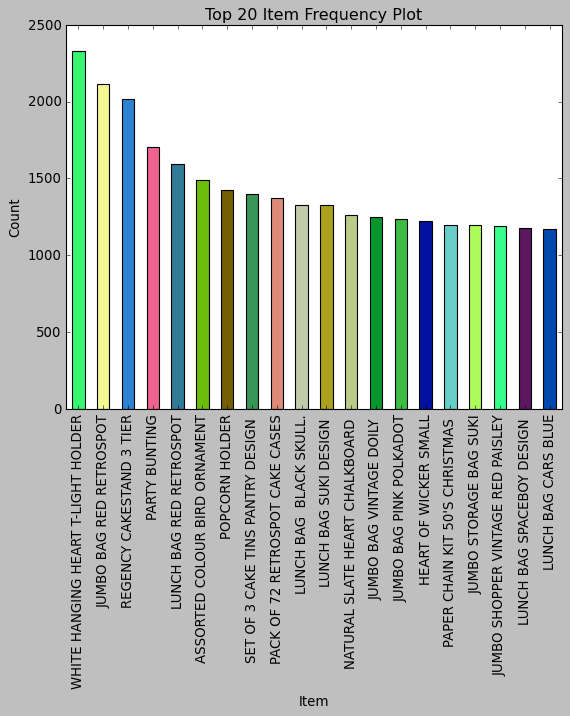

In [174]:
# %matplotlib inline
# plt.style.use('classic')
# plt.title('Top 20 Item Frequency Plot')
# plt.xlabel('Item')
# plt.ylabel('Count')
# dataframe_truncated['Description'].value_counts()[:20].plot.bar(color = colors)

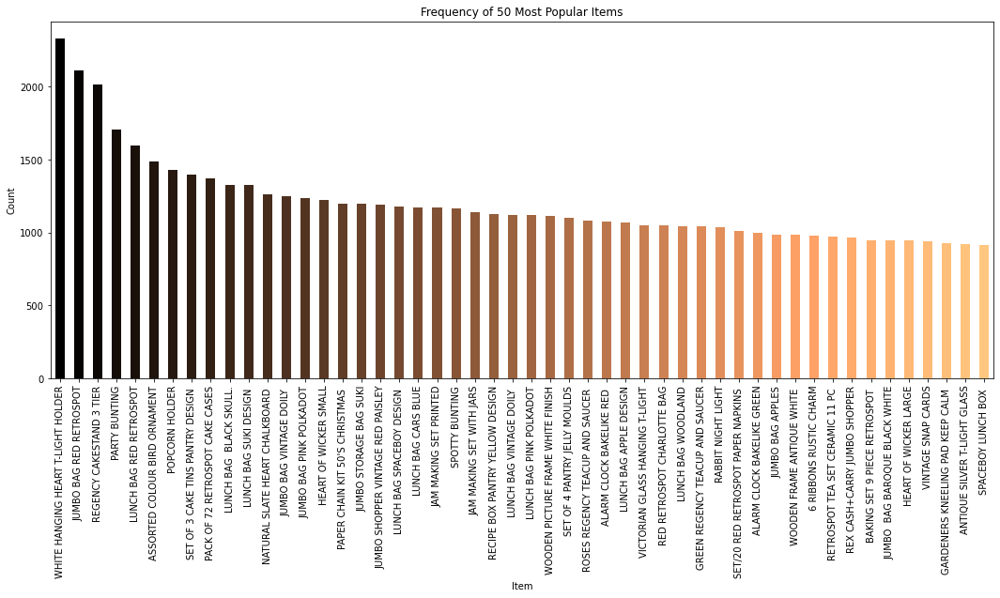

In [50]:
# looking at the frequency of most popular items 

plt.rcParams['figure.figsize'] = (18, 7)
color = plt.cm.copper(np.linspace(0, 1, 50))
dataframe_truncated['Description'].value_counts().head(50).plot.bar(color = color)
plt.title('Frequency of 50 Most Popular Items')
plt.xlabel('Item')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.show()

In [ ]:
# looking at the frequency of least popular items 

plt.rcParams['figure.figsize'] = (18, 7)
color = plt.cm.copper(np.linspace(0, 1, 50))
dataframe_truncated['Description'].value_counts().tail(50).plot.bar(color = color)
plt.title('Frequency of 50 Most Popular Items')
plt.xlabel('Item')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

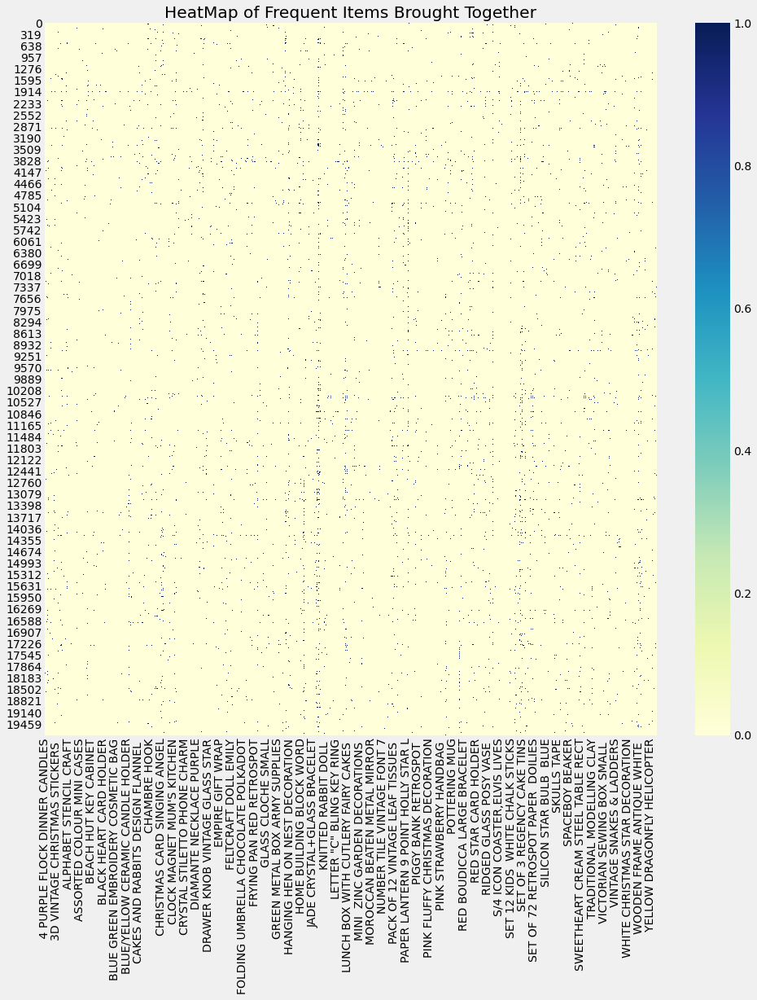

In [85]:
sns.heatmap(df, cmap='YlGnBu')
# plt.rcParams['figure.figsize'] = (15, 15)
plt.title('HeatMap of Frequent Items Brought Together')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

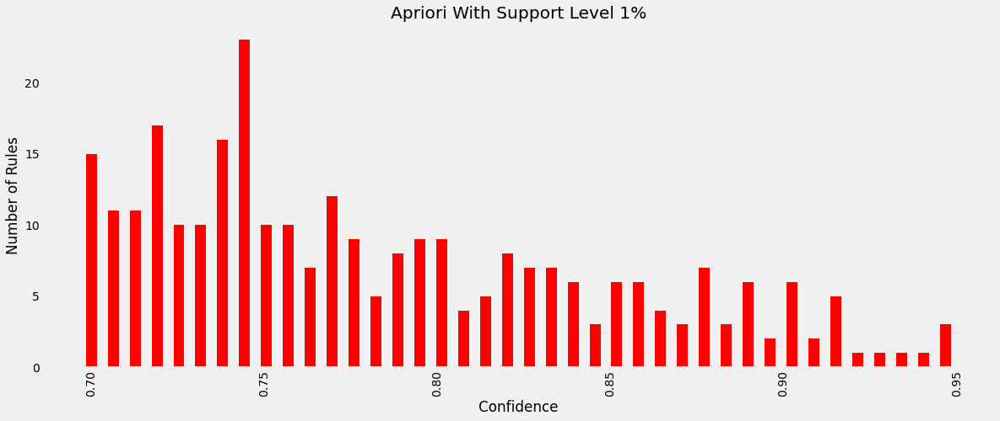

In [40]:
plt.rcParams['figure.figsize'] = (18, 7)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.hist(list(rules['confidence']), bins = 40, rwidth=0.5, align = 'left', color = 'red')
plt.title('Apriori With Support Level 1%')
plt.xlabel('Confidence')
plt.ylabel('Number of Rules')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

(array([26., 28., 20., 39., 20., 19., 14., 17., 13., 13., 14.,  9., 12.,
         7., 10.,  8.,  8.,  6.,  2.,  4.]),
 array([0.7       , 0.71265258, 0.72530516, 0.73795775, 0.75061033,
        0.76326291, 0.77591549, 0.78856808, 0.80122066, 0.81387324,
        0.82652582, 0.8391784 , 0.85183099, 0.86448357, 0.87713615,
        0.88978873, 0.90244131, 0.9150939 , 0.92774648, 0.94039906,
        0.95305164]),
 <BarContainer object of 20 artists>)

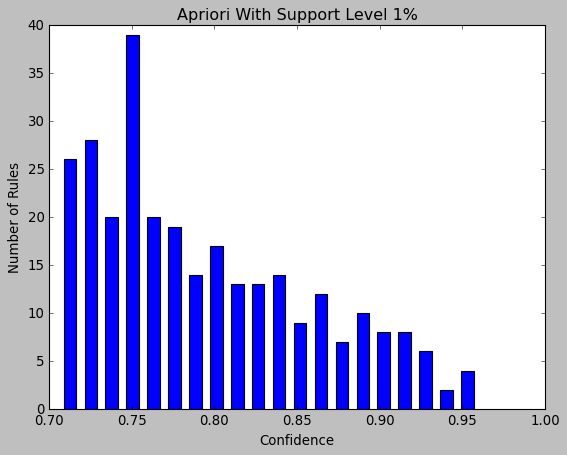

In [179]:
# %matplotlib inline
# plt.style.use('classic')
# plt.title('Apriori With Support Level 1%')
# plt.xlabel('Confidence')
# plt.ylabel('Number of Rules')
# plt.hist(list(rules['confidence']), bins = 20, rwidth=0.6, align = 'right')

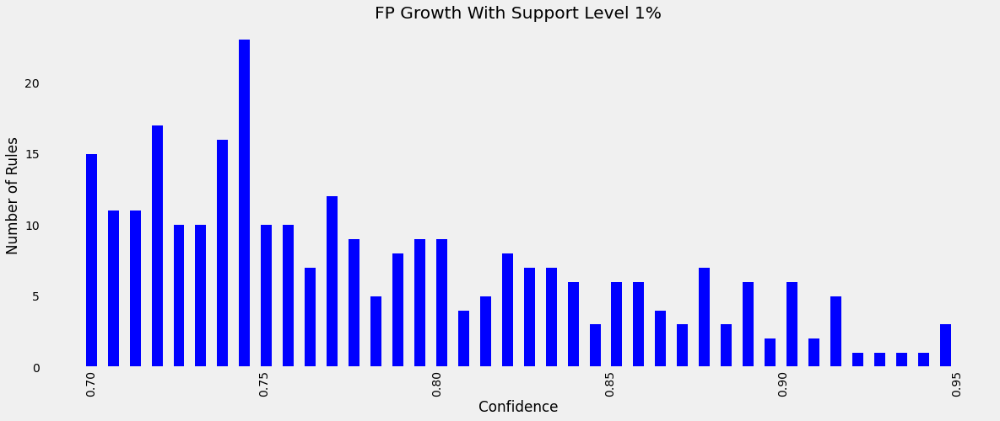

In [41]:
plt.rcParams['figure.figsize'] = (18, 7)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.hist(list(rules_fp['confidence']), bins = 40, rwidth=0.5, align = 'left', color = 'blue')
plt.title('FP Growth With Support Level 1%')
plt.xlabel('Confidence')
plt.ylabel('Number of Rules')
plt.xticks(rotation = 90)
plt.grid()
plt.show()

(array([26., 28., 20., 39., 20., 19., 14., 17., 13., 13., 14.,  9., 12.,
         7., 10.,  8.,  8.,  6.,  2.,  4.]),
 array([0.7       , 0.71265258, 0.72530516, 0.73795775, 0.75061033,
        0.76326291, 0.77591549, 0.78856808, 0.80122066, 0.81387324,
        0.82652582, 0.8391784 , 0.85183099, 0.86448357, 0.87713615,
        0.88978873, 0.90244131, 0.9150939 , 0.92774648, 0.94039906,
        0.95305164]),
 <BarContainer object of 20 artists>)

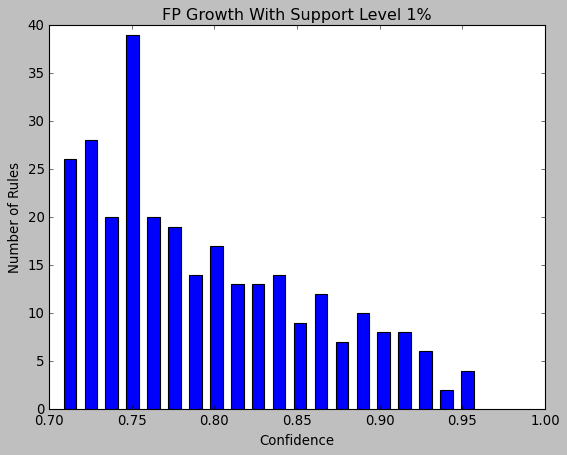

In [168]:
# %matplotlib inline
# plt.style.use('classic')
# plt.title('FP Growth With Support Level 1%')
# plt.xlabel('Confidence')
# plt.ylabel('Number of Rules')
# plt.hist(list(rules_fp['confidence']), bins = 20, rwidth=0.6, align = 'right')

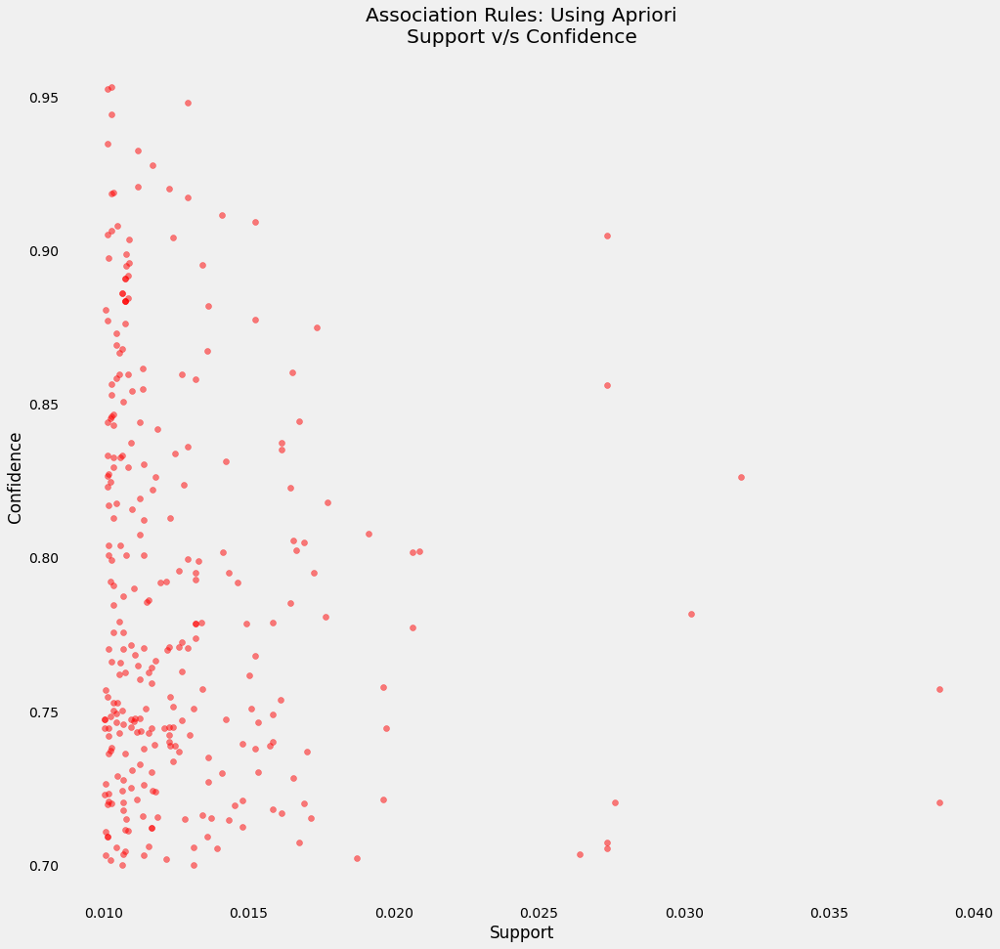

In [72]:
support_ap = rules['support'].to_numpy()
confidence_ap = rules['confidence'].to_numpy()

plt.rcParams['figure.figsize'] = (15, 15)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.title('Association Rules: Using Apriori\nSupport v/s Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.scatter(support_ap, confidence_ap, alpha=0.5, color = 'red')
# plt.xticks(rotation = 90)
plt.grid()
plt.show()

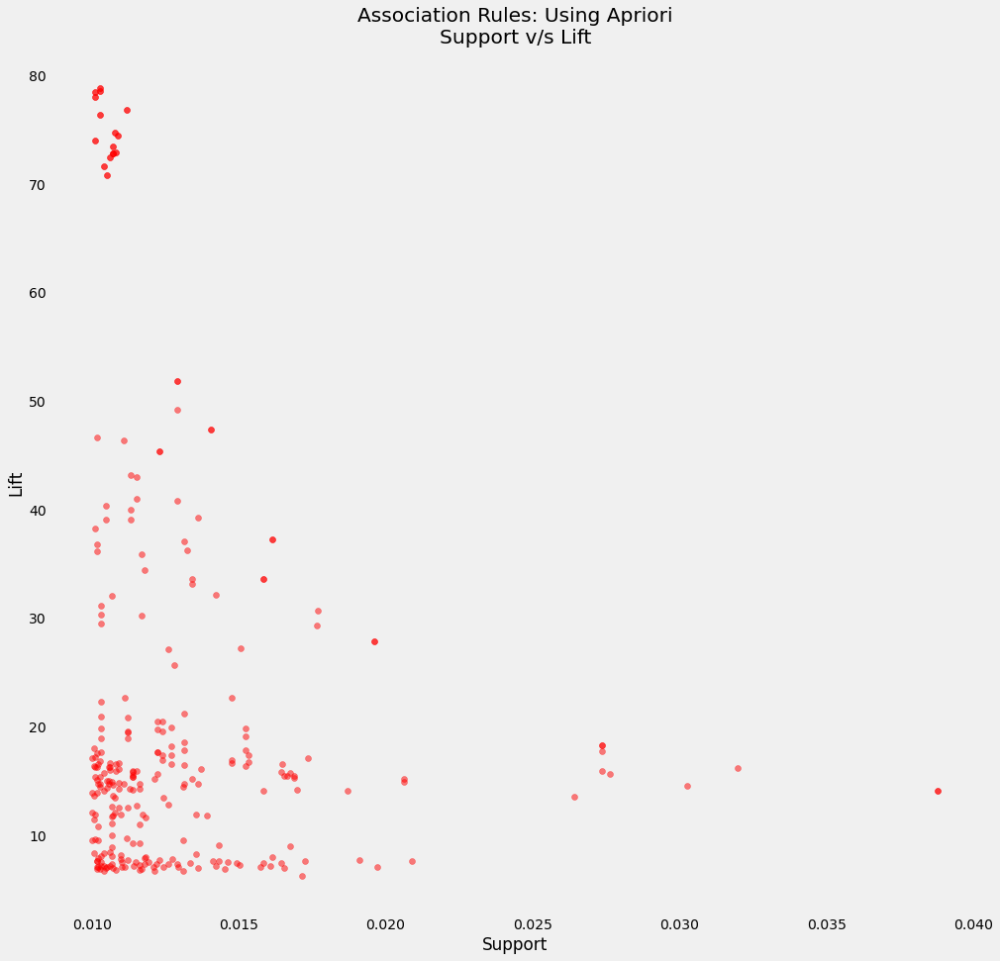

In [73]:
support_ap = rules['support'].to_numpy()
lift_ap = rules['lift'].to_numpy()

plt.rcParams['figure.figsize'] = (15, 15)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.title('Association Rules: Using Apriori\nSupport v/s Lift')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.scatter(support_ap, lift_ap, alpha=0.5, color = 'red')
# plt.xticks(rotation = 90)
plt.grid()
plt.show()

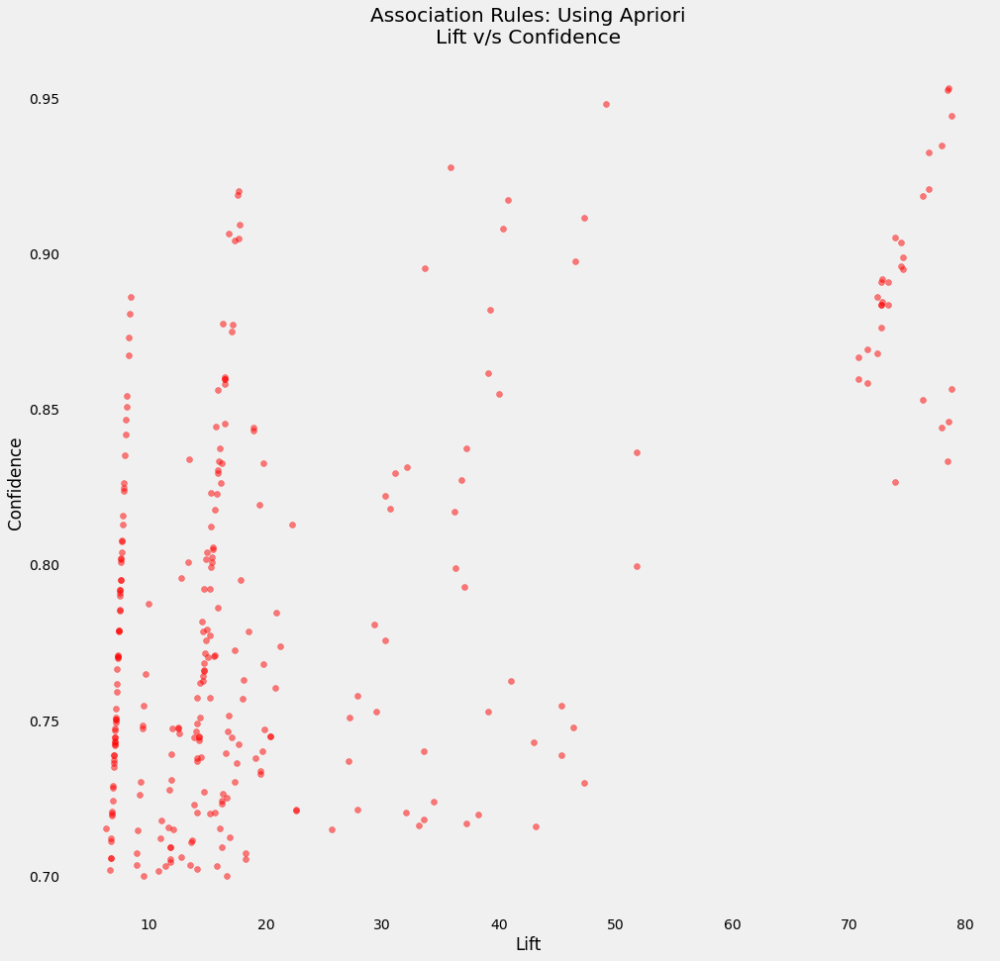

In [74]:
lift_ap = rules['lift'].to_numpy()
confidence_ap = rules['confidence'].to_numpy()

plt.rcParams['figure.figsize'] = (15, 15)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.title('Association Rules: Using Apriori\nLift v/s Confidence')
plt.xlabel('Lift')
plt.ylabel('Confidence')
plt.scatter(lift_ap, confidence_ap, alpha=0.5, color = 'red')
# plt.xticks(rotation = 90)
plt.grid()
plt.show()

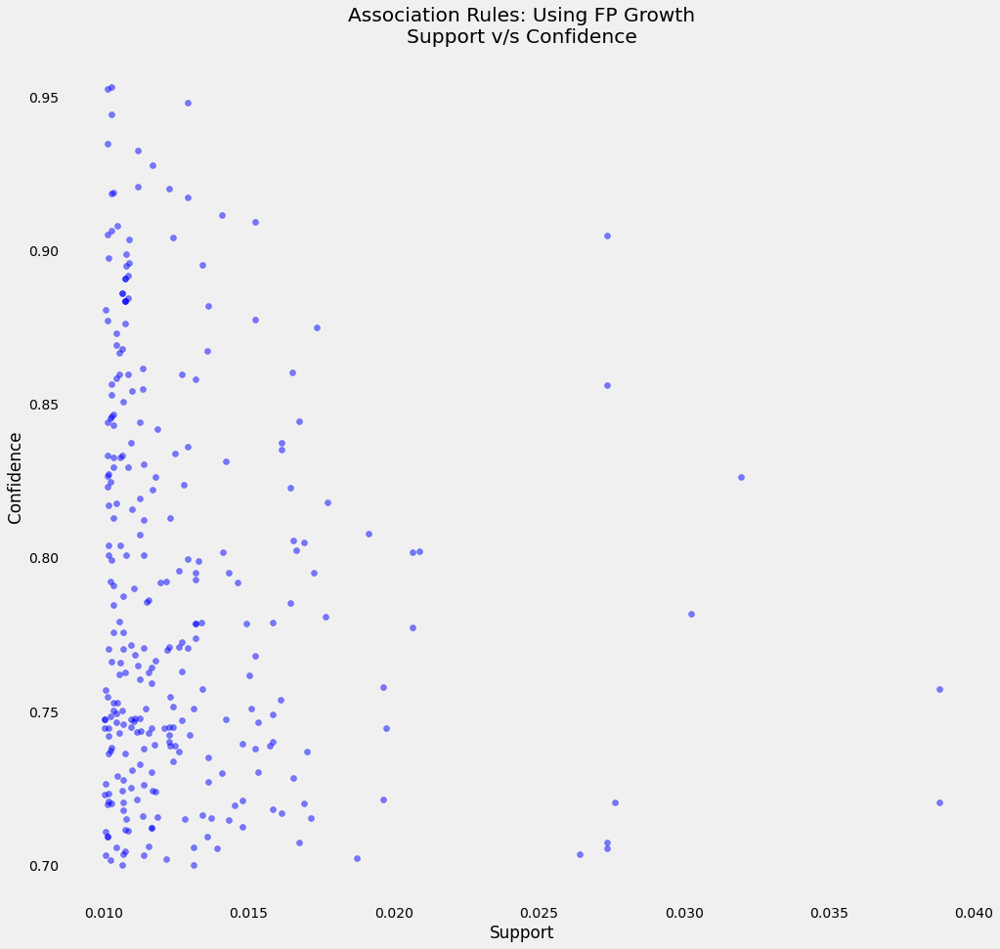

In [76]:
support_fp = rules_fp['support'].to_numpy()
confidence_fp = rules_fp['confidence'].to_numpy()

plt.rcParams['figure.figsize'] = (15, 15)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.title('Association Rules: Using FP Growth\nSupport v/s Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.scatter(support_fp, confidence_fp, alpha=0.5, color = 'blue')
# plt.xticks(rotation = 90)
plt.grid()
plt.show()

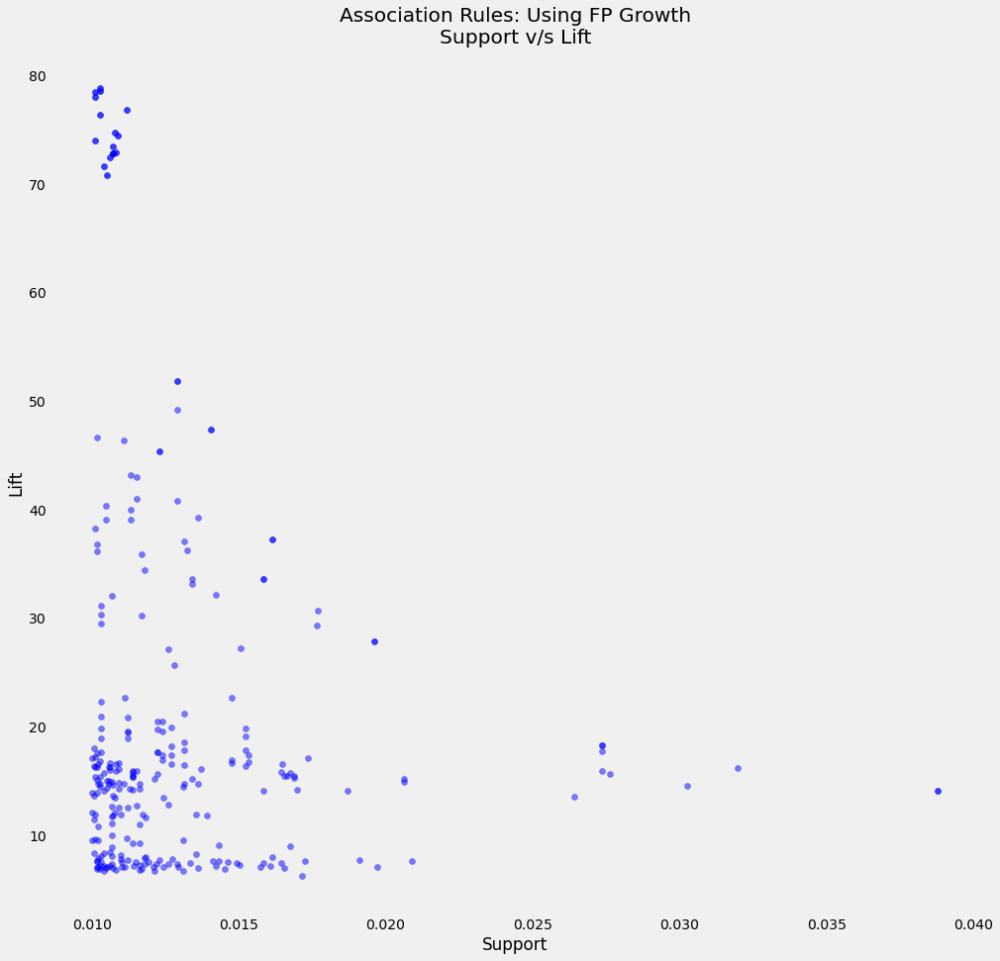

In [75]:
support_fp = rules_fp['support'].to_numpy()
lift_fp = rules_fp['lift'].to_numpy()

plt.rcParams['figure.figsize'] = (15, 15)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.title('Association Rules: Using FP Growth\nSupport v/s Lift')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.scatter(support_fp, lift_fp, alpha=0.5, color = 'blue')
# plt.xticks(rotation = 90)
plt.grid()
plt.show()

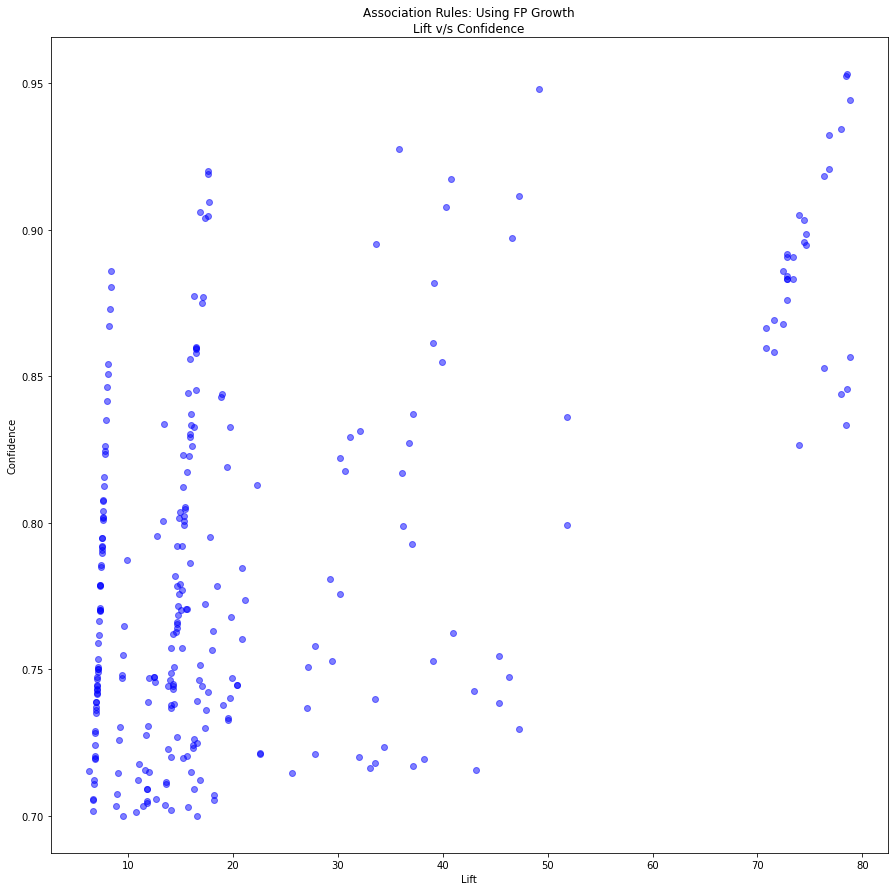

In [51]:
lift_fp = rules_fp['lift'].to_numpy()
confidence_fp = rules_fp['confidence'].to_numpy()

plt.rcParams['figure.figsize'] = (15, 15)
# color = plt.cm.copper(np.linspace(0, 1, 40))
plt.title('Association Rules: Using FP Growth\nLift v/s Confidence')
plt.xlabel('Lift')
plt.ylabel('Confidence')
plt.scatter(lift_fp, confidence_fp, alpha=0.5, color = 'blue')
# plt.xticks(rotation = 90)
plt.show()

In [105]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(PAINTED METAL PEARS ASSORTED),(ASSORTED COLOUR BIRD ORNAMENT),0.018712,0.073585,0.013099,0.700000,9.512784,0.011722,3.088049
1,(BAKING SET SPACEBOY DESIGN),(BAKING SET 9 PIECE RETROSPOT ),0.023466,0.047236,0.016892,0.719828,15.238920,0.015783,3.400634
2,(KITCHEN METAL SIGN),(BATHROOM METAL SIGN),0.015425,0.031912,0.011126,0.721311,22.602998,0.010634,3.473727
3,(TOILET METAL SIGN),(BATHROOM METAL SIGN),0.020482,0.031912,0.014768,0.720988,22.592851,0.014114,3.469695
4,(CANDLEHOLDER PINK HANGING HEART),(WHITE HANGING HEART T-LIGHT HOLDER),0.023972,0.114550,0.017145,0.715190,6.243466,0.014399,3.108913
...,...,...,...,...,...,...,...,...,...
284,"(CHARLOTTE BAG SUKI DESIGN, CHARLOTTE BAG PINK...",(WOODLAND CHARLOTTE BAG),0.012391,0.042128,0.010317,0.832653,19.764765,0.009795,5.723868
285,"(CHARLOTTE BAG SUKI DESIGN, STRAWBERRY CHARLOT...",(CHARLOTTE BAG PINK POLKADOT),0.013149,0.037526,0.010317,0.784615,20.908625,0.009824,4.468630
286,"(STRAWBERRY CHARLOTTE BAG, CHARLOTTE BAG PINK ...",(CHARLOTTE BAG SUKI DESIGN),0.012239,0.044606,0.010317,0.842975,18.898128,0.009771,6.084349
287,"(CHARLOTTE BAG SUKI DESIGN, CHARLOTTE BAG PINK...","(WOODLAND CHARLOTTE BAG, RED RETROSPOT CHARLOT...",0.013706,0.025540,0.010317,0.752768,29.474203,0.009967,3.941473


In [106]:
def rules_to_coordinates(rules):
    rules['antecedent'] = rules['antecedents'].apply(lambda antecedent: list(antecedent)[0])
    rules['consequent'] = rules['consequents'].apply(lambda consequent: list(consequent)[0])
    rules['rule'] = rules.index
    return rules[['antecedent','consequent','rule']]

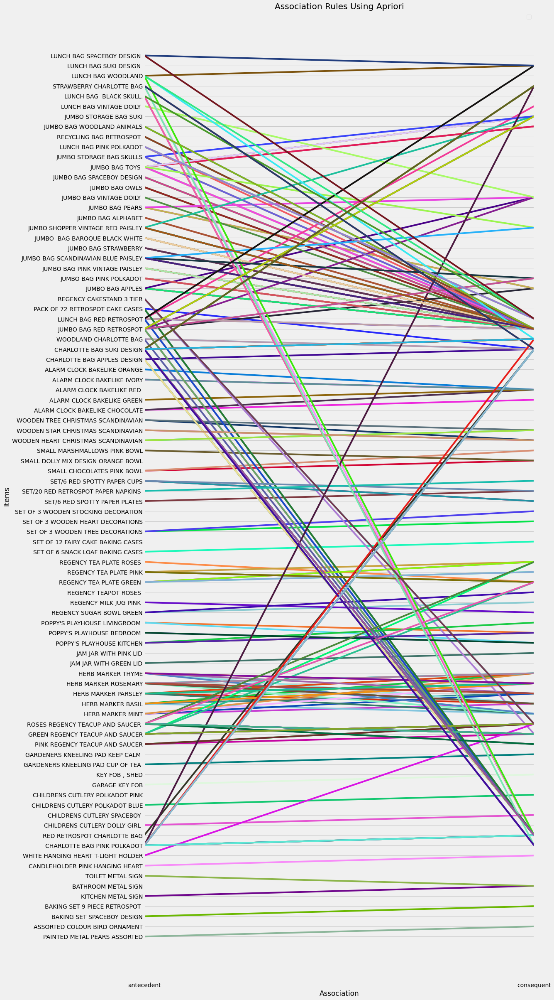

In [115]:
from pandas.plotting import parallel_coordinates

# Convert rules into coordinates suitable for use in a parallel coordinates plot
coords = rules_to_coordinates(rules)

# Generate parallel coordinates plot
plt.figure(figsize=(15,40))
plt.title('Association Rules Using Apriori')
plt.xlabel('Association')
plt.ylabel('Items')
parallel_coordinates(coords, 'rule')
plt.legend([])
plt.grid(True)
plt.show()

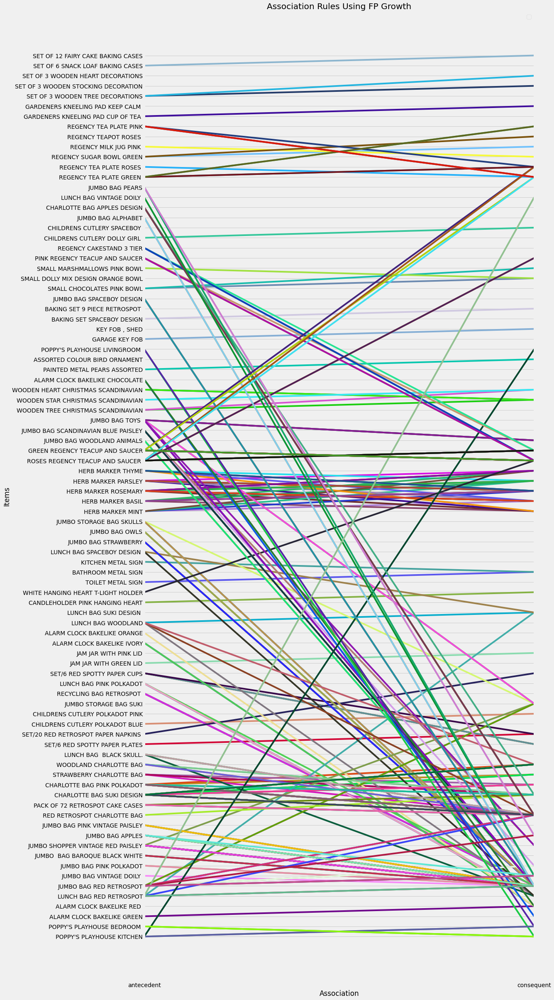

In [116]:
# Convert rules into coordinates suitable for use in a parallel coordinates plot
coords = rules_to_coordinates(rules_fp)

# Generate parallel coordinates plot
plt.figure(figsize=(15,40))
plt.title('Association Rules Using FP Growth')
plt.xlabel('Association')
plt.ylabel('Items')
parallel_coordinates(coords, 'rule')
plt.legend([])
plt.grid(True)
plt.show()